In [ ]:
from jcs_sar_augmentation_edit import *
from wavelet import *
from time import *

In [ ]:
def make_balanced_data(tensor_data, tensor_label, n_per_class=100, random_seed = 1234):
  indx_bal = []
  for j in range(5):
    random.seed(random_seed)
    t_indx = torch.nonzero(tensor_label==j).flatten()
    t_indx = [t_indx[i].item() for i in range(t_indx.shape[0])]
    t_indx100 = random.sample(t_indx, k=n_per_class)
    indx_bal += t_indx100
  
  return tensor_data[indx_bal], tensor_label[indx_bal]

In [ ]:
def confusion_matrix(y_pred, y_test, num_class=5):
    cf = np.zeros((num_class,num_class),int)
    n = y_test.shape[0]
    for i in range(n):
        true_class = y_test[i].item()
        pred_class = y_pred[i].item()
        cf[true_class,pred_class] += 1
    cf = pd.DataFrame(cf)
    cf.columns = ['SLICY', 'ZSU_23_4', 'T62', '2S1', 'BRDM_2']
    cf.rename(index={0:'SLICY', 1:'ZSU_23_4', 2:'T62', 3:'2S1', 4:'BRDM_2'}, inplace=True)
    
    return cf

In [ ]:
def geom_aug(tensor_data, tensor_label):
    # tensor_data, tensor_label을 입력받고 aug된 data만 return하는 함수.
    # vflip, hflip, center_crop, rotate, add_noise, affine 총 6가지의 종류의 기하적 증강 실시.
    
    tensor_temp_data = tensor_data.clone()
    tensor_temp_label = tensor_label.clone()

    vflip_data, vflip_label = geom_augmentation(tensor_temp_data, tensor_temp_label,
                                                    vflip=True)

    hflip_data, hflip_label = geom_augmentation(tensor_temp_data, tensor_temp_label,
                                                        hflip=True)

    c_crop_data, c_crop_label = geom_augmentation(tensor_temp_data, tensor_temp_label, 
                                                         resize_center_crop=(48,48))

    ang_vec = np.arange(-20,25,20)
    ang_vec = ang_vec[ang_vec!=0]
    rotate_data, rotate_label = geom_augmentation(tensor_temp_data, tensor_temp_label,
                                                           rotate=ang_vec)

    param_dict = {'dist':'unif', 'param':[0, 0.1]}
    add_noise_data, add_noise_label = geom_augmentation(tensor_temp_data,
                                                      tensor_temp_label, add_noise=param_dict)

    param_dict = {'angle':30, 'translate':[5, 10], 'scale':1.2,
                     'shear':(0,0), 'fill':0.0}
    affine_data, affine_label = geom_augmentation(tensor_temp_data, tensor_temp_label,
                                                           affine=param_dict)
    
    aug_dat = torch.cat([vflip_data, hflip_data, c_crop_data,
                                 rotate_data, add_noise_data, affine_data])
    aug_lbl = torch.cat([vflip_label, hflip_label, c_crop_label,
                                 rotate_label, add_noise_label, affine_label])

    aug_dat = aug_dat.type(torch.float32)
    aug_lbl = aug_lbl.type(torch.int64)
    
    return aug_dat, aug_lbl

In [ ]:
t1 = time()
f_info = make_file_info('MSTAR_TargetData',1,4)
f_info_SLICY = f_info[f_info['object']=='SLICY']
f_info_ZSU = f_info[f_info['object']=='ZSU_23_4']
f_info_BRDM2 = f_info[f_info['object']=='BRDM_2']
f_info_2S1 = f_info[f_info['object']=='2S1']
f_info_T62 = f_info[f_info['object']=='T62']

comb_file_info = pd.concat([f_info_SLICY, f_info_T62, f_info_ZSU,
                                 f_info_2S1, f_info_BRDM2],axis=0)

class_label=['SLICY', 'ZSU_23_4', 'T62', '2S1', 'BRDM_2']

sz = 64
img_dat, lbl_dat, deg_dat = data_loader_target(comb_file_info,
                                                      size_out = (sz,sz), scale='max')

t2 = time()
print("Time: ", t2 - t1)

Time:  885.1588690280914


In [ ]:
print('전체 데이터 개수 및 비율\n')
for i in range(5):
    no_label = (lbl_dat==i).sum().item()
    n = lbl_dat.shape[0]
    print(f'{class_label[i]}: {no_label} ({round(no_label/n*100,1)}%)')
print('\n합계: ', n)

전체 데이터 개수 및 비율

SLICY: 2539 (35.8%)
ZSU_23_4: 1401 (19.8%)
T62: 572 (8.1%)
2S1: 1164 (16.4%)
BRDM_2: 1415 (20.0%)

합계:  7091


In [ ]:
ratio = 0.7 #training이 0.7
tr_data, tr_lbl, ts_data, ts_lbl = train_test_split(img_dat, lbl_dat,
                                                      train_portion=ratio, seed=1234) #ts_data는 계속 고정

print('test 데이터 개수\n')
for i in range(5):
    print(class_label[i],': ',(ts_lbl==i).sum().item())
print('\n합계: ', ts_data.shape[0])

test 데이터 개수

SLICY :  758
ZSU_23_4 :  432
T62 :  174
2S1 :  347
BRDM_2 :  416

합계:  2127


In [ ]:
tr_data100, tr_lbl100 = make_balanced_data(tr_data, tr_lbl, n_per_class=100)
print(tr_data100.shape)
print(tr_lbl100.shape)

tr_data200, tr_lbl200 = make_balanced_data(tr_data, tr_lbl, n_per_class=200)
print(tr_data200.shape)
print(tr_lbl200.shape)

tr_data300, tr_lbl300 = make_balanced_data(tr_data, tr_lbl, n_per_class=300)
print(tr_data300.shape)
print(tr_lbl300.shape)

torch.Size([500, 1, 64, 64])
torch.Size([500])
torch.Size([1000, 1, 64, 64])
torch.Size([1000])
torch.Size([1500, 1, 64, 64])
torch.Size([1500])


## class 별 200장

### 1. 증강 전

In [ ]:
n_per_class = 200

In [ ]:
os.makedirs('./model_save' + str(n_per_class))

In [ ]:
# Classification without data augmentation
set_seed = 1234
random.seed(set_seed)
np.random.seed(set_seed)
torch.manual_seed(set_seed)
model_fit, ep_loss_fit, ep_acc_fit, ep_prd_list_fit, ep_y_list_fit, ep_loss_hist_fit = train_model(tr_data200, tr_lbl200, batch_size=48,
                                                                        n_epoch=5, lr_rate=0.0002, momentum=0.9, shuffle=False)

Epoch 1
-------------------------------
loss: 1.612808  [    0/ 1000]
 Training Error: 
 Accuracy: 22.6%, Avg loss: 1.607465 

Epoch 2
-------------------------------
loss: 1.589593  [    0/ 1000]
 Training Error: 
 Accuracy: 36.0%, Avg loss: 1.563990 

Epoch 3
-------------------------------
loss: 1.558330  [    0/ 1000]
 Training Error: 
 Accuracy: 40.3%, Avg loss: 1.486481 

Epoch 4
-------------------------------
loss: 1.440556  [    0/ 1000]
 Training Error: 
 Accuracy: 43.6%, Avg loss: 1.415145 

Epoch 5
-------------------------------
loss: 1.440262  [    0/ 1000]
 Training Error: 
 Accuracy: 42.5%, Avg loss: 1.364177 

Done!


In [ ]:
torch.save(model_fit.state_dict(),
             './model_save' + str(n_per_class) + '/clf_without_augmnt_'+str(n_per_class)+'.pkl')

model_test = cnn_clf_net(sz, 1, 5)
model_test.load_state_dict(torch.load(
              './model_save' + str(n_per_class) + '/clf_without_augmnt_'+str(n_per_class)+'.pkl'))
model_test.to('cuda')
pred_test_nag, y_test_nag, loss_test_nag, acc_test_nag = test_model(model_test, ts_data, ts_lbl, batch_size=48)

 Test Error: 
 Accuracy: 59.6%, Avg loss: 1.189856 



In [ ]:
confusion_matrix(pred_test_nag, y_test_nag)

,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,751,0,0,0,7
ZSU_23_4,212,73,0,85,62
T62,91,45,0,26,12
2S1,33,36,0,126,152
BRDM_2,35,20,0,43,318


### 2. 이미지 조작 증강

In [ ]:
# Geometric Augmentation
only_aug_dat, only_aug_lbl = geom_aug(tr_data200, tr_lbl200)

tr_aug_dat = torch.cat([tr_data200, only_aug_dat])
tr_aug_lbl = torch.cat([tr_lbl200, only_aug_lbl])

tr_aug_dat = tr_aug_dat.type(torch.float32)
tr_aug_lbl = tr_aug_lbl.type(torch.int64)

In [ ]:
os.makedirs('./img_out'+str(n_per_class))
geom_img_save_path = os.path.join('./img_out'+str(n_per_class), 'img_out_geom'+str(n_per_class)+'/')
os.makedirs(geom_img_save_path) #img_out200/img_out_geom200

export_images(geom_img_save_path,'mstar_aug', only_aug_dat, only_aug_lbl, class_label)

In [ ]:
print('train200: 이미지 조작 후 데이터 개수\n')
for i in range(5):
    print(class_label[i],': ',(tr_aug_lbl==i).sum().item())
print('\n합계: ', tr_aug_dat.shape[0])

train200: 이미지 조작 후 데이터 개수

SLICY :  1600
ZSU_23_4 :  1600
T62 :  1600
2S1 :  1600
BRDM_2 :  1600

합계:  8000


In [ ]:
# Classification with geometric augmentation
set_seed = 1234
random.seed(set_seed)
np.random.seed(set_seed)
torch.manual_seed(set_seed)
model_aug_fit, ep_loss_aug_fit, ep_acc_aug_fit, ep_prd_list_aug_fit, ep_y_list_aug_fit, ep_loss_hist_aug_fit = train_model(tr_aug_dat, tr_aug_lbl,
                                                                                              batch_size=48, n_epoch=5,
                                                                                              lr_rate=0.0002, momentum=0.9,
                                                                                              shuffle=False)

torch.save(model_aug_fit.state_dict(),
             './model_save' + str(n_per_class)+'/clf_geom_augmnt_'+str(n_per_class)+'.pkl')

model_geom_test = cnn_clf_net(sz, 1, 5)
model_geom_test.load_state_dict(torch.load(
                 './model_save' + str(n_per_class)+'/clf_geom_augmnt_'+str(n_per_class)+'.pkl'))
model_geom_test.to('cuda')
pred_aug_test, y_aug_test, loss_aug_test, acc_aug_test = test_model(model_geom_test, ts_data, ts_lbl, batch_size=48)

Epoch 1
-------------------------------
loss: 1.612459  [    0/ 8000]
loss: 1.549552  [ 2400/ 8000]
loss: 1.310273  [ 4800/ 8000]
loss: 1.187440  [ 7200/ 8000]
 Training Error: 
 Accuracy: 37.8%, Avg loss: 1.449577 

Epoch 2
-------------------------------
loss: 1.362391  [    0/ 8000]
loss: 1.156392  [ 2400/ 8000]
loss: 1.148710  [ 4800/ 8000]
loss: 1.211876  [ 7200/ 8000]
 Training Error: 
 Accuracy: 52.3%, Avg loss: 1.190464 

Epoch 3
-------------------------------
loss: 1.084977  [    0/ 8000]
loss: 0.882880  [ 2400/ 8000]
loss: 1.241808  [ 4800/ 8000]
loss: 0.783994  [ 7200/ 8000]
 Training Error: 
 Accuracy: 59.9%, Avg loss: 1.027209 

Epoch 4
-------------------------------
loss: 0.933317  [    0/ 8000]
loss: 1.031589  [ 2400/ 8000]
loss: 0.868764  [ 4800/ 8000]
loss: 0.922776  [ 7200/ 8000]
 Training Error: 
 Accuracy: 61.9%, Avg loss: 0.945831 

Epoch 5
-------------------------------
loss: 0.770935  [    0/ 8000]
loss: 0.825328  [ 2400/ 8000]
loss: 0.616914  [ 4800/ 8000]
lo

In [ ]:
confusion_matrix(pred_aug_test, y_aug_test)

,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,757,0,0,0,1
ZSU_23_4,27,122,139,65,79
T62,6,16,104,0,48
2S1,1,8,40,74,224
BRDM_2,14,6,13,0,383


### 3. DCGAN 증강

In [ ]:
# DCGAN Model
num_nz = 512
num_node = 64
lr = 0.0002
n_epochs = 5000 #기존 10000 -> 5000
batch_size = 128
rec_step = 20

#### 1) class_label == 0, SLICY

In [ ]:
os.makedirs('./model_gan'+str(n_per_class))

In [ ]:
# class_label == 0 
t_indx = torch.nonzero(tr_lbl200==0).flatten()
gan_tr_data = 2*tr_data200[t_indx]-1
gan_tr_lbl = tr_lbl200[t_indx]

In [ ]:
t1 = time()
netG_fit0, netD_fit0, G_losses0, D_losses0, fake_img0, fake_img_list0 = train_gan_model(gan_tr_data, gan_tr_lbl, num_nz=num_nz, num_node=num_node,
                                                                                        out_col = 1, num_epochs=n_epochs, batch_size=batch_size,
                                                                                        lr_rate=lr, rec_step=rec_step)
t2 = time()
print("Time: ", t2 - t1)

torch.save(fake_img_list0,'./model_gan'+str(n_per_class)+'/final_fake_gen_list_label_0_'+str(n_per_class)+'.pkl')
fake_img0_cpu = torch.load('./model_gan'+str(n_per_class)+'/final_fake_gen_list_label_0_'+str(n_per_class)+'.pkl')

Starting Training Loop...
[0/5000][0/2]	Loss_D: 1.3873	Loss_G: 1.3764	D(x): 0.4903	D(G(z)): 0.4906 / 0.4850
[10/5000][0/2]	Loss_D: 0.2129	Loss_G: 0.1750	D(x): 0.8992	D(G(z)): 0.1008 / 0.0660
[20/5000][0/2]	Loss_D: 0.0282	Loss_G: 0.0240	D(x): 0.9855	D(G(z)): 0.0135 / 0.0094
[30/5000][0/2]	Loss_D: 0.0136	Loss_G: 0.0081	D(x): 0.9947	D(G(z)): 0.0082 / 0.0029
[40/5000][0/2]	Loss_D: 0.3874	Loss_G: 0.1842	D(x): 0.8762	D(G(z)): 0.1865 / 0.0402
[50/5000][0/2]	Loss_D: 1.8804	Loss_G: 0.2648	D(x): 0.9520	D(G(z)): 0.7589 / 0.1903
[60/5000][0/2]	Loss_D: 0.8899	Loss_G: 2.4136	D(x): 0.4438	D(G(z)): 0.0289 / 0.7552
[70/5000][0/2]	Loss_D: 2.4968	Loss_G: 2.7407	D(x): 0.0993	D(G(z)): 0.0407 / 0.2475
[80/5000][0/2]	Loss_D: 0.4206	Loss_G: 0.2559	D(x): 0.8670	D(G(z)): 0.2336 / 0.0988
[90/5000][0/2]	Loss_D: 0.6989	Loss_G: 0.6701	D(x): 0.6624	D(G(z)): 0.2186 / 0.1962
[100/5000][0/2]	Loss_D: 1.1870	Loss_G: 0.2797	D(x): 0.8184	D(G(z)): 0.5942 / 0.0522
[110/5000][0/2]	Loss_D: 2.4216	Loss_G: 2.4331	D(x): 0.1330	D(

[980/5000][0/2]	Loss_D: 0.0428	Loss_G: 0.0120	D(x): 0.9906	D(G(z)): 0.0312 / 0.0024
[990/5000][0/2]	Loss_D: 0.0182	Loss_G: 0.0111	D(x): 0.9936	D(G(z)): 0.0114 / 0.0045
[1000/5000][0/2]	Loss_D: 0.0555	Loss_G: 0.0323	D(x): 0.9750	D(G(z)): 0.0258 / 0.0052
[1010/5000][0/2]	Loss_D: 0.0352	Loss_G: 0.0224	D(x): 0.9817	D(G(z)): 0.0158 / 0.0036
[1020/5000][0/2]	Loss_D: 0.3883	Loss_G: 0.4053	D(x): 0.7949	D(G(z)): 0.0018 / 0.0181
[1030/5000][0/2]	Loss_D: 0.0293	Loss_G: 0.0161	D(x): 0.9869	D(G(z)): 0.0156 / 0.0027
[1040/5000][0/2]	Loss_D: 0.0242	Loss_G: 0.0210	D(x): 0.9837	D(G(z)): 0.0072 / 0.0041
[1050/5000][0/2]	Loss_D: 0.1224	Loss_G: 0.0124	D(x): 0.9884	D(G(z)): 0.0864 / 0.0006
[1060/5000][0/2]	Loss_D: 0.0556	Loss_G: 0.0369	D(x): 0.9798	D(G(z)): 0.0324 / 0.0145
[1070/5000][0/2]	Loss_D: 0.0569	Loss_G: 0.0145	D(x): 0.9893	D(G(z)): 0.0435 / 0.0035
[1080/5000][0/2]	Loss_D: 0.1407	Loss_G: 0.0024	D(x): 0.9985	D(G(z)): 0.1204 / 0.0009
[1090/5000][0/2]	Loss_D: 0.0163	Loss_G: 0.0111	D(x): 0.9944	D(G(z))

[1950/5000][0/2]	Loss_D: 1.3677	Loss_G: 1.3889	D(x): 0.4238	D(G(z)): 0.3942 / 0.4069
[1960/5000][0/2]	Loss_D: 1.2444	Loss_G: 1.2291	D(x): 0.4988	D(G(z)): 0.4188 / 0.4097
[1970/5000][0/2]	Loss_D: 1.0471	Loss_G: 0.9599	D(x): 0.5601	D(G(z)): 0.3597 / 0.2999
[1980/5000][0/2]	Loss_D: 0.9780	Loss_G: 0.8201	D(x): 0.5886	D(G(z)): 0.3421 / 0.2338
[1990/5000][0/2]	Loss_D: 0.7235	Loss_G: 0.4232	D(x): 0.7784	D(G(z)): 0.3710 / 0.1526
[2000/5000][0/2]	Loss_D: 0.4597	Loss_G: 0.3467	D(x): 0.8218	D(G(z)): 0.2079 / 0.1179
[2010/5000][0/2]	Loss_D: 0.5518	Loss_G: 0.4389	D(x): 0.7446	D(G(z)): 0.2116 / 0.1214
[2020/5000][0/2]	Loss_D: 0.1435	Loss_G: 0.0486	D(x): 0.9693	D(G(z)): 0.0975 / 0.0094
[2030/5000][0/2]	Loss_D: 0.0840	Loss_G: 0.0338	D(x): 0.9873	D(G(z)): 0.0677 / 0.0201
[2040/5000][0/2]	Loss_D: 0.0349	Loss_G: 0.0113	D(x): 0.9970	D(G(z)): 0.0312 / 0.0082
[2050/5000][0/2]	Loss_D: 0.0344	Loss_G: 0.0106	D(x): 0.9973	D(G(z)): 0.0307 / 0.0078
[2060/5000][0/2]	Loss_D: 0.0920	Loss_G: 0.0411	D(x): 0.9782	D(G(z

[2920/5000][0/2]	Loss_D: 0.0174	Loss_G: 0.0144	D(x): 0.9950	D(G(z)): 0.0119 / 0.0090
[2930/5000][0/2]	Loss_D: 0.0290	Loss_G: 0.0274	D(x): 0.9897	D(G(z)): 0.0049 / 0.0033
[2940/5000][0/2]	Loss_D: 0.0832	Loss_G: 0.0834	D(x): 0.9834	D(G(z)): 0.0033 / 0.0035
[2950/5000][0/2]	Loss_D: 0.0218	Loss_G: 0.0196	D(x): 0.9841	D(G(z)): 0.0053 / 0.0032
[2960/5000][0/2]	Loss_D: 0.0718	Loss_G: 0.0709	D(x): 0.9830	D(G(z)): 0.0040 / 0.0031
[2970/5000][0/2]	Loss_D: 0.0638	Loss_G: 0.0642	D(x): 0.9491	D(G(z)): 0.0017 / 0.0020
[2980/5000][0/2]	Loss_D: 0.0182	Loss_G: 0.0125	D(x): 0.9909	D(G(z)): 0.0088 / 0.0032
[2990/5000][0/2]	Loss_D: 0.0219	Loss_G: 0.0076	D(x): 0.9952	D(G(z)): 0.0163 / 0.0026
[3000/5000][0/2]	Loss_D: 0.0145	Loss_G: 0.0110	D(x): 0.9916	D(G(z)): 0.0057 / 0.0023
[3010/5000][0/2]	Loss_D: 0.0106	Loss_G: 0.0087	D(x): 0.9967	D(G(z)): 0.0070 / 0.0052
[3020/5000][0/2]	Loss_D: 0.0532	Loss_G: 0.0106	D(x): 0.9907	D(G(z)): 0.0406 / 0.0011
[3030/5000][0/2]	Loss_D: 0.0199	Loss_G: 0.0095	D(x): 0.9959	D(G(z

[3890/5000][0/2]	Loss_D: 0.0054	Loss_G: 0.0027	D(x): 0.9985	D(G(z)): 0.0039 / 0.0012
[3900/5000][0/2]	Loss_D: 0.0012	Loss_G: 0.0010	D(x): 0.9994	D(G(z)): 0.0007 / 0.0004
[3910/5000][0/2]	Loss_D: 0.0046	Loss_G: 0.0021	D(x): 0.9992	D(G(z)): 0.0037 / 0.0013
[3920/5000][0/2]	Loss_D: 2.2774	Loss_G: 3.5441	D(x): 0.1313	D(G(z)): 0.0316 / 0.6733
[3930/5000][0/2]	Loss_D: 0.7049	Loss_G: 0.5817	D(x): 0.6521	D(G(z)): 0.2292 / 0.1286
[3940/5000][0/2]	Loss_D: 0.4133	Loss_G: 0.0666	D(x): 0.9799	D(G(z)): 0.3133 / 0.0442
[3950/5000][0/2]	Loss_D: 0.1072	Loss_G: 0.0700	D(x): 0.9611	D(G(z)): 0.0585 / 0.0234
[3960/5000][0/2]	Loss_D: 0.0534	Loss_G: 0.0196	D(x): 0.9926	D(G(z)): 0.0441 / 0.0120
[3970/5000][0/2]	Loss_D: 0.0548	Loss_G: 0.0207	D(x): 0.9927	D(G(z)): 0.0445 / 0.0123
[3980/5000][0/2]	Loss_D: 0.0961	Loss_G: 0.0191	D(x): 0.9930	D(G(z)): 0.0804 / 0.0113
[3990/5000][0/2]	Loss_D: 0.0375	Loss_G: 0.0355	D(x): 0.9746	D(G(z)): 0.0089 / 0.0068
[4000/5000][0/2]	Loss_D: 0.0429	Loss_G: 0.0255	D(x): 0.9922	D(G(z

[4860/5000][0/2]	Loss_D: 0.0318	Loss_G: 0.0180	D(x): 0.9952	D(G(z)): 0.0257 / 0.0126
[4870/5000][0/2]	Loss_D: 0.0156	Loss_G: 0.0074	D(x): 0.9998	D(G(z)): 0.0151 / 0.0072
[4880/5000][0/2]	Loss_D: 0.0337	Loss_G: 0.0060	D(x): 0.9990	D(G(z)): 0.0306 / 0.0050
[4890/5000][0/2]	Loss_D: 0.0082	Loss_G: 0.0064	D(x): 0.9994	D(G(z)): 0.0075 / 0.0057
[4900/5000][0/2]	Loss_D: 0.0074	Loss_G: 0.0066	D(x): 0.9999	D(G(z)): 0.0072 / 0.0065
[4910/5000][0/2]	Loss_D: 0.0070	Loss_G: 0.0065	D(x): 0.9983	D(G(z)): 0.0053 / 0.0048
[4920/5000][0/2]	Loss_D: 0.0111	Loss_G: 0.0062	D(x): 1.0000	D(G(z)): 0.0108 / 0.0061
[4930/5000][0/2]	Loss_D: 0.0703	Loss_G: 0.0636	D(x): 0.9917	D(G(z)): 0.0108 / 0.0042
[4940/5000][0/2]	Loss_D: 0.0471	Loss_G: 0.0015	D(x): 0.9995	D(G(z)): 0.0381 / 0.0011
[4950/5000][0/2]	Loss_D: 0.0060	Loss_G: 0.0044	D(x): 0.9982	D(G(z)): 0.0042 / 0.0026
[4960/5000][0/2]	Loss_D: 0.0385	Loss_G: 0.0017	D(x): 0.9998	D(G(z)): 0.0313 / 0.0015
[4970/5000][0/2]	Loss_D: 0.0086	Loss_G: 0.0038	D(x): 0.9989	D(G(z

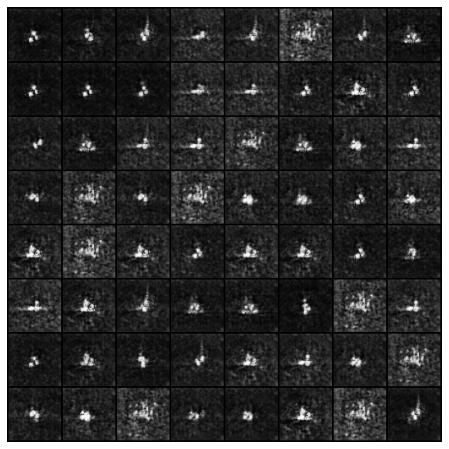

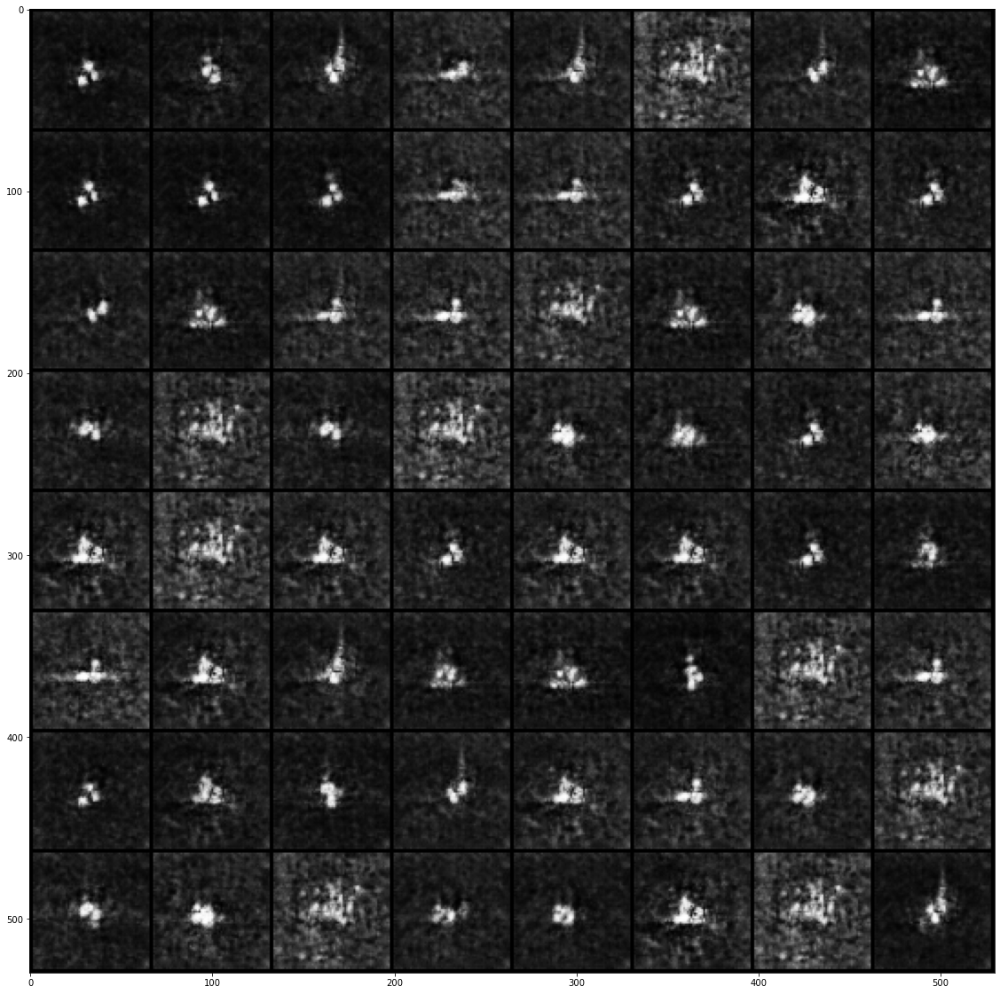

In [ ]:
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)]
         for i in fake_img0_cpu]
ani0 = animation.ArtistAnimation(fig, ims, interval=1000,
                                       repeat_delay=1000, blit=True)

plt.figure(figsize=(20,20))
plt.imshow(np.transpose(fake_img0_cpu[-1],(1,2,0)), animated=True)
plt.savefig('./model_gan'+str(n_per_class)+'/Final_GAN_epoch'+str(n_epochs)+'_SLICY.png',
              format="png")

f = r"./model_gan"+str(n_per_class)+"/JCS_Final_GAN_SLICY_learn.mp4" 
writermp4 = animation.FFMpegWriter(fps=5,extra_args=['-acodec', 'libfaac',
                                         '-vcodec', 'mpeg4'])
ani0.save(f, writer=writermp4)

#### 2) class_label == 1, ZSU_23_4

In [ ]:
t_indx = torch.nonzero(tr_lbl200==1).flatten()
gan_tr_data = 2*tr_data200[t_indx]-1
gan_tr_lbl = tr_lbl200[t_indx]

In [ ]:
t1 = time()
netG_fit1, netD_fit1, G_losses1, D_losses1, fake_img1, fake_img_list1 = train_gan_model(gan_tr_data, gan_tr_lbl, num_nz=num_nz, 
                                            num_node=num_node,out_col = 1, num_epochs=n_epochs, batch_size=batch_size,
                                            lr_rate=lr, rec_step=rec_step)
t2 = time()
print("Time: ", t2 - t1)

torch.save(fake_img_list1, './model_gan'+str(n_per_class)+'/final_fake_gen_list_label_1_'+str(n_per_class)+'.pkl')
fake_img1_cpu = torch.load('./model_gan'+str(n_per_class)+'/final_fake_gen_list_label_1_'+str(n_per_class)+'.pkl')

Starting Training Loop...
[0/5000][0/2]	Loss_D: 1.3874	Loss_G: 1.3745	D(x): 0.4924	D(G(z)): 0.4929 / 0.4862
[10/5000][0/2]	Loss_D: 0.2840	Loss_G: 0.2079	D(x): 0.8897	D(G(z)): 0.1511 / 0.0844
[20/5000][0/2]	Loss_D: 0.0285	Loss_G: 0.0247	D(x): 0.9850	D(G(z)): 0.0133 / 0.0095
[30/5000][0/2]	Loss_D: 0.0330	Loss_G: 0.0325	D(x): 0.9731	D(G(z)): 0.0053 / 0.0048
[40/5000][0/2]	Loss_D: 1.7435	Loss_G: 0.1294	D(x): 0.9946	D(G(z)): 0.5890 / 0.1040
[50/5000][0/2]	Loss_D: 0.6393	Loss_G: 0.1140	D(x): 0.9489	D(G(z)): 0.3952 / 0.0575
[60/5000][0/2]	Loss_D: 0.8016	Loss_G: 0.4867	D(x): 0.7915	D(G(z)): 0.3718 / 0.2035
[70/5000][0/2]	Loss_D: 0.9631	Loss_G: 0.1852	D(x): 0.9248	D(G(z)): 0.5487 / 0.0999
[80/5000][0/2]	Loss_D: 0.9711	Loss_G: 1.0926	D(x): 0.4758	D(G(z)): 0.1351 / 0.2330
[90/5000][0/2]	Loss_D: 0.9176	Loss_G: 0.4058	D(x): 0.7847	D(G(z)): 0.4652 / 0.1271
[100/5000][0/2]	Loss_D: 0.6267	Loss_G: 0.4893	D(x): 0.7046	D(G(z)): 0.1819 / 0.0636
[110/5000][0/2]	Loss_D: 0.6714	Loss_G: 0.3370	D(x): 0.7742	D(

[980/5000][0/2]	Loss_D: 0.0349	Loss_G: 0.0244	D(x): 0.9875	D(G(z)): 0.0216 / 0.0115
[990/5000][0/2]	Loss_D: 6.2407	Loss_G: 6.2468	D(x): 0.0704	D(G(z)): 0.0001 / 0.0061
[1000/5000][0/2]	Loss_D: 0.3565	Loss_G: 0.3587	D(x): 0.7661	D(G(z)): 0.0012 / 0.0034
[1010/5000][0/2]	Loss_D: 0.9976	Loss_G: 0.0011	D(x): 0.9990	D(G(z)): 0.5552 / 0.0001
[1020/5000][0/2]	Loss_D: 0.0327	Loss_G: 0.0288	D(x): 0.9769	D(G(z)): 0.0091 / 0.0052
[1030/5000][0/2]	Loss_D: 0.0392	Loss_G: 0.0217	D(x): 0.9853	D(G(z)): 0.0236 / 0.0068
[1040/5000][0/2]	Loss_D: 0.0215	Loss_G: 0.0156	D(x): 0.9914	D(G(z)): 0.0127 / 0.0069
[1050/5000][0/2]	Loss_D: 0.0419	Loss_G: 0.0296	D(x): 0.9849	D(G(z)): 0.0259 / 0.0140
[1060/5000][0/2]	Loss_D: 0.0826	Loss_G: 0.0837	D(x): 0.9380	D(G(z)): 0.0149 / 0.0159
[1070/5000][0/2]	Loss_D: 0.0353	Loss_G: 0.0368	D(x): 0.9705	D(G(z)): 0.0043 / 0.0058
[1080/5000][0/2]	Loss_D: 0.0809	Loss_G: 0.0856	D(x): 0.9336	D(G(z)): 0.0045 / 0.0092
[1090/5000][0/2]	Loss_D: 0.0197	Loss_G: 0.0109	D(x): 0.9946	D(G(z))

[1950/5000][0/2]	Loss_D: 0.0029	Loss_G: 0.0041	D(x): 0.9994	D(G(z)): 0.0023 / 0.0034
[1960/5000][0/2]	Loss_D: 0.0351	Loss_G: 0.0075	D(x): 0.9958	D(G(z)): 0.0298 / 0.0033
[1970/5000][0/2]	Loss_D: 0.0112	Loss_G: 0.0080	D(x): 0.9956	D(G(z)): 0.0066 / 0.0035
[1980/5000][0/2]	Loss_D: 0.0180	Loss_G: 0.0120	D(x): 0.9903	D(G(z)): 0.0078 / 0.0021
[1990/5000][0/2]	Loss_D: 0.0260	Loss_G: 0.0231	D(x): 0.9838	D(G(z)): 0.0094 / 0.0065
[2000/5000][0/2]	Loss_D: 0.0087	Loss_G: 0.0061	D(x): 0.9974	D(G(z)): 0.0061 / 0.0036
[2010/5000][0/2]	Loss_D: 0.0868	Loss_G: 0.0489	D(x): 0.9787	D(G(z)): 0.0480 / 0.0117
[2020/5000][0/2]	Loss_D: 0.0319	Loss_G: 0.0205	D(x): 0.9910	D(G(z)): 0.0223 / 0.0112
[2030/5000][0/2]	Loss_D: 0.0144	Loss_G: 0.0100	D(x): 0.9960	D(G(z)): 0.0104 / 0.0060
[2040/5000][0/2]	Loss_D: 0.0155	Loss_G: 0.0134	D(x): 0.9901	D(G(z)): 0.0053 / 0.0032
[2050/5000][0/2]	Loss_D: 0.2756	Loss_G: 0.2756	D(x): 0.9111	D(G(z)): 0.0001 / 0.0001
[2060/5000][0/2]	Loss_D: 0.2789	Loss_G: 0.2787	D(x): 0.9394	D(G(z

[2920/5000][0/2]	Loss_D: 0.0100	Loss_G: 0.0094	D(x): 0.9921	D(G(z)): 0.0021 / 0.0014
[2930/5000][0/2]	Loss_D: 0.0107	Loss_G: 0.0097	D(x): 0.9979	D(G(z)): 0.0085 / 0.0075
[2940/5000][0/2]	Loss_D: 0.0832	Loss_G: 0.0832	D(x): 0.9576	D(G(z)): 0.0011 / 0.0010
[2950/5000][0/2]	Loss_D: 0.0083	Loss_G: 0.0067	D(x): 0.9961	D(G(z)): 0.0044 / 0.0028
[2960/5000][0/2]	Loss_D: 0.0134	Loss_G: 0.0071	D(x): 0.9995	D(G(z)): 0.0127 / 0.0066
[2970/5000][0/2]	Loss_D: 0.0075	Loss_G: 0.0043	D(x): 0.9992	D(G(z)): 0.0066 / 0.0035
[2980/5000][0/2]	Loss_D: 9.4441	Loss_G: 0.0000	D(x): 1.0000	D(G(z)): 0.9949 / 0.0000
[2990/5000][0/2]	Loss_D: 0.0256	Loss_G: 0.0155	D(x): 0.9922	D(G(z)): 0.0164 / 0.0065
[3000/5000][0/2]	Loss_D: 0.0474	Loss_G: 0.0071	D(x): 0.9959	D(G(z)): 0.0405 / 0.0023
[3010/5000][0/2]	Loss_D: 0.2997	Loss_G: 0.2988	D(x): 0.9896	D(G(z)): 0.0053 / 0.0044
[3020/5000][0/2]	Loss_D: 0.0521	Loss_G: 0.0353	D(x): 0.9871	D(G(z)): 0.0361 / 0.0198
[3030/5000][0/2]	Loss_D: 0.0588	Loss_G: 0.0234	D(x): 0.9922	D(G(z

[3890/5000][0/2]	Loss_D: 0.0059	Loss_G: 0.0016	D(x): 0.9993	D(G(z)): 0.0051 / 0.0009
[3900/5000][0/2]	Loss_D: 0.0033	Loss_G: 0.0031	D(x): 0.9991	D(G(z)): 0.0024 / 0.0022
[3910/5000][0/2]	Loss_D: 0.0681	Loss_G: 0.0026	D(x): 0.9997	D(G(z)): 0.0591 / 0.0024
[3920/5000][0/2]	Loss_D: 0.0351	Loss_G: 0.0077	D(x): 0.9960	D(G(z)): 0.0279 / 0.0036
[3930/5000][0/2]	Loss_D: 0.0348	Loss_G: 0.0319	D(x): 0.9754	D(G(z)): 0.0078 / 0.0049
[3940/5000][0/2]	Loss_D: 0.0482	Loss_G: 0.0104	D(x): 0.9967	D(G(z)): 0.0386 / 0.0069
[3950/5000][0/2]	Loss_D: 0.0627	Loss_G: 0.0573	D(x): 0.9914	D(G(z)): 0.0080 / 0.0027
[3960/5000][0/2]	Loss_D: 0.0124	Loss_G: 0.0115	D(x): 0.9923	D(G(z)): 0.0034 / 0.0026
[3970/5000][0/2]	Loss_D: 0.1120	Loss_G: 0.1098	D(x): 0.9719	D(G(z)): 0.0042 / 0.0020
[3980/5000][0/2]	Loss_D: 0.0413	Loss_G: 0.0105	D(x): 0.9951	D(G(z)): 0.0326 / 0.0035
[3990/5000][0/2]	Loss_D: 0.0180	Loss_G: 0.0094	D(x): 0.9944	D(G(z)): 0.0107 / 0.0028
[4000/5000][0/2]	Loss_D: 0.1784	Loss_G: 0.1205	D(x): 0.9915	D(G(z

[4860/5000][0/2]	Loss_D: 0.0279	Loss_G: 0.0123	D(x): 0.9993	D(G(z)): 0.0263 / 0.0115
[4870/5000][0/2]	Loss_D: 0.0156	Loss_G: 0.0149	D(x): 0.9926	D(G(z)): 0.0077 / 0.0071
[4880/5000][0/2]	Loss_D: 0.0232	Loss_G: 0.0165	D(x): 0.9897	D(G(z)): 0.0108 / 0.0042
[4890/5000][0/2]	Loss_D: 0.0236	Loss_G: 0.0174	D(x): 0.9990	D(G(z)): 0.0223 / 0.0163
[4900/5000][0/2]	Loss_D: 0.0149	Loss_G: 0.0085	D(x): 0.9998	D(G(z)): 0.0145 / 0.0083
[4910/5000][0/2]	Loss_D: 0.0158	Loss_G: 0.0075	D(x): 0.9973	D(G(z)): 0.0128 / 0.0047
[4920/5000][0/2]	Loss_D: 0.0623	Loss_G: 0.0036	D(x): 0.9996	D(G(z)): 0.0537 / 0.0031
[4930/5000][0/2]	Loss_D: 0.0076	Loss_G: 0.0036	D(x): 0.9995	D(G(z)): 0.0070 / 0.0031
[4940/5000][0/2]	Loss_D: 0.0114	Loss_G: 0.0075	D(x): 0.9993	D(G(z)): 0.0106 / 0.0068
[4950/5000][0/2]	Loss_D: 0.0406	Loss_G: 0.0105	D(x): 0.9945	D(G(z)): 0.0337 / 0.0047
[4960/5000][0/2]	Loss_D: 0.0039	Loss_G: 0.0033	D(x): 0.9988	D(G(z)): 0.0027 / 0.0021
[4970/5000][0/2]	Loss_D: 0.0142	Loss_G: 0.0070	D(x): 0.9965	D(G(z

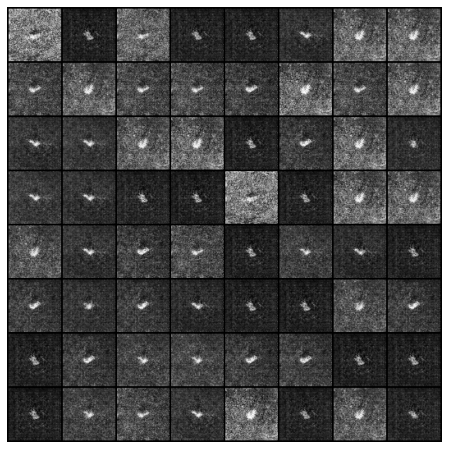

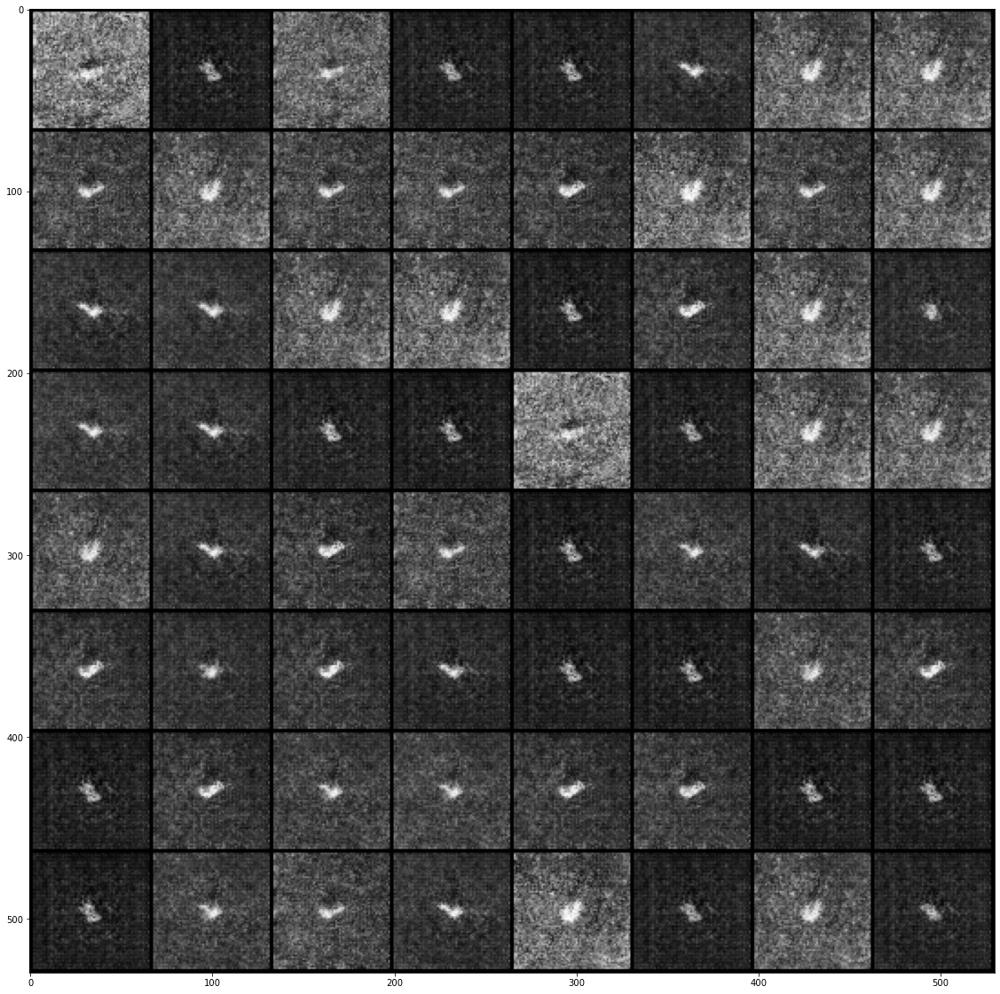

In [ ]:
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)]
         for i in fake_img1_cpu]
ani1 = animation.ArtistAnimation(fig, ims, interval=1000,
                                       repeat_delay=1000, blit=True)

plt.figure(figsize=(20,20))
plt.imshow(np.transpose(fake_img1_cpu[-1],(1,2,0)), animated=True)
plt.savefig('./model_gan'+str(n_per_class)+'/Final_GAN_epoch'+str(n_epochs)+'_ZSU_23_4.png',
              format="png")

f = r"./model_gan"+str(n_per_class)+"/JCS_Final_GAN_ZSU_23_4_learn.mp4" 
writermp4 = animation.FFMpegWriter(fps=5,extra_args=['-acodec', 'libfaac',
                                         '-vcodec', 'mpeg4']) 
ani1.save(f, writer=writermp4)   

#### 3) class_label == 2, T62

In [ ]:
t_indx = torch.nonzero(tr_lbl200==2).flatten()
gan_tr_data = 2*tr_data200[t_indx]-1
gan_tr_lbl = tr_lbl200[t_indx]

In [ ]:
t1 = time()
netG_fit2, netD_fit2, G_losses2, D_losses2, fake_img2, fake_img_list2 = train_gan_model(gan_tr_data, gan_tr_lbl, num_nz=num_nz, 
                                            num_node=num_node, out_col = 1, num_epochs=n_epochs, batch_size=batch_size,
                                            lr_rate=lr, rec_step=rec_step)
t2 = time()
print("Time: ", t2 - t1)

torch.save(fake_img_list2, './model_gan'+str(n_per_class)+'/final_fake_gen_list_label_2'+str(n_per_class)+'.pkl')
fake_img2_cpu = torch.load('./model_gan'+str(n_per_class)+'/final_fake_gen_list_label_2'+str(n_per_class)+'.pkl')

Starting Training Loop...
[0/5000][0/2]	Loss_D: 1.3859	Loss_G: 1.3747	D(x): 0.5001	D(G(z)): 0.4999 / 0.4942
[10/5000][0/2]	Loss_D: 0.2648	Loss_G: 0.2020	D(x): 0.9047	D(G(z)): 0.1509 / 0.0965
[20/5000][0/2]	Loss_D: 0.0379	Loss_G: 0.0311	D(x): 0.9821	D(G(z)): 0.0197 / 0.0129
[30/5000][0/2]	Loss_D: 0.6546	Loss_G: 0.1430	D(x): 0.8837	D(G(z)): 0.2751 / 0.0171
[40/5000][0/2]	Loss_D: 1.1077	Loss_G: 0.2885	D(x): 0.8580	D(G(z)): 0.5868 / 0.1251
[50/5000][0/2]	Loss_D: 0.7287	Loss_G: 0.1946	D(x): 0.8450	D(G(z)): 0.3851 / 0.0234
[60/5000][0/2]	Loss_D: 0.5779	Loss_G: 0.8279	D(x): 0.6162	D(G(z)): 0.0195 / 0.2196
[70/5000][0/2]	Loss_D: 0.7144	Loss_G: 0.7806	D(x): 0.6036	D(G(z)): 0.0152 / 0.0773
[80/5000][0/2]	Loss_D: 1.0564	Loss_G: 0.8229	D(x): 0.5713	D(G(z)): 0.2722 / 0.0901
[90/5000][0/2]	Loss_D: 0.8106	Loss_G: 0.4984	D(x): 0.6766	D(G(z)): 0.3100 / 0.0604
[100/5000][0/2]	Loss_D: 0.9004	Loss_G: 0.9054	D(x): 0.5334	D(G(z)): 0.0424 / 0.0471
[110/5000][0/2]	Loss_D: 0.9900	Loss_G: 0.4782	D(x): 0.6782	D(

[980/5000][0/2]	Loss_D: 0.0413	Loss_G: 0.0148	D(x): 0.9937	D(G(z)): 0.0321 / 0.0083
[990/5000][0/2]	Loss_D: 0.0780	Loss_G: 0.0254	D(x): 0.9811	D(G(z)): 0.0538 / 0.0062
[1000/5000][0/2]	Loss_D: 0.0399	Loss_G: 0.0185	D(x): 0.9906	D(G(z)): 0.0293 / 0.0089
[1010/5000][0/2]	Loss_D: 0.0841	Loss_G: 0.0152	D(x): 0.9897	D(G(z)): 0.0569 / 0.0046
[1020/5000][0/2]	Loss_D: 0.1121	Loss_G: 0.0122	D(x): 0.9912	D(G(z)): 0.0880 / 0.0032
[1030/5000][0/2]	Loss_D: 0.0434	Loss_G: 0.0119	D(x): 0.9945	D(G(z)): 0.0353 / 0.0063
[1040/5000][0/2]	Loss_D: 0.0503	Loss_G: 0.0235	D(x): 0.9881	D(G(z)): 0.0348 / 0.0110
[1050/5000][0/2]	Loss_D: 0.0237	Loss_G: 0.0132	D(x): 0.9944	D(G(z)): 0.0175 / 0.0076
[1060/5000][0/2]	Loss_D: 0.0263	Loss_G: 0.0232	D(x): 0.9834	D(G(z)): 0.0091 / 0.0061
[1070/5000][0/2]	Loss_D: 0.0355	Loss_G: 0.0120	D(x): 0.9936	D(G(z)): 0.0271 / 0.0055
[1080/5000][0/2]	Loss_D: 0.9454	Loss_G: 1.5741	D(x): 0.6991	D(G(z)): 0.0012 / 0.2754
[1090/5000][0/2]	Loss_D: 0.0872	Loss_G: 0.0560	D(x): 0.9668	D(G(z))

[1950/5000][0/2]	Loss_D: 0.0269	Loss_G: 0.0171	D(x): 0.9892	D(G(z)): 0.0156 / 0.0060
[1960/5000][0/2]	Loss_D: 0.0155	Loss_G: 0.0068	D(x): 0.9957	D(G(z)): 0.0110 / 0.0025
[1970/5000][0/2]	Loss_D: 0.0164	Loss_G: 0.0125	D(x): 0.9913	D(G(z)): 0.0073 / 0.0036
[1980/5000][0/2]	Loss_D: 0.0088	Loss_G: 0.0044	D(x): 0.9982	D(G(z)): 0.0070 / 0.0027
[1990/5000][0/2]	Loss_D: 0.0067	Loss_G: 0.0048	D(x): 0.9971	D(G(z)): 0.0037 / 0.0018
[2000/5000][0/2]	Loss_D: 0.0149	Loss_G: 0.0116	D(x): 0.9908	D(G(z)): 0.0055 / 0.0022
[2010/5000][0/2]	Loss_D: 0.0836	Loss_G: 0.2035	D(x): 0.9486	D(G(z)): 0.0025 / 0.0963
[2020/5000][0/2]	Loss_D: 0.0155	Loss_G: 0.0104	D(x): 0.9925	D(G(z)): 0.0074 / 0.0024
[2030/5000][0/2]	Loss_D: 0.0332	Loss_G: 0.0177	D(x): 0.9909	D(G(z)): 0.0236 / 0.0084
[2040/5000][0/2]	Loss_D: 0.0279	Loss_G: 0.0115	D(x): 0.9939	D(G(z)): 0.0211 / 0.0051
[2050/5000][0/2]	Loss_D: 0.0136	Loss_G: 0.0087	D(x): 0.9948	D(G(z)): 0.0083 / 0.0034
[2060/5000][0/2]	Loss_D: 0.0555	Loss_G: 0.0240	D(x): 0.9802	D(G(z

[2920/5000][0/2]	Loss_D: 0.0789	Loss_G: 0.0731	D(x): 0.9636	D(G(z)): 0.0120 / 0.0064
[2930/5000][0/2]	Loss_D: 0.0079	Loss_G: 0.0068	D(x): 0.9951	D(G(z)): 0.0029 / 0.0018
[2940/5000][0/2]	Loss_D: 0.0137	Loss_G: 0.0081	D(x): 0.9962	D(G(z)): 0.0098 / 0.0043
[2950/5000][0/2]	Loss_D: 0.0202	Loss_G: 0.0040	D(x): 0.9986	D(G(z)): 0.0176 / 0.0025
[2960/5000][0/2]	Loss_D: 1.0109	Loss_G: 0.0004	D(x): 0.9996	D(G(z)): 0.3558 / 0.0000
[2970/5000][0/2]	Loss_D: 0.0331	Loss_G: 0.0163	D(x): 0.9936	D(G(z)): 0.0253 / 0.0089
[2980/5000][0/2]	Loss_D: 0.0179	Loss_G: 0.0086	D(x): 0.9992	D(G(z)): 0.0169 / 0.0077
[2990/5000][0/2]	Loss_D: 0.0145	Loss_G: 0.0118	D(x): 0.9960	D(G(z)): 0.0104 / 0.0077
[3000/5000][0/2]	Loss_D: 0.0112	Loss_G: 0.0084	D(x): 0.9980	D(G(z)): 0.0091 / 0.0063
[3010/5000][0/2]	Loss_D: 0.0418	Loss_G: 0.0407	D(x): 0.9734	D(G(z)): 0.0035 / 0.0024
[3020/5000][0/2]	Loss_D: 0.1569	Loss_G: 0.1550	D(x): 0.9917	D(G(z)): 0.0109 / 0.0092
[3030/5000][0/2]	Loss_D: 0.0183	Loss_G: 0.0172	D(x): 0.9927	D(G(z

[3890/5000][0/2]	Loss_D: 0.0070	Loss_G: 0.0053	D(x): 0.9983	D(G(z)): 0.0052 / 0.0036
[3900/5000][0/2]	Loss_D: 0.0037	Loss_G: 0.0036	D(x): 0.9982	D(G(z)): 0.0019 / 0.0017
[3910/5000][0/2]	Loss_D: 0.0022	Loss_G: 0.0022	D(x): 0.9988	D(G(z)): 0.0010 / 0.0010
[3920/5000][0/2]	Loss_D: 0.0124	Loss_G: 0.0039	D(x): 0.9990	D(G(z)): 0.0107 / 0.0028
[3930/5000][0/2]	Loss_D: 0.0057	Loss_G: 0.0056	D(x): 0.9982	D(G(z)): 0.0038 / 0.0038
[3940/5000][0/2]	Loss_D: 0.0194	Loss_G: 0.0068	D(x): 0.9993	D(G(z)): 0.0172 / 0.0060
[3950/5000][0/2]	Loss_D: 0.0085	Loss_G: 0.0078	D(x): 0.9940	D(G(z)): 0.0024 / 0.0017
[3960/5000][0/2]	Loss_D: 0.0043	Loss_G: 0.0032	D(x): 0.9992	D(G(z)): 0.0035 / 0.0023
[3970/5000][0/2]	Loss_D: 0.0047	Loss_G: 0.0040	D(x): 0.9984	D(G(z)): 0.0030 / 0.0024
[3980/5000][0/2]	Loss_D: 0.0042	Loss_G: 0.0024	D(x): 0.9994	D(G(z)): 0.0036 / 0.0018
[3990/5000][0/2]	Loss_D: 0.0515	Loss_G: 0.0032	D(x): 0.9974	D(G(z)): 0.0397 / 0.0005
[4000/5000][0/2]	Loss_D: 0.0067	Loss_G: 0.0029	D(x): 0.9996	D(G(z

[4860/5000][0/2]	Loss_D: 0.0013	Loss_G: 0.0011	D(x): 0.9996	D(G(z)): 0.0010 / 0.0007
[4870/5000][0/2]	Loss_D: 0.0028	Loss_G: 0.0023	D(x): 0.9995	D(G(z)): 0.0023 / 0.0018
[4880/5000][0/2]	Loss_D: 0.0052	Loss_G: 0.0050	D(x): 0.9956	D(G(z)): 0.0006 / 0.0005
[4890/5000][0/2]	Loss_D: 0.0016	Loss_G: 0.0014	D(x): 0.9992	D(G(z)): 0.0009 / 0.0007
[4900/5000][0/2]	Loss_D: 0.0032	Loss_G: 0.0032	D(x): 0.9972	D(G(z)): 0.0004 / 0.0004
[4910/5000][0/2]	Loss_D: 0.0699	Loss_G: 0.0364	D(x): 0.9852	D(G(z)): 0.0475 / 0.0162
[4920/5000][0/2]	Loss_D: 0.0760	Loss_G: 0.0089	D(x): 0.9982	D(G(z)): 0.0556 / 0.0069
[4930/5000][0/2]	Loss_D: 0.0258	Loss_G: 0.0220	D(x): 0.9849	D(G(z)): 0.0098 / 0.0060
[4940/5000][0/2]	Loss_D: 0.0346	Loss_G: 0.0043	D(x): 0.9980	D(G(z)): 0.0293 / 0.0023
[4950/5000][0/2]	Loss_D: 0.0116	Loss_G: 0.0045	D(x): 0.9997	D(G(z)): 0.0111 / 0.0042
[4960/5000][0/2]	Loss_D: 0.0590	Loss_G: 0.0017	D(x): 0.9991	D(G(z)): 0.0380 / 0.0008
[4970/5000][0/2]	Loss_D: 0.0063	Loss_G: 0.0052	D(x): 0.9985	D(G(z

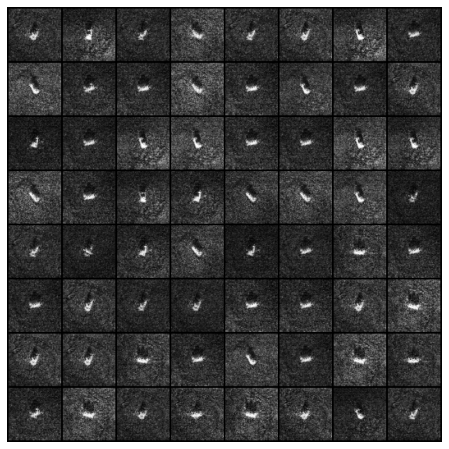

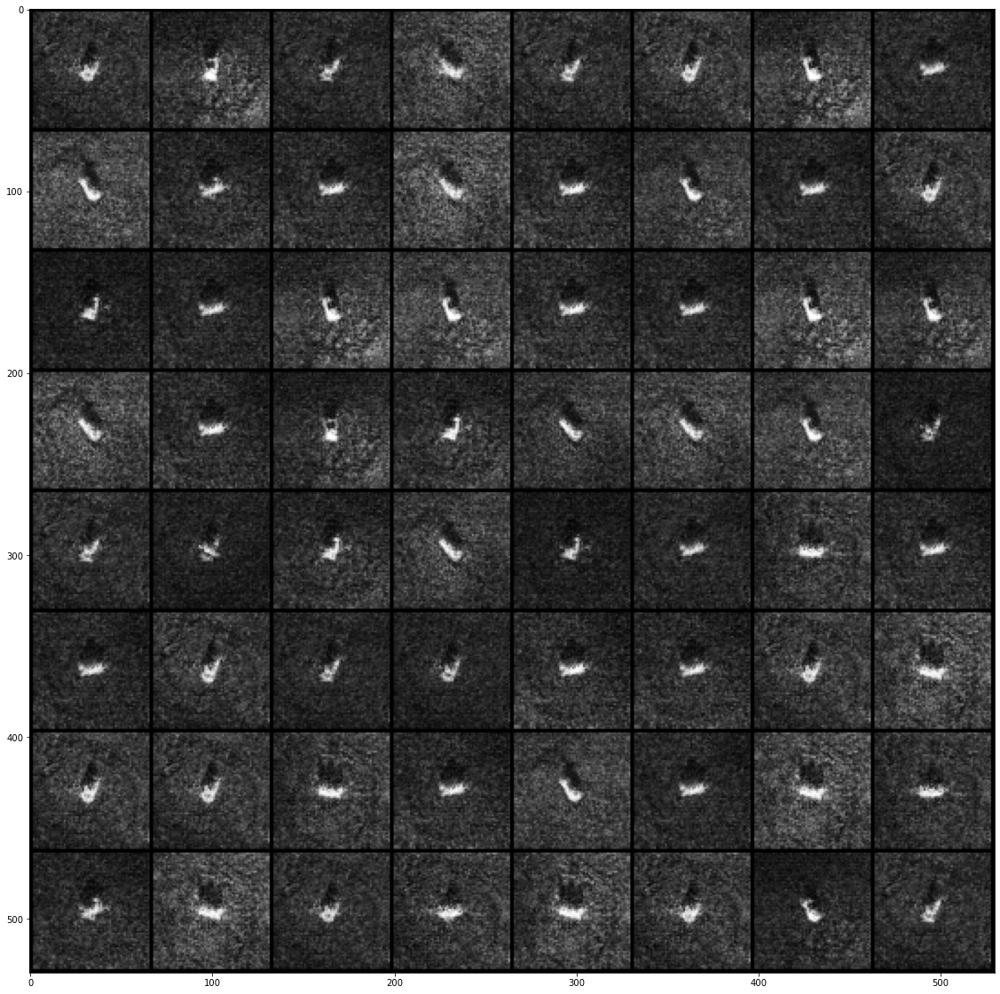

In [ ]:
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)]
         for i in fake_img2_cpu]
ani2 = animation.ArtistAnimation(fig, ims, interval=1000,
                                       repeat_delay=1000, blit=True)

plt.figure(figsize=(20,20))
plt.imshow(np.transpose(fake_img2_cpu[-1],(1,2,0)), animated=True)
plt.savefig('./model_gan'+str(n_per_class)+'/Final_GAN_epoch'+str(n_epochs)+'_T62.png',
               format="png")

f = r"./model_gan"+str(n_per_class)+"/JCS_Final_GAN_T62_learn.mp4" 
writermp4 = animation.FFMpegWriter(fps=5,extra_args=['-acodec', 'libfaac',
                                         '-vcodec', 'mpeg4']) 
ani2.save(f, writer=writermp4)          

#### 4) class_label == 3, 2S1

In [ ]:
t_indx = torch.nonzero(tr_lbl200==3).flatten()
gan_tr_data = 2*tr_data200[t_indx]-1
gan_tr_lbl = tr_lbl200[t_indx]

In [ ]:
t1 = time()
netG_fit3, netD_fit3, G_losses3, D_losses3, fake_img3, fake_img_list3 = train_gan_model(gan_tr_data, gan_tr_lbl, num_nz=num_nz, num_node=num_node,
                    out_col = 1, num_epochs=n_epochs, batch_size=batch_size,
                    lr_rate=lr, rec_step=rec_step)
t2 = time()
print("Time: ", t2 - t1)

torch.save(fake_img_list3, './model_gan'+str(n_per_class)+'/final_fake_gen_list_label_3'+str(n_per_class)+'.pkl')
fake_img3_cpu = torch.load('./model_gan'+str(n_per_class)+'/final_fake_gen_list_label_3'+str(n_per_class)+'.pkl')

Starting Training Loop...
[0/5000][0/2]	Loss_D: 1.3865	Loss_G: 1.3737	D(x): 0.5093	D(G(z)): 0.5092 / 0.5029
[10/5000][0/2]	Loss_D: 0.5236	Loss_G: 0.3893	D(x): 0.7747	D(G(z)): 0.2238 / 0.1194
[20/5000][0/2]	Loss_D: 0.0810	Loss_G: 0.0759	D(x): 0.9365	D(G(z)): 0.0132 / 0.0082
[30/5000][0/2]	Loss_D: 0.6456	Loss_G: 0.5060	D(x): 0.6542	D(G(z)): 0.1654 / 0.0518
[40/5000][0/2]	Loss_D: 0.2205	Loss_G: 0.0800	D(x): 0.9329	D(G(z)): 0.1359 / 0.0089
[50/5000][0/2]	Loss_D: 1.2460	Loss_G: 0.0285	D(x): 0.9797	D(G(z)): 0.4644 / 0.0070
[60/5000][0/2]	Loss_D: 0.1837	Loss_G: 0.0897	D(x): 0.9351	D(G(z)): 0.1002 / 0.0192
[70/5000][0/2]	Loss_D: 0.4673	Loss_G: 0.2626	D(x): 0.8427	D(G(z)): 0.2101 / 0.0443
[80/5000][0/2]	Loss_D: 0.6487	Loss_G: 0.2511	D(x): 0.8563	D(G(z)): 0.2628 / 0.0562
[90/5000][0/2]	Loss_D: 0.7169	Loss_G: 0.3584	D(x): 0.7712	D(G(z)): 0.3106 / 0.0238
[100/5000][0/2]	Loss_D: 0.4913	Loss_G: 0.5630	D(x): 0.7290	D(G(z)): 0.0792 / 0.1497
[110/5000][0/2]	Loss_D: 1.0894	Loss_G: 0.2598	D(x): 0.8366	D(

[980/5000][0/2]	Loss_D: 0.1092	Loss_G: 0.0511	D(x): 0.9593	D(G(z)): 0.0626 / 0.0083
[990/5000][0/2]	Loss_D: 0.0678	Loss_G: 0.0599	D(x): 0.9528	D(G(z)): 0.0150 / 0.0073
[1000/5000][0/2]	Loss_D: 0.0508	Loss_G: 0.0185	D(x): 0.9879	D(G(z)): 0.0358 / 0.0060
[1010/5000][0/2]	Loss_D: 0.1009	Loss_G: 0.0142	D(x): 0.9878	D(G(z)): 0.0788 / 0.0018
[1020/5000][0/2]	Loss_D: 0.0652	Loss_G: 0.0224	D(x): 0.9840	D(G(z)): 0.0455 / 0.0059
[1030/5000][0/2]	Loss_D: 0.0539	Loss_G: 0.0326	D(x): 0.9753	D(G(z)): 0.0239 / 0.0037
[1040/5000][0/2]	Loss_D: 0.0482	Loss_G: 0.0217	D(x): 0.9860	D(G(z)): 0.0320 / 0.0073
[1050/5000][0/2]	Loss_D: 0.0390	Loss_G: 0.0200	D(x): 0.9840	D(G(z)): 0.0217 / 0.0036
[1060/5000][0/2]	Loss_D: 0.0401	Loss_G: 0.0295	D(x): 0.9766	D(G(z)): 0.0150 / 0.0047
[1070/5000][0/2]	Loss_D: 0.2087	Loss_G: 0.0039	D(x): 0.9963	D(G(z)): 0.1344 / 0.0001
[1080/5000][0/2]	Loss_D: 0.0558	Loss_G: 0.0455	D(x): 0.9628	D(G(z)): 0.0167 / 0.0067
[1090/5000][0/2]	Loss_D: 0.2310	Loss_G: 0.0131	D(x): 0.9876	D(G(z))

[1950/5000][0/2]	Loss_D: 0.0386	Loss_G: 0.0166	D(x): 0.9937	D(G(z)): 0.0314 / 0.0100
[1960/5000][0/2]	Loss_D: 0.0142	Loss_G: 0.0129	D(x): 0.9905	D(G(z)): 0.0045 / 0.0033
[1970/5000][0/2]	Loss_D: 0.0233	Loss_G: 0.0122	D(x): 0.9917	D(G(z)): 0.0145 / 0.0038
[1980/5000][0/2]	Loss_D: 0.0168	Loss_G: 0.0065	D(x): 0.9956	D(G(z)): 0.0121 / 0.0021
[1990/5000][0/2]	Loss_D: 0.0219	Loss_G: 0.0184	D(x): 0.9852	D(G(z)): 0.0062 / 0.0028
[2000/5000][0/2]	Loss_D: 0.0152	Loss_G: 0.0042	D(x): 0.9981	D(G(z)): 0.0128 / 0.0023
[2010/5000][0/2]	Loss_D: 0.0090	Loss_G: 0.0052	D(x): 0.9971	D(G(z)): 0.0060 / 0.0023
[2020/5000][0/2]	Loss_D: 0.0125	Loss_G: 0.0042	D(x): 0.9971	D(G(z)): 0.0093 / 0.0013
[2030/5000][0/2]	Loss_D: 0.0068	Loss_G: 0.0045	D(x): 0.9967	D(G(z)): 0.0034 / 0.0012
[2040/5000][0/2]	Loss_D: 0.0076	Loss_G: 0.0056	D(x): 0.9968	D(G(z)): 0.0044 / 0.0024
[2050/5000][0/2]	Loss_D: 0.0042	Loss_G: 0.0034	D(x): 0.9985	D(G(z)): 0.0027 / 0.0019
[2060/5000][0/2]	Loss_D: 0.0195	Loss_G: 0.0039	D(x): 0.9974	D(G(z

[2920/5000][0/2]	Loss_D: 0.0183	Loss_G: 0.0060	D(x): 0.9978	D(G(z)): 0.0158 / 0.0038
[2930/5000][0/2]	Loss_D: 0.0110	Loss_G: 0.0029	D(x): 0.9996	D(G(z)): 0.0104 / 0.0025
[2940/5000][0/2]	Loss_D: 0.0105	Loss_G: 0.0073	D(x): 0.9947	D(G(z)): 0.0051 / 0.0020
[2950/5000][0/2]	Loss_D: 0.0166	Loss_G: 0.0051	D(x): 0.9966	D(G(z)): 0.0129 / 0.0017
[2960/5000][0/2]	Loss_D: 0.0815	Loss_G: 0.0373	D(x): 0.9723	D(G(z)): 0.0494 / 0.0069
[2970/5000][0/2]	Loss_D: 0.0967	Loss_G: 0.0980	D(x): 0.9765	D(G(z)): 0.0042 / 0.0055
[2980/5000][0/2]	Loss_D: 0.0333	Loss_G: 0.0105	D(x): 0.9938	D(G(z)): 0.0258 / 0.0041
[2990/5000][0/2]	Loss_D: 0.0175	Loss_G: 0.0092	D(x): 0.9961	D(G(z)): 0.0133 / 0.0051
[3000/5000][0/2]	Loss_D: 0.0176	Loss_G: 0.0062	D(x): 0.9981	D(G(z)): 0.0150 / 0.0043
[3010/5000][0/2]	Loss_D: 0.0116	Loss_G: 0.0066	D(x): 0.9959	D(G(z)): 0.0071 / 0.0022
[3020/5000][0/2]	Loss_D: 0.0192	Loss_G: 0.0123	D(x): 0.9911	D(G(z)): 0.0099 / 0.0032
[3030/5000][0/2]	Loss_D: 0.0088	Loss_G: 0.0081	D(x): 0.9950	D(G(z

[3890/5000][0/2]	Loss_D: 0.0103	Loss_G: 0.0061	D(x): 0.9963	D(G(z)): 0.0062 / 0.0021
[3900/5000][0/2]	Loss_D: 0.0070	Loss_G: 0.0069	D(x): 0.9943	D(G(z)): 0.0010 / 0.0008
[3910/5000][0/2]	Loss_D: 0.0108	Loss_G: 0.0076	D(x): 0.9939	D(G(z)): 0.0043 / 0.0012
[3920/5000][0/2]	Loss_D: 0.0103	Loss_G: 0.0078	D(x): 0.9933	D(G(z)): 0.0033 / 0.0009
[3930/5000][0/2]	Loss_D: 0.0046	Loss_G: 0.0042	D(x): 0.9971	D(G(z)): 0.0016 / 0.0012
[3940/5000][0/2]	Loss_D: 0.0069	Loss_G: 0.0039	D(x): 0.9976	D(G(z)): 0.0044 / 0.0015
[3950/5000][0/2]	Loss_D: 0.0053	Loss_G: 0.0049	D(x): 0.9963	D(G(z)): 0.0015 / 0.0012
[3960/5000][0/2]	Loss_D: 0.0050	Loss_G: 0.0046	D(x): 0.9960	D(G(z)): 0.0008 / 0.0004
[3970/5000][0/2]	Loss_D: 0.0141	Loss_G: 0.0043	D(x): 0.9987	D(G(z)): 0.0125 / 0.0030
[3980/5000][0/2]	Loss_D: 0.0062	Loss_G: 0.0045	D(x): 0.9981	D(G(z)): 0.0042 / 0.0025
[3990/5000][0/2]	Loss_D: 0.0081	Loss_G: 0.0071	D(x): 0.9947	D(G(z)): 0.0027 / 0.0017
[4000/5000][0/2]	Loss_D: 0.1908	Loss_G: 0.1354	D(x): 0.9703	D(G(z

[4860/5000][0/2]	Loss_D: 0.0079	Loss_G: 0.0064	D(x): 0.9979	D(G(z)): 0.0058 / 0.0043
[4870/5000][0/2]	Loss_D: 0.0167	Loss_G: 0.0151	D(x): 0.9899	D(G(z)): 0.0063 / 0.0048
[4880/5000][0/2]	Loss_D: 0.0189	Loss_G: 0.0104	D(x): 0.9936	D(G(z)): 0.0120 / 0.0038
[4890/5000][0/2]	Loss_D: 0.0063	Loss_G: 0.0050	D(x): 0.9998	D(G(z)): 0.0061 / 0.0048
[4900/5000][0/2]	Loss_D: 0.1314	Loss_G: 0.1304	D(x): 0.9908	D(G(z)): 0.0043 / 0.0034
[4910/5000][0/2]	Loss_D: 0.0650	Loss_G: 0.0652	D(x): 0.9524	D(G(z)): 0.0008 / 0.0010
[4920/5000][0/2]	Loss_D: 0.0062	Loss_G: 0.0058	D(x): 0.9958	D(G(z)): 0.0017 / 0.0013
[4930/5000][0/2]	Loss_D: 0.0041	Loss_G: 0.0027	D(x): 0.9994	D(G(z)): 0.0035 / 0.0021
[4940/5000][0/2]	Loss_D: 0.0069	Loss_G: 0.0022	D(x): 0.9995	D(G(z)): 0.0063 / 0.0017
[4950/5000][0/2]	Loss_D: 0.0239	Loss_G: 0.0017	D(x): 0.9992	D(G(z)): 0.0214 / 0.0009
[4960/5000][0/2]	Loss_D: 0.0339	Loss_G: 0.0044	D(x): 0.9963	D(G(z)): 0.0265 / 0.0006
[4970/5000][0/2]	Loss_D: 0.2225	Loss_G: 0.2226	D(x): 0.9516	D(G(z

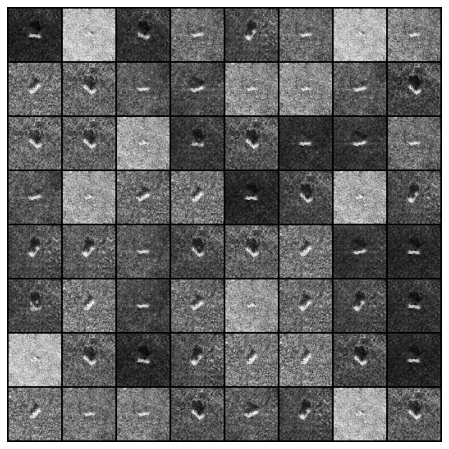

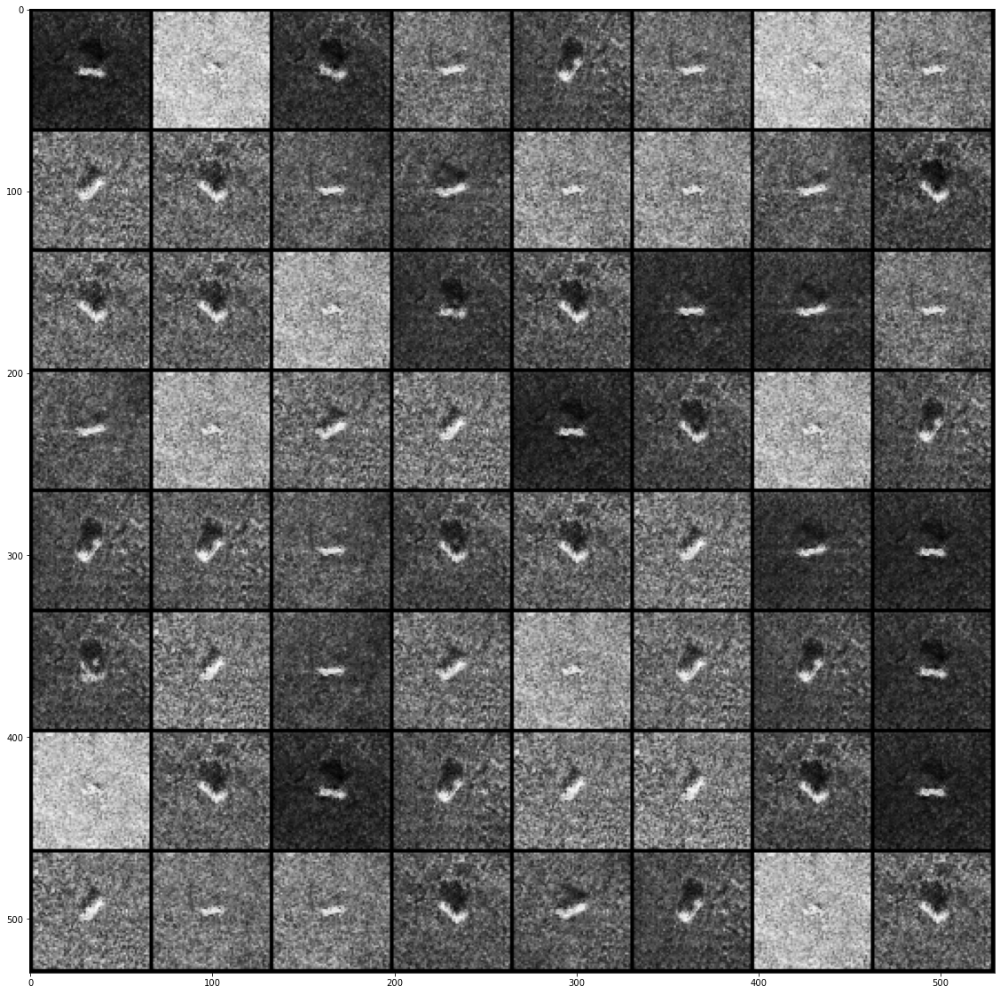

In [ ]:
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)]
         for i in fake_img3_cpu]
ani3 = animation.ArtistAnimation(fig, ims, interval=1000,
                                       repeat_delay=1000, blit=True)

plt.figure(figsize=(20,20))
plt.imshow(np.transpose(fake_img3_cpu[-1],(1,2,0)), animated=True)
plt.savefig('./model_gan'+str(n_per_class)+'/Final_GAN_epoch'+str(n_epochs)+'_2S1.png',
              format="png")

f = r"./model_gan"+str(n_per_class)+"/JCS_Final_GAN_2S1_learn.mp4" 
writermp4 = animation.FFMpegWriter(fps=5,extra_args=['-acodec', 'libfaac',
                                         '-vcodec', 'mpeg4']) 
ani3.save(f, writer=writermp4)

#### 5) class_label == 4, BRDM_2

In [ ]:
# class_label == 4
t_indx = torch.nonzero(tr_lbl200==4).flatten()
gan_tr_data = 2*tr_data200[t_indx]-1
gan_tr_lbl = tr_lbl200[t_indx]

In [ ]:
t1 = time()
netG_fit4, netD_fit4, G_losses4, D_losses4, fake_img4, fake_img_list4 = train_gan_model(gan_tr_data, gan_tr_lbl, num_nz=num_nz, 
                                      num_node=num_node,out_col = 1, num_epochs=n_epochs, batch_size=batch_size,
                                                                                        lr_rate=lr, rec_step=rec_step)
t2 = time()
print("Time: ", t2 - t1)

torch.save(fake_img_list4, './model_gan'+str(n_per_class)+'/final_fake_gen_list_label_4'+str(n_per_class)+'.pkl')
fake_img4_cpu = torch.load('./model_gan'+str(n_per_class)+'/final_fake_gen_list_label_4'+str(n_per_class)+'.pkl')

Starting Training Loop...
[0/5000][0/2]	Loss_D: 1.3866	Loss_G: 1.3746	D(x): 0.5019	D(G(z)): 0.5020 / 0.4960
[10/5000][0/2]	Loss_D: 0.8373	Loss_G: 0.6382	D(x): 0.6732	D(G(z)): 0.3314 / 0.2075
[20/5000][0/2]	Loss_D: 0.5136	Loss_G: 0.1865	D(x): 0.8843	D(G(z)): 0.2997 / 0.0564
[30/5000][0/2]	Loss_D: 0.4164	Loss_G: 0.1104	D(x): 0.9162	D(G(z)): 0.2623 / 0.0182
[40/5000][0/2]	Loss_D: 0.3323	Loss_G: 0.2798	D(x): 0.8223	D(G(z)): 0.1154 / 0.0709
[50/5000][0/2]	Loss_D: 0.6316	Loss_G: 0.6442	D(x): 0.6347	D(G(z)): 0.0995 / 0.1103
[60/5000][0/2]	Loss_D: 1.1316	Loss_G: 0.1894	D(x): 0.9472	D(G(z)): 0.5241 / 0.1150
[70/5000][0/2]	Loss_D: 0.9816	Loss_G: 0.0827	D(x): 0.9359	D(G(z)): 0.5378 / 0.0148
[80/5000][0/2]	Loss_D: 0.5099	Loss_G: 0.3895	D(x): 0.7427	D(G(z)): 0.1679 / 0.0686
[90/5000][0/2]	Loss_D: 0.6998	Loss_G: 0.2185	D(x): 0.8354	D(G(z)): 0.3539 / 0.0155
[100/5000][0/2]	Loss_D: 0.5130	Loss_G: 0.1645	D(x): 0.8822	D(G(z)): 0.2993 / 0.0324
[110/5000][0/2]	Loss_D: 0.4904	Loss_G: 0.5430	D(x): 0.7463	D(

[980/5000][0/2]	Loss_D: 0.0393	Loss_G: 0.0381	D(x): 0.9696	D(G(z)): 0.0043 / 0.0031
[990/5000][0/2]	Loss_D: 1.6142	Loss_G: 1.7416	D(x): 0.6093	D(G(z)): 0.0012 / 0.0628
[1000/5000][0/2]	Loss_D: 0.0540	Loss_G: 0.0544	D(x): 0.9582	D(G(z)): 0.0006 / 0.0009
[1010/5000][0/2]	Loss_D: 0.0654	Loss_G: 0.0407	D(x): 0.9715	D(G(z)): 0.0254 / 0.0025
[1020/5000][0/2]	Loss_D: 0.1864	Loss_G: 0.1959	D(x): 0.9114	D(G(z)): 0.0030 / 0.0120
[1030/5000][0/2]	Loss_D: 0.0279	Loss_G: 0.0182	D(x): 0.9848	D(G(z)): 0.0100 / 0.0008
[1040/5000][0/2]	Loss_D: 0.0341	Loss_G: 0.0110	D(x): 0.9905	D(G(z)): 0.0211 / 0.0011
[1050/5000][0/2]	Loss_D: 0.0318	Loss_G: 0.0112	D(x): 0.9911	D(G(z)): 0.0215 / 0.0022
[1060/5000][0/2]	Loss_D: 0.0324	Loss_G: 0.0054	D(x): 0.9977	D(G(z)): 0.0221 / 0.0031
[1070/5000][0/2]	Loss_D: 0.0245	Loss_G: 0.0211	D(x): 0.9825	D(G(z)): 0.0064 / 0.0030
[1080/5000][0/2]	Loss_D: 0.0188	Loss_G: 0.0141	D(x): 0.9886	D(G(z)): 0.0070 / 0.0024
[1090/5000][0/2]	Loss_D: 0.5367	Loss_G: 0.4544	D(x): 0.8855	D(G(z))

[1950/5000][0/2]	Loss_D: 0.0242	Loss_G: 0.0107	D(x): 0.9935	D(G(z)): 0.0171 / 0.0042
[1960/5000][0/2]	Loss_D: 0.0273	Loss_G: 0.0275	D(x): 0.9766	D(G(z)): 0.0019 / 0.0021
[1970/5000][0/2]	Loss_D: 0.7673	Loss_G: 0.2334	D(x): 0.9392	D(G(z)): 0.1857 / 0.0043
[1980/5000][0/2]	Loss_D: 0.0351	Loss_G: 0.0180	D(x): 0.9886	D(G(z)): 0.0219 / 0.0053
[1990/5000][0/2]	Loss_D: 0.0197	Loss_G: 0.0026	D(x): 0.9998	D(G(z)): 0.0185 / 0.0024
[2000/5000][0/2]	Loss_D: 0.0186	Loss_G: 0.0071	D(x): 0.9973	D(G(z)): 0.0145 / 0.0043
[2010/5000][0/2]	Loss_D: 0.1501	Loss_G: 0.1148	D(x): 0.9484	D(G(z)): 0.0488 / 0.0213
[2020/5000][0/2]	Loss_D: 0.0350	Loss_G: 0.0130	D(x): 0.9943	D(G(z)): 0.0285 / 0.0072
[2030/5000][0/2]	Loss_D: 0.0226	Loss_G: 0.0183	D(x): 0.9879	D(G(z)): 0.0101 / 0.0058
[2040/5000][0/2]	Loss_D: 0.0359	Loss_G: 0.0062	D(x): 0.9969	D(G(z)): 0.0313 / 0.0030
[2050/5000][0/2]	Loss_D: 0.0131	Loss_G: 0.0106	D(x): 0.9921	D(G(z)): 0.0039 / 0.0014
[2060/5000][0/2]	Loss_D: 0.0071	Loss_G: 0.0072	D(x): 0.9997	D(G(z

[2920/5000][0/2]	Loss_D: 0.0099	Loss_G: 0.0090	D(x): 0.9941	D(G(z)): 0.0035 / 0.0026
[2930/5000][0/2]	Loss_D: 0.7000	Loss_G: 0.6876	D(x): 0.8399	D(G(z)): 0.0110 / 0.0004
[2940/5000][0/2]	Loss_D: 0.0113	Loss_G: 0.0061	D(x): 0.9956	D(G(z)): 0.0066 / 0.0016
[2950/5000][0/2]	Loss_D: 0.5146	Loss_G: 0.0026	D(x): 0.9978	D(G(z)): 0.1882 / 0.0003
[2960/5000][0/2]	Loss_D: 0.0608	Loss_G: 0.0579	D(x): 0.9587	D(G(z)): 0.0069 / 0.0041
[2970/5000][0/2]	Loss_D: 0.2099	Loss_G: 0.2141	D(x): 0.9338	D(G(z)): 0.0259 / 0.0300
[2980/5000][0/2]	Loss_D: 0.0563	Loss_G: 0.0246	D(x): 0.9883	D(G(z)): 0.0406 / 0.0105
[2990/5000][0/2]	Loss_D: 1.8952	Loss_G: 1.9283	D(x): 0.5467	D(G(z)): 0.0085 / 0.0388
[3000/5000][0/2]	Loss_D: 0.0369	Loss_G: 0.0137	D(x): 0.9970	D(G(z)): 0.0331 / 0.0106
[3010/5000][0/2]	Loss_D: 0.0145	Loss_G: 0.0070	D(x): 0.9975	D(G(z)): 0.0117 / 0.0045
[3020/5000][0/2]	Loss_D: 0.0427	Loss_G: 0.0056	D(x): 0.9971	D(G(z)): 0.0321 / 0.0026
[3030/5000][0/2]	Loss_D: 0.0214	Loss_G: 0.0061	D(x): 0.9970	D(G(z

[3890/5000][0/2]	Loss_D: 0.0087	Loss_G: 0.0073	D(x): 0.9968	D(G(z)): 0.0054 / 0.0040
[3900/5000][0/2]	Loss_D: 0.3810	Loss_G: 0.2190	D(x): 0.8829	D(G(z)): 0.1682 / 0.0388
[3910/5000][0/2]	Loss_D: 0.0697	Loss_G: 0.0588	D(x): 0.9696	D(G(z)): 0.0338 / 0.0232
[3920/5000][0/2]	Loss_D: 0.0267	Loss_G: 0.0170	D(x): 0.9951	D(G(z)): 0.0212 / 0.0118
[3930/5000][0/2]	Loss_D: 0.0425	Loss_G: 0.0174	D(x): 0.9884	D(G(z)): 0.0295 / 0.0055
[3940/5000][0/2]	Loss_D: 0.0085	Loss_G: 0.0072	D(x): 0.9963	D(G(z)): 0.0047 / 0.0034
[3950/5000][0/2]	Loss_D: 0.0101	Loss_G: 0.0076	D(x): 0.9942	D(G(z)): 0.0042 / 0.0018
[3960/5000][0/2]	Loss_D: 0.0101	Loss_G: 0.0083	D(x): 0.9947	D(G(z)): 0.0047 / 0.0029
[3970/5000][0/2]	Loss_D: 0.0040	Loss_G: 0.0040	D(x): 0.9982	D(G(z)): 0.0022 / 0.0022
[3980/5000][0/2]	Loss_D: 0.0076	Loss_G: 0.0046	D(x): 0.9984	D(G(z)): 0.0059 / 0.0030
[3990/5000][0/2]	Loss_D: 0.0508	Loss_G: 0.0054	D(x): 0.9966	D(G(z)): 0.0399 / 0.0020
[4000/5000][0/2]	Loss_D: 0.3419	Loss_G: 0.3429	D(x): 0.8794	D(G(z

[4860/5000][0/2]	Loss_D: 0.0044	Loss_G: 0.0218	D(x): 0.9998	D(G(z)): 0.0042 / 0.0182
[4870/5000][0/2]	Loss_D: 0.0056	Loss_G: 0.0043	D(x): 0.9996	D(G(z)): 0.0052 / 0.0039
[4880/5000][0/2]	Loss_D: 0.0125	Loss_G: 0.0060	D(x): 0.9973	D(G(z)): 0.0095 / 0.0032
[4890/5000][0/2]	Loss_D: 0.0079	Loss_G: 0.0065	D(x): 0.9957	D(G(z)): 0.0036 / 0.0022
[4900/5000][0/2]	Loss_D: 0.0192	Loss_G: 0.0191	D(x): 0.9853	D(G(z)): 0.0008 / 0.0007
[4910/5000][0/2]	Loss_D: 0.0102	Loss_G: 0.0071	D(x): 0.9947	D(G(z)): 0.0048 / 0.0018
[4920/5000][0/2]	Loss_D: 0.0111	Loss_G: 0.0042	D(x): 0.9974	D(G(z)): 0.0083 / 0.0016
[4930/5000][0/2]	Loss_D: 0.0090	Loss_G: 0.0033	D(x): 0.9982	D(G(z)): 0.0069 / 0.0015
[4940/5000][0/2]	Loss_D: 0.0085	Loss_G: 0.0039	D(x): 0.9984	D(G(z)): 0.0065 / 0.0022
[4950/5000][0/2]	Loss_D: 0.1004	Loss_G: 0.0043	D(x): 0.9969	D(G(z)): 0.0632 / 0.0012
[4960/5000][0/2]	Loss_D: 0.0076	Loss_G: 0.0035	D(x): 0.9992	D(G(z)): 0.0067 / 0.0026
[4970/5000][0/2]	Loss_D: 0.0148	Loss_G: 0.0145	D(x): 0.9900	D(G(z

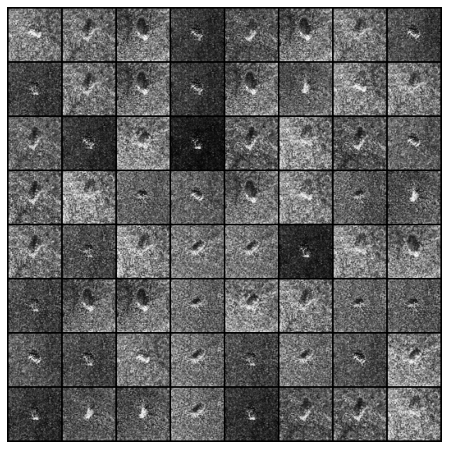

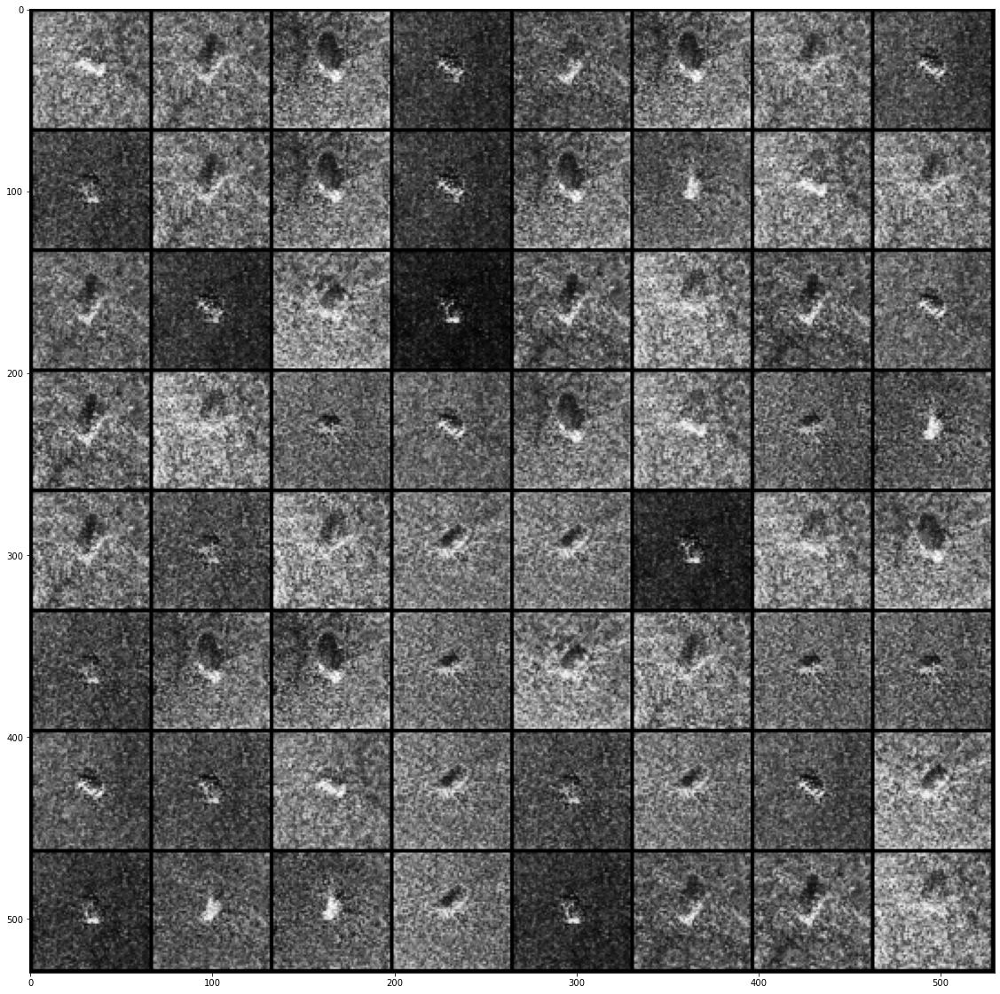

In [ ]:
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)]
         for i in fake_img4_cpu]
ani4 = animation.ArtistAnimation(fig, ims, interval=1000,
                                       repeat_delay=1000, blit=True)

plt.figure(figsize=(20,20))
plt.imshow(np.transpose(fake_img4_cpu[-1],(1,2,0)), animated=True)
plt.savefig('./model_gan'+str(n_per_class)+'/Final_GAN_epoch'+str(n_epochs)+'_BRDM_2.png',
              format="png")

f = r"./model_gan"+str(n_per_class)+"/JCS_Final_GAN_BRDM_2_learn.mp4" 
writermp4 = animation.FFMpegWriter(fps=5,extra_args=['-acodec', 'libfaac',
                                         '-vcodec', 'mpeg4']) 
ani4.save(f, writer=writermp4)

In [ ]:
# DCGAN Model Save
torch.save(netG_fit0.state_dict(),
             './model_gan'+str(n_per_class)+'/netG_label_0_'+str(n_per_class)+'.pkl')
torch.save(netG_fit1.state_dict(),
             './model_gan'+str(n_per_class)+'/netG_label_1_'+str(n_per_class)+'.pkl')
torch.save(netG_fit2.state_dict(),
             './model_gan'+str(n_per_class)+'/netG_label_2_'+str(n_per_class)+'.pkl')
torch.save(netG_fit3.state_dict(),
             './model_gan'+str(n_per_class)+'/netG_label_3_'+str(n_per_class)+'.pkl')
torch.save(netG_fit4.state_dict(),
             './model_gan'+str(n_per_class)+'/netG_label_4_'+str(n_per_class)+'.pkl')

In [ ]:
# Generate fake samples
num_nz = 512 #생성기의 입력 난수의 차원
num_sz = 512
num_node = 64
out_col = 1

#label==0
num_fake = 7*n_per_class
latent_z = torch.randn((num_fake,num_sz,1,1))

netG_lbl_0 = Generator(num_nz, out_col, num_node).to('cpu')
netG_lbl_0.load_state_dict(torch.load('./model_gan'+str(n_per_class)+'/netG_label_0_'+str(n_per_class)+'.pkl'))
netG_lbl_0.eval()
fake_image_0 = netG_lbl_0(latent_z).detach() #noise z를 넣어 G로 생성된 이미지
fake_lbl_0 = torch.zeros(num_fake, dtype=torch.int64)

#label==1
netG_lbl_1 = Generator(num_nz, out_col, num_node).to('cpu')
netG_lbl_1.load_state_dict(
       torch.load('./model_gan'+str(n_per_class)+'/netG_label_1_'+str(n_per_class)+'.pkl'))
netG_lbl_1.eval()
fake_image_1 = netG_lbl_1(latent_z).detach()
fake_lbl_1 = torch.ones(num_fake, dtype=torch.int64)

#label==2
netG_lbl_2 = Generator(num_nz, out_col, num_node).to('cpu')
netG_lbl_2.load_state_dict(torch.load('./model_gan'+str(n_per_class)+'/netG_label_2_'+str(n_per_class)+'.pkl'))
netG_lbl_2.eval()
fake_image_2 = netG_lbl_2(latent_z).detach()
fake_lbl_2 = torch.ones(num_fake, dtype=torch.int64)*2

#label==3
netG_lbl_3 = Generator(num_nz, out_col, num_node).to('cpu')
netG_lbl_3.load_state_dict(torch.load('./model_gan'+str(n_per_class)+'/netG_label_3_'+str(n_per_class)+'.pkl'))
netG_lbl_3.eval()
fake_image_3 = netG_lbl_3(latent_z).detach()
fake_lbl_3 = torch.ones(num_fake, dtype=torch.int64)*3

#label==4
netG_lbl_4 = Generator(num_nz, out_col, num_node).to('cpu')
netG_lbl_4.load_state_dict(torch.load('./model_gan'+str(n_per_class)+'/netG_label_4_'+str(n_per_class)+'.pkl'))
netG_lbl_4.eval()
fake_image_4 = netG_lbl_4(latent_z).detach()
fake_lbl_4 = torch.ones(num_fake, dtype=torch.int64)*4

only_gan_dat = torch.cat([fake_image_0,fake_image_1, fake_image_2,
                                   fake_image_3,fake_image_4])
only_gan_lbl = torch.cat([fake_lbl_0, fake_lbl_1, fake_lbl_2,
                                   fake_lbl_3, fake_lbl_4])

tr_gan_dat = torch.cat([tr_data200, only_gan_dat]) #기존 이미지 + gan 이미지
tr_gan_lbl = torch.cat([tr_lbl200, only_gan_lbl])

In [ ]:
gan_img_save_path = os.path.join('./img_out'+str(n_per_class), 'img_out_gan'+str(n_per_class)+'/')
os.makedirs(gan_img_save_path) #img_out200/img_out_gan200

export_images(gan_img_save_path,'mstar_gan',
                (only_gan_dat*0.5)+0.5, only_gan_lbl, class_label)

In [ ]:
print('train200: GAN 증강 후 데이터 개수\n')
for i in range(5):
    print(class_label[i],': ',(tr_gan_lbl==i).sum().item())
print('\n합계: ', tr_gan_dat.shape[0])

train200: GAN 증강 후 데이터 개수

SLICY :  1600
ZSU_23_4 :  1600
T62 :  1600
2S1 :  1600
BRDM_2 :  1600

합계:  8000


In [ ]:
# Classification with the augmented data by DCGAN
set_seed = 1234
random.seed(set_seed)
np.random.seed(set_seed)
torch.manual_seed(set_seed)
model_gan_fit, ep_loss_gan_fit, ep_acc_gan_fit, ep_prd_list_gan_fit, ep_y_list_gan_fit, ep_loss_hist_gan_fit = train_model(tr_gan_dat, tr_gan_lbl,
                                                          batch_size=48, n_epoch=5,
                                                          lr_rate=0.0002,
                                                          momentum=0.9, shuffle=False)

torch.save(model_gan_fit.state_dict(),
             './model_gan'+str(n_per_class)+'/clf_gan_augmnt_ratio'+str(n_per_class)+'.pkl')

model_gan_test = cnn_clf_net(sz,1,5)
model_gan_test.load_state_dict(torch.load('./model_gan'+str(n_per_class)+'/clf_gan_augmnt_ratio'+str(n_per_class)+'.pkl'))
model_gan_test.to('cuda')
pred_gan_test, y_gan_test, loss_gan_test, acc_gan_test = test_model(model_gan_test, ts_data, ts_lbl, batch_size=48)

confusion_matrix(pred_gan_test, y_gan_test)

Epoch 1
-------------------------------
loss: 1.612512  [    0/ 8000]
loss: 1.448231  [ 2400/ 8000]
loss: 1.196414  [ 4800/ 8000]
loss: 1.207948  [ 7200/ 8000]
 Training Error: 
 Accuracy: 51.3%, Avg loss: 1.348051 

Epoch 2
-------------------------------
loss: 1.064187  [    0/ 8000]
loss: 0.975319  [ 2400/ 8000]
loss: 0.868169  [ 4800/ 8000]
loss: 0.543812  [ 7200/ 8000]
 Training Error: 
 Accuracy: 72.4%, Avg loss: 0.818525 

Epoch 3
-------------------------------
loss: 0.699163  [    0/ 8000]
loss: 0.709653  [ 2400/ 8000]
loss: 0.347568  [ 4800/ 8000]
loss: 0.424854  [ 7200/ 8000]
 Training Error: 
 Accuracy: 75.7%, Avg loss: 0.569518 

Epoch 4
-------------------------------
loss: 0.582108  [    0/ 8000]
loss: 0.634970  [ 2400/ 8000]
loss: 0.438549  [ 4800/ 8000]
loss: 0.381531  [ 7200/ 8000]
 Training Error: 
 Accuracy: 76.3%, Avg loss: 0.488657 

Epoch 5
-------------------------------
loss: 0.645213  [    0/ 8000]
loss: 0.462822  [ 2400/ 8000]
loss: 0.390313  [ 4800/ 8000]
lo

,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,756,0,0,0,2
ZSU_23_4,16,316,0,1,99
T62,3,139,0,2,30
2S1,5,43,0,52,247
BRDM_2,13,28,0,11,364


### 4. 이미지 조작 & DCGAN 증강

In [ ]:
# Classification with the augmented data by geometric procedure and DCGAN
tr_aug_gan_dat = torch.cat([tr_data200, only_aug_dat, only_gan_dat]) #기존 + 조작 이미지 + dcgan 이미지
tr_aug_gan_lbl = torch.cat([tr_lbl200, only_aug_lbl, only_gan_lbl])

In [ ]:
print('train200: 이미지 조작 & GAN 증강 후 데이터 개수\n')
for i in range(5):
    print(class_label[i],': ',(tr_aug_gan_lbl==i).sum().item())
print('\n합계: ', tr_aug_gan_dat.shape[0]) #기존 데이터까지 합쳐진 개수

train200: 이미지 조작 & GAN 증강 후 데이터 개수

SLICY :  3000
ZSU_23_4 :  3000
T62 :  3000
2S1 :  3000
BRDM_2 :  3000

합계:  15000


In [ ]:
set_seed = 1234
random.seed(set_seed)
np.random.seed(set_seed)
torch.manual_seed(set_seed)

model_aug_gan_fit, ep_loss_aug_gan_fit, ep_acc_aug_gan_fit, ep_prd_list_aug_gan_fit, ep_y_list_aug_gan_fit, ep_loss_hist_aug_gan_fit = train_model(tr_aug_gan_dat, tr_aug_gan_lbl, batch_size=48, 
                n_epoch=5, lr_rate=0.0002, momentum=0.9, shuffle=False)

torch.save(model_aug_gan_fit.state_dict(),
             './model_save'+str(n_per_class)+'/mid_clf_aug_gan_augmnt_'+str(n_per_class)+'.pkl')

model_aug_gan_test = cnn_clf_net(sz,1,5)
model_aug_gan_test.load_state_dict(torch.load('./model_save'+str(n_per_class)+'/mid_clf_aug_gan_augmnt_'+str(n_per_class)+'.pkl'))
model_aug_gan_test.to('cuda')

pred_aug_gan_test, y_aug_gan_test, loss_aug_gan_test, acc_aug_gan_test = test_model(model_aug_gan_test, ts_data, ts_lbl, batch_size=48)

confusion_matrix(pred_aug_gan_test, y_aug_gan_test)

Epoch 1
-------------------------------
loss: 1.618126  [    0/15000]
loss: 1.554741  [ 2400/15000]
loss: 1.438029  [ 4800/15000]
loss: 1.273244  [ 7200/15000]
loss: 1.201947  [ 9600/15000]
loss: 1.269064  [12000/15000]
loss: 1.111522  [14400/15000]
 Training Error: 
 Accuracy: 45.2%, Avg loss: 1.347188 

Epoch 2
-------------------------------
loss: 0.929111  [    0/15000]
loss: 0.999080  [ 2400/15000]
loss: 0.740009  [ 4800/15000]
loss: 1.036286  [ 7200/15000]
loss: 0.810518  [ 9600/15000]
loss: 0.821568  [12000/15000]
loss: 0.672851  [14400/15000]
 Training Error: 
 Accuracy: 65.1%, Avg loss: 0.927285 

Epoch 3
-------------------------------
loss: 0.699994  [    0/15000]
loss: 0.533764  [ 2400/15000]
loss: 0.495603  [ 4800/15000]
loss: 0.446348  [ 7200/15000]
loss: 0.496785  [ 9600/15000]
loss: 0.420406  [12000/15000]
loss: 0.411020  [14400/15000]
 Training Error: 
 Accuracy: 81.5%, Avg loss: 0.523865 

Epoch 4
-------------------------------
loss: 0.442108  [    0/15000]
loss: 0.3

,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,754,2,0,0,2
ZSU_23_4,0,392,10,29,1
T62,0,8,165,0,1
2S1,0,3,23,315,6
BRDM_2,0,13,30,20,353


### 4. wavelet 필터
#### wave, levels, method, thresh_mode에 대해서 반복문을 통해 원하는 결과를 주는 조합 찾기 

In [ ]:
wave_levels_list = [] #wave 종류에 따라 가능한 decomposition levels 조합들을 저장한 list
for wave in pywt.wavelist(kind='discrete'):
    max_level = pywt.dwtn_max_level((64,64), wave)
    for i in range(max_level):
        wave_levels_list.append((wave,i+1))
        
wave_levels_list[:10] #bior1.1 은 level 1~6가능. bior1.3은 level 1~3가능.

[('bior1.1', 1),
 ('bior1.1', 2),
 ('bior1.1', 3),
 ('bior1.1', 4),
 ('bior1.1', 5),
 ('bior1.1', 6),
 ('bior1.3', 1),
 ('bior1.3', 2),
 ('bior1.3', 3),
 ('bior1.5', 1)]

In [ ]:
wt_param_acc_hist200 = dict() #모든 parameter 조합에 대한 acc를 저장.
wt_param_mat_hist200 = dict()

wt_better_param_acc_hist200 = dict() #wavelet filtering 했을 때 acc가 더 좋은 parameter 조합에 대한 acc만 저장.
wt_better_param_mat_hist200 = dict()

In [ ]:
# model_wt_param200 폴더에 저장 후 해당 parameter 조합이 조건을 만족하면 model_save200 폴더에 저장.
import shutil

i=1
for wave, levels in wave_levels_list:
    for method in ['VisuShrink','BayesShrink','Fuzzy','new_Visu']:
        for thresh_mode in ['hard','soft','garrote','greater','less']:
            if i==1:
                os.makedirs('model_wt_save200') #성능 향상된 wt조합 저장될 폴더
                os.makedirs('./model_wt_param'+str(n_per_class))
            if i>1: # 디스크 제한 사용량으로 인해 중간 중간 model save 폴더 삭제.
                shutil.rmtree('./model_wt_param'+str(n_per_class))
                os.makedirs('./model_wt_param'+str(n_per_class))
            
            # data filtering
            print(f'---------------{i}th: {wave}, {levels}, {thresh_mode}, {method}---------------')
            tr_wt_data, tr_wt_lbl = filtering_data(tr_data200, tr_lbl200, wave=wave, ext_mode='symmetric', 
                                                         method = method, thresh_mode=thresh_mode,
                                                         levels=levels, axes=(-2,-1))
            # 증강 전 + wavelet 필터
            set_seed = 1234
            random.seed(set_seed)
            np.random.seed(set_seed)
            torch.manual_seed(set_seed)
            model_wt_fit, ep_loss_wt_fit, ep_acc_wt_fit, ep_prd_list_wt_fit, ep_y_list_wt_fit, ep_loss_hist_wt_fit = train_model(tr_wt_data, tr_wt_lbl,
                                                  batch_size=48, n_epoch=5,
                                                  lr_rate=0.0002, momentum=0.9,
                                                  shuffle=False)

            torch.save(model_wt_fit.state_dict(), f'./model_wt_param{n_per_class}/clf_wt_200_param_{wave}_{levels}_{method}_{thresh_mode}.pkl')
            model_wt_test = cnn_clf_net(sz, 1, 5)
            model_wt_test.load_state_dict(torch.load(f'./model_wt_param{n_per_class}/clf_wt_200_param_{wave}_{levels}_{method}_{thresh_mode}.pkl'))
            model_wt_test.to('cuda')
            pred_wt_test, y_wt_test, loss_wt_test, acc_wt_test = test_model(model_wt_test, ts_data, ts_lbl, batch_size=48)
            
            wt_param_acc_hist200[(wave,levels,method,thresh_mode)] = [acc_wt_test]
            wt_param_mat_hist200[(wave,levels,method,thresh_mode)] = [confusion_matrix(pred_wt_test, y_wt_test)]
            
            if acc_wt_test > acc_test_nag:
                # wavelet 필터 + Geometric Augmentation
                tr_wt_temp_data = tr_wt_data.clone()
                tr_wt_temp_lbl = tr_wt_lbl.clone()

                only_wt_aug_dat, only_wt_aug_lbl = geom_aug(tr_wt_temp_data, tr_wt_temp_lbl)

                tr_wt_aug_dat = torch.cat([tr_wt_data, only_wt_aug_dat]).type(torch.float32)
                tr_wt_aug_lbl = torch.cat([tr_wt_lbl, only_wt_aug_lbl]).type(torch.int64)
    
                random.seed(set_seed)
                np.random.seed(set_seed)
                torch.manual_seed(set_seed)
                model_wt_aug_fit, ep_loss_wt_aug_fit, ep_acc_wt_aug_fit, ep_prd_list_wt_aug_fit, ep_y_list_wt_aug_fit, ep_loss_hist_wt_aug_fit = train_model(tr_wt_aug_dat, tr_wt_aug_lbl,
                                                                                                  batch_size=48, n_epoch=5,
                                                                                                  lr_rate=0.0002, momentum=0.9,
                                                                                                  shuffle=False)

                torch.save(model_wt_aug_fit.state_dict(),
                    f'./model_wt_param{n_per_class}/clf_wt_200_geom_augmnt_param_{wave}_{levels}_{method}_{thresh_mode}.pkl')
                model_wt_geom_test = cnn_clf_net(sz, 1, 5)
                model_wt_geom_test.load_state_dict(torch.load(
                    f'./model_wt_param{n_per_class}/clf_wt_200_geom_augmnt_param_{wave}_{levels}_{method}_{thresh_mode}.pkl'))
                model_wt_geom_test.to('cuda')
                pred_wt_aug_test, y_wt_aug_test, loss_wt_aug_test, acc_wt_aug_test = test_model(model_wt_geom_test, ts_data, ts_lbl, batch_size=48)
            
                wt_param_acc_hist200[(wave,levels,method,thresh_mode)].append(acc_wt_aug_test)
                wt_param_mat_hist200[(wave,levels,method,thresh_mode)].append(confusion_matrix(pred_wt_aug_test, y_wt_aug_test))
                
                if acc_wt_aug_test > acc_aug_test:
                    only_gan_wt_data, only_gan_wt_lbl = filtering_data(only_gan_dat, only_gan_lbl, wave=wave, ext_mode='symmetric', 
                                                         method = method, thresh_mode=thresh_mode,
                                                         levels=levels, axes=(-2,-1))   

                    tr_gan_wt_data = torch.cat([tr_data200, only_gan_wt_data])
                    tr_gan_wt_lbl = torch.cat([tr_lbl200, only_gan_wt_lbl])
                    
                    # DCGAN + wavelet 필터
                    set_seed = 1234
                    random.seed(set_seed)
                    np.random.seed(set_seed)
                    torch.manual_seed(set_seed)
                    model_gan_wt_fit, ep_loss_gan_wt_fit, ep_acc_gan_wt_fit, ep_prd_list_gan_wt_fit, ep_y_list_gan_wt__fit, ep_loss_hist_gan_wt_fit = train_model(tr_gan_wt_data, tr_gan_wt_lbl,
                                                                                                  batch_size=48, n_epoch=5,
                                                                                                  lr_rate=0.0002,
                                                                                                  momentum=0.9, shuffle=False)
                    torch.save(model_gan_wt_fit.state_dict(),
                        f'./model_wt_param{n_per_class}/clf_wt_200_gan_param_{wave}_{levels}_{method}_{thresh_mode}.pkl')

                    model_gan_wt_test = cnn_clf_net(sz,1,5)
                    model_gan_wt_test.load_state_dict(torch.load(f'./model_wt_param{n_per_class}/clf_wt_200_gan_param_{wave}_{levels}_{method}_{thresh_mode}.pkl'))
                    model_gan_wt_test.to('cuda')
                    pred_gan_wt_test, y_gan_wt_test, loss_gan_wt_test, acc_gan_wt_test = test_model(model_gan_wt_test, ts_data, ts_lbl, batch_size=48)
                    
                    wt_param_acc_hist200[(wave,levels,method,thresh_mode)].append(acc_gan_wt_test)
                    wt_param_mat_hist200[(wave,levels,method,thresh_mode)].append(confusion_matrix(pred_gan_wt_test, y_gan_wt_test))
                    
                    if acc_gan_wt_test > acc_gan_test:
                        # wavelet 필터 + Geometric Augmentation + DCGAN
                        tr_wt_aug_gan_dat = torch.cat([tr_wt_data, only_wt_aug_dat, only_gan_wt_data])
                        tr_wt_aug_gan_lbl = torch.cat([tr_wt_lbl, only_wt_aug_lbl, only_gan_wt_lbl])

                        set_seed = 1234
                        random.seed(set_seed)
                        np.random.seed(set_seed)
                        torch.manual_seed(set_seed)

                        model_wt_aug_gan_fit, ep_loss_wt_aug_gan_fit, ep_acc_wt_aug_gan_fit, ep_prd_list_wt_aug_gan_fit, ep_y_list_wt_aug_gan_fit, ep_loss_hist_wt_aug_gan_fit = train_model(tr_wt_aug_gan_dat, tr_wt_aug_gan_lbl, 
                                                                                                            batch_size=48,n_epoch=5, 
                                                                                                            lr_rate=0.0002, momentum=0.9, shuffle=False)
                        torch.save(model_wt_aug_gan_fit.state_dict(),
                            f'./model_wt_param{n_per_class}/clf_wt_200_aug_gan_param_{wave}_{levels}_{method}_{thresh_mode}.pkl')
                        
                        model_wt_aug_gan_test = cnn_clf_net(sz,1,5)
                        model_wt_aug_gan_test.load_state_dict(torch.load(f'./model_wt_param{n_per_class}/clf_wt_200_aug_gan_param_{wave}_{levels}_{method}_{thresh_mode}.pkl'))
                        model_wt_aug_gan_test.to('cuda')

                        pred_wt_aug_gan_test, y_wt_aug_gan_test, loss_wt_aug_gan_test, acc_wt_aug_gan_test = test_model(model_wt_aug_gan_test, ts_data, ts_lbl, batch_size=48)
                        
                        wt_param_acc_hist200[(wave,levels,method,thresh_mode)].append(acc_wt_aug_gan_test)
                        wt_param_mat_hist200[(wave,levels,method,thresh_mode)].append(confusion_matrix(pred_wt_aug_gan_test, y_wt_aug_gan_test))
                        
                        if acc_wt_aug_gan_test > acc_aug_gan_test:
                            # wavelet 했을 때 성능 향상되는 parameter 조합과 acc, confusion matrix를 따로 저장.
                            wt_better_param_acc_hist200[(wave,levels,method,thresh_mode)] = [acc_wt_test, acc_wt_aug_test,
                                                                                         acc_gan_wt_test, acc_wt_aug_gan_test]
                            wt_better_param_mat_hist200[(wave,levels,method,thresh_mode)] = [confusion_matrix(pred_wt_test, y_wt_test),
                                                                                          confusion_matrix(pred_wt_aug_test, y_wt_aug_test),
                                                                                          confusion_matrix(pred_gan_wt_test, y_gan_wt_test),
                                                                                          confusion_matrix(pred_wt_aug_gan_test, y_wt_aug_gan_test)]
                            # 해당 model save 파일은 삭제되지 않도록 따로 옮겨놓기.
                            des_path = f'model_wt_save200/{wave}_{levels}_{method}_{thresh_mode}'
                            src_path = f'./model_wt_param{n_per_class}'
                            os.makedirs(des_path)
                            save_file_list = os.listdir(src_path)
                            for file in save_file_list:
                                shutil.move(os.path.join(src_path,file),des_path)
            if i>1 & i%10==0:
                print(wt_better_param_acc_hist200)
            i += 1

---------------1th: bior1.1, 1, hard, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.613534  [    0/ 1000]
 Training Error: 
 Accuracy: 22.4%, Avg loss: 1.604759 

Epoch 2
-------------------------------
loss: 1.581045  [    0/ 1000]
 Training Error: 
 Accuracy: 38.8%, Avg loss: 1.558568 

Epoch 3
-------------------------------
loss: 1.570603  [    0/ 1000]
 Training Error: 
 Accuracy: 40.9%, Avg loss: 1.485504 

Epoch 4
-------------------------------
loss: 1.433403  [    0/ 1000]
 Training Error: 
 Accuracy: 44.4%, Avg loss: 1.407726 

Epoch 5
-------------------------------
loss: 1.445403  [    0/ 1000]
 Training Error: 
 Accuracy: 44.5%, Avg loss: 1.347265 

Done!
 Test Error: 
 Accuracy: 55.1%, Avg loss: 1.145694 

---------------2th: bior1.1, 1, soft, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.612148  [    0/ 1000]
 Training Error: 
 Accuracy: 23.0%, Avg loss: 1.605083 

Epoch 2
-------------------------------
loss: 1.583

 Training Error: 
 Accuracy: 44.6%, Avg loss: 1.359261 

Done!
 Test Error: 
 Accuracy: 54.3%, Avg loss: 1.151563 

---------------12th: bior1.1, 1, soft, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.611219  [    0/ 1000]
 Training Error: 
 Accuracy: 23.7%, Avg loss: 1.604929 

Epoch 2
-------------------------------
loss: 1.583662  [    0/ 1000]
 Training Error: 
 Accuracy: 37.9%, Avg loss: 1.561803 

Epoch 3
-------------------------------
loss: 1.585832  [    0/ 1000]
 Training Error: 
 Accuracy: 41.3%, Avg loss: 1.495969 

Epoch 4
-------------------------------
loss: 1.439672  [    0/ 1000]
 Training Error: 
 Accuracy: 43.8%, Avg loss: 1.413881 

Epoch 5
-------------------------------
loss: 1.452498  [    0/ 1000]
 Training Error: 
 Accuracy: 44.1%, Avg loss: 1.352085 

Done!
 Test Error: 
 Accuracy: 53.5%, Avg loss: 1.142792 

{}
---------------13th: bior1.1, 1, garrote, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.611633  [    0/ 

 Training Error: 
 Accuracy: 44.8%, Avg loss: 1.373841 

Epoch 5
-------------------------------
loss: 1.417637  [    0/ 1000]
 Training Error: 
 Accuracy: 47.2%, Avg loss: 1.304436 

Done!
 Test Error: 
 Accuracy: 48.6%, Avg loss: 1.172866 

{}
---------------23th: bior1.1, 2, garrote, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.606071  [    0/ 1000]
 Training Error: 
 Accuracy: 23.6%, Avg loss: 1.597677 

Epoch 2
-------------------------------
loss: 1.572254  [    0/ 1000]
 Training Error: 
 Accuracy: 36.3%, Avg loss: 1.549223 

Epoch 3
-------------------------------
loss: 1.560263  [    0/ 1000]
 Training Error: 
 Accuracy: 40.6%, Avg loss: 1.469142 

Epoch 4
-------------------------------
loss: 1.427352  [    0/ 1000]
 Training Error: 
 Accuracy: 45.3%, Avg loss: 1.383057 

Epoch 5
-------------------------------
loss: 1.418806  [    0/ 1000]
 Training Error: 
 Accuracy: 47.4%, Avg loss: 1.309736 

Done!
 Test Error: 
 Accuracy: 49.6%, Avg loss: 1.1

 Training Error: 
 Accuracy: 39.2%, Avg loss: 1.474075 

Epoch 4
-------------------------------
loss: 1.437223  [    0/ 1000]
 Training Error: 
 Accuracy: 42.8%, Avg loss: 1.394426 

Epoch 5
-------------------------------
loss: 1.443940  [    0/ 1000]
 Training Error: 
 Accuracy: 45.1%, Avg loss: 1.330764 

Done!
 Test Error: 
 Accuracy: 50.1%, Avg loss: 1.153655 

---------------34th: bior1.1, 2, greater, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.605305  [    0/ 1000]
 Training Error: 
 Accuracy: 23.6%, Avg loss: 1.599759 

Epoch 2
-------------------------------
loss: 1.571085  [    0/ 1000]
 Training Error: 
 Accuracy: 36.4%, Avg loss: 1.555808 

Epoch 3
-------------------------------
loss: 1.560766  [    0/ 1000]
 Training Error: 
 Accuracy: 40.6%, Avg loss: 1.481637 

Epoch 4
-------------------------------
loss: 1.439413  [    0/ 1000]
 Training Error: 
 Accuracy: 42.6%, Avg loss: 1.404879 

Epoch 5
-------------------------------
loss: 1.441875  [  

 Training Error: 
 Accuracy: 35.5%, Avg loss: 1.553767 

Epoch 3
-------------------------------
loss: 1.559478  [    0/ 1000]
 Training Error: 
 Accuracy: 41.0%, Avg loss: 1.479376 

Epoch 4
-------------------------------
loss: 1.451247  [    0/ 1000]
 Training Error: 
 Accuracy: 45.5%, Avg loss: 1.395364 

Epoch 5
-------------------------------
loss: 1.432662  [    0/ 1000]
 Training Error: 
 Accuracy: 46.0%, Avg loss: 1.328273 

Done!
 Test Error: 
 Accuracy: 50.4%, Avg loss: 1.167414 

{}
---------------45th: bior1.1, 3, less, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.610753  [    0/ 1000]
 Training Error: 
 Accuracy: 22.7%, Avg loss: 1.605690 

Epoch 2
-------------------------------
loss: 1.577729  [    0/ 1000]
 Training Error: 
 Accuracy: 37.6%, Avg loss: 1.552031 

Epoch 3
-------------------------------
loss: 1.550471  [    0/ 1000]
 Training Error: 
 Accuracy: 39.5%, Avg loss: 1.477915 

Epoch 4
-------------------------------
loss: 1.435504

 Training Error: 
 Accuracy: 21.8%, Avg loss: 1.608290 

Epoch 2
-------------------------------
loss: 1.594048  [    0/ 1000]
 Training Error: 
 Accuracy: 35.8%, Avg loss: 1.568842 

Epoch 3
-------------------------------
loss: 1.570827  [    0/ 1000]
 Training Error: 
 Accuracy: 39.1%, Avg loss: 1.495364 

Epoch 4
-------------------------------
loss: 1.448927  [    0/ 1000]
 Training Error: 
 Accuracy: 43.3%, Avg loss: 1.424295 

Epoch 5
-------------------------------
loss: 1.446873  [    0/ 1000]
 Training Error: 
 Accuracy: 41.5%, Avg loss: 1.373513 

Done!
 Test Error: 
 Accuracy: 57.6%, Avg loss: 1.200319 

---------------56th: bior1.1, 3, hard, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.610896  [    0/ 1000]
 Training Error: 
 Accuracy: 22.8%, Avg loss: 1.603876 

Epoch 2
-------------------------------
loss: 1.585626  [    0/ 1000]
 Training Error: 
 Accuracy: 36.8%, Avg loss: 1.560760 

Epoch 3
-------------------------------
loss: 1.565637  [  

Epoch 1
-------------------------------
loss: 1.611067  [    0/ 1000]
 Training Error: 
 Accuracy: 22.4%, Avg loss: 1.606802 

Epoch 2
-------------------------------
loss: 1.586141  [    0/ 1000]
 Training Error: 
 Accuracy: 38.1%, Avg loss: 1.561923 

Epoch 3
-------------------------------
loss: 1.566802  [    0/ 1000]
 Training Error: 
 Accuracy: 39.8%, Avg loss: 1.487125 

Epoch 4
-------------------------------
loss: 1.441469  [    0/ 1000]
 Training Error: 
 Accuracy: 44.1%, Avg loss: 1.413886 

Epoch 5
-------------------------------
loss: 1.442721  [    0/ 1000]
 Training Error: 
 Accuracy: 43.1%, Avg loss: 1.358894 

Done!
 Test Error: 
 Accuracy: 58.9%, Avg loss: 1.171986 

{}
---------------67th: bior1.1, 4, soft, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.608999  [    0/ 1000]
 Training Error: 
 Accuracy: 21.8%, Avg loss: 1.605251 

Epoch 2
-------------------------------
loss: 1.587395  [    0/ 1000]
 Training Error: 
 Accuracy: 36.3%, Avg 

 Test Error: 
 Accuracy: 53.9%, Avg loss: 1.145282 

{}
---------------77th: bior1.1, 4, soft, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.605050  [    0/ 1000]
 Training Error: 
 Accuracy: 23.1%, Avg loss: 1.595429 

Epoch 2
-------------------------------
loss: 1.564034  [    0/ 1000]
 Training Error: 
 Accuracy: 32.8%, Avg loss: 1.542248 

Epoch 3
-------------------------------
loss: 1.560261  [    0/ 1000]
 Training Error: 
 Accuracy: 41.3%, Avg loss: 1.456947 

Epoch 4
-------------------------------
loss: 1.419332  [    0/ 1000]
 Training Error: 
 Accuracy: 44.2%, Avg loss: 1.368819 

Epoch 5
-------------------------------
loss: 1.414552  [    0/ 1000]
 Training Error: 
 Accuracy: 46.3%, Avg loss: 1.299375 

Done!
 Test Error: 
 Accuracy: 40.7%, Avg loss: 1.247283 

---------------78th: bior1.1, 4, garrote, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.606328  [    0/ 1000]
 Training Error: 
 Accuracy: 23.9%, Avg loss: 1.599

 Training Error: 
 Accuracy: 45.5%, Avg loss: 1.338566 

Done!
 Test Error: 
 Accuracy: 55.3%, Avg loss: 1.127328 

---------------88th: bior1.1, 5, garrote, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.611443  [    0/ 1000]
 Training Error: 
 Accuracy: 22.3%, Avg loss: 1.606145 

Epoch 2
-------------------------------
loss: 1.588923  [    0/ 1000]
 Training Error: 
 Accuracy: 37.7%, Avg loss: 1.561587 

Epoch 3
-------------------------------
loss: 1.566059  [    0/ 1000]
 Training Error: 
 Accuracy: 40.2%, Avg loss: 1.485389 

Epoch 4
-------------------------------
loss: 1.437139  [    0/ 1000]
 Training Error: 
 Accuracy: 44.1%, Avg loss: 1.409882 

Epoch 5
-------------------------------
loss: 1.441164  [    0/ 1000]
 Training Error: 
 Accuracy: 44.9%, Avg loss: 1.351226 

Done!
 Test Error: 
 Accuracy: 56.9%, Avg loss: 1.157922 

{}
---------------89th: bior1.1, 5, greater, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.6

 Training Error: 
 Accuracy: 45.8%, Avg loss: 1.391519 

Epoch 5
-------------------------------
loss: 1.428373  [    0/ 1000]
 Training Error: 
 Accuracy: 46.4%, Avg loss: 1.318652 

Done!
 Test Error: 
 Accuracy: 50.4%, Avg loss: 1.147843 

{}
---------------99th: bior1.1, 5, greater, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.614286  [    0/ 1000]
 Training Error: 
 Accuracy: 23.0%, Avg loss: 1.599586 

Epoch 2
-------------------------------
loss: 1.566674  [    0/ 1000]
 Training Error: 
 Accuracy: 38.3%, Avg loss: 1.545684 

Epoch 3
-------------------------------
loss: 1.557414  [    0/ 1000]
 Training Error: 
 Accuracy: 41.6%, Avg loss: 1.470192 

Epoch 4
-------------------------------
loss: 1.428139  [    0/ 1000]
 Training Error: 
 Accuracy: 45.2%, Avg loss: 1.387848 

Epoch 5
-------------------------------
loss: 1.420888  [    0/ 1000]
 Training Error: 
 Accuracy: 46.1%, Avg loss: 1.328121 

Done!
 Test Error: 
 Accuracy: 52.2%, Avg loss: 1.161

 Training Error: 
 Accuracy: 39.7%, Avg loss: 1.487846 

Epoch 4
-------------------------------
loss: 1.445387  [    0/ 1000]
 Training Error: 
 Accuracy: 43.3%, Avg loss: 1.413066 

Epoch 5
-------------------------------
loss: 1.447016  [    0/ 1000]
 Training Error: 
 Accuracy: 43.8%, Avg loss: 1.360583 

Done!
 Test Error: 
 Accuracy: 54.2%, Avg loss: 1.182597 

---------------110th: bior1.1, 6, less, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.620962  [    0/ 1000]
 Training Error: 
 Accuracy: 21.7%, Avg loss: 1.608664 

Epoch 2
-------------------------------
loss: 1.589685  [    0/ 1000]
 Training Error: 
 Accuracy: 36.8%, Avg loss: 1.570331 

Epoch 3
-------------------------------
loss: 1.565551  [    0/ 1000]
 Training Error: 
 Accuracy: 38.2%, Avg loss: 1.499368 

Epoch 4
-------------------------------
loss: 1.456340  [    0/ 1000]
 Training Error: 
 Accuracy: 42.4%, Avg loss: 1.427059 

Epoch 5
-------------------------------
loss: 1.457727 

 Training Error: 
 Accuracy: 34.8%, Avg loss: 1.558982 

Epoch 3
-------------------------------
loss: 1.543726  [    0/ 1000]
 Training Error: 
 Accuracy: 37.7%, Avg loss: 1.486855 

Epoch 4
-------------------------------
loss: 1.457344  [    0/ 1000]
 Training Error: 
 Accuracy: 41.7%, Avg loss: 1.424257 

Epoch 5
-------------------------------
loss: 1.455595  [    0/ 1000]
 Training Error: 
 Accuracy: 39.5%, Avg loss: 1.383163 

Done!
 Test Error: 
 Accuracy: 54.7%, Avg loss: 1.236324 

{}
---------------121th: bior1.3, 1, hard, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.612702  [    0/ 1000]
 Training Error: 
 Accuracy: 22.4%, Avg loss: 1.605616 

Epoch 2
-------------------------------
loss: 1.588191  [    0/ 1000]
 Training Error: 
 Accuracy: 37.8%, Avg loss: 1.560241 

Epoch 3
-------------------------------
loss: 1.568767  [    0/ 1000]
 Training Error: 
 Accuracy: 40.4%, Avg loss: 1.487936 

Epoch 4
-------------------------------
loss: 1.43204

Epoch 1
-------------------------------
loss: 1.611190  [    0/ 1000]
 Training Error: 
 Accuracy: 23.2%, Avg loss: 1.605994 

Epoch 2
-------------------------------
loss: 1.585938  [    0/ 1000]
 Training Error: 
 Accuracy: 38.3%, Avg loss: 1.565932 

Epoch 3
-------------------------------
loss: 1.593481  [    0/ 1000]
 Training Error: 
 Accuracy: 41.4%, Avg loss: 1.502125 

Epoch 4
-------------------------------
loss: 1.443217  [    0/ 1000]
 Training Error: 
 Accuracy: 45.0%, Avg loss: 1.424761 

Epoch 5
-------------------------------
loss: 1.459408  [    0/ 1000]
 Training Error: 
 Accuracy: 45.4%, Avg loss: 1.364458 

Done!
 Test Error: 
 Accuracy: 55.7%, Avg loss: 1.169159 

---------------132th: bior1.3, 1, soft, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.610650  [    0/ 1000]
 Training Error: 
 Accuracy: 23.2%, Avg loss: 1.605733 

Epoch 2
-------------------------------
loss: 1.587486  [    0/ 1000]
 Training Error: 
 Accuracy: 37.4%, Avg loss: 1.

 Test Error: 
 Accuracy: 54.3%, Avg loss: 1.151093 

---------------142th: bior1.3, 2, soft, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.604844  [    0/ 1000]
 Training Error: 
 Accuracy: 22.6%, Avg loss: 1.601921 

Epoch 2
-------------------------------
loss: 1.577402  [    0/ 1000]
 Training Error: 
 Accuracy: 34.0%, Avg loss: 1.560563 

Epoch 3
-------------------------------
loss: 1.585477  [    0/ 1000]
 Training Error: 
 Accuracy: 40.6%, Avg loss: 1.495591 

Epoch 4
-------------------------------
loss: 1.460923  [    0/ 1000]
 Training Error: 
 Accuracy: 44.2%, Avg loss: 1.409788 

Epoch 5
-------------------------------
loss: 1.446174  [    0/ 1000]
 Training Error: 
 Accuracy: 45.4%, Avg loss: 1.335033 

Done!
 Test Error: 
 Accuracy: 49.8%, Avg loss: 1.163829 

{}
---------------143th: bior1.3, 2, garrote, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.605466  [    0/ 1000]
 Training Error: 
 Accuracy: 23.5%, Avg loss:

 Training Error: 
 Accuracy: 44.7%, Avg loss: 1.367898 

Done!
 Test Error: 
 Accuracy: 52.0%, Avg loss: 1.167995 

{}
---------------153th: bior1.3, 2, garrote, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.605644  [    0/ 1000]
 Training Error: 
 Accuracy: 22.2%, Avg loss: 1.602836 

Epoch 2
-------------------------------
loss: 1.582919  [    0/ 1000]
 Training Error: 
 Accuracy: 34.2%, Avg loss: 1.566307 

Epoch 3
-------------------------------
loss: 1.594714  [    0/ 1000]
 Training Error: 
 Accuracy: 40.1%, Avg loss: 1.510862 

Epoch 4
-------------------------------
loss: 1.477472  [    0/ 1000]
 Training Error: 
 Accuracy: 43.6%, Avg loss: 1.434129 

Epoch 5
-------------------------------
loss: 1.474218  [    0/ 1000]
 Training Error: 
 Accuracy: 45.0%, Avg loss: 1.366771 

Done!
 Test Error: 
 Accuracy: 52.1%, Avg loss: 1.165194 

---------------154th: bior1.3, 2, greater, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.603521  [  

 Training Error: 
 Accuracy: 45.8%, Avg loss: 1.393462 

Epoch 5
-------------------------------
loss: 1.425225  [    0/ 1000]
 Training Error: 
 Accuracy: 46.9%, Avg loss: 1.317296 

Done!
 Test Error: 
 Accuracy: 47.0%, Avg loss: 1.196482 

---------------164th: bior1.3, 3, greater, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.599557  [    0/ 1000]
 Training Error: 
 Accuracy: 24.3%, Avg loss: 1.596484 

Epoch 2
-------------------------------
loss: 1.584249  [    0/ 1000]
 Training Error: 
 Accuracy: 35.5%, Avg loss: 1.552064 

Epoch 3
-------------------------------
loss: 1.558855  [    0/ 1000]
 Training Error: 
 Accuracy: 43.4%, Avg loss: 1.476485 

Epoch 4
-------------------------------
loss: 1.430426  [    0/ 1000]
 Training Error: 
 Accuracy: 47.3%, Avg loss: 1.398333 

Epoch 5
-------------------------------
loss: 1.447365  [    0/ 1000]
 Training Error: 
 Accuracy: 48.2%, Avg loss: 1.333781 

Done!
 Test Error: 
 Accuracy: 52.9%, Avg loss: 1.163

 Training Error: 
 Accuracy: 41.1%, Avg loss: 1.485548 

Epoch 4
-------------------------------
loss: 1.454739  [    0/ 1000]
 Training Error: 
 Accuracy: 43.1%, Avg loss: 1.414205 

Epoch 5
-------------------------------
loss: 1.461069  [    0/ 1000]
 Training Error: 
 Accuracy: 45.6%, Avg loss: 1.353743 

Done!
 Test Error: 
 Accuracy: 52.7%, Avg loss: 1.167144 

{}
---------------175th: bior1.3, 3, less, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.609566  [    0/ 1000]
 Training Error: 
 Accuracy: 24.0%, Avg loss: 1.605618 

Epoch 2
-------------------------------
loss: 1.577617  [    0/ 1000]
 Training Error: 
 Accuracy: 38.1%, Avg loss: 1.555445 

Epoch 3
-------------------------------
loss: 1.556605  [    0/ 1000]
 Training Error: 
 Accuracy: 40.1%, Avg loss: 1.478550 

Epoch 4
-------------------------------
loss: 1.434235  [    0/ 1000]
 Training Error: 
 Accuracy: 44.4%, Avg loss: 1.407142 

Epoch 5
-------------------------------
loss: 1.433738  [ 

 Training Error: 
 Accuracy: 35.8%, Avg loss: 1.562188 

Epoch 3
-------------------------------
loss: 1.562469  [    0/ 1000]
 Training Error: 
 Accuracy: 39.0%, Avg loss: 1.487073 

Epoch 4
-------------------------------
loss: 1.444115  [    0/ 1000]
 Training Error: 
 Accuracy: 42.8%, Avg loss: 1.415973 

Epoch 5
-------------------------------
loss: 1.436778  [    0/ 1000]
 Training Error: 
 Accuracy: 42.7%, Avg loss: 1.365067 

Done!
 Test Error: 
 Accuracy: 59.1%, Avg loss: 1.191541 

---------------186th: bior1.5, 1, hard, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.612112  [    0/ 1000]
 Training Error: 
 Accuracy: 22.6%, Avg loss: 1.606758 

Epoch 2
-------------------------------
loss: 1.588301  [    0/ 1000]
 Training Error: 
 Accuracy: 37.5%, Avg loss: 1.560002 

Epoch 3
-------------------------------
loss: 1.560202  [    0/ 1000]
 Training Error: 
 Accuracy: 39.5%, Avg loss: 1.484676 

Epoch 4
-------------------------------
loss: 1.438730 

 Training Error: 
 Accuracy: 22.6%, Avg loss: 1.605474 

Epoch 2
-------------------------------
loss: 1.588177  [    0/ 1000]
 Training Error: 
 Accuracy: 37.7%, Avg loss: 1.560015 

Epoch 3
-------------------------------
loss: 1.569311  [    0/ 1000]
 Training Error: 
 Accuracy: 40.6%, Avg loss: 1.488329 

Epoch 4
-------------------------------
loss: 1.431841  [    0/ 1000]
 Training Error: 
 Accuracy: 45.8%, Avg loss: 1.414522 

Epoch 5
-------------------------------
loss: 1.450597  [    0/ 1000]
 Training Error: 
 Accuracy: 45.1%, Avg loss: 1.357607 

Done!
 Test Error: 
 Accuracy: 55.9%, Avg loss: 1.167953 

{}
---------------197th: bior1.5, 1, soft, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.611483  [    0/ 1000]
 Training Error: 
 Accuracy: 22.7%, Avg loss: 1.606685 

Epoch 2
-------------------------------
loss: 1.585055  [    0/ 1000]
 Training Error: 
 Accuracy: 38.4%, Avg loss: 1.562488 

Epoch 3
-------------------------------
loss: 1.585379 

Epoch 1
-------------------------------
loss: 1.611699  [    0/ 1000]
 Training Error: 
 Accuracy: 22.0%, Avg loss: 1.606220 

Epoch 2
-------------------------------
loss: 1.588954  [    0/ 1000]
 Training Error: 
 Accuracy: 38.5%, Avg loss: 1.561071 

Epoch 3
-------------------------------
loss: 1.568823  [    0/ 1000]
 Training Error: 
 Accuracy: 40.9%, Avg loss: 1.484999 

Epoch 4
-------------------------------
loss: 1.434857  [    0/ 1000]
 Training Error: 
 Accuracy: 45.0%, Avg loss: 1.405948 

Epoch 5
-------------------------------
loss: 1.439045  [    0/ 1000]
 Training Error: 
 Accuracy: 44.9%, Avg loss: 1.345338 

Done!
 Test Error: 
 Accuracy: 56.7%, Avg loss: 1.146085 

---------------208th: bior1.5, 2, garrote, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.613653  [    0/ 1000]
 Training Error: 
 Accuracy: 21.6%, Avg loss: 1.607188 

Epoch 2
-------------------------------
loss: 1.588966  [    0/ 1000]
 Training Error: 
 Accuracy: 37.1%, Avg

 Test Error: 
 Accuracy: 52.0%, Avg loss: 1.135918 

---------------218th: bior1.5, 2, garrote, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.608141  [    0/ 1000]
 Training Error: 
 Accuracy: 23.5%, Avg loss: 1.602636 

Epoch 2
-------------------------------
loss: 1.581166  [    0/ 1000]
 Training Error: 
 Accuracy: 38.2%, Avg loss: 1.560294 

Epoch 3
-------------------------------
loss: 1.581724  [    0/ 1000]
 Training Error: 
 Accuracy: 41.7%, Avg loss: 1.491932 

Epoch 4
-------------------------------
loss: 1.436720  [    0/ 1000]
 Training Error: 
 Accuracy: 45.4%, Avg loss: 1.409203 

Epoch 5
-------------------------------
loss: 1.443623  [    0/ 1000]
 Training Error: 
 Accuracy: 46.4%, Avg loss: 1.337614 

Done!
 Test Error: 
 Accuracy: 53.3%, Avg loss: 1.136583 

{}
---------------219th: bior1.5, 2, greater, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.608299  [    0/ 1000]
 Training Error: 
 Accuracy: 23.6%, Avg loss: 

 Training Error: 
 Accuracy: 43.6%, Avg loss: 1.407902 

Epoch 5
-------------------------------
loss: 1.438356  [    0/ 1000]
 Training Error: 
 Accuracy: 44.3%, Avg loss: 1.356246 

Done!
 Test Error: 
 Accuracy: 59.8%, Avg loss: 1.175218 

Epoch 1
-------------------------------
loss: 1.613547  [    0/ 8000]
loss: 1.560048  [ 2400/ 8000]
loss: 1.321659  [ 4800/ 8000]
loss: 1.188908  [ 7200/ 8000]
 Training Error: 
 Accuracy: 37.5%, Avg loss: 1.453335 

Epoch 2
-------------------------------
loss: 1.365922  [    0/ 8000]
loss: 1.149430  [ 2400/ 8000]
loss: 1.141820  [ 4800/ 8000]
loss: 1.205115  [ 7200/ 8000]
 Training Error: 
 Accuracy: 52.7%, Avg loss: 1.185065 

Epoch 3
-------------------------------
loss: 1.074861  [    0/ 8000]
loss: 0.850201  [ 2400/ 8000]
loss: 1.223460  [ 4800/ 8000]
loss: 0.786336  [ 7200/ 8000]
 Training Error: 
 Accuracy: 59.7%, Avg loss: 1.026287 

Epoch 4
-------------------------------
loss: 0.933067  [    0/ 8000]
loss: 1.039995  [ 2400/ 8000]
loss: 

 Training Error: 
 Accuracy: 41.1%, Avg loss: 1.474364 

Epoch 4
-------------------------------
loss: 1.419286  [    0/ 1000]
 Training Error: 
 Accuracy: 44.8%, Avg loss: 1.399903 

Epoch 5
-------------------------------
loss: 1.437875  [    0/ 1000]
 Training Error: 
 Accuracy: 45.0%, Avg loss: 1.346929 

Done!
 Test Error: 
 Accuracy: 56.8%, Avg loss: 1.153313 

{}
---------------237th: bior2.2, 1, soft, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.605565  [    0/ 1000]
 Training Error: 
 Accuracy: 22.6%, Avg loss: 1.604271 

Epoch 2
-------------------------------
loss: 1.581692  [    0/ 1000]
 Training Error: 
 Accuracy: 38.1%, Avg loss: 1.558615 

Epoch 3
-------------------------------
loss: 1.568401  [    0/ 1000]
 Training Error: 
 Accuracy: 40.5%, Avg loss: 1.482150 

Epoch 4
-------------------------------
loss: 1.423037  [    0/ 1000]
 Training Error: 
 Accuracy: 45.3%, Avg loss: 1.398455 

Epoch 5
-------------------------------
loss: 1.433113 

loss: 1.153433  [ 2400/ 8000]
loss: 1.141501  [ 4800/ 8000]
loss: 1.207029  [ 7200/ 8000]
 Training Error: 
 Accuracy: 52.3%, Avg loss: 1.187327 

Epoch 3
-------------------------------
loss: 1.079111  [    0/ 8000]
loss: 0.858536  [ 2400/ 8000]
loss: 1.108374  [ 4800/ 8000]
loss: 0.684970  [ 7200/ 8000]
 Training Error: 
 Accuracy: 61.2%, Avg loss: 0.966351 

Epoch 4
-------------------------------
loss: 0.809381  [    0/ 8000]
loss: 0.901588  [ 2400/ 8000]
loss: 0.721470  [ 4800/ 8000]
loss: 0.832691  [ 7200/ 8000]
 Training Error: 
 Accuracy: 67.4%, Avg loss: 0.777671 

Epoch 5
-------------------------------
loss: 0.653774  [    0/ 8000]
loss: 0.690093  [ 2400/ 8000]
loss: 0.581401  [ 4800/ 8000]
loss: 0.550734  [ 7200/ 8000]
 Training Error: 
 Accuracy: 71.7%, Avg loss: 0.691505 

Done!
 Test Error: 
 Accuracy: 79.1%, Avg loss: 0.485899 

Epoch 1
-------------------------------
loss: 1.611357  [    0/ 8000]
loss: 1.448723  [ 2400/ 8000]
loss: 1.209015  [ 4800/ 8000]
loss: 1.21635

 Training Error: 
 Accuracy: 22.8%, Avg loss: 1.607821 

Epoch 2
-------------------------------
loss: 1.590353  [    0/ 1000]
 Training Error: 
 Accuracy: 35.0%, Avg loss: 1.564475 

Epoch 3
-------------------------------
loss: 1.559342  [    0/ 1000]
 Training Error: 
 Accuracy: 38.9%, Avg loss: 1.490553 

Epoch 4
-------------------------------
loss: 1.444620  [    0/ 1000]
 Training Error: 
 Accuracy: 43.0%, Avg loss: 1.423911 

Epoch 5
-------------------------------
loss: 1.446465  [    0/ 1000]
 Training Error: 
 Accuracy: 41.0%, Avg loss: 1.378039 

Done!
 Test Error: 
 Accuracy: 59.4%, Avg loss: 1.209287 

---------------256th: bior2.2, 2, hard, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.607928  [    0/ 1000]
 Training Error: 
 Accuracy: 23.2%, Avg loss: 1.604554 

Epoch 2
-------------------------------
loss: 1.585760  [    0/ 1000]
 Training Error: 
 Accuracy: 39.3%, Avg loss: 1.554974 

Epoch 3
-------------------------------
loss: 1.552960  [ 

Epoch 1
-------------------------------
loss: 1.610737  [    0/ 1000]
 Training Error: 
 Accuracy: 22.3%, Avg loss: 1.606384 

Epoch 2
-------------------------------
loss: 1.585769  [    0/ 1000]
 Training Error: 
 Accuracy: 38.0%, Avg loss: 1.560123 

Epoch 3
-------------------------------
loss: 1.559411  [    0/ 1000]
 Training Error: 
 Accuracy: 39.9%, Avg loss: 1.485571 

Epoch 4
-------------------------------
loss: 1.435810  [    0/ 1000]
 Training Error: 
 Accuracy: 43.7%, Avg loss: 1.413068 

Epoch 5
-------------------------------
loss: 1.443007  [    0/ 1000]
 Training Error: 
 Accuracy: 44.5%, Avg loss: 1.360940 

Done!
 Test Error: 
 Accuracy: 59.1%, Avg loss: 1.179404 

{}
---------------267th: bior2.2, 3, soft, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.608993  [    0/ 1000]
 Training Error: 
 Accuracy: 21.9%, Avg loss: 1.606142 

Epoch 2
-------------------------------
loss: 1.588507  [    0/ 1000]
 Training Error: 
 Accuracy: 38.0%, Avg

 Test Error: 
 Accuracy: 56.2%, Avg loss: 1.150732 

{}
---------------277th: bior2.2, 3, soft, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.602271  [    0/ 1000]
 Training Error: 
 Accuracy: 23.5%, Avg loss: 1.599395 

Epoch 2
-------------------------------
loss: 1.573429  [    0/ 1000]
 Training Error: 
 Accuracy: 36.1%, Avg loss: 1.546985 

Epoch 3
-------------------------------
loss: 1.550325  [    0/ 1000]
 Training Error: 
 Accuracy: 42.2%, Avg loss: 1.459867 

Epoch 4
-------------------------------
loss: 1.411356  [    0/ 1000]
 Training Error: 
 Accuracy: 47.0%, Avg loss: 1.366870 

Epoch 5
-------------------------------
loss: 1.406872  [    0/ 1000]
 Training Error: 
 Accuracy: 48.4%, Avg loss: 1.293782 

Done!
 Test Error: 
 Accuracy: 51.0%, Avg loss: 1.126934 

---------------278th: bior2.2, 3, garrote, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.603740  [    0/ 1000]
 Training Error: 
 Accuracy: 23.3%, Avg loss: 1.6

loss: 1.230066  [ 4800/ 8000]
loss: 0.782333  [ 7200/ 8000]
 Training Error: 
 Accuracy: 59.5%, Avg loss: 1.028626 

Epoch 4
-------------------------------
loss: 0.938047  [    0/ 8000]
loss: 1.053518  [ 2400/ 8000]
loss: 0.862136  [ 4800/ 8000]
loss: 0.931857  [ 7200/ 8000]
 Training Error: 
 Accuracy: 62.1%, Avg loss: 0.942470 

Epoch 5
-------------------------------
loss: 0.788172  [    0/ 8000]
loss: 0.847801  [ 2400/ 8000]
loss: 0.619538  [ 4800/ 8000]
loss: 0.583345  [ 7200/ 8000]
 Training Error: 
 Accuracy: 69.1%, Avg loss: 0.775504 

Done!
 Test Error: 
 Accuracy: 78.8%, Avg loss: 0.502977 

Epoch 1
-------------------------------
loss: 1.611732  [    0/ 8000]
loss: 1.442901  [ 2400/ 8000]
loss: 1.207666  [ 4800/ 8000]
loss: 1.214323  [ 7200/ 8000]
 Training Error: 
 Accuracy: 51.0%, Avg loss: 1.354381 

Epoch 2
-------------------------------
loss: 1.069357  [    0/ 8000]
loss: 0.989471  [ 2400/ 8000]
loss: 0.899335  [ 4800/ 8000]
loss: 0.550884  [ 7200/ 8000]
 Training Err

loss: 1.563138  [    0/ 1000]
 Training Error: 
 Accuracy: 41.4%, Avg loss: 1.482755 

Epoch 4
-------------------------------
loss: 1.423832  [    0/ 1000]
 Training Error: 
 Accuracy: 45.9%, Avg loss: 1.403051 

Epoch 5
-------------------------------
loss: 1.433256  [    0/ 1000]
 Training Error: 
 Accuracy: 44.6%, Avg loss: 1.344015 

Done!
 Test Error: 
 Accuracy: 53.5%, Avg loss: 1.139776 

{}
---------------293th: bior2.4, 1, garrote, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.606050  [    0/ 1000]
 Training Error: 
 Accuracy: 21.8%, Avg loss: 1.604938 

Epoch 2
-------------------------------
loss: 1.581835  [    0/ 1000]
 Training Error: 
 Accuracy: 37.3%, Avg loss: 1.557041 

Epoch 3
-------------------------------
loss: 1.562874  [    0/ 1000]
 Training Error: 
 Accuracy: 41.6%, Avg loss: 1.480985 

Epoch 4
-------------------------------
loss: 1.423067  [    0/ 1000]
 Training Error: 
 Accuracy: 45.7%, Avg loss: 1.400914 

Epoch 5
-----------------

loss: 1.579757  [    0/ 1000]
 Training Error: 
 Accuracy: 36.5%, Avg loss: 1.554016 

Epoch 3
-------------------------------
loss: 1.560918  [    0/ 1000]
 Training Error: 
 Accuracy: 41.2%, Avg loss: 1.475656 

Epoch 4
-------------------------------
loss: 1.421589  [    0/ 1000]
 Training Error: 
 Accuracy: 46.1%, Avg loss: 1.388061 

Epoch 5
-------------------------------
loss: 1.429788  [    0/ 1000]
 Training Error: 
 Accuracy: 47.0%, Avg loss: 1.315170 

Done!
 Test Error: 
 Accuracy: 52.8%, Avg loss: 1.122503 

---------------304th: bior2.4, 2, greater, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.610336  [    0/ 1000]
 Training Error: 
 Accuracy: 23.3%, Avg loss: 1.605358 

Epoch 2
-------------------------------
loss: 1.575887  [    0/ 1000]
 Training Error: 
 Accuracy: 38.4%, Avg loss: 1.557987 

Epoch 3
-------------------------------
loss: 1.562335  [    0/ 1000]
 Training Error: 
 Accuracy: 42.3%, Avg loss: 1.487058 

Epoch 4
---------------

loss: 0.723486  [ 2400/ 8000]
loss: 0.349355  [ 4800/ 8000]
loss: 0.440391  [ 7200/ 8000]
 Training Error: 
 Accuracy: 75.7%, Avg loss: 0.574490 

Epoch 4
-------------------------------
loss: 0.578515  [    0/ 8000]
loss: 0.633516  [ 2400/ 8000]
loss: 0.440213  [ 4800/ 8000]
loss: 0.373845  [ 7200/ 8000]
 Training Error: 
 Accuracy: 76.3%, Avg loss: 0.490639 

Epoch 5
-------------------------------
loss: 0.645641  [    0/ 8000]
loss: 0.460958  [ 2400/ 8000]
loss: 0.397823  [ 4800/ 8000]
loss: 0.374000  [ 7200/ 8000]
 Training Error: 
 Accuracy: 76.7%, Avg loss: 0.459912 

Done!
 Test Error: 
 Accuracy: 67.8%, Avg loss: 0.841201 

{}
---------------309th: bior2.4, 2, greater, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.613440  [    0/ 1000]
 Training Error: 
 Accuracy: 22.3%, Avg loss: 1.606938 

Epoch 2
-------------------------------
loss: 1.578574  [    0/ 1000]
 Training Error: 
 Accuracy: 38.3%, Avg loss: 1.560507 

Epoch 3
-------------------------

Epoch 1
-------------------------------
loss: 1.611172  [    0/ 1000]
 Training Error: 
 Accuracy: 23.7%, Avg loss: 1.604809 

Epoch 2
-------------------------------
loss: 1.577380  [    0/ 1000]
 Training Error: 
 Accuracy: 38.3%, Avg loss: 1.556230 

Epoch 3
-------------------------------
loss: 1.558584  [    0/ 1000]
 Training Error: 
 Accuracy: 41.4%, Avg loss: 1.484133 

Epoch 4
-------------------------------
loss: 1.426681  [    0/ 1000]
 Training Error: 
 Accuracy: 46.1%, Avg loss: 1.407502 

Epoch 5
-------------------------------
loss: 1.452972  [    0/ 1000]
 Training Error: 
 Accuracy: 45.0%, Avg loss: 1.355878 

Done!
 Test Error: 
 Accuracy: 53.0%, Avg loss: 1.147560 

---------------320th: bior2.4, 2, less, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.614895  [    0/ 1000]
 Training Error: 
 Accuracy: 23.0%, Avg loss: 1.608390 

Epoch 2
-------------------------------
loss: 1.588069  [    0/ 1000]
 Training Error: 
 Accuracy: 35.8%, Avg loss:

 Training Error: 
 Accuracy: 76.7%, Avg loss: 0.459484 

Done!
 Test Error: 
 Accuracy: 70.3%, Avg loss: 0.839684 

{}
---------------327th: bior2.6, 1, soft, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.609579  [    0/ 1000]
 Training Error: 
 Accuracy: 22.3%, Avg loss: 1.606000 

Epoch 2
-------------------------------
loss: 1.587440  [    0/ 1000]
 Training Error: 
 Accuracy: 38.4%, Avg loss: 1.558011 

Epoch 3
-------------------------------
loss: 1.553926  [    0/ 1000]
 Training Error: 
 Accuracy: 39.8%, Avg loss: 1.481702 

Epoch 4
-------------------------------
loss: 1.433616  [    0/ 1000]
 Training Error: 
 Accuracy: 43.5%, Avg loss: 1.408356 

Epoch 5
-------------------------------
loss: 1.439313  [    0/ 1000]
 Training Error: 
 Accuracy: 44.7%, Avg loss: 1.353954 

Done!
 Test Error: 
 Accuracy: 59.0%, Avg loss: 1.170468 

---------------328th: bior2.6, 1, garrote, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.61

 Training Error: 
 Accuracy: 45.6%, Avg loss: 1.401556 

Epoch 5
-------------------------------
loss: 1.435781  [    0/ 1000]
 Training Error: 
 Accuracy: 44.8%, Avg loss: 1.340675 

Done!
 Test Error: 
 Accuracy: 54.9%, Avg loss: 1.138279 

---------------338th: bior2.6, 1, garrote, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.606405  [    0/ 1000]
 Training Error: 
 Accuracy: 22.3%, Avg loss: 1.604519 

Epoch 2
-------------------------------
loss: 1.581880  [    0/ 1000]
 Training Error: 
 Accuracy: 37.0%, Avg loss: 1.557859 

Epoch 3
-------------------------------
loss: 1.563978  [    0/ 1000]
 Training Error: 
 Accuracy: 40.7%, Avg loss: 1.481076 

Epoch 4
-------------------------------
loss: 1.423332  [    0/ 1000]
 Training Error: 
 Accuracy: 45.2%, Avg loss: 1.401533 

Epoch 5
-------------------------------
loss: 1.438293  [    0/ 1000]
 Training Error: 
 Accuracy: 45.1%, Avg loss: 1.340423 

Done!
 Test Error: 
 Accuracy: 55.0%, Avg loss: 1.13913

 Training Error: 
 Accuracy: 39.9%, Avg loss: 1.486891 

Epoch 4
-------------------------------
loss: 1.438416  [    0/ 1000]
 Training Error: 
 Accuracy: 43.0%, Avg loss: 1.413885 

Epoch 5
-------------------------------
loss: 1.443285  [    0/ 1000]
 Training Error: 
 Accuracy: 44.5%, Avg loss: 1.360386 

Done!
 Test Error: 
 Accuracy: 59.4%, Avg loss: 1.182338 

{}
---------------349th: bior2.6, 2, greater, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.616361  [    0/ 1000]
 Training Error: 
 Accuracy: 22.6%, Avg loss: 1.607996 

Epoch 2
-------------------------------
loss: 1.586160  [    0/ 1000]
 Training Error: 
 Accuracy: 35.7%, Avg loss: 1.566654 

Epoch 3
-------------------------------
loss: 1.572465  [    0/ 1000]
 Training Error: 
 Accuracy: 40.1%, Avg loss: 1.497195 

Epoch 4
-------------------------------
loss: 1.442266  [    0/ 1000]
 Training Error: 
 Accuracy: 44.8%, Avg loss: 1.423797 

Epoch 5
-------------------------------
loss: 1.4

 Training Error: 
 Accuracy: 36.4%, Avg loss: 1.560722 

Epoch 3
-------------------------------
loss: 1.557593  [    0/ 1000]
 Training Error: 
 Accuracy: 40.5%, Avg loss: 1.487310 

Epoch 4
-------------------------------
loss: 1.435557  [    0/ 1000]
 Training Error: 
 Accuracy: 44.1%, Avg loss: 1.411274 

Epoch 5
-------------------------------
loss: 1.446885  [    0/ 1000]
 Training Error: 
 Accuracy: 44.0%, Avg loss: 1.353110 

Done!
 Test Error: 
 Accuracy: 53.2%, Avg loss: 1.138500 

---------------360th: bior2.6, 2, less, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.617278  [    0/ 1000]
 Training Error: 
 Accuracy: 21.3%, Avg loss: 1.607379 

Epoch 2
-------------------------------
loss: 1.584890  [    0/ 1000]
 Training Error: 
 Accuracy: 37.3%, Avg loss: 1.563694 

Epoch 3
-------------------------------
loss: 1.561003  [    0/ 1000]
 Training Error: 
 Accuracy: 39.8%, Avg loss: 1.491286 

Epoch 4
-------------------------------
loss: 1.445260  [ 

 Training Error: 
 Accuracy: 22.2%, Avg loss: 1.605862 

Epoch 2
-------------------------------
loss: 1.587038  [    0/ 1000]
 Training Error: 
 Accuracy: 38.3%, Avg loss: 1.557439 

Epoch 3
-------------------------------
loss: 1.553757  [    0/ 1000]
 Training Error: 
 Accuracy: 39.9%, Avg loss: 1.481403 

Epoch 4
-------------------------------
loss: 1.434127  [    0/ 1000]
 Training Error: 
 Accuracy: 43.5%, Avg loss: 1.408488 

Epoch 5
-------------------------------
loss: 1.439655  [    0/ 1000]
 Training Error: 
 Accuracy: 44.6%, Avg loss: 1.354115 

Done!
 Test Error: 
 Accuracy: 58.6%, Avg loss: 1.170692 

---------------368th: bior2.8, 1, garrote, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.610683  [    0/ 1000]
 Training Error: 
 Accuracy: 22.4%, Avg loss: 1.606413 

Epoch 2
-------------------------------
loss: 1.586303  [    0/ 1000]
 Training Error: 
 Accuracy: 37.8%, Avg loss: 1.562205 

Epoch 3
-------------------------------
loss: 1.5616

Epoch 1
-------------------------------
loss: 1.614221  [    0/ 1000]
 Training Error: 
 Accuracy: 22.7%, Avg loss: 1.607432 

Epoch 2
-------------------------------
loss: 1.590957  [    0/ 1000]
 Training Error: 
 Accuracy: 35.7%, Avg loss: 1.563418 

Epoch 3
-------------------------------
loss: 1.555887  [    0/ 1000]
 Training Error: 
 Accuracy: 39.8%, Avg loss: 1.486406 

Epoch 4
-------------------------------
loss: 1.445507  [    0/ 1000]
 Training Error: 
 Accuracy: 43.3%, Avg loss: 1.415834 

Epoch 5
-------------------------------
loss: 1.441385  [    0/ 1000]
 Training Error: 
 Accuracy: 42.4%, Avg loss: 1.365982 

Done!
 Test Error: 
 Accuracy: 58.6%, Avg loss: 1.190770 

---------------376th: bior2.8, 1, hard, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.608353  [    0/ 1000]
 Training Error: 
 Accuracy: 22.7%, Avg loss: 1.604886 

Epoch 2
-------------------------------
loss: 1.582267  [    0/ 1000]
 Training Error: 
 Accuracy: 39.8%, Avg loss:

 Training Error: 
 Accuracy: 43.0%, Avg loss: 1.366906 

Done!
 Test Error: 
 Accuracy: 59.1%, Avg loss: 1.184157 

---------------386th: bior3.1, 1, hard, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.614488  [    0/ 1000]
 Training Error: 
 Accuracy: 23.0%, Avg loss: 1.607724 

Epoch 2
-------------------------------
loss: 1.589248  [    0/ 1000]
 Training Error: 
 Accuracy: 36.8%, Avg loss: 1.563677 

Epoch 3
-------------------------------
loss: 1.558628  [    0/ 1000]
 Training Error: 
 Accuracy: 40.9%, Avg loss: 1.486610 

Epoch 4
-------------------------------
loss: 1.438661  [    0/ 1000]
 Training Error: 
 Accuracy: 43.6%, Avg loss: 1.415462 

Epoch 5
-------------------------------
loss: 1.445389  [    0/ 1000]
 Training Error: 
 Accuracy: 43.1%, Avg loss: 1.362813 

Done!
 Test Error: 
 Accuracy: 59.8%, Avg loss: 1.184552 

Epoch 1
-------------------------------
loss: 1.611797  [    0/ 8000]
loss: 1.556641  [ 2400/ 8000]
loss: 1.318994  [ 4800/

loss: 1.456432  [ 2400/ 8000]
loss: 1.208859  [ 4800/ 8000]
loss: 1.220449  [ 7200/ 8000]
 Training Error: 
 Accuracy: 50.2%, Avg loss: 1.355363 

Epoch 2
-------------------------------
loss: 1.069162  [    0/ 8000]
loss: 0.989494  [ 2400/ 8000]
loss: 0.893608  [ 4800/ 8000]
loss: 0.556429  [ 7200/ 8000]
 Training Error: 
 Accuracy: 72.0%, Avg loss: 0.832457 

Epoch 3
-------------------------------
loss: 0.710803  [    0/ 8000]
loss: 0.717750  [ 2400/ 8000]
loss: 0.355130  [ 4800/ 8000]
loss: 0.440702  [ 7200/ 8000]
 Training Error: 
 Accuracy: 75.5%, Avg loss: 0.576165 

Epoch 4
-------------------------------
loss: 0.556068  [    0/ 8000]
loss: 0.640076  [ 2400/ 8000]
loss: 0.451563  [ 4800/ 8000]
loss: 0.381511  [ 7200/ 8000]
 Training Error: 
 Accuracy: 76.4%, Avg loss: 0.488010 

Epoch 5
-------------------------------
loss: 0.649346  [    0/ 8000]
loss: 0.463012  [ 2400/ 8000]
loss: 0.388110  [ 4800/ 8000]
loss: 0.364427  [ 7200/ 8000]
 Training Error: 
 Accuracy: 76.8%, Avg lo

 Training Error: 
 Accuracy: 39.4%, Avg loss: 1.494384 

Epoch 4
-------------------------------
loss: 1.437494  [    0/ 1000]
 Training Error: 
 Accuracy: 44.4%, Avg loss: 1.414503 

Epoch 5
-------------------------------
loss: 1.445402  [    0/ 1000]
 Training Error: 
 Accuracy: 45.0%, Avg loss: 1.353907 

Done!
 Test Error: 
 Accuracy: 55.8%, Avg loss: 1.150155 

{}
---------------399th: bior3.1, 1, greater, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.614909  [    0/ 1000]
 Training Error: 
 Accuracy: 22.5%, Avg loss: 1.608086 

Epoch 2
-------------------------------
loss: 1.590108  [    0/ 1000]
 Training Error: 
 Accuracy: 35.9%, Avg loss: 1.567085 

Epoch 3
-------------------------------
loss: 1.566545  [    0/ 1000]
 Training Error: 
 Accuracy: 40.9%, Avg loss: 1.493959 

Epoch 4
-------------------------------
loss: 1.441475  [    0/ 1000]
 Training Error: 
 Accuracy: 44.2%, Avg loss: 1.421243 

Epoch 5
-------------------------------
loss: 1.4616

 Training Error: 
 Accuracy: 75.7%, Avg loss: 0.576772 

Epoch 4
-------------------------------
loss: 0.559705  [    0/ 8000]
loss: 0.635942  [ 2400/ 8000]
loss: 0.449900  [ 4800/ 8000]
loss: 0.382520  [ 7200/ 8000]
 Training Error: 
 Accuracy: 76.5%, Avg loss: 0.489375 

Epoch 5
-------------------------------
loss: 0.648542  [    0/ 8000]
loss: 0.449265  [ 2400/ 8000]
loss: 0.401507  [ 4800/ 8000]
loss: 0.367258  [ 7200/ 8000]
 Training Error: 
 Accuracy: 76.7%, Avg loss: 0.460759 

Done!
 Test Error: 
 Accuracy: 70.6%, Avg loss: 0.794714 

{}
---------------407th: bior3.1, 2, soft, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.614499  [    0/ 1000]
 Training Error: 
 Accuracy: 22.0%, Avg loss: 1.607108 

Epoch 2
-------------------------------
loss: 1.589296  [    0/ 1000]
 Training Error: 
 Accuracy: 37.5%, Avg loss: 1.560294 

Epoch 3
-------------------------------
loss: 1.556912  [    0/ 1000]
 Training Error: 
 Accuracy: 40.2%, Avg loss: 1.484070 


Epoch 1
-------------------------------
loss: 1.608978  [    0/ 1000]
 Training Error: 
 Accuracy: 23.0%, Avg loss: 1.603991 

Epoch 2
-------------------------------
loss: 1.575101  [    0/ 1000]
 Training Error: 
 Accuracy: 34.6%, Avg loss: 1.562459 

Epoch 3
-------------------------------
loss: 1.569332  [    0/ 1000]
 Training Error: 
 Accuracy: 39.4%, Avg loss: 1.492950 

Epoch 4
-------------------------------
loss: 1.446477  [    0/ 1000]
 Training Error: 
 Accuracy: 41.9%, Avg loss: 1.418115 

Epoch 5
-------------------------------
loss: 1.460950  [    0/ 1000]
 Training Error: 
 Accuracy: 42.4%, Avg loss: 1.361076 

Done!
 Test Error: 
 Accuracy: 52.0%, Avg loss: 1.138352 

{}
---------------415th: bior3.1, 2, less, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.614196  [    0/ 1000]
 Training Error: 
 Accuracy: 22.2%, Avg loss: 1.608266 

Epoch 2
-------------------------------
loss: 1.587607  [    0/ 1000]
 Training Error: 
 Accuracy: 35.5%, Avg loss:

 Test Error: 
 Accuracy: 53.2%, Avg loss: 1.216661 

{}
---------------425th: bior3.1, 3, less, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.616247  [    0/ 1000]
 Training Error: 
 Accuracy: 22.8%, Avg loss: 1.607224 

Epoch 2
-------------------------------
loss: 1.584459  [    0/ 1000]
 Training Error: 
 Accuracy: 36.0%, Avg loss: 1.556876 

Epoch 3
-------------------------------
loss: 1.540597  [    0/ 1000]
 Training Error: 
 Accuracy: 39.3%, Avg loss: 1.485780 

Epoch 4
-------------------------------
loss: 1.441431  [    0/ 1000]
 Training Error: 
 Accuracy: 42.1%, Avg loss: 1.425344 

Epoch 5
-------------------------------
loss: 1.473852  [    0/ 1000]
 Training Error: 
 Accuracy: 41.0%, Avg loss: 1.388546 

Done!
 Test Error: 
 Accuracy: 54.4%, Avg loss: 1.235213 

---------------426th: bior3.1, 3, hard, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.614486  [    0/ 1000]
 Training Error: 
 Accuracy: 23.0%, Avg loss: 1

loss: 0.461799  [ 2400/ 8000]
loss: 0.377337  [ 4800/ 8000]
loss: 0.359149  [ 7200/ 8000]
 Training Error: 
 Accuracy: 76.8%, Avg loss: 0.456913 

Done!
 Test Error: 
 Accuracy: 71.0%, Avg loss: 0.799016 

Epoch 1
-------------------------------
loss: 1.615795  [    0/15000]
loss: 1.558752  [ 2400/15000]
loss: 1.444492  [ 4800/15000]
loss: 1.269691  [ 7200/15000]
loss: 1.201902  [ 9600/15000]
loss: 1.257004  [12000/15000]
loss: 1.108286  [14400/15000]
 Training Error: 
 Accuracy: 45.7%, Avg loss: 1.345429 

Epoch 2
-------------------------------
loss: 0.959660  [    0/15000]
loss: 1.003500  [ 2400/15000]
loss: 0.762641  [ 4800/15000]
loss: 0.975197  [ 7200/15000]
loss: 0.691816  [ 9600/15000]
loss: 0.613324  [12000/15000]
loss: 0.581006  [14400/15000]
 Training Error: 
 Accuracy: 69.6%, Avg loss: 0.850808 

Epoch 3
-------------------------------
loss: 0.622933  [    0/15000]
loss: 0.491987  [ 2400/15000]
loss: 0.468095  [ 4800/15000]
loss: 0.409934  [ 7200/15000]
loss: 0.485907  [ 96

 Training Error: 
 Accuracy: 37.7%, Avg loss: 1.467614 

Epoch 4
-------------------------------
loss: 1.447357  [    0/ 1000]
 Training Error: 
 Accuracy: 40.8%, Avg loss: 1.391982 

Epoch 5
-------------------------------
loss: 1.438153  [    0/ 1000]
 Training Error: 
 Accuracy: 42.0%, Avg loss: 1.337029 

Done!
 Test Error: 
 Accuracy: 47.7%, Avg loss: 1.207946 

---------------434th: bior3.1, 3, greater, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.604892  [    0/ 1000]
 Training Error: 
 Accuracy: 23.6%, Avg loss: 1.603147 

Epoch 2
-------------------------------
loss: 1.578596  [    0/ 1000]
 Training Error: 
 Accuracy: 33.0%, Avg loss: 1.566615 

Epoch 3
-------------------------------
loss: 1.568789  [    0/ 1000]
 Training Error: 
 Accuracy: 40.5%, Avg loss: 1.501504 

Epoch 4
-------------------------------
loss: 1.471941  [    0/ 1000]
 Training Error: 
 Accuracy: 42.3%, Avg loss: 1.435713 

Epoch 5
-------------------------------
loss: 1.472147  [ 

 Training Error: 
 Accuracy: 30.6%, Avg loss: 1.582975 

Epoch 3
-------------------------------
loss: 1.580626  [    0/ 1000]
 Training Error: 
 Accuracy: 34.2%, Avg loss: 1.528402 

Epoch 4
-------------------------------
loss: 1.480373  [    0/ 1000]
 Training Error: 
 Accuracy: 42.1%, Avg loss: 1.469239 

Epoch 5
-------------------------------
loss: 1.506031  [    0/ 1000]
 Training Error: 
 Accuracy: 40.5%, Avg loss: 1.432985 

Done!
 Test Error: 
 Accuracy: 52.7%, Avg loss: 1.324038 

{}
---------------445th: bior3.1, 4, less, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.614120  [    0/ 1000]
 Training Error: 
 Accuracy: 23.2%, Avg loss: 1.605042 

Epoch 2
-------------------------------
loss: 1.583776  [    0/ 1000]
 Training Error: 
 Accuracy: 34.7%, Avg loss: 1.558538 

Epoch 3
-------------------------------
loss: 1.551414  [    0/ 1000]
 Training Error: 
 Accuracy: 36.9%, Avg loss: 1.499980 

Epoch 4
-------------------------------
loss: 1.44987

loss: 0.772002  [ 2400/ 8000]
loss: 0.354648  [ 4800/ 8000]
loss: 0.442105  [ 7200/ 8000]
 Training Error: 
 Accuracy: 75.6%, Avg loss: 0.576221 

Epoch 4
-------------------------------
loss: 0.558166  [    0/ 8000]
loss: 0.627651  [ 2400/ 8000]
loss: 0.455749  [ 4800/ 8000]
loss: 0.387058  [ 7200/ 8000]
 Training Error: 
 Accuracy: 76.3%, Avg loss: 0.492359 

Epoch 5
-------------------------------
loss: 0.651912  [    0/ 8000]
loss: 0.451321  [ 2400/ 8000]
loss: 0.385630  [ 4800/ 8000]
loss: 0.361249  [ 7200/ 8000]
 Training Error: 
 Accuracy: 76.8%, Avg loss: 0.456034 

Done!
 Test Error: 
 Accuracy: 70.4%, Avg loss: 0.774470 

---------------448th: bior3.1, 4, garrote, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.615117  [    0/ 1000]
 Training Error: 
 Accuracy: 21.8%, Avg loss: 1.607534 

Epoch 2
-------------------------------
loss: 1.589362  [    0/ 1000]
 Training Error: 
 Accuracy: 36.3%, Avg loss: 1.563126 

Epoch 3
----------------------------

 Training Error: 
 Accuracy: 41.7%, Avg loss: 1.371225 

Done!
 Test Error: 
 Accuracy: 47.9%, Avg loss: 1.248080 

{}
---------------453th: bior3.1, 4, garrote, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.599824  [    0/ 1000]
 Training Error: 
 Accuracy: 23.7%, Avg loss: 1.602147 

Epoch 2
-------------------------------
loss: 1.578086  [    0/ 1000]
 Training Error: 
 Accuracy: 32.3%, Avg loss: 1.560174 

Epoch 3
-------------------------------
loss: 1.569623  [    0/ 1000]
 Training Error: 
 Accuracy: 37.5%, Avg loss: 1.491324 

Epoch 4
-------------------------------
loss: 1.467644  [    0/ 1000]
 Training Error: 
 Accuracy: 40.8%, Avg loss: 1.419482 

Epoch 5
-------------------------------
loss: 1.470287  [    0/ 1000]
 Training Error: 
 Accuracy: 40.5%, Avg loss: 1.367678 

Done!
 Test Error: 
 Accuracy: 45.8%, Avg loss: 1.207742 

---------------454th: bior3.1, 4, greater, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.611053  [  

 Training Error: 
 Accuracy: 43.9%, Avg loss: 1.408119 

Epoch 5
-------------------------------
loss: 1.445101  [    0/ 1000]
 Training Error: 
 Accuracy: 45.9%, Avg loss: 1.348062 

Done!
 Test Error: 
 Accuracy: 55.6%, Avg loss: 1.144193 

---------------464th: bior3.3, 1, greater, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.611529  [    0/ 1000]
 Training Error: 
 Accuracy: 21.9%, Avg loss: 1.607042 

Epoch 2
-------------------------------
loss: 1.589394  [    0/ 1000]
 Training Error: 
 Accuracy: 36.2%, Avg loss: 1.563691 

Epoch 3
-------------------------------
loss: 1.565332  [    0/ 1000]
 Training Error: 
 Accuracy: 39.9%, Avg loss: 1.489608 

Epoch 4
-------------------------------
loss: 1.434425  [    0/ 1000]
 Training Error: 
 Accuracy: 44.0%, Avg loss: 1.414530 

Epoch 5
-------------------------------
loss: 1.455320  [    0/ 1000]
 Training Error: 
 Accuracy: 44.1%, Avg loss: 1.359746 

Done!
 Test Error: 
 Accuracy: 55.4%, Avg loss: 1.159

loss: 1.157177  [ 2400/ 8000]
loss: 1.133800  [ 4800/ 8000]
loss: 1.197260  [ 7200/ 8000]
 Training Error: 
 Accuracy: 52.3%, Avg loss: 1.188701 

Epoch 3
-------------------------------
loss: 1.079707  [    0/ 8000]
loss: 0.870117  [ 2400/ 8000]
loss: 1.219639  [ 4800/ 8000]
loss: 0.789317  [ 7200/ 8000]
 Training Error: 
 Accuracy: 59.6%, Avg loss: 1.028480 

Epoch 4
-------------------------------
loss: 0.934917  [    0/ 8000]
loss: 1.041542  [ 2400/ 8000]
loss: 0.865757  [ 4800/ 8000]
loss: 0.932272  [ 7200/ 8000]
 Training Error: 
 Accuracy: 62.2%, Avg loss: 0.942164 

Epoch 5
-------------------------------
loss: 0.777087  [    0/ 8000]
loss: 1.069455  [ 2400/ 8000]
loss: 0.767265  [ 4800/ 8000]
loss: 0.765617  [ 7200/ 8000]
 Training Error: 
 Accuracy: 64.6%, Avg loss: 0.889018 

Done!
 Test Error: 
 Accuracy: 77.8%, Avg loss: 0.568131 

Epoch 1
-------------------------------
loss: 1.612663  [    0/ 8000]
loss: 1.450857  [ 2400/ 8000]
loss: 1.206593  [ 4800/ 8000]
loss: 1.21315

 Training Error: 
 Accuracy: 22.6%, Avg loss: 1.604883 

Epoch 2
-------------------------------
loss: 1.587736  [    0/ 1000]
 Training Error: 
 Accuracy: 37.8%, Avg loss: 1.559090 

Epoch 3
-------------------------------
loss: 1.563459  [    0/ 1000]
 Training Error: 
 Accuracy: 40.8%, Avg loss: 1.481268 

Epoch 4
-------------------------------
loss: 1.424813  [    0/ 1000]
 Training Error: 
 Accuracy: 45.5%, Avg loss: 1.399857 

Epoch 5
-------------------------------
loss: 1.436811  [    0/ 1000]
 Training Error: 
 Accuracy: 45.7%, Avg loss: 1.337224 

Done!
 Test Error: 
 Accuracy: 54.7%, Avg loss: 1.128540 

---------------478th: bior3.3, 1, garrote, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.610319  [    0/ 1000]
 Training Error: 
 Accuracy: 22.3%, Avg loss: 1.605592 

Epoch 2
-------------------------------
loss: 1.592771  [    0/ 1000]
 Training Error: 
 Accuracy: 38.2%, Avg loss: 1.560843 

Epoch 3
-------------------------------
loss: 1.568273 

loss: 1.042349  [ 2400/ 8000]
loss: 0.866537  [ 4800/ 8000]
loss: 0.920240  [ 7200/ 8000]
 Training Error: 
 Accuracy: 62.5%, Avg loss: 0.940020 

Epoch 5
-------------------------------
loss: 0.773280  [    0/ 8000]
loss: 1.050304  [ 2400/ 8000]
loss: 0.769097  [ 4800/ 8000]
loss: 0.760161  [ 7200/ 8000]
 Training Error: 
 Accuracy: 64.8%, Avg loss: 0.887193 

Done!
 Test Error: 
 Accuracy: 76.4%, Avg loss: 0.587208 

Epoch 1
-------------------------------
loss: 1.613409  [    0/ 8000]
loss: 1.449353  [ 2400/ 8000]
loss: 1.206412  [ 4800/ 8000]
loss: 1.214467  [ 7200/ 8000]
 Training Error: 
 Accuracy: 50.9%, Avg loss: 1.351397 

Epoch 2
-------------------------------
loss: 1.059963  [    0/ 8000]
loss: 0.981077  [ 2400/ 8000]
loss: 0.887288  [ 4800/ 8000]
loss: 0.537938  [ 7200/ 8000]
 Training Error: 
 Accuracy: 72.3%, Avg loss: 0.823046 

Epoch 3
-------------------------------
loss: 0.703752  [    0/ 8000]
loss: 0.730283  [ 2400/ 8000]
loss: 0.349460  [ 4800/ 8000]
loss: 0.42981

 Training Error: 
 Accuracy: 44.7%, Avg loss: 1.425529 

Epoch 5
-------------------------------
loss: 1.464874  [    0/ 1000]
 Training Error: 
 Accuracy: 43.3%, Avg loss: 1.372641 

Done!
 Test Error: 
 Accuracy: 54.9%, Avg loss: 1.168501 

---------------490th: bior3.3, 2, less, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.615459  [    0/ 1000]
 Training Error: 
 Accuracy: 23.5%, Avg loss: 1.607127 

Epoch 2
-------------------------------
loss: 1.593581  [    0/ 1000]
 Training Error: 
 Accuracy: 36.8%, Avg loss: 1.564064 

Epoch 3
-------------------------------
loss: 1.556196  [    0/ 1000]
 Training Error: 
 Accuracy: 40.6%, Avg loss: 1.491737 

Epoch 4
-------------------------------
loss: 1.443457  [    0/ 1000]
 Training Error: 
 Accuracy: 44.3%, Avg loss: 1.421531 

Epoch 5
-------------------------------
loss: 1.456661  [    0/ 1000]
 Training Error: 
 Accuracy: 43.0%, Avg loss: 1.372592 

Done!
 Test Error: 
 Accuracy: 55.7%, Avg loss: 1.18083

loss: 1.452756  [    0/ 1000]
 Training Error: 
 Accuracy: 44.1%, Avg loss: 1.428851 

Epoch 5
-------------------------------
loss: 1.461593  [    0/ 1000]
 Training Error: 
 Accuracy: 42.9%, Avg loss: 1.379016 

Done!
 Test Error: 
 Accuracy: 56.6%, Avg loss: 1.193685 

{}
---------------501th: bior3.3, 3, hard, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.615209  [    0/ 1000]
 Training Error: 
 Accuracy: 22.6%, Avg loss: 1.607419 

Epoch 2
-------------------------------
loss: 1.589409  [    0/ 1000]
 Training Error: 
 Accuracy: 38.0%, Avg loss: 1.565205 

Epoch 3
-------------------------------
loss: 1.571757  [    0/ 1000]
 Training Error: 
 Accuracy: 39.3%, Avg loss: 1.492382 

Epoch 4
-------------------------------
loss: 1.437718  [    0/ 1000]
 Training Error: 
 Accuracy: 44.3%, Avg loss: 1.415619 

Epoch 5
-------------------------------
loss: 1.448502  [    0/ 1000]
 Training Error: 
 Accuracy: 43.9%, Avg loss: 1.360870 

Done!
 Test Error: 
 Ac

loss: 1.121165  [ 4800/ 8000]
loss: 1.189731  [ 7200/ 8000]
 Training Error: 
 Accuracy: 53.0%, Avg loss: 1.176815 

Epoch 3
-------------------------------
loss: 1.064506  [    0/ 8000]
loss: 0.850895  [ 2400/ 8000]
loss: 1.220057  [ 4800/ 8000]
loss: 0.780849  [ 7200/ 8000]
 Training Error: 
 Accuracy: 59.9%, Avg loss: 1.020692 

Epoch 4
-------------------------------
loss: 0.928231  [    0/ 8000]
loss: 1.035521  [ 2400/ 8000]
loss: 0.861643  [ 4800/ 8000]
loss: 0.918433  [ 7200/ 8000]
 Training Error: 
 Accuracy: 62.4%, Avg loss: 0.938862 

Epoch 5
-------------------------------
loss: 0.777995  [    0/ 8000]
loss: 1.079048  [ 2400/ 8000]
loss: 0.767491  [ 4800/ 8000]
loss: 0.763517  [ 7200/ 8000]
 Training Error: 
 Accuracy: 64.6%, Avg loss: 0.886306 

Done!
 Test Error: 
 Accuracy: 64.7%, Avg loss: 0.866517 

---------------508th: bior3.3, 3, garrote, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.613575  [    0/ 1000]
 Training Error: 
 Accuracy: 22.6

 Training Error: 
 Accuracy: 43.6%, Avg loss: 1.412251 

Epoch 5
-------------------------------
loss: 1.452987  [    0/ 1000]
 Training Error: 
 Accuracy: 44.7%, Avg loss: 1.352145 

Done!
 Test Error: 
 Accuracy: 46.1%, Avg loss: 1.204980 

{}
---------------515th: bior3.3, 3, less, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.614407  [    0/ 1000]
 Training Error: 
 Accuracy: 21.2%, Avg loss: 1.607630 

Epoch 2
-------------------------------
loss: 1.592446  [    0/ 1000]
 Training Error: 
 Accuracy: 37.7%, Avg loss: 1.557656 

Epoch 3
-------------------------------
loss: 1.554111  [    0/ 1000]
 Training Error: 
 Accuracy: 40.7%, Avg loss: 1.484377 

Epoch 4
-------------------------------
loss: 1.441562  [    0/ 1000]
 Training Error: 
 Accuracy: 43.0%, Avg loss: 1.420286 

Epoch 5
-------------------------------
loss: 1.451770  [    0/ 1000]
 Training Error: 
 Accuracy: 41.7%, Avg loss: 1.378573 

Done!
 Test Error: 
 Accuracy: 57.5%, Avg loss: 1.213255 


loss: 1.435569  [    0/ 1000]
 Training Error: 
 Accuracy: 44.3%, Avg loss: 1.414854 

Epoch 5
-------------------------------
loss: 1.441096  [    0/ 1000]
 Training Error: 
 Accuracy: 43.4%, Avg loss: 1.365159 

Done!
 Test Error: 
 Accuracy: 58.2%, Avg loss: 1.182501 

---------------526th: bior3.5, 1, hard, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.612677  [    0/ 1000]
 Training Error: 
 Accuracy: 22.3%, Avg loss: 1.607598 

Epoch 2
-------------------------------
loss: 1.590608  [    0/ 1000]
 Training Error: 
 Accuracy: 35.9%, Avg loss: 1.563071 

Epoch 3
-------------------------------
loss: 1.560013  [    0/ 1000]
 Training Error: 
 Accuracy: 39.9%, Avg loss: 1.486861 

Epoch 4
-------------------------------
loss: 1.440858  [    0/ 1000]
 Training Error: 
 Accuracy: 43.5%, Avg loss: 1.414947 

Epoch 5
-------------------------------
loss: 1.446363  [    0/ 1000]
 Training Error: 
 Accuracy: 44.0%, Avg loss: 1.361679 

Done!
 Test Error: 
 Accu

 Test Error: 
 Accuracy: 77.0%, Avg loss: 0.579597 

Epoch 1
-------------------------------
loss: 1.614257  [    0/ 8000]
loss: 1.449581  [ 2400/ 8000]
loss: 1.205585  [ 4800/ 8000]
loss: 1.211581  [ 7200/ 8000]
 Training Error: 
 Accuracy: 50.6%, Avg loss: 1.353081 

Epoch 2
-------------------------------
loss: 1.062081  [    0/ 8000]
loss: 0.977895  [ 2400/ 8000]
loss: 0.888613  [ 4800/ 8000]
loss: 0.549221  [ 7200/ 8000]
 Training Error: 
 Accuracy: 72.4%, Avg loss: 0.820931 

Epoch 3
-------------------------------
loss: 0.704447  [    0/ 8000]
loss: 0.720925  [ 2400/ 8000]
loss: 0.356701  [ 4800/ 8000]
loss: 0.426274  [ 7200/ 8000]
 Training Error: 
 Accuracy: 75.6%, Avg loss: 0.569644 

Epoch 4
-------------------------------
loss: 0.564822  [    0/ 8000]
loss: 0.634668  [ 2400/ 8000]
loss: 0.450548  [ 4800/ 8000]
loss: 0.379969  [ 7200/ 8000]
 Training Error: 
 Accuracy: 76.4%, Avg loss: 0.489226 

Epoch 5
-------------------------------
loss: 0.648311  [    0/ 8000]
loss: 0.4

 Training Error: 
 Accuracy: 22.6%, Avg loss: 1.607082 

Epoch 2
-------------------------------
loss: 1.589965  [    0/ 1000]
 Training Error: 
 Accuracy: 38.3%, Avg loss: 1.564525 

Epoch 3
-------------------------------
loss: 1.569448  [    0/ 1000]
 Training Error: 
 Accuracy: 39.4%, Avg loss: 1.493217 

Epoch 4
-------------------------------
loss: 1.439683  [    0/ 1000]
 Training Error: 
 Accuracy: 44.0%, Avg loss: 1.415954 

Epoch 5
-------------------------------
loss: 1.447767  [    0/ 1000]
 Training Error: 
 Accuracy: 45.6%, Avg loss: 1.360833 

Done!
 Test Error: 
 Accuracy: 58.1%, Avg loss: 1.175041 

{}
---------------537th: bior3.5, 1, soft, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.608611  [    0/ 1000]
 Training Error: 
 Accuracy: 22.8%, Avg loss: 1.604904 

Epoch 2
-------------------------------
loss: 1.587265  [    0/ 1000]
 Training Error: 
 Accuracy: 37.1%, Avg loss: 1.560132 

Epoch 3
-------------------------------
loss: 1.568583 

Epoch 1
-------------------------------
loss: 1.611703  [    0/ 8000]
loss: 1.557104  [ 2400/ 8000]
loss: 1.315060  [ 4800/ 8000]
loss: 1.190885  [ 7200/ 8000]
 Training Error: 
 Accuracy: 37.6%, Avg loss: 1.451825 

Epoch 2
-------------------------------
loss: 1.369613  [    0/ 8000]
loss: 1.158204  [ 2400/ 8000]
loss: 1.138923  [ 4800/ 8000]
loss: 1.201626  [ 7200/ 8000]
 Training Error: 
 Accuracy: 52.0%, Avg loss: 1.189508 

Epoch 3
-------------------------------
loss: 1.087292  [    0/ 8000]
loss: 0.867202  [ 2400/ 8000]
loss: 1.219765  [ 4800/ 8000]
loss: 0.790971  [ 7200/ 8000]
 Training Error: 
 Accuracy: 59.6%, Avg loss: 1.031276 

Epoch 4
-------------------------------
loss: 0.932691  [    0/ 8000]
loss: 1.046102  [ 2400/ 8000]
loss: 0.868678  [ 4800/ 8000]
loss: 0.920106  [ 7200/ 8000]
 Training Error: 
 Accuracy: 62.2%, Avg loss: 0.942469 

Epoch 5
-------------------------------
loss: 0.775355  [    0/ 8000]
loss: 1.042547  [ 2400/ 8000]
loss: 0.650540  [ 4800/ 8000]
lo

loss: 0.599742  [12000/15000]
loss: 0.542223  [14400/15000]
 Training Error: 
 Accuracy: 71.7%, Avg loss: 0.795706 

Epoch 3
-------------------------------
loss: 0.637975  [    0/15000]
loss: 0.481554  [ 2400/15000]
loss: 0.467494  [ 4800/15000]
loss: 0.409034  [ 7200/15000]
loss: 0.482846  [ 9600/15000]
loss: 0.407261  [12000/15000]
loss: 0.386573  [14400/15000]
 Training Error: 
 Accuracy: 82.7%, Avg loss: 0.479297 

Epoch 4
-------------------------------
loss: 0.409787  [    0/15000]
loss: 0.362855  [ 2400/15000]
loss: 0.556586  [ 4800/15000]
loss: 0.261113  [ 7200/15000]
loss: 0.312447  [ 9600/15000]
loss: 0.239818  [12000/15000]
loss: 0.353026  [14400/15000]
 Training Error: 
 Accuracy: 86.3%, Avg loss: 0.367988 

Epoch 5
-------------------------------
loss: 0.230182  [    0/15000]
loss: 0.395713  [ 2400/15000]
loss: 0.217172  [ 4800/15000]
loss: 0.224716  [ 7200/15000]
loss: 0.273462  [ 9600/15000]
loss: 0.410682  [12000/15000]
loss: 0.340355  [14400/15000]
 Training Error: 
 

 Training Error: 
 Accuracy: 36.9%, Avg loss: 1.560128 

Epoch 3
-------------------------------
loss: 1.561609  [    0/ 1000]
 Training Error: 
 Accuracy: 39.8%, Avg loss: 1.484599 

Epoch 4
-------------------------------
loss: 1.428092  [    0/ 1000]
 Training Error: 
 Accuracy: 44.6%, Avg loss: 1.402817 

Epoch 5
-------------------------------
loss: 1.441543  [    0/ 1000]
 Training Error: 
 Accuracy: 46.2%, Avg loss: 1.341596 

Done!
 Test Error: 
 Accuracy: 55.1%, Avg loss: 1.137729 

{}
---------------559th: bior3.5, 2, greater, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.615379  [    0/ 1000]
 Training Error: 
 Accuracy: 22.3%, Avg loss: 1.607062 

Epoch 2
-------------------------------
loss: 1.592066  [    0/ 1000]
 Training Error: 
 Accuracy: 35.5%, Avg loss: 1.568044 

Epoch 3
-------------------------------
loss: 1.564946  [    0/ 1000]
 Training Error: 
 Accuracy: 38.6%, Avg loss: 1.499884 

Epoch 4
-------------------------------
loss: 1.4490

loss: 0.741034  [ 2400/ 8000]
loss: 0.347820  [ 4800/ 8000]
loss: 0.430901  [ 7200/ 8000]
 Training Error: 
 Accuracy: 75.5%, Avg loss: 0.568737 

Epoch 4
-------------------------------
loss: 0.569518  [    0/ 8000]
loss: 0.632994  [ 2400/ 8000]
loss: 0.445621  [ 4800/ 8000]
loss: 0.385556  [ 7200/ 8000]
 Training Error: 
 Accuracy: 76.4%, Avg loss: 0.487259 

Epoch 5
-------------------------------
loss: 0.640847  [    0/ 8000]
loss: 0.461580  [ 2400/ 8000]
loss: 0.392944  [ 4800/ 8000]
loss: 0.369104  [ 7200/ 8000]
 Training Error: 
 Accuracy: 76.8%, Avg loss: 0.460466 

Done!
 Test Error: 
 Accuracy: 71.2%, Avg loss: 0.810422 

Epoch 1
-------------------------------
loss: 1.617577  [    0/15000]
loss: 1.562887  [ 2400/15000]
loss: 1.448981  [ 4800/15000]
loss: 1.274189  [ 7200/15000]
loss: 1.207309  [ 9600/15000]
loss: 1.266350  [12000/15000]
loss: 1.119387  [14400/15000]
 Training Error: 
 Accuracy: 45.4%, Avg loss: 1.349070 

Epoch 2
-------------------------------
loss: 0.95789

 Training Error: 
 Accuracy: 46.1%, Avg loss: 1.344679 

Done!
 Test Error: 
 Accuracy: 54.8%, Avg loss: 1.138737 

---------------572th: bior3.7, 1, soft, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.608144  [    0/ 1000]
 Training Error: 
 Accuracy: 22.0%, Avg loss: 1.604867 

Epoch 2
-------------------------------
loss: 1.586089  [    0/ 1000]
 Training Error: 
 Accuracy: 36.8%, Avg loss: 1.561736 

Epoch 3
-------------------------------
loss: 1.572517  [    0/ 1000]
 Training Error: 
 Accuracy: 40.0%, Avg loss: 1.489837 

Epoch 4
-------------------------------
loss: 1.427535  [    0/ 1000]
 Training Error: 
 Accuracy: 45.5%, Avg loss: 1.407394 

Epoch 5
-------------------------------
loss: 1.442186  [    0/ 1000]
 Training Error: 
 Accuracy: 45.6%, Avg loss: 1.344433 

Done!
 Test Error: 
 Accuracy: 53.5%, Avg loss: 1.135255 

{}
---------------573th: bior3.7, 1, garrote, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.607406  [    0

 Training Error: 
 Accuracy: 45.4%, Avg loss: 1.384331 

Epoch 5
-------------------------------
loss: 1.423392  [    0/ 1000]
 Training Error: 
 Accuracy: 47.1%, Avg loss: 1.313724 

Done!
 Test Error: 
 Accuracy: 52.8%, Avg loss: 1.113674 

{}
---------------583th: bior3.7, 2, garrote, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.609988  [    0/ 1000]
 Training Error: 
 Accuracy: 22.8%, Avg loss: 1.605113 

Epoch 2
-------------------------------
loss: 1.588606  [    0/ 1000]
 Training Error: 
 Accuracy: 36.7%, Avg loss: 1.560584 

Epoch 3
-------------------------------
loss: 1.565681  [    0/ 1000]
 Training Error: 
 Accuracy: 39.3%, Avg loss: 1.485995 

Epoch 4
-------------------------------
loss: 1.429052  [    0/ 1000]
 Training Error: 
 Accuracy: 45.4%, Avg loss: 1.403247 

Epoch 5
-------------------------------
loss: 1.441800  [    0/ 1000]
 Training Error: 
 Accuracy: 46.3%, Avg loss: 1.340210 

Done!
 Test Error: 
 Accuracy: 54.7%, Avg loss: 1.

 Training Error: 
 Accuracy: 41.3%, Avg loss: 1.489095 

Epoch 4
-------------------------------
loss: 1.441778  [    0/ 1000]
 Training Error: 
 Accuracy: 44.0%, Avg loss: 1.419405 

Epoch 5
-------------------------------
loss: 1.455997  [    0/ 1000]
 Training Error: 
 Accuracy: 43.2%, Avg loss: 1.370469 

Done!
 Test Error: 
 Accuracy: 55.5%, Avg loss: 1.177058 

{}
---------------591th: bior3.7, 2, hard, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.605089  [    0/ 1000]
 Training Error: 
 Accuracy: 22.1%, Avg loss: 1.599545 

Epoch 2
-------------------------------
loss: 1.570102  [    0/ 1000]
 Training Error: 
 Accuracy: 33.6%, Avg loss: 1.546804 

Epoch 3
-------------------------------
loss: 1.560767  [    0/ 1000]
 Training Error: 
 Accuracy: 39.6%, Avg loss: 1.467911 

Epoch 4
-------------------------------
loss: 1.433484  [    0/ 1000]
 Training Error: 
 Accuracy: 42.7%, Avg loss: 1.385534 

Epoch 5
-------------------------------
loss: 1.443052  [ 

 Training Error: 
 Accuracy: 37.3%, Avg loss: 1.566255 

Epoch 3
-------------------------------
loss: 1.567811  [    0/ 1000]
 Training Error: 
 Accuracy: 39.7%, Avg loss: 1.492907 

Epoch 4
-------------------------------
loss: 1.444389  [    0/ 1000]
 Training Error: 
 Accuracy: 44.3%, Avg loss: 1.416450 

Epoch 5
-------------------------------
loss: 1.446990  [    0/ 1000]
 Training Error: 
 Accuracy: 44.5%, Avg loss: 1.360837 

Done!
 Test Error: 
 Accuracy: 58.0%, Avg loss: 1.175767 

---------------602th: bior3.9, 1, soft, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.608764  [    0/ 1000]
 Training Error: 
 Accuracy: 22.6%, Avg loss: 1.604733 

Epoch 2
-------------------------------
loss: 1.586914  [    0/ 1000]
 Training Error: 
 Accuracy: 37.1%, Avg loss: 1.559191 

Epoch 3
-------------------------------
loss: 1.563619  [    0/ 1000]
 Training Error: 
 Accuracy: 40.9%, Avg loss: 1.482997 

Epoch 4
-------------------------------
loss: 1.427097  

loss: 1.563518  [ 2400/ 8000]
loss: 1.317154  [ 4800/ 8000]
loss: 1.191954  [ 7200/ 8000]
 Training Error: 
 Accuracy: 37.2%, Avg loss: 1.453910 

Epoch 2
-------------------------------
loss: 1.368436  [    0/ 8000]
loss: 1.158025  [ 2400/ 8000]
loss: 1.137082  [ 4800/ 8000]
loss: 1.202749  [ 7200/ 8000]
 Training Error: 
 Accuracy: 52.3%, Avg loss: 1.190133 

Epoch 3
-------------------------------
loss: 1.080383  [    0/ 8000]
loss: 0.862865  [ 2400/ 8000]
loss: 1.221444  [ 4800/ 8000]
loss: 0.793174  [ 7200/ 8000]
 Training Error: 
 Accuracy: 59.7%, Avg loss: 1.030754 

Epoch 4
-------------------------------
loss: 0.933594  [    0/ 8000]
loss: 1.041701  [ 2400/ 8000]
loss: 0.866620  [ 4800/ 8000]
loss: 0.927739  [ 7200/ 8000]
 Training Error: 
 Accuracy: 62.1%, Avg loss: 0.943542 

Epoch 5
-------------------------------
loss: 0.780807  [    0/ 8000]
loss: 1.062534  [ 2400/ 8000]
loss: 0.773954  [ 4800/ 8000]
loss: 0.765863  [ 7200/ 8000]
 Training Error: 
 Accuracy: 64.5%, Avg lo

 Test Error: 
 Accuracy: 58.3%, Avg loss: 1.175113 

{}
---------------617th: bior3.9, 1, soft, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.608764  [    0/ 1000]
 Training Error: 
 Accuracy: 22.6%, Avg loss: 1.604732 

Epoch 2
-------------------------------
loss: 1.586786  [    0/ 1000]
 Training Error: 
 Accuracy: 37.2%, Avg loss: 1.559352 

Epoch 3
-------------------------------
loss: 1.564155  [    0/ 1000]
 Training Error: 
 Accuracy: 41.2%, Avg loss: 1.483146 

Epoch 4
-------------------------------
loss: 1.426382  [    0/ 1000]
 Training Error: 
 Accuracy: 45.5%, Avg loss: 1.401662 

Epoch 5
-------------------------------
loss: 1.440123  [    0/ 1000]
 Training Error: 
 Accuracy: 45.3%, Avg loss: 1.339589 

Done!
 Test Error: 
 Accuracy: 54.6%, Avg loss: 1.133374 

---------------618th: bior3.9, 1, garrote, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.609763  [    0/ 1000]
 Training Error: 
 Accuracy: 22.1%, Avg loss: 1.6

loss: 1.228740  [ 4800/ 8000]
loss: 0.777259  [ 7200/ 8000]
 Training Error: 
 Accuracy: 59.6%, Avg loss: 1.025946 

Epoch 4
-------------------------------
loss: 0.934755  [    0/ 8000]
loss: 1.044530  [ 2400/ 8000]
loss: 0.868874  [ 4800/ 8000]
loss: 0.934979  [ 7200/ 8000]
 Training Error: 
 Accuracy: 62.1%, Avg loss: 0.942694 

Epoch 5
-------------------------------
loss: 0.794170  [    0/ 8000]
loss: 1.047947  [ 2400/ 8000]
loss: 0.777058  [ 4800/ 8000]
loss: 0.762113  [ 7200/ 8000]
 Training Error: 
 Accuracy: 64.5%, Avg loss: 0.890201 

Done!
 Test Error: 
 Accuracy: 74.8%, Avg loss: 0.611410 

Epoch 1
-------------------------------
loss: 1.613060  [    0/ 8000]
loss: 1.440145  [ 2400/ 8000]
loss: 1.199464  [ 4800/ 8000]
loss: 1.214262  [ 7200/ 8000]
 Training Error: 
 Accuracy: 51.2%, Avg loss: 1.349522 

Epoch 2
-------------------------------
loss: 1.066848  [    0/ 8000]
loss: 0.981314  [ 2400/ 8000]
loss: 0.888961  [ 4800/ 8000]
loss: 0.553298  [ 7200/ 8000]
 Training Err

 Training Error: 
 Accuracy: 39.4%, Avg loss: 1.489017 

Epoch 4
-------------------------------
loss: 1.448880  [    0/ 1000]
 Training Error: 
 Accuracy: 43.1%, Avg loss: 1.418555 

Epoch 5
-------------------------------
loss: 1.442619  [    0/ 1000]
 Training Error: 
 Accuracy: 42.5%, Avg loss: 1.368396 

Done!
 Test Error: 
 Accuracy: 58.2%, Avg loss: 1.193809 

---------------636th: bior4.4, 1, hard, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.607903  [    0/ 1000]
 Training Error: 
 Accuracy: 22.1%, Avg loss: 1.604521 

Epoch 2
-------------------------------
loss: 1.584659  [    0/ 1000]
 Training Error: 
 Accuracy: 38.2%, Avg loss: 1.557248 

Epoch 3
-------------------------------
loss: 1.562531  [    0/ 1000]
 Training Error: 
 Accuracy: 40.9%, Avg loss: 1.479986 

Epoch 4
-------------------------------
loss: 1.424814  [    0/ 1000]
 Training Error: 
 Accuracy: 45.7%, Avg loss: 1.400482 

Epoch 5
-------------------------------
loss: 1.439856  [ 

 Training Error: 
 Accuracy: 38.5%, Avg loss: 1.559793 

Epoch 3
-------------------------------
loss: 1.558981  [    0/ 1000]
 Training Error: 
 Accuracy: 39.5%, Avg loss: 1.484351 

Epoch 4
-------------------------------
loss: 1.439365  [    0/ 1000]
 Training Error: 
 Accuracy: 43.5%, Avg loss: 1.412232 

Epoch 5
-------------------------------
loss: 1.442911  [    0/ 1000]
 Training Error: 
 Accuracy: 44.3%, Avg loss: 1.358634 

Done!
 Test Error: 
 Accuracy: 59.5%, Avg loss: 1.178389 

{}
---------------647th: bior4.4, 2, soft, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.608574  [    0/ 1000]
 Training Error: 
 Accuracy: 22.4%, Avg loss: 1.605222 

Epoch 2
-------------------------------
loss: 1.587538  [    0/ 1000]
 Training Error: 
 Accuracy: 38.5%, Avg loss: 1.556026 

Epoch 3
-------------------------------
loss: 1.553382  [    0/ 1000]
 Training Error: 
 Accuracy: 40.7%, Avg loss: 1.477185 

Epoch 4
-------------------------------
loss: 1.4249

 Training Error: 
 Accuracy: 24.5%, Avg loss: 1.598023 

Epoch 2
-------------------------------
loss: 1.569075  [    0/ 1000]
 Training Error: 
 Accuracy: 37.2%, Avg loss: 1.541370 

Epoch 3
-------------------------------
loss: 1.550804  [    0/ 1000]
 Training Error: 
 Accuracy: 42.0%, Avg loss: 1.450963 

Epoch 4
-------------------------------
loss: 1.401996  [    0/ 1000]
 Training Error: 
 Accuracy: 46.5%, Avg loss: 1.352569 

Epoch 5
-------------------------------
loss: 1.389121  [    0/ 1000]
 Training Error: 
 Accuracy: 48.5%, Avg loss: 1.269536 

Done!
 Test Error: 
 Accuracy: 46.4%, Avg loss: 1.186405 

---------------658th: bior4.4, 2, garrote, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.603813  [    0/ 1000]
 Training Error: 
 Accuracy: 23.8%, Avg loss: 1.600165 

Epoch 2
-------------------------------
loss: 1.575436  [    0/ 1000]
 Training Error: 
 Accuracy: 38.8%, Avg loss: 1.547861 

Epoch 3
-------------------------------
loss: 1.550856 

 Test Error: 
 Accuracy: 55.6%, Avg loss: 1.144302 

---------------668th: bior5.5, 1, garrote, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.609853  [    0/ 1000]
 Training Error: 
 Accuracy: 22.8%, Avg loss: 1.605549 

Epoch 2
-------------------------------
loss: 1.586078  [    0/ 1000]
 Training Error: 
 Accuracy: 38.5%, Avg loss: 1.557753 

Epoch 3
-------------------------------
loss: 1.561170  [    0/ 1000]
 Training Error: 
 Accuracy: 40.2%, Avg loss: 1.483197 

Epoch 4
-------------------------------
loss: 1.429580  [    0/ 1000]
 Training Error: 
 Accuracy: 44.9%, Avg loss: 1.405814 

Epoch 5
-------------------------------
loss: 1.439571  [    0/ 1000]
 Training Error: 
 Accuracy: 45.4%, Avg loss: 1.348144 

Done!
 Test Error: 
 Accuracy: 56.7%, Avg loss: 1.159038 

{}
---------------669th: bior5.5, 1, greater, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.613173  [    0/ 1000]
 Training Error: 
 Accuracy: 22.4%, Avg 

 Training Error: 
 Accuracy: 46.4%, Avg loss: 1.322556 

Done!
 Test Error: 
 Accuracy: 53.9%, Avg loss: 1.123223 

{}
---------------679th: bior5.5, 1, greater, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.612346  [    0/ 1000]
 Training Error: 
 Accuracy: 23.1%, Avg loss: 1.604667 

Epoch 2
-------------------------------
loss: 1.583315  [    0/ 1000]
 Training Error: 
 Accuracy: 36.9%, Avg loss: 1.555051 

Epoch 3
-------------------------------
loss: 1.560389  [    0/ 1000]
 Training Error: 
 Accuracy: 41.4%, Avg loss: 1.481145 

Epoch 4
-------------------------------
loss: 1.430405  [    0/ 1000]
 Training Error: 
 Accuracy: 45.6%, Avg loss: 1.403689 

Epoch 5
-------------------------------
loss: 1.444546  [    0/ 1000]
 Training Error: 
 Accuracy: 45.2%, Avg loss: 1.345798 

Done!
 Test Error: 
 Accuracy: 53.9%, Avg loss: 1.142727 

---------------680th: bior5.5, 1, less, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.613350  

 Training Error: 
 Accuracy: 43.5%, Avg loss: 1.416717 

Epoch 5
-------------------------------
loss: 1.458059  [    0/ 1000]
 Training Error: 
 Accuracy: 45.0%, Avg loss: 1.364378 

Done!
 Test Error: 
 Accuracy: 54.4%, Avg loss: 1.152779 

---------------690th: bior5.5, 2, less, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.616242  [    0/ 1000]
 Training Error: 
 Accuracy: 21.8%, Avg loss: 1.607486 

Epoch 2
-------------------------------
loss: 1.591514  [    0/ 1000]
 Training Error: 
 Accuracy: 36.7%, Avg loss: 1.571776 

Epoch 3
-------------------------------
loss: 1.573576  [    0/ 1000]
 Training Error: 
 Accuracy: 38.8%, Avg loss: 1.501968 

Epoch 4
-------------------------------
loss: 1.455702  [    0/ 1000]
 Training Error: 
 Accuracy: 43.2%, Avg loss: 1.430256 

Epoch 5
-------------------------------
loss: 1.455994  [    0/ 1000]
 Training Error: 
 Accuracy: 43.0%, Avg loss: 1.376991 

Done!
 Test Error: 
 Accuracy: 54.9%, Avg loss: 1.17294

 Training Error: 
 Accuracy: 40.4%, Avg loss: 1.483196 

Epoch 4
-------------------------------
loss: 1.446347  [    0/ 1000]
 Training Error: 
 Accuracy: 43.7%, Avg loss: 1.418206 

Epoch 5
-------------------------------
loss: 1.441685  [    0/ 1000]
 Training Error: 
 Accuracy: 42.2%, Avg loss: 1.374302 

Done!
 Test Error: 
 Accuracy: 56.4%, Avg loss: 1.199288 

{}
---------------701th: bior6.8, 1, hard, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.608976  [    0/ 1000]
 Training Error: 
 Accuracy: 22.5%, Avg loss: 1.604655 

Epoch 2
-------------------------------
loss: 1.585627  [    0/ 1000]
 Training Error: 
 Accuracy: 38.1%, Avg loss: 1.558439 

Epoch 3
-------------------------------
loss: 1.567845  [    0/ 1000]
 Training Error: 
 Accuracy: 41.4%, Avg loss: 1.483348 

Epoch 4
-------------------------------
loss: 1.427697  [    0/ 1000]
 Training Error: 
 Accuracy: 44.8%, Avg loss: 1.403334 

Epoch 5
-------------------------------
loss: 1.43847

 Training Error: 
 Accuracy: 38.7%, Avg loss: 1.556991 

Epoch 3
-------------------------------
loss: 1.555788  [    0/ 1000]
 Training Error: 
 Accuracy: 39.8%, Avg loss: 1.480450 

Epoch 4
-------------------------------
loss: 1.429367  [    0/ 1000]
 Training Error: 
 Accuracy: 44.4%, Avg loss: 1.407871 

Epoch 5
-------------------------------
loss: 1.438943  [    0/ 1000]
 Training Error: 
 Accuracy: 44.4%, Avg loss: 1.354831 

Done!
 Test Error: 
 Accuracy: 59.2%, Avg loss: 1.173194 

{}
---------------709th: bior6.8, 1, greater, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.610882  [    0/ 1000]
 Training Error: 
 Accuracy: 22.5%, Avg loss: 1.607838 

Epoch 2
-------------------------------
loss: 1.588892  [    0/ 1000]
 Training Error: 
 Accuracy: 36.8%, Avg loss: 1.562749 

Epoch 3
-------------------------------
loss: 1.561825  [    0/ 1000]
 Training Error: 
 Accuracy: 40.3%, Avg loss: 1.488694 

Epoch 4
-------------------------------
loss: 1.4

 Training Error: 
 Accuracy: 22.2%, Avg loss: 1.604530 

Epoch 2
-------------------------------
loss: 1.584034  [    0/ 1000]
 Training Error: 
 Accuracy: 37.4%, Avg loss: 1.559278 

Epoch 3
-------------------------------
loss: 1.568450  [    0/ 1000]
 Training Error: 
 Accuracy: 40.1%, Avg loss: 1.485789 

Epoch 4
-------------------------------
loss: 1.427991  [    0/ 1000]
 Training Error: 
 Accuracy: 45.0%, Avg loss: 1.406425 

Epoch 5
-------------------------------
loss: 1.446113  [    0/ 1000]
 Training Error: 
 Accuracy: 44.8%, Avg loss: 1.349508 

Done!
 Test Error: 
 Accuracy: 54.8%, Avg loss: 1.148552 

---------------720th: bior6.8, 1, less, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.612438  [    0/ 1000]
 Training Error: 
 Accuracy: 22.4%, Avg loss: 1.606900 

Epoch 2
-------------------------------
loss: 1.588014  [    0/ 1000]
 Training Error: 
 Accuracy: 35.6%, Avg loss: 1.561054 

Epoch 3
-------------------------------
loss: 1.551260  [ 

Epoch 1
-------------------------------
loss: 1.608579  [    0/ 1000]
 Training Error: 
 Accuracy: 22.2%, Avg loss: 1.605084 

Epoch 2
-------------------------------
loss: 1.587340  [    0/ 1000]
 Training Error: 
 Accuracy: 38.3%, Avg loss: 1.556766 

Epoch 3
-------------------------------
loss: 1.556212  [    0/ 1000]
 Training Error: 
 Accuracy: 39.9%, Avg loss: 1.480393 

Epoch 4
-------------------------------
loss: 1.427281  [    0/ 1000]
 Training Error: 
 Accuracy: 43.8%, Avg loss: 1.404618 

Epoch 5
-------------------------------
loss: 1.438118  [    0/ 1000]
 Training Error: 
 Accuracy: 45.5%, Avg loss: 1.348905 

Done!
 Test Error: 
 Accuracy: 57.6%, Avg loss: 1.156545 

---------------728th: coif1, 1, garrote, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.609096  [    0/ 1000]
 Training Error: 
 Accuracy: 22.0%, Avg loss: 1.606095 

Epoch 2
-------------------------------
loss: 1.587462  [    0/ 1000]
 Training Error: 
 Accuracy: 37.6%, Avg l

 Test Error: 
 Accuracy: 53.8%, Avg loss: 1.131321 

---------------738th: coif1, 1, garrote, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.606084  [    0/ 1000]
 Training Error: 
 Accuracy: 22.4%, Avg loss: 1.604545 

Epoch 2
-------------------------------
loss: 1.578883  [    0/ 1000]
 Training Error: 
 Accuracy: 39.5%, Avg loss: 1.557934 

Epoch 3
-------------------------------
loss: 1.571777  [    0/ 1000]
 Training Error: 
 Accuracy: 41.2%, Avg loss: 1.483720 

Epoch 4
-------------------------------
loss: 1.425045  [    0/ 1000]
 Training Error: 
 Accuracy: 45.0%, Avg loss: 1.400831 

Epoch 5
-------------------------------
loss: 1.434209  [    0/ 1000]
 Training Error: 
 Accuracy: 45.0%, Avg loss: 1.337384 

Done!
 Test Error: 
 Accuracy: 54.6%, Avg loss: 1.130798 

{}
---------------739th: coif1, 1, greater, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.604388  [    0/ 1000]
 Training Error: 
 Accuracy: 22.6%, Avg loss: 1.60

 Training Error: 
 Accuracy: 44.9%, Avg loss: 1.356566 

Done!
 Test Error: 
 Accuracy: 58.5%, Avg loss: 1.170736 

{}
---------------749th: coif1, 2, greater, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.616453  [    0/ 1000]
 Training Error: 
 Accuracy: 22.3%, Avg loss: 1.607310 

Epoch 2
-------------------------------
loss: 1.587150  [    0/ 1000]
 Training Error: 
 Accuracy: 36.2%, Avg loss: 1.563152 

Epoch 3
-------------------------------
loss: 1.565799  [    0/ 1000]
 Training Error: 
 Accuracy: 40.6%, Avg loss: 1.490575 

Epoch 4
-------------------------------
loss: 1.432962  [    0/ 1000]
 Training Error: 
 Accuracy: 43.7%, Avg loss: 1.416732 

Epoch 5
-------------------------------
loss: 1.448071  [    0/ 1000]
 Training Error: 
 Accuracy: 44.1%, Avg loss: 1.361999 

Done!
 Test Error: 
 Accuracy: 54.9%, Avg loss: 1.152279 

---------------750th: coif1, 2, less, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.616287

 Training Error: 
 Accuracy: 46.1%, Avg loss: 1.404451 

Epoch 5
-------------------------------
loss: 1.448558  [    0/ 1000]
 Training Error: 
 Accuracy: 46.1%, Avg loss: 1.340768 

Done!
 Test Error: 
 Accuracy: 52.6%, Avg loss: 1.140845 

---------------760th: coif1, 2, less, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.619550  [    0/ 1000]
 Training Error: 
 Accuracy: 22.0%, Avg loss: 1.607889 

Epoch 2
-------------------------------
loss: 1.583490  [    0/ 1000]
 Training Error: 
 Accuracy: 36.7%, Avg loss: 1.562552 

Epoch 3
-------------------------------
loss: 1.561581  [    0/ 1000]
 Training Error: 
 Accuracy: 40.1%, Avg loss: 1.490690 

Epoch 4
-------------------------------
loss: 1.449768  [    0/ 1000]
 Training Error: 
 Accuracy: 42.8%, Avg loss: 1.421792 

Epoch 5
-------------------------------
loss: 1.448135  [    0/ 1000]
 Training Error: 
 Accuracy: 41.6%, Avg loss: 1.373123 

Done!
 Test Error: 
 Accuracy: 57.5%, Avg loss: 1.190190 

{

 Training Error: 
 Accuracy: 44.4%, Avg loss: 1.397910 

Epoch 5
-------------------------------
loss: 1.433409  [    0/ 1000]
 Training Error: 
 Accuracy: 45.8%, Avg loss: 1.337551 

Done!
 Test Error: 
 Accuracy: 56.7%, Avg loss: 1.135245 

---------------768th: coif1, 3, garrote, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.609174  [    0/ 1000]
 Training Error: 
 Accuracy: 21.8%, Avg loss: 1.606459 

Epoch 2
-------------------------------
loss: 1.589567  [    0/ 1000]
 Training Error: 
 Accuracy: 37.1%, Avg loss: 1.561648 

Epoch 3
-------------------------------
loss: 1.559791  [    0/ 1000]
 Training Error: 
 Accuracy: 39.6%, Avg loss: 1.485895 

Epoch 4
-------------------------------
loss: 1.438721  [    0/ 1000]
 Training Error: 
 Accuracy: 43.7%, Avg loss: 1.412112 

Epoch 5
-------------------------------
loss: 1.443410  [    0/ 1000]
 Training Error: 
 Accuracy: 44.4%, Avg loss: 1.357071 

Done!
 Test Error: 
 Accuracy: 58.5%, Avg loss: 1.1723

 Training Error: 
 Accuracy: 46.6%, Avg loss: 1.378276 

Epoch 5
-------------------------------
loss: 1.405690  [    0/ 1000]
 Training Error: 
 Accuracy: 47.9%, Avg loss: 1.303349 

Done!
 Test Error: 
 Accuracy: 50.6%, Avg loss: 1.138882 

{}
---------------779th: coif1, 3, greater, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.606284  [    0/ 1000]
 Training Error: 
 Accuracy: 21.9%, Avg loss: 1.602980 

Epoch 2
-------------------------------
loss: 1.583417  [    0/ 1000]
 Training Error: 
 Accuracy: 36.2%, Avg loss: 1.556587 

Epoch 3
-------------------------------
loss: 1.574701  [    0/ 1000]
 Training Error: 
 Accuracy: 41.0%, Avg loss: 1.483106 

Epoch 4
-------------------------------
loss: 1.439693  [    0/ 1000]
 Training Error: 
 Accuracy: 44.3%, Avg loss: 1.400674 

Epoch 5
-------------------------------
loss: 1.451443  [    0/ 1000]
 Training Error: 
 Accuracy: 44.8%, Avg loss: 1.340570 

Done!
 Test Error: 
 Accuracy: 51.7%, Avg loss: 1.1558

loss: 0.446602  [ 4800/ 8000]
loss: 0.387173  [ 7200/ 8000]
 Training Error: 
 Accuracy: 76.4%, Avg loss: 0.493112 

Epoch 5
-------------------------------
loss: 0.664171  [    0/ 8000]
loss: 0.461411  [ 2400/ 8000]
loss: 0.394625  [ 4800/ 8000]
loss: 0.368206  [ 7200/ 8000]
 Training Error: 
 Accuracy: 76.7%, Avg loss: 0.460444 

Done!
 Test Error: 
 Accuracy: 62.8%, Avg loss: 0.857822 

{}
---------------787th: coif2, 1, soft, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.609210  [    0/ 1000]
 Training Error: 
 Accuracy: 22.8%, Avg loss: 1.605297 

Epoch 2
-------------------------------
loss: 1.587432  [    0/ 1000]
 Training Error: 
 Accuracy: 38.6%, Avg loss: 1.555286 

Epoch 3
-------------------------------
loss: 1.551381  [    0/ 1000]
 Training Error: 
 Accuracy: 40.5%, Avg loss: 1.476901 

Epoch 4
-------------------------------
loss: 1.427243  [    0/ 1000]
 Training Error: 
 Accuracy: 44.3%, Avg loss: 1.401471 

Epoch 5
-----------------------

 Training Error: 
 Accuracy: 37.4%, Avg loss: 1.552743 

Epoch 3
-------------------------------
loss: 1.556776  [    0/ 1000]
 Training Error: 
 Accuracy: 41.0%, Avg loss: 1.475137 

Epoch 4
-------------------------------
loss: 1.412602  [    0/ 1000]
 Training Error: 
 Accuracy: 45.0%, Avg loss: 1.393182 

Epoch 5
-------------------------------
loss: 1.424170  [    0/ 1000]
 Training Error: 
 Accuracy: 45.2%, Avg loss: 1.331969 

Done!
 Test Error: 
 Accuracy: 54.1%, Avg loss: 1.126169 

---------------798th: coif2, 1, garrote, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.605991  [    0/ 1000]
 Training Error: 
 Accuracy: 22.8%, Avg loss: 1.603755 

Epoch 2
-------------------------------
loss: 1.580107  [    0/ 1000]
 Training Error: 
 Accuracy: 38.0%, Avg loss: 1.553310 

Epoch 3
-------------------------------
loss: 1.556988  [    0/ 1000]
 Training Error: 
 Accuracy: 41.0%, Avg loss: 1.476836 

Epoch 4
-------------------------------
loss: 1.414964  [

 Training Error: 
 Accuracy: 22.8%, Avg loss: 1.605804 

Epoch 2
-------------------------------
loss: 1.587164  [    0/ 1000]
 Training Error: 
 Accuracy: 38.4%, Avg loss: 1.556132 

Epoch 3
-------------------------------
loss: 1.553326  [    0/ 1000]
 Training Error: 
 Accuracy: 40.1%, Avg loss: 1.479799 

Epoch 4
-------------------------------
loss: 1.431142  [    0/ 1000]
 Training Error: 
 Accuracy: 43.4%, Avg loss: 1.406077 

Epoch 5
-------------------------------
loss: 1.438195  [    0/ 1000]
 Training Error: 
 Accuracy: 45.2%, Avg loss: 1.352893 

Done!
 Test Error: 
 Accuracy: 59.5%, Avg loss: 1.168981 

{}
---------------809th: coif2, 2, greater, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.615432  [    0/ 1000]
 Training Error: 
 Accuracy: 22.4%, Avg loss: 1.607565 

Epoch 2
-------------------------------
loss: 1.582219  [    0/ 1000]
 Training Error: 
 Accuracy: 37.3%, Avg loss: 1.562643 

Epoch 3
-------------------------------
loss: 1.563

Epoch 1
-------------------------------
loss: 1.609452  [    0/ 1000]
 Training Error: 
 Accuracy: 22.9%, Avg loss: 1.604229 

Epoch 2
-------------------------------
loss: 1.577260  [    0/ 1000]
 Training Error: 
 Accuracy: 37.2%, Avg loss: 1.556999 

Epoch 3
-------------------------------
loss: 1.565770  [    0/ 1000]
 Training Error: 
 Accuracy: 42.1%, Avg loss: 1.479108 

Epoch 4
-------------------------------
loss: 1.425770  [    0/ 1000]
 Training Error: 
 Accuracy: 45.4%, Avg loss: 1.400387 

Epoch 5
-------------------------------
loss: 1.443075  [    0/ 1000]
 Training Error: 
 Accuracy: 45.6%, Avg loss: 1.336864 

Done!
 Test Error: 
 Accuracy: 52.5%, Avg loss: 1.134953 

---------------820th: coif2, 2, less, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.618631  [    0/ 1000]
 Training Error: 
 Accuracy: 21.3%, Avg loss: 1.607389 

Epoch 2
-------------------------------
loss: 1.584944  [    0/ 1000]
 Training Error: 
 Accuracy: 36.5%, Avg loss: 1

 Test Error: 
 Accuracy: 66.1%, Avg loss: 0.849599 

{}
---------------827th: coif3, 1, soft, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.609450  [    0/ 1000]
 Training Error: 
 Accuracy: 23.1%, Avg loss: 1.605034 

Epoch 2
-------------------------------
loss: 1.587576  [    0/ 1000]
 Training Error: 
 Accuracy: 39.0%, Avg loss: 1.553707 

Epoch 3
-------------------------------
loss: 1.549839  [    0/ 1000]
 Training Error: 
 Accuracy: 40.2%, Avg loss: 1.475544 

Epoch 4
-------------------------------
loss: 1.425884  [    0/ 1000]
 Training Error: 
 Accuracy: 44.4%, Avg loss: 1.400636 

Epoch 5
-------------------------------
loss: 1.434479  [    0/ 1000]
 Training Error: 
 Accuracy: 45.3%, Avg loss: 1.344998 

Done!
 Test Error: 
 Accuracy: 57.5%, Avg loss: 1.153311 

---------------828th: coif3, 1, garrote, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.609459  [    0/ 1000]
 Training Error: 
 Accuracy: 22.5%, Avg loss: 1

 Training Error: 
 Accuracy: 37.9%, Avg loss: 1.561359 

Epoch 3
-------------------------------
loss: 1.571203  [    0/ 1000]
 Training Error: 
 Accuracy: 40.9%, Avg loss: 1.487351 

Epoch 4
-------------------------------
loss: 1.432319  [    0/ 1000]
 Training Error: 
 Accuracy: 44.9%, Avg loss: 1.407411 

Epoch 5
-------------------------------
loss: 1.442133  [    0/ 1000]
 Training Error: 
 Accuracy: 45.0%, Avg loss: 1.346972 

Done!
 Test Error: 
 Accuracy: 55.6%, Avg loss: 1.147374 

{}
---------------837th: coif3, 1, soft, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.605662  [    0/ 1000]
 Training Error: 
 Accuracy: 22.3%, Avg loss: 1.603704 

Epoch 2
-------------------------------
loss: 1.583581  [    0/ 1000]
 Training Error: 
 Accuracy: 37.9%, Avg loss: 1.553924 

Epoch 3
-------------------------------
loss: 1.559133  [    0/ 1000]
 Training Error: 
 Accuracy: 39.8%, Avg loss: 1.478294 

Epoch 4
-------------------------------
loss: 1.419256  [

 Training Error: 
 Accuracy: 22.7%, Avg loss: 1.605049 

Epoch 2
-------------------------------
loss: 1.586839  [    0/ 1000]
 Training Error: 
 Accuracy: 39.0%, Avg loss: 1.553621 

Epoch 3
-------------------------------
loss: 1.550043  [    0/ 1000]
 Training Error: 
 Accuracy: 40.3%, Avg loss: 1.475977 

Epoch 4
-------------------------------
loss: 1.426509  [    0/ 1000]
 Training Error: 
 Accuracy: 44.2%, Avg loss: 1.400938 

Epoch 5
-------------------------------
loss: 1.434982  [    0/ 1000]
 Training Error: 
 Accuracy: 45.3%, Avg loss: 1.345927 

Done!
 Test Error: 
 Accuracy: 57.1%, Avg loss: 1.153928 

---------------848th: coif4, 1, garrote, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.609766  [    0/ 1000]
 Training Error: 
 Accuracy: 22.5%, Avg loss: 1.605860 

Epoch 2
-------------------------------
loss: 1.587599  [    0/ 1000]
 Training Error: 
 Accuracy: 38.4%, Avg loss: 1.557353 

Epoch 3
-------------------------------
loss: 1.555619

Epoch 1
-------------------------------
loss: 1.605926  [    0/ 1000]
 Training Error: 
 Accuracy: 22.3%, Avg loss: 1.603960 

Epoch 2
-------------------------------
loss: 1.581872  [    0/ 1000]
 Training Error: 
 Accuracy: 37.5%, Avg loss: 1.554794 

Epoch 3
-------------------------------
loss: 1.558351  [    0/ 1000]
 Training Error: 
 Accuracy: 40.5%, Avg loss: 1.477941 

Epoch 4
-------------------------------
loss: 1.417372  [    0/ 1000]
 Training Error: 
 Accuracy: 45.0%, Avg loss: 1.396125 

Epoch 5
-------------------------------
loss: 1.428229  [    0/ 1000]
 Training Error: 
 Accuracy: 44.8%, Avg loss: 1.334734 

Done!
 Test Error: 
 Accuracy: 54.4%, Avg loss: 1.128952 

{}
---------------859th: coif4, 1, greater, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.604756  [    0/ 1000]
 Training Error: 
 Accuracy: 23.1%, Avg loss: 1.604319 

Epoch 2
-------------------------------
loss: 1.584770  [    0/ 1000]
 Training Error: 
 Accuracy: 37.7%, Avg l

 Test Error: 
 Accuracy: 58.9%, Avg loss: 1.171653 

{}
---------------869th: coif5, 1, greater, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.609758  [    0/ 1000]
 Training Error: 
 Accuracy: 22.8%, Avg loss: 1.607533 

Epoch 2
-------------------------------
loss: 1.587588  [    0/ 1000]
 Training Error: 
 Accuracy: 36.6%, Avg loss: 1.562541 

Epoch 3
-------------------------------
loss: 1.561357  [    0/ 1000]
 Training Error: 
 Accuracy: 39.8%, Avg loss: 1.488215 

Epoch 4
-------------------------------
loss: 1.434734  [    0/ 1000]
 Training Error: 
 Accuracy: 44.9%, Avg loss: 1.413183 

Epoch 5
-------------------------------
loss: 1.443324  [    0/ 1000]
 Training Error: 
 Accuracy: 44.1%, Avg loss: 1.357743 

Done!
 Test Error: 
 Accuracy: 56.6%, Avg loss: 1.159711 

---------------870th: coif5, 1, less, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.611658  [    0/ 1000]
 Training Error: 
 Accuracy: 24.1%, Avg loss: 1

 Training Error: 
 Accuracy: 44.4%, Avg loss: 1.350005 

Done!
 Test Error: 
 Accuracy: 54.5%, Avg loss: 1.145779 

---------------880th: coif5, 1, less, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.613283  [    0/ 1000]
 Training Error: 
 Accuracy: 21.8%, Avg loss: 1.607540 

Epoch 2
-------------------------------
loss: 1.589691  [    0/ 1000]
 Training Error: 
 Accuracy: 36.2%, Avg loss: 1.561878 

Epoch 3
-------------------------------
loss: 1.556565  [    0/ 1000]
 Training Error: 
 Accuracy: 39.6%, Avg loss: 1.486237 

Epoch 4
-------------------------------
loss: 1.441532  [    0/ 1000]
 Training Error: 
 Accuracy: 43.6%, Avg loss: 1.414432 

Epoch 5
-------------------------------
loss: 1.440975  [    0/ 1000]
 Training Error: 
 Accuracy: 42.3%, Avg loss: 1.364393 

Done!
 Test Error: 
 Accuracy: 58.7%, Avg loss: 1.186707 

{}
---------------881th: db1, 1, hard, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.613534  [    0/

 Training Error: 
 Accuracy: 42.5%, Avg loss: 1.414639 

Epoch 5
-------------------------------
loss: 1.444160  [    0/ 1000]
 Training Error: 
 Accuracy: 42.2%, Avg loss: 1.362018 

Done!
 Test Error: 
 Accuracy: 56.6%, Avg loss: 1.172202 

{}
---------------891th: db1, 1, hard, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.611667  [    0/ 1000]
 Training Error: 
 Accuracy: 23.1%, Avg loss: 1.604687 

Epoch 2
-------------------------------
loss: 1.584550  [    0/ 1000]
 Training Error: 
 Accuracy: 38.2%, Avg loss: 1.562999 

Epoch 3
-------------------------------
loss: 1.593318  [    0/ 1000]
 Training Error: 
 Accuracy: 40.9%, Avg loss: 1.498191 

Epoch 4
-------------------------------
loss: 1.443111  [    0/ 1000]
 Training Error: 
 Accuracy: 44.5%, Avg loss: 1.418816 

Epoch 5
-------------------------------
loss: 1.457188  [    0/ 1000]
 Training Error: 
 Accuracy: 44.6%, Avg loss: 1.358609 

Done!
 Test Error: 
 Accuracy: 54.2%, Avg loss: 1.151204 

---

 Training Error: 
 Accuracy: 46.7%, Avg loss: 1.398253 

Epoch 5
-------------------------------
loss: 1.439931  [    0/ 1000]
 Training Error: 
 Accuracy: 46.1%, Avg loss: 1.329736 

Done!
 Test Error: 
 Accuracy: 53.3%, Avg loss: 1.129605 

---------------902th: db1, 2, soft, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.605180  [    0/ 1000]
 Training Error: 
 Accuracy: 23.6%, Avg loss: 1.597228 

Epoch 2
-------------------------------
loss: 1.570038  [    0/ 1000]
 Training Error: 
 Accuracy: 35.6%, Avg loss: 1.545084 

Epoch 3
-------------------------------
loss: 1.553120  [    0/ 1000]
 Training Error: 
 Accuracy: 40.5%, Avg loss: 1.460172 

Epoch 4
-------------------------------
loss: 1.420654  [    0/ 1000]
 Training Error: 
 Accuracy: 44.9%, Avg loss: 1.373448 

Epoch 5
-------------------------------
loss: 1.416697  [    0/ 1000]
 Training Error: 
 Accuracy: 47.1%, Avg loss: 1.304523 

Done!
 Test Error: 
 Accuracy: 48.7%, Avg loss: 1.171339 

{

 Training Error: 
 Accuracy: 40.5%, Avg loss: 1.471933 

Epoch 4
-------------------------------
loss: 1.434940  [    0/ 1000]
 Training Error: 
 Accuracy: 43.1%, Avg loss: 1.392689 

Epoch 5
-------------------------------
loss: 1.439906  [    0/ 1000]
 Training Error: 
 Accuracy: 45.2%, Avg loss: 1.328707 

Done!
 Test Error: 
 Accuracy: 50.5%, Avg loss: 1.150894 

{}
---------------913th: db1, 2, garrote, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.608249  [    0/ 1000]
 Training Error: 
 Accuracy: 23.0%, Avg loss: 1.598714 

Epoch 2
-------------------------------
loss: 1.570847  [    0/ 1000]
 Training Error: 
 Accuracy: 33.5%, Avg loss: 1.551575 

Epoch 3
-------------------------------
loss: 1.559188  [    0/ 1000]
 Training Error: 
 Accuracy: 39.5%, Avg loss: 1.474537 

Epoch 4
-------------------------------
loss: 1.436226  [    0/ 1000]
 Training Error: 
 Accuracy: 43.2%, Avg loss: 1.395152 

Epoch 5
-------------------------------
loss: 1.442677  [  

 Training Error: 
 Accuracy: 34.1%, Avg loss: 1.546961 

Epoch 3
-------------------------------
loss: 1.570025  [    0/ 1000]
 Training Error: 
 Accuracy: 41.3%, Avg loss: 1.468281 

Epoch 4
-------------------------------
loss: 1.432533  [    0/ 1000]
 Training Error: 
 Accuracy: 44.8%, Avg loss: 1.379159 

Epoch 5
-------------------------------
loss: 1.415536  [    0/ 1000]
 Training Error: 
 Accuracy: 47.1%, Avg loss: 1.302330 

Done!
 Test Error: 
 Accuracy: 39.8%, Avg loss: 1.237235 

---------------924th: db1, 3, greater, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.609915  [    0/ 1000]
 Training Error: 
 Accuracy: 22.7%, Avg loss: 1.600082 

Epoch 2
-------------------------------
loss: 1.574710  [    0/ 1000]
 Training Error: 
 Accuracy: 35.2%, Avg loss: 1.553429 

Epoch 3
-------------------------------
loss: 1.558993  [    0/ 1000]
 Training Error: 
 Accuracy: 41.6%, Avg loss: 1.479084 

Epoch 4
-------------------------------
loss: 1.452564  [

 Training Error: 
 Accuracy: 24.2%, Avg loss: 1.593935 

Epoch 2
-------------------------------
loss: 1.565773  [    0/ 1000]
 Training Error: 
 Accuracy: 34.3%, Avg loss: 1.546773 

Epoch 3
-------------------------------
loss: 1.557394  [    0/ 1000]
 Training Error: 
 Accuracy: 41.4%, Avg loss: 1.474218 

Epoch 4
-------------------------------
loss: 1.449640  [    0/ 1000]
 Training Error: 
 Accuracy: 41.9%, Avg loss: 1.398300 

Epoch 5
-------------------------------
loss: 1.443903  [    0/ 1000]
 Training Error: 
 Accuracy: 45.7%, Avg loss: 1.338141 

Done!
 Test Error: 
 Accuracy: 48.4%, Avg loss: 1.189185 

{}
---------------935th: db1, 3, less, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.614666  [    0/ 1000]
 Training Error: 
 Accuracy: 21.8%, Avg loss: 1.608285 

Epoch 2
-------------------------------
loss: 1.593998  [    0/ 1000]
 Training Error: 
 Accuracy: 35.7%, Avg loss: 1.568806 

Epoch 3
-------------------------------
loss: 1.570556  [    0

---------------945th: db1, 4, less, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.617143  [    0/ 1000]
 Training Error: 
 Accuracy: 21.5%, Avg loss: 1.610645 

Epoch 2
-------------------------------
loss: 1.591290  [    0/ 1000]
 Training Error: 
 Accuracy: 32.8%, Avg loss: 1.567150 

Epoch 3
-------------------------------
loss: 1.557258  [    0/ 1000]
 Training Error: 
 Accuracy: 38.1%, Avg loss: 1.497831 

Epoch 4
-------------------------------
loss: 1.458220  [    0/ 1000]
 Training Error: 
 Accuracy: 42.0%, Avg loss: 1.436569 

Epoch 5
-------------------------------
loss: 1.470334  [    0/ 1000]
 Training Error: 
 Accuracy: 39.6%, Avg loss: 1.397800 

Done!
 Test Error: 
 Accuracy: 55.4%, Avg loss: 1.254117 

---------------946th: db1, 4, hard, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.611067  [    0/ 1000]
 Training Error: 
 Accuracy: 22.5%, Avg loss: 1.606808 

Epoch 2
-------------------------------
loss: 1.586118

 Training Error: 
 Accuracy: 40.4%, Avg loss: 1.399800 

Done!
 Test Error: 
 Accuracy: 55.8%, Avg loss: 1.260116 

---------------956th: db1, 4, hard, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.610555  [    0/ 1000]
 Training Error: 
 Accuracy: 22.9%, Avg loss: 1.603801 

Epoch 2
-------------------------------
loss: 1.586517  [    0/ 1000]
 Training Error: 
 Accuracy: 37.1%, Avg loss: 1.561574 

Epoch 3
-------------------------------
loss: 1.568835  [    0/ 1000]
 Training Error: 
 Accuracy: 41.2%, Avg loss: 1.488491 

Epoch 4
-------------------------------
loss: 1.433915  [    0/ 1000]
 Training Error: 
 Accuracy: 45.1%, Avg loss: 1.408951 

Epoch 5
-------------------------------
loss: 1.450059  [    0/ 1000]
 Training Error: 
 Accuracy: 45.4%, Avg loss: 1.340585 

Done!
 Test Error: 
 Accuracy: 54.1%, Avg loss: 1.145016 

{}
---------------957th: db1, 4, soft, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.605050  [    0/ 100

 Training Error: 
 Accuracy: 44.3%, Avg loss: 1.413536 

Epoch 5
-------------------------------
loss: 1.443160  [    0/ 1000]
 Training Error: 
 Accuracy: 43.1%, Avg loss: 1.358412 

Done!
 Test Error: 
 Accuracy: 58.8%, Avg loss: 1.171009 

{}
---------------967th: db1, 5, soft, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.608956  [    0/ 1000]
 Training Error: 
 Accuracy: 21.8%, Avg loss: 1.605209 

Epoch 2
-------------------------------
loss: 1.587594  [    0/ 1000]
 Training Error: 
 Accuracy: 36.0%, Avg loss: 1.563326 

Epoch 3
-------------------------------
loss: 1.571967  [    0/ 1000]
 Training Error: 
 Accuracy: 40.4%, Avg loss: 1.486406 

Epoch 4
-------------------------------
loss: 1.437484  [    0/ 1000]
 Training Error: 
 Accuracy: 44.7%, Avg loss: 1.404467 

Epoch 5
-------------------------------
loss: 1.434597  [    0/ 1000]
 Training Error: 
 Accuracy: 45.0%, Avg loss: 1.337839 

Done!
 Test Error: 
 Accuracy: 55.3%, Avg loss: 1.127638

 Training Error: 
 Accuracy: 41.5%, Avg loss: 1.454586 

Epoch 4
-------------------------------
loss: 1.418324  [    0/ 1000]
 Training Error: 
 Accuracy: 45.0%, Avg loss: 1.366748 

Epoch 5
-------------------------------
loss: 1.412687  [    0/ 1000]
 Training Error: 
 Accuracy: 46.2%, Avg loss: 1.298186 

Done!
 Test Error: 
 Accuracy: 41.2%, Avg loss: 1.242328 

---------------978th: db1, 5, garrote, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.606129  [    0/ 1000]
 Training Error: 
 Accuracy: 24.1%, Avg loss: 1.599619 

Epoch 2
-------------------------------
loss: 1.573293  [    0/ 1000]
 Training Error: 
 Accuracy: 35.3%, Avg loss: 1.553254 

Epoch 3
-------------------------------
loss: 1.576310  [    0/ 1000]
 Training Error: 
 Accuracy: 41.3%, Avg loss: 1.479072 

Epoch 4
-------------------------------
loss: 1.428522  [    0/ 1000]
 Training Error: 
 Accuracy: 45.5%, Avg loss: 1.391676 

Epoch 5
-------------------------------
loss: 1.428328  [  

 Training Error: 
 Accuracy: 37.0%, Avg loss: 1.563193 

Epoch 3
-------------------------------
loss: 1.567548  [    0/ 1000]
 Training Error: 
 Accuracy: 39.9%, Avg loss: 1.487499 

Epoch 4
-------------------------------
loss: 1.440330  [    0/ 1000]
 Training Error: 
 Accuracy: 44.1%, Avg loss: 1.411877 

Epoch 5
-------------------------------
loss: 1.442162  [    0/ 1000]
 Training Error: 
 Accuracy: 44.6%, Avg loss: 1.352997 

Done!
 Test Error: 
 Accuracy: 56.8%, Avg loss: 1.159539 

{}
---------------989th: db1, 6, greater, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.615764  [    0/ 1000]
 Training Error: 
 Accuracy: 22.7%, Avg loss: 1.604830 

Epoch 2
-------------------------------
loss: 1.579076  [    0/ 1000]
 Training Error: 
 Accuracy: 38.1%, Avg loss: 1.557195 

Epoch 3
-------------------------------
loss: 1.567297  [    0/ 1000]
 Training Error: 
 Accuracy: 39.4%, Avg loss: 1.487739 

Epoch 4
-------------------------------
loss: 1.44437

 Training Error: 
 Accuracy: 37.8%, Avg loss: 1.548197 

Epoch 3
-------------------------------
loss: 1.557460  [    0/ 1000]
 Training Error: 
 Accuracy: 40.5%, Avg loss: 1.472793 

Epoch 4
-------------------------------
loss: 1.426672  [    0/ 1000]
 Training Error: 
 Accuracy: 44.4%, Avg loss: 1.390502 

Epoch 5
-------------------------------
loss: 1.425114  [    0/ 1000]
 Training Error: 
 Accuracy: 45.5%, Avg loss: 1.330532 

Done!
 Test Error: 
 Accuracy: 52.4%, Avg loss: 1.160480 

---------------1000th: db1, 6, less, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.618441  [    0/ 1000]
 Training Error: 
 Accuracy: 21.0%, Avg loss: 1.608159 

Epoch 2
-------------------------------
loss: 1.587360  [    0/ 1000]
 Training Error: 
 Accuracy: 34.8%, Avg loss: 1.558914 

Epoch 3
-------------------------------
loss: 1.543486  [    0/ 1000]
 Training Error: 
 Accuracy: 38.1%, Avg loss: 1.486872 

Epoch 4
-------------------------------
loss: 1.456944  [    

 Training Error: 
 Accuracy: 22.2%, Avg loss: 1.605454 

Epoch 2
-------------------------------
loss: 1.587813  [    0/ 1000]
 Training Error: 
 Accuracy: 37.0%, Avg loss: 1.560253 

Epoch 3
-------------------------------
loss: 1.566186  [    0/ 1000]
 Training Error: 
 Accuracy: 39.0%, Avg loss: 1.486459 

Epoch 4
-------------------------------
loss: 1.439278  [    0/ 1000]
 Training Error: 
 Accuracy: 44.1%, Avg loss: 1.411250 

Epoch 5
-------------------------------
loss: 1.438921  [    0/ 1000]
 Training Error: 
 Accuracy: 43.7%, Avg loss: 1.359454 

Done!
 Test Error: 
 Accuracy: 56.8%, Avg loss: 1.169334 

{}
---------------1011th: db2, 1, hard, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.613466  [    0/ 1000]
 Training Error: 
 Accuracy: 23.0%, Avg loss: 1.603619 

Epoch 2
-------------------------------
loss: 1.579806  [    0/ 1000]
 Training Error: 
 Accuracy: 37.8%, Avg loss: 1.555242 

Epoch 3
-------------------------------
loss: 1.568253  [    

Epoch 1
-------------------------------
loss: 1.610527  [    0/ 1000]
 Training Error: 
 Accuracy: 22.9%, Avg loss: 1.603679 

Epoch 2
-------------------------------
loss: 1.580304  [    0/ 1000]
 Training Error: 
 Accuracy: 37.4%, Avg loss: 1.555507 

Epoch 3
-------------------------------
loss: 1.568733  [    0/ 1000]
 Training Error: 
 Accuracy: 40.4%, Avg loss: 1.480055 

Epoch 4
-------------------------------
loss: 1.431010  [    0/ 1000]
 Training Error: 
 Accuracy: 45.5%, Avg loss: 1.396163 

Epoch 5
-------------------------------
loss: 1.431513  [    0/ 1000]
 Training Error: 
 Accuracy: 45.9%, Avg loss: 1.330999 

Done!
 Test Error: 
 Accuracy: 53.5%, Avg loss: 1.123254 

{}
---------------1019th: db2, 1, greater, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.612316  [    0/ 1000]
 Training Error: 
 Accuracy: 22.8%, Avg loss: 1.605590 

Epoch 2
-------------------------------
loss: 1.584052  [    0/ 1000]
 Training Error: 
 Accuracy: 37.6%, Avg lo

 Test Error: 
 Accuracy: 57.8%, Avg loss: 1.173144 

{}
---------------1029th: db2, 2, greater, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.612223  [    0/ 1000]
 Training Error: 
 Accuracy: 23.6%, Avg loss: 1.606069 

Epoch 2
-------------------------------
loss: 1.582602  [    0/ 1000]
 Training Error: 
 Accuracy: 37.8%, Avg loss: 1.565559 

Epoch 3
-------------------------------
loss: 1.571612  [    0/ 1000]
 Training Error: 
 Accuracy: 41.3%, Avg loss: 1.495187 

Epoch 4
-------------------------------
loss: 1.444340  [    0/ 1000]
 Training Error: 
 Accuracy: 43.9%, Avg loss: 1.420924 

Epoch 5
-------------------------------
loss: 1.458118  [    0/ 1000]
 Training Error: 
 Accuracy: 43.6%, Avg loss: 1.365633 

Done!
 Test Error: 
 Accuracy: 55.0%, Avg loss: 1.148429 

---------------1030th: db2, 2, less, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.610147  [    0/ 1000]
 Training Error: 
 Accuracy: 23.4%, Avg loss: 1.6

 Training Error: 
 Accuracy: 45.7%, Avg loss: 1.340821 

Done!
 Test Error: 
 Accuracy: 52.8%, Avg loss: 1.131075 

---------------1040th: db2, 2, less, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.611532  [    0/ 1000]
 Training Error: 
 Accuracy: 23.2%, Avg loss: 1.607134 

Epoch 2
-------------------------------
loss: 1.591673  [    0/ 1000]
 Training Error: 
 Accuracy: 37.1%, Avg loss: 1.563708 

Epoch 3
-------------------------------
loss: 1.563348  [    0/ 1000]
 Training Error: 
 Accuracy: 41.3%, Avg loss: 1.490970 

Epoch 4
-------------------------------
loss: 1.451345  [    0/ 1000]
 Training Error: 
 Accuracy: 42.9%, Avg loss: 1.420983 

Epoch 5
-------------------------------
loss: 1.450086  [    0/ 1000]
 Training Error: 
 Accuracy: 42.3%, Avg loss: 1.373898 

Done!
 Test Error: 
 Accuracy: 55.7%, Avg loss: 1.190302 

{}
---------------1041th: db2, 3, hard, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.611005  [    0/

 Training Error: 
 Accuracy: 43.4%, Avg loss: 1.417758 

Epoch 5
-------------------------------
loss: 1.445608  [    0/ 1000]
 Training Error: 
 Accuracy: 42.9%, Avg loss: 1.370146 

Done!
 Test Error: 
 Accuracy: 53.8%, Avg loss: 1.171905 

{}
---------------1051th: db2, 3, hard, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.605209  [    0/ 1000]
 Training Error: 
 Accuracy: 23.3%, Avg loss: 1.595251 

Epoch 2
-------------------------------
loss: 1.571346  [    0/ 1000]
 Training Error: 
 Accuracy: 31.9%, Avg loss: 1.550373 

Epoch 3
-------------------------------
loss: 1.566809  [    0/ 1000]
 Training Error: 
 Accuracy: 39.3%, Avg loss: 1.475717 

Epoch 4
-------------------------------
loss: 1.452799  [    0/ 1000]
 Training Error: 
 Accuracy: 41.9%, Avg loss: 1.399799 

Epoch 5
-------------------------------
loss: 1.444214  [    0/ 1000]
 Training Error: 
 Accuracy: 45.8%, Avg loss: 1.341150 

Done!
 Test Error: 
 Accuracy: 47.9%, Avg loss: 1.166425 

--

 Training Error: 
 Accuracy: 43.8%, Avg loss: 1.471160 

Epoch 4
-------------------------------
loss: 1.415312  [    0/ 1000]
 Training Error: 
 Accuracy: 46.5%, Avg loss: 1.387967 

Epoch 5
-------------------------------
loss: 1.426147  [    0/ 1000]
 Training Error: 
 Accuracy: 48.0%, Avg loss: 1.319340 

Done!
 Test Error: 
 Accuracy: 53.5%, Avg loss: 1.123314 

---------------1062th: db2, 4, soft, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.602493  [    0/ 1000]
 Training Error: 
 Accuracy: 23.9%, Avg loss: 1.587846 

Epoch 2
-------------------------------
loss: 1.547321  [    0/ 1000]
 Training Error: 
 Accuracy: 32.7%, Avg loss: 1.517323 

Epoch 3
-------------------------------
loss: 1.531233  [    0/ 1000]
 Training Error: 
 Accuracy: 41.6%, Avg loss: 1.414230 

Epoch 4
-------------------------------
loss: 1.395880  [    0/ 1000]
 Training Error: 
 Accuracy: 46.3%, Avg loss: 1.319329 

Epoch 5
-------------------------------
loss: 1.362216  [  

 Training Error: 
 Accuracy: 34.2%, Avg loss: 1.534055 

Epoch 3
-------------------------------
loss: 1.544416  [    0/ 1000]
 Training Error: 
 Accuracy: 37.7%, Avg loss: 1.452754 

Epoch 4
-------------------------------
loss: 1.431914  [    0/ 1000]
 Training Error: 
 Accuracy: 41.5%, Avg loss: 1.381235 

Epoch 5
-------------------------------
loss: 1.436817  [    0/ 1000]
 Training Error: 
 Accuracy: 44.0%, Avg loss: 1.334327 

Done!
 Test Error: 
 Accuracy: 39.1%, Avg loss: 1.404630 

{}
---------------1073th: db2, 4, garrote, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.603849  [    0/ 1000]
 Training Error: 
 Accuracy: 23.7%, Avg loss: 1.591793 

Epoch 2
-------------------------------
loss: 1.549026  [    0/ 1000]
 Training Error: 
 Accuracy: 31.6%, Avg loss: 1.530606 

Epoch 3
-------------------------------
loss: 1.543836  [    0/ 1000]
 Training Error: 
 Accuracy: 39.1%, Avg loss: 1.450407 

Epoch 4
-------------------------------
loss: 1.423686  [ 

 Training Error: 
 Accuracy: 23.3%, Avg loss: 1.603770 

Epoch 2
-------------------------------
loss: 1.585489  [    0/ 1000]
 Training Error: 
 Accuracy: 37.1%, Avg loss: 1.556000 

Epoch 3
-------------------------------
loss: 1.558504  [    0/ 1000]
 Training Error: 
 Accuracy: 41.9%, Avg loss: 1.478031 

Epoch 4
-------------------------------
loss: 1.423836  [    0/ 1000]
 Training Error: 
 Accuracy: 45.2%, Avg loss: 1.395467 

Epoch 5
-------------------------------
loss: 1.431440  [    0/ 1000]
 Training Error: 
 Accuracy: 45.7%, Avg loss: 1.331093 

Done!
 Test Error: 
 Accuracy: 53.8%, Avg loss: 1.126515 

---------------1084th: db3, 1, greater, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.611565  [    0/ 1000]
 Training Error: 
 Accuracy: 22.5%, Avg loss: 1.605639 

Epoch 2
-------------------------------
loss: 1.583155  [    0/ 1000]
 Training Error: 
 Accuracy: 36.9%, Avg loss: 1.559480 

Epoch 3
-------------------------------
loss: 1.557412  

Epoch 1
-------------------------------
loss: 1.609611  [    0/ 1000]
 Training Error: 
 Accuracy: 23.6%, Avg loss: 1.604672 

Epoch 2
-------------------------------
loss: 1.587929  [    0/ 1000]
 Training Error: 
 Accuracy: 37.5%, Avg loss: 1.555973 

Epoch 3
-------------------------------
loss: 1.557790  [    0/ 1000]
 Training Error: 
 Accuracy: 41.3%, Avg loss: 1.481457 

Epoch 4
-------------------------------
loss: 1.431350  [    0/ 1000]
 Training Error: 
 Accuracy: 44.8%, Avg loss: 1.406043 

Epoch 5
-------------------------------
loss: 1.446116  [    0/ 1000]
 Training Error: 
 Accuracy: 44.9%, Avg loss: 1.348038 

Done!
 Test Error: 
 Accuracy: 54.0%, Avg loss: 1.139806 

{}
---------------1095th: db3, 1, less, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.614163  [    0/ 1000]
 Training Error: 
 Accuracy: 22.8%, Avg loss: 1.607580 

Epoch 2
-------------------------------
loss: 1.589726  [    0/ 1000]
 Training Error: 
 Accuracy: 36.2%, Avg loss: 1.

 Test Error: 
 Accuracy: 52.7%, Avg loss: 1.142654 

{}
---------------1105th: db3, 2, less, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.615681  [    0/ 1000]
 Training Error: 
 Accuracy: 23.7%, Avg loss: 1.605883 

Epoch 2
-------------------------------
loss: 1.588187  [    0/ 1000]
 Training Error: 
 Accuracy: 36.2%, Avg loss: 1.560583 

Epoch 3
-------------------------------
loss: 1.558169  [    0/ 1000]
 Training Error: 
 Accuracy: 40.8%, Avg loss: 1.487977 

Epoch 4
-------------------------------
loss: 1.441025  [    0/ 1000]
 Training Error: 
 Accuracy: 42.6%, Avg loss: 1.419578 

Epoch 5
-------------------------------
loss: 1.447122  [    0/ 1000]
 Training Error: 
 Accuracy: 42.2%, Avg loss: 1.373429 

Done!
 Test Error: 
 Accuracy: 57.6%, Avg loss: 1.193979 

---------------1106th: db3, 2, hard, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.611783  [    0/ 1000]
 Training Error: 
 Accuracy: 22.9%, Avg loss: 1.60649

 Training Error: 
 Accuracy: 43.3%, Avg loss: 1.371147 

Done!
 Test Error: 
 Accuracy: 58.3%, Avg loss: 1.200805 

---------------1116th: db3, 2, hard, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.611196  [    0/ 1000]
 Training Error: 
 Accuracy: 22.1%, Avg loss: 1.604384 

Epoch 2
-------------------------------
loss: 1.583500  [    0/ 1000]
 Training Error: 
 Accuracy: 38.3%, Avg loss: 1.557564 

Epoch 3
-------------------------------
loss: 1.559830  [    0/ 1000]
 Training Error: 
 Accuracy: 41.4%, Avg loss: 1.483827 

Epoch 4
-------------------------------
loss: 1.429140  [    0/ 1000]
 Training Error: 
 Accuracy: 46.4%, Avg loss: 1.402799 

Epoch 5
-------------------------------
loss: 1.442450  [    0/ 1000]
 Training Error: 
 Accuracy: 47.1%, Avg loss: 1.340374 

Done!
 Test Error: 
 Accuracy: 54.5%, Avg loss: 1.138037 

{}
---------------1117th: db3, 2, soft, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.601565  [    0/ 1

 Training Error: 
 Accuracy: 43.7%, Avg loss: 1.419030 

Epoch 5
-------------------------------
loss: 1.446649  [    0/ 1000]
 Training Error: 
 Accuracy: 43.8%, Avg loss: 1.364543 

Done!
 Test Error: 
 Accuracy: 58.6%, Avg loss: 1.184123 

{}
---------------1127th: db3, 3, soft, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.609772  [    0/ 1000]
 Training Error: 
 Accuracy: 22.9%, Avg loss: 1.605088 

Epoch 2
-------------------------------
loss: 1.586767  [    0/ 1000]
 Training Error: 
 Accuracy: 38.9%, Avg loss: 1.558260 

Epoch 3
-------------------------------
loss: 1.565978  [    0/ 1000]
 Training Error: 
 Accuracy: 40.7%, Avg loss: 1.483495 

Epoch 4
-------------------------------
loss: 1.426167  [    0/ 1000]
 Training Error: 
 Accuracy: 44.5%, Avg loss: 1.401668 

Epoch 5
-------------------------------
loss: 1.434144  [    0/ 1000]
 Training Error: 
 Accuracy: 45.6%, Avg loss: 1.339774 

Done!
 Test Error: 
 Accuracy: 56.4%, Avg loss: 1.13686

 Training Error: 
 Accuracy: 40.3%, Avg loss: 1.439925 

Epoch 4
-------------------------------
loss: 1.406733  [    0/ 1000]
 Training Error: 
 Accuracy: 45.3%, Avg loss: 1.342074 

Epoch 5
-------------------------------
loss: 1.380026  [    0/ 1000]
 Training Error: 
 Accuracy: 49.2%, Avg loss: 1.265884 

Done!
 Test Error: 
 Accuracy: 38.5%, Avg loss: 1.284986 

---------------1138th: db3, 3, garrote, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.602950  [    0/ 1000]
 Training Error: 
 Accuracy: 24.1%, Avg loss: 1.598732 

Epoch 2
-------------------------------
loss: 1.576858  [    0/ 1000]
 Training Error: 
 Accuracy: 37.0%, Avg loss: 1.545677 

Epoch 3
-------------------------------
loss: 1.547815  [    0/ 1000]
 Training Error: 
 Accuracy: 42.3%, Avg loss: 1.460652 

Epoch 4
-------------------------------
loss: 1.413136  [    0/ 1000]
 Training Error: 
 Accuracy: 46.5%, Avg loss: 1.369309 

Epoch 5
-------------------------------
loss: 1.412628  [ 

loss: 0.759227  [ 7200/ 8000]
 Training Error: 
 Accuracy: 64.7%, Avg loss: 0.888277 

Done!
 Test Error: 
 Accuracy: 73.7%, Avg loss: 0.618334 

Epoch 1
-------------------------------
loss: 1.614201  [    0/ 8000]
loss: 1.441540  [ 2400/ 8000]
loss: 1.187333  [ 4800/ 8000]
loss: 1.206125  [ 7200/ 8000]
 Training Error: 
 Accuracy: 51.4%, Avg loss: 1.343366 

Epoch 2
-------------------------------
loss: 1.057851  [    0/ 8000]
loss: 0.978913  [ 2400/ 8000]
loss: 0.880850  [ 4800/ 8000]
loss: 0.550970  [ 7200/ 8000]
 Training Error: 
 Accuracy: 72.4%, Avg loss: 0.819102 

Epoch 3
-------------------------------
loss: 0.710895  [    0/ 8000]
loss: 0.739131  [ 2400/ 8000]
loss: 0.349754  [ 4800/ 8000]
loss: 0.435384  [ 7200/ 8000]
 Training Error: 
 Accuracy: 75.6%, Avg loss: 0.573762 

Epoch 4
-------------------------------
loss: 0.578230  [    0/ 8000]
loss: 0.638997  [ 2400/ 8000]
loss: 0.447097  [ 4800/ 8000]
loss: 0.383461  [ 7200/ 8000]
 Training Error: 
 Accuracy: 76.3%, Avg los

 Training Error: 
 Accuracy: 38.3%, Avg loss: 1.563118 

Epoch 3
-------------------------------
loss: 1.575722  [    0/ 1000]
 Training Error: 
 Accuracy: 40.4%, Avg loss: 1.492536 

Epoch 4
-------------------------------
loss: 1.435305  [    0/ 1000]
 Training Error: 
 Accuracy: 45.6%, Avg loss: 1.411898 

Epoch 5
-------------------------------
loss: 1.450606  [    0/ 1000]
 Training Error: 
 Accuracy: 45.8%, Avg loss: 1.352727 

Done!
 Test Error: 
 Accuracy: 55.9%, Avg loss: 1.155281 

{}
---------------1157th: db4, 1, soft, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.608182  [    0/ 1000]
 Training Error: 
 Accuracy: 22.4%, Avg loss: 1.604509 

Epoch 2
-------------------------------
loss: 1.584963  [    0/ 1000]
 Training Error: 
 Accuracy: 36.4%, Avg loss: 1.560131 

Epoch 3
-------------------------------
loss: 1.569899  [    0/ 1000]
 Training Error: 
 Accuracy: 39.9%, Avg loss: 1.485470 

Epoch 4
-------------------------------
loss: 1.426178  [ 

loss: 1.193539  [ 7200/ 8000]
 Training Error: 
 Accuracy: 37.7%, Avg loss: 1.451803 

Epoch 2
-------------------------------
loss: 1.370368  [    0/ 8000]
loss: 1.159733  [ 2400/ 8000]
loss: 1.137151  [ 4800/ 8000]
loss: 1.203580  [ 7200/ 8000]
 Training Error: 
 Accuracy: 52.5%, Avg loss: 1.188735 

Epoch 3
-------------------------------
loss: 1.080985  [    0/ 8000]
loss: 0.862118  [ 2400/ 8000]
loss: 1.223171  [ 4800/ 8000]
loss: 0.792083  [ 7200/ 8000]
 Training Error: 
 Accuracy: 59.6%, Avg loss: 1.029347 

Epoch 4
-------------------------------
loss: 0.936867  [    0/ 8000]
loss: 1.053017  [ 2400/ 8000]
loss: 0.864753  [ 4800/ 8000]
loss: 0.924992  [ 7200/ 8000]
 Training Error: 
 Accuracy: 62.4%, Avg loss: 0.940760 

Epoch 5
-------------------------------
loss: 0.777142  [    0/ 8000]
loss: 1.056725  [ 2400/ 8000]
loss: 0.666110  [ 4800/ 8000]
loss: 0.597540  [ 7200/ 8000]
 Training Error: 
 Accuracy: 67.2%, Avg loss: 0.822404 

Done!
 Test Error: 
 Accuracy: 75.6%, Avg los

Epoch 1
-------------------------------
loss: 1.603627  [    0/ 1000]
 Training Error: 
 Accuracy: 22.4%, Avg loss: 1.600510 

Epoch 2
-------------------------------
loss: 1.577959  [    0/ 1000]
 Training Error: 
 Accuracy: 35.0%, Avg loss: 1.548440 

Epoch 3
-------------------------------
loss: 1.551155  [    0/ 1000]
 Training Error: 
 Accuracy: 39.5%, Avg loss: 1.467358 

Epoch 4
-------------------------------
loss: 1.423509  [    0/ 1000]
 Training Error: 
 Accuracy: 44.2%, Avg loss: 1.384311 

Epoch 5
-------------------------------
loss: 1.424194  [    0/ 1000]
 Training Error: 
 Accuracy: 45.1%, Avg loss: 1.321246 

Done!
 Test Error: 
 Accuracy: 49.4%, Avg loss: 1.172586 

{}
---------------1173th: db4, 2, garrote, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.603952  [    0/ 1000]
 Training Error: 
 Accuracy: 22.8%, Avg loss: 1.599287 

Epoch 2
-------------------------------
loss: 1.574167  [    0/ 1000]
 Training Error: 
 Accuracy: 33.6%, Avg loss:

 Test Error: 
 Accuracy: 35.7%, Avg loss: 1.519150 

{}
---------------1183th: db4, 3, garrote, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.603356  [    0/ 1000]
 Training Error: 
 Accuracy: 23.7%, Avg loss: 1.596784 

Epoch 2
-------------------------------
loss: 1.569396  [    0/ 1000]
 Training Error: 
 Accuracy: 34.5%, Avg loss: 1.542404 

Epoch 3
-------------------------------
loss: 1.549352  [    0/ 1000]
 Training Error: 
 Accuracy: 42.4%, Avg loss: 1.451419 

Epoch 4
-------------------------------
loss: 1.413013  [    0/ 1000]
 Training Error: 
 Accuracy: 48.2%, Avg loss: 1.354727 

Epoch 5
-------------------------------
loss: 1.389022  [    0/ 1000]
 Training Error: 
 Accuracy: 49.4%, Avg loss: 1.276420 

Done!
 Test Error: 
 Accuracy: 46.6%, Avg loss: 1.196869 

---------------1184th: db4, 3, greater, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.606269  [    0/ 1000]
 Training Error: 
 Accuracy: 24.5%, Avg loss: 1.

 Training Error: 
 Accuracy: 43.3%, Avg loss: 1.356133 

Done!
 Test Error: 
 Accuracy: 54.2%, Avg loss: 1.147996 

{}
---------------1191th: db4, 3, hard, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.601655  [    0/ 1000]
 Training Error: 
 Accuracy: 23.1%, Avg loss: 1.595687 

Epoch 2
-------------------------------
loss: 1.573529  [    0/ 1000]
 Training Error: 
 Accuracy: 30.2%, Avg loss: 1.550630 

Epoch 3
-------------------------------
loss: 1.566121  [    0/ 1000]
 Training Error: 
 Accuracy: 37.1%, Avg loss: 1.477216 

Epoch 4
-------------------------------
loss: 1.456144  [    0/ 1000]
 Training Error: 
 Accuracy: 43.4%, Avg loss: 1.399730 

Epoch 5
-------------------------------
loss: 1.446882  [    0/ 1000]
 Training Error: 
 Accuracy: 45.5%, Avg loss: 1.338124 

Done!
 Test Error: 
 Accuracy: 45.6%, Avg loss: 1.190145 

---------------1192th: db4, 3, soft, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.605796  [    0/ 1000]
 

 Training Error: 
 Accuracy: 44.7%, Avg loss: 1.406067 

Epoch 5
-------------------------------
loss: 1.448441  [    0/ 1000]
 Training Error: 
 Accuracy: 46.1%, Avg loss: 1.346195 

Done!
 Test Error: 
 Accuracy: 55.5%, Avg loss: 1.149404 

---------------1202th: db5, 1, soft, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.605858  [    0/ 1000]
 Training Error: 
 Accuracy: 22.5%, Avg loss: 1.604575 

Epoch 2
-------------------------------
loss: 1.582412  [    0/ 1000]
 Training Error: 
 Accuracy: 36.9%, Avg loss: 1.560776 

Epoch 3
-------------------------------
loss: 1.571577  [    0/ 1000]
 Training Error: 
 Accuracy: 40.3%, Avg loss: 1.485823 

Epoch 4
-------------------------------
loss: 1.427389  [    0/ 1000]
 Training Error: 
 Accuracy: 45.0%, Avg loss: 1.402514 

Epoch 5
-------------------------------
loss: 1.430117  [    0/ 1000]
 Training Error: 
 Accuracy: 45.7%, Avg loss: 1.336494 

Done!
 Test Error: 
 Accuracy: 54.0%, Avg loss: 1.126589 



 Training Error: 
 Accuracy: 39.8%, Avg loss: 1.487015 

Epoch 4
-------------------------------
loss: 1.433613  [    0/ 1000]
 Training Error: 
 Accuracy: 44.3%, Avg loss: 1.412713 

Epoch 5
-------------------------------
loss: 1.446041  [    0/ 1000]
 Training Error: 
 Accuracy: 44.0%, Avg loss: 1.358999 

Done!
 Test Error: 
 Accuracy: 57.1%, Avg loss: 1.162488 

---------------1210th: db5, 1, less, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.613256  [    0/ 1000]
 Training Error: 
 Accuracy: 22.5%, Avg loss: 1.605792 

Epoch 2
-------------------------------
loss: 1.583071  [    0/ 1000]
 Training Error: 
 Accuracy: 37.7%, Avg loss: 1.559031 

Epoch 3
-------------------------------
loss: 1.559841  [    0/ 1000]
 Training Error: 
 Accuracy: 39.6%, Avg loss: 1.485147 

Epoch 4
-------------------------------
loss: 1.435253  [    0/ 1000]
 Training Error: 
 Accuracy: 43.2%, Avg loss: 1.412004 

Epoch 5
-------------------------------
loss: 1.442438  [ 

 Training Error: 
 Accuracy: 37.6%, Avg loss: 1.564233 

Epoch 3
-------------------------------
loss: 1.556612  [    0/ 1000]
 Training Error: 
 Accuracy: 39.5%, Avg loss: 1.488800 

Epoch 4
-------------------------------
loss: 1.441780  [    0/ 1000]
 Training Error: 
 Accuracy: 43.5%, Avg loss: 1.416796 

Epoch 5
-------------------------------
loss: 1.439818  [    0/ 1000]
 Training Error: 
 Accuracy: 42.0%, Avg loss: 1.365818 

Done!
 Test Error: 
 Accuracy: 59.0%, Avg loss: 1.187292 

{}
---------------1221th: db5, 2, hard, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.610588  [    0/ 1000]
 Training Error: 
 Accuracy: 23.6%, Avg loss: 1.602917 

Epoch 2
-------------------------------
loss: 1.581394  [    0/ 1000]
 Training Error: 
 Accuracy: 39.5%, Avg loss: 1.552889 

Epoch 3
-------------------------------
loss: 1.550005  [    0/ 1000]
 Training Error: 
 Accuracy: 43.7%, Avg loss: 1.471275 

Epoch 4
-------------------------------
loss: 1.418250  

 Training Error: 
 Accuracy: 22.8%, Avg loss: 1.599715 

Epoch 2
-------------------------------
loss: 1.570413  [    0/ 1000]
 Training Error: 
 Accuracy: 33.7%, Avg loss: 1.549556 

Epoch 3
-------------------------------
loss: 1.554780  [    0/ 1000]
 Training Error: 
 Accuracy: 40.9%, Avg loss: 1.470104 

Epoch 4
-------------------------------
loss: 1.429823  [    0/ 1000]
 Training Error: 
 Accuracy: 42.8%, Avg loss: 1.388510 

Epoch 5
-------------------------------
loss: 1.439213  [    0/ 1000]
 Training Error: 
 Accuracy: 45.1%, Avg loss: 1.324914 

Done!
 Test Error: 
 Accuracy: 50.5%, Avg loss: 1.144376 

---------------1232th: db5, 2, soft, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.609869  [    0/ 1000]
 Training Error: 
 Accuracy: 23.6%, Avg loss: 1.600819 

Epoch 2
-------------------------------
loss: 1.574010  [    0/ 1000]
 Training Error: 
 Accuracy: 35.4%, Avg loss: 1.547319 

Epoch 3
-------------------------------
loss: 1.554370  [    0/ 

Epoch 1
-------------------------------
loss: 1.606736  [    0/ 1000]
 Training Error: 
 Accuracy: 22.0%, Avg loss: 1.604187 

Epoch 2
-------------------------------
loss: 1.583151  [    0/ 1000]
 Training Error: 
 Accuracy: 37.4%, Avg loss: 1.554404 

Epoch 3
-------------------------------
loss: 1.560948  [    0/ 1000]
 Training Error: 
 Accuracy: 40.5%, Avg loss: 1.478904 

Epoch 4
-------------------------------
loss: 1.420902  [    0/ 1000]
 Training Error: 
 Accuracy: 45.0%, Avg loss: 1.398022 

Epoch 5
-------------------------------
loss: 1.428424  [    0/ 1000]
 Training Error: 
 Accuracy: 45.0%, Avg loss: 1.337204 

Done!
 Test Error: 
 Accuracy: 54.4%, Avg loss: 1.133682 

{}
---------------1243th: db6, 1, garrote, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.606782  [    0/ 1000]
 Training Error: 
 Accuracy: 22.3%, Avg loss: 1.603861 

Epoch 2
-------------------------------
loss: 1.580039  [    0/ 1000]
 Training Error: 
 Accuracy: 38.1%, Avg 

 Training Error: 
 Accuracy: 44.0%, Avg loss: 1.356467 

Done!
 Test Error: 
 Accuracy: 56.7%, Avg loss: 1.159923 

---------------1250th: db6, 1, less, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.615012  [    0/ 1000]
 Training Error: 
 Accuracy: 22.9%, Avg loss: 1.606373 

Epoch 2
-------------------------------
loss: 1.588208  [    0/ 1000]
 Training Error: 
 Accuracy: 38.2%, Avg loss: 1.562501 

Epoch 3
-------------------------------
loss: 1.566077  [    0/ 1000]
 Training Error: 
 Accuracy: 40.3%, Avg loss: 1.490706 

Epoch 4
-------------------------------
loss: 1.440591  [    0/ 1000]
 Training Error: 
 Accuracy: 43.5%, Avg loss: 1.416812 

Epoch 5
-------------------------------
loss: 1.446561  [    0/ 1000]
 Training Error: 
 Accuracy: 44.3%, Avg loss: 1.363158 

Done!
 Test Error: 
 Accuracy: 57.3%, Avg loss: 1.175397 

{}
---------------1251th: db6, 1, hard, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.606885  [    0/ 1

 Training Error: 
 Accuracy: 42.8%, Avg loss: 1.415518 

Epoch 5
-------------------------------
loss: 1.441152  [    0/ 1000]
 Training Error: 
 Accuracy: 42.2%, Avg loss: 1.365103 

Done!
 Test Error: 
 Accuracy: 58.8%, Avg loss: 1.188258 

{}
---------------1261th: db6, 2, hard, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.609463  [    0/ 1000]
 Training Error: 
 Accuracy: 23.6%, Avg loss: 1.602521 

Epoch 2
-------------------------------
loss: 1.580435  [    0/ 1000]
 Training Error: 
 Accuracy: 39.0%, Avg loss: 1.551461 

Epoch 3
-------------------------------
loss: 1.553132  [    0/ 1000]
 Training Error: 
 Accuracy: 42.5%, Avg loss: 1.472112 

Epoch 4
-------------------------------
loss: 1.417844  [    0/ 1000]
 Training Error: 
 Accuracy: 47.7%, Avg loss: 1.389788 

Epoch 5
-------------------------------
loss: 1.430481  [    0/ 1000]
 Training Error: 
 Accuracy: 47.0%, Avg loss: 1.324479 

Done!
 Test Error: 
 Accuracy: 54.5%, Avg loss: 1.124940

 Training Error: 
 Accuracy: 38.7%, Avg loss: 1.477935 

Epoch 4
-------------------------------
loss: 1.440298  [    0/ 1000]
 Training Error: 
 Accuracy: 43.0%, Avg loss: 1.395646 

Epoch 5
-------------------------------
loss: 1.440526  [    0/ 1000]
 Training Error: 
 Accuracy: 45.5%, Avg loss: 1.330078 

Done!
 Test Error: 
 Accuracy: 48.1%, Avg loss: 1.176987 

---------------1272th: db6, 2, soft, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.608956  [    0/ 1000]
 Training Error: 
 Accuracy: 23.3%, Avg loss: 1.600277 

Epoch 2
-------------------------------
loss: 1.575233  [    0/ 1000]
 Training Error: 
 Accuracy: 35.0%, Avg loss: 1.550534 

Epoch 3
-------------------------------
loss: 1.562408  [    0/ 1000]
 Training Error: 
 Accuracy: 39.8%, Avg loss: 1.473505 

Epoch 4
-------------------------------
loss: 1.427613  [    0/ 1000]
 Training Error: 
 Accuracy: 43.8%, Avg loss: 1.388392 

Epoch 5
-------------------------------
loss: 1.422782  [    0/ 

 Training Error: 
 Accuracy: 37.2%, Avg loss: 1.558019 

Epoch 3
-------------------------------
loss: 1.562558  [    0/ 1000]
 Training Error: 
 Accuracy: 41.1%, Avg loss: 1.480176 

Epoch 4
-------------------------------
loss: 1.421988  [    0/ 1000]
 Training Error: 
 Accuracy: 44.9%, Avg loss: 1.397678 

Epoch 5
-------------------------------
loss: 1.430220  [    0/ 1000]
 Training Error: 
 Accuracy: 45.1%, Avg loss: 1.333508 

Done!
 Test Error: 
 Accuracy: 54.2%, Avg loss: 1.127806 

{}
---------------1283th: db7, 1, garrote, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.609164  [    0/ 1000]
 Training Error: 
 Accuracy: 22.6%, Avg loss: 1.604139 

Epoch 2
-------------------------------
loss: 1.582911  [    0/ 1000]
 Training Error: 
 Accuracy: 38.0%, Avg loss: 1.555203 

Epoch 3
-------------------------------
loss: 1.560195  [    0/ 1000]
 Training Error: 
 Accuracy: 41.6%, Avg loss: 1.478295 

Epoch 4
-------------------------------
loss: 1.41996

 Training Error: 
 Accuracy: 22.5%, Avg loss: 1.604891 

Epoch 2
-------------------------------
loss: 1.585413  [    0/ 1000]
 Training Error: 
 Accuracy: 37.0%, Avg loss: 1.558762 

Epoch 3
-------------------------------
loss: 1.565456  [    0/ 1000]
 Training Error: 
 Accuracy: 41.1%, Avg loss: 1.483414 

Epoch 4
-------------------------------
loss: 1.426150  [    0/ 1000]
 Training Error: 
 Accuracy: 45.5%, Avg loss: 1.402895 

Epoch 5
-------------------------------
loss: 1.434357  [    0/ 1000]
 Training Error: 
 Accuracy: 45.1%, Avg loss: 1.341077 

Done!
 Test Error: 
 Accuracy: 54.0%, Avg loss: 1.135998 

---------------1294th: db7, 1, greater, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.606504  [    0/ 1000]
 Training Error: 
 Accuracy: 21.8%, Avg loss: 1.604856 

Epoch 2
-------------------------------
loss: 1.584926  [    0/ 1000]
 Training Error: 
 Accuracy: 37.9%, Avg loss: 1.559718 

Epoch 3
-------------------------------
loss: 1.566376  [    

Epoch 1
-------------------------------
loss: 1.607151  [    0/ 1000]
 Training Error: 
 Accuracy: 23.1%, Avg loss: 1.601799 

Epoch 2
-------------------------------
loss: 1.578020  [    0/ 1000]
 Training Error: 
 Accuracy: 37.7%, Avg loss: 1.554867 

Epoch 3
-------------------------------
loss: 1.558893  [    0/ 1000]
 Training Error: 
 Accuracy: 40.2%, Avg loss: 1.477152 

Epoch 4
-------------------------------
loss: 1.424403  [    0/ 1000]
 Training Error: 
 Accuracy: 45.5%, Avg loss: 1.394420 

Epoch 5
-------------------------------
loss: 1.441413  [    0/ 1000]
 Training Error: 
 Accuracy: 46.6%, Avg loss: 1.327513 

Done!
 Test Error: 
 Accuracy: 51.9%, Avg loss: 1.141073 

{}
---------------1305th: db7, 2, less, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.614118  [    0/ 1000]
 Training Error: 
 Accuracy: 22.3%, Avg loss: 1.607697 

Epoch 2
-------------------------------
loss: 1.587524  [    0/ 1000]
 Training Error: 
 Accuracy: 36.3%, Avg los

 Test Error: 
 Accuracy: 48.6%, Avg loss: 1.183125 

{}
---------------1315th: db7, 2, less, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.615469  [    0/ 1000]
 Training Error: 
 Accuracy: 23.8%, Avg loss: 1.606707 

Epoch 2
-------------------------------
loss: 1.585515  [    0/ 1000]
 Training Error: 
 Accuracy: 37.0%, Avg loss: 1.557876 

Epoch 3
-------------------------------
loss: 1.549708  [    0/ 1000]
 Training Error: 
 Accuracy: 40.0%, Avg loss: 1.483101 

Epoch 4
-------------------------------
loss: 1.439143  [    0/ 1000]
 Training Error: 
 Accuracy: 42.3%, Avg loss: 1.417881 

Epoch 5
-------------------------------
loss: 1.445951  [    0/ 1000]
 Training Error: 
 Accuracy: 41.4%, Avg loss: 1.372752 

Done!
 Test Error: 
 Accuracy: 58.0%, Avg loss: 1.201637 

---------------1316th: db7, 2, hard, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.608991  [    0/ 1000]
 Training Error: 
 Accuracy: 22.6%, Avg loss: 1.603465 

Epoc

 Training Error: 
 Accuracy: 42.0%, Avg loss: 1.365095 

Done!
 Test Error: 
 Accuracy: 59.5%, Avg loss: 1.188533 

---------------1326th: db8, 1, hard, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.612214  [    0/ 1000]
 Training Error: 
 Accuracy: 22.4%, Avg loss: 1.606835 

Epoch 2
-------------------------------
loss: 1.591490  [    0/ 1000]
 Training Error: 
 Accuracy: 36.9%, Avg loss: 1.560809 

Epoch 3
-------------------------------
loss: 1.560987  [    0/ 1000]
 Training Error: 
 Accuracy: 39.8%, Avg loss: 1.485237 

Epoch 4
-------------------------------
loss: 1.437266  [    0/ 1000]
 Training Error: 
 Accuracy: 43.2%, Avg loss: 1.413972 

Epoch 5
-------------------------------
loss: 1.441907  [    0/ 1000]
 Training Error: 
 Accuracy: 44.3%, Avg loss: 1.361693 

Done!
 Test Error: 
 Accuracy: 58.6%, Avg loss: 1.180022 

{}
---------------1327th: db8, 1, soft, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.611322  [  

 Training Error: 
 Accuracy: 46.4%, Avg loss: 1.395136 

Epoch 5
-------------------------------
loss: 1.437995  [    0/ 1000]
 Training Error: 
 Accuracy: 45.5%, Avg loss: 1.335311 

Done!
 Test Error: 
 Accuracy: 55.4%, Avg loss: 1.135588 

{}
---------------1337th: db8, 1, soft, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.610806  [    0/ 1000]
 Training Error: 
 Accuracy: 22.8%, Avg loss: 1.604049 

Epoch 2
-------------------------------
loss: 1.583080  [    0/ 1000]
 Training Error: 
 Accuracy: 37.9%, Avg loss: 1.556708 

Epoch 3
-------------------------------
loss: 1.567065  [    0/ 1000]
 Training Error: 
 Accuracy: 41.2%, Avg loss: 1.479618 

Epoch 4
-------------------------------
loss: 1.424465  [    0/ 1000]
 Training Error: 
 Accuracy: 46.3%, Avg loss: 1.395924 

Epoch 5
-------------------------------
loss: 1.434302  [    0/ 1000]
 Training Error: 
 Accuracy: 45.7%, Avg loss: 1.331234 

Done!
 Test Error: 
 Accuracy: 53.5%, Avg loss: 1.126151 


 Training Error: 
 Accuracy: 41.1%, Avg loss: 1.477232 

Epoch 4
-------------------------------
loss: 1.419821  [    0/ 1000]
 Training Error: 
 Accuracy: 45.7%, Avg loss: 1.396852 

Epoch 5
-------------------------------
loss: 1.432474  [    0/ 1000]
 Training Error: 
 Accuracy: 46.1%, Avg loss: 1.335354 

Done!
 Test Error: 
 Accuracy: 55.6%, Avg loss: 1.134757 

---------------1348th: db8, 2, garrote, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.612318  [    0/ 1000]
 Training Error: 
 Accuracy: 21.9%, Avg loss: 1.606707 

Epoch 2
-------------------------------
loss: 1.590114  [    0/ 1000]
 Training Error: 
 Accuracy: 37.8%, Avg loss: 1.559440 

Epoch 3
-------------------------------
loss: 1.558410  [    0/ 1000]
 Training Error: 
 Accuracy: 40.3%, Avg loss: 1.483472 

Epoch 4
-------------------------------
loss: 1.433445  [    0/ 1000]
 Training Error: 
 Accuracy: 44.3%, Avg loss: 1.410131 

Epoch 5
-------------------------------
loss: 1.442545 

 Training Error: 
 Accuracy: 37.9%, Avg loss: 1.547726 

Epoch 3
-------------------------------
loss: 1.554753  [    0/ 1000]
 Training Error: 
 Accuracy: 41.1%, Avg loss: 1.462623 

Epoch 4
-------------------------------
loss: 1.411367  [    0/ 1000]
 Training Error: 
 Accuracy: 46.0%, Avg loss: 1.369995 

Epoch 5
-------------------------------
loss: 1.401285  [    0/ 1000]
 Training Error: 
 Accuracy: 47.1%, Avg loss: 1.294391 

Done!
 Test Error: 
 Accuracy: 51.1%, Avg loss: 1.126674 

{}
---------------1359th: db8, 2, greater, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.603647  [    0/ 1000]
 Training Error: 
 Accuracy: 22.1%, Avg loss: 1.604195 

Epoch 2
-------------------------------
loss: 1.586357  [    0/ 1000]
 Training Error: 
 Accuracy: 37.8%, Avg loss: 1.557126 

Epoch 3
-------------------------------
loss: 1.554833  [    0/ 1000]
 Training Error: 
 Accuracy: 41.9%, Avg loss: 1.482176 

Epoch 4
-------------------------------
loss: 1.429393 

 Training Error: 
 Accuracy: 21.7%, Avg loss: 1.607958 

Epoch 2
-------------------------------
loss: 1.587625  [    0/ 1000]
 Training Error: 
 Accuracy: 36.8%, Avg loss: 1.564031 

Epoch 3
-------------------------------
loss: 1.569043  [    0/ 1000]
 Training Error: 
 Accuracy: 40.2%, Avg loss: 1.492926 

Epoch 4
-------------------------------
loss: 1.443563  [    0/ 1000]
 Training Error: 
 Accuracy: 44.0%, Avg loss: 1.417215 

Epoch 5
-------------------------------
loss: 1.443988  [    0/ 1000]
 Training Error: 
 Accuracy: 43.5%, Avg loss: 1.361501 

Done!
 Test Error: 
 Accuracy: 56.8%, Avg loss: 1.162596 

---------------1370th: db9, 1, less, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.612683  [    0/ 1000]
 Training Error: 
 Accuracy: 22.4%, Avg loss: 1.604902 

Epoch 2
-------------------------------
loss: 1.585189  [    0/ 1000]
 Training Error: 
 Accuracy: 36.5%, Avg loss: 1.556338 

Epoch 3
-------------------------------
loss: 1.554646  [ 

Epoch 1
-------------------------------
loss: 1.614529  [    0/ 1000]
 Training Error: 
 Accuracy: 22.7%, Avg loss: 1.607062 

Epoch 2
-------------------------------
loss: 1.587152  [    0/ 1000]
 Training Error: 
 Accuracy: 36.1%, Avg loss: 1.564029 

Epoch 3
-------------------------------
loss: 1.560465  [    0/ 1000]
 Training Error: 
 Accuracy: 39.4%, Avg loss: 1.488480 

Epoch 4
-------------------------------
loss: 1.445612  [    0/ 1000]
 Training Error: 
 Accuracy: 43.4%, Avg loss: 1.416634 

Epoch 5
-------------------------------
loss: 1.445837  [    0/ 1000]
 Training Error: 
 Accuracy: 42.2%, Avg loss: 1.367730 

Done!
 Test Error: 
 Accuracy: 58.7%, Avg loss: 1.189561 

{}
---------------1381th: db10, 1, hard, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.612674  [    0/ 1000]
 Training Error: 
 Accuracy: 22.2%, Avg loss: 1.605326 

Epoch 2
-------------------------------
loss: 1.584863  [    0/ 1000]
 Training Error: 
 Accuracy: 38.1%, Avg lo

 Test Error: 
 Accuracy: 56.6%, Avg loss: 1.156210 

---------------1388th: db10, 1, garrote, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.611995  [    0/ 1000]
 Training Error: 
 Accuracy: 23.5%, Avg loss: 1.605869 

Epoch 2
-------------------------------
loss: 1.589648  [    0/ 1000]
 Training Error: 
 Accuracy: 37.2%, Avg loss: 1.559129 

Epoch 3
-------------------------------
loss: 1.558241  [    0/ 1000]
 Training Error: 
 Accuracy: 39.7%, Avg loss: 1.483209 

Epoch 4
-------------------------------
loss: 1.431011  [    0/ 1000]
 Training Error: 
 Accuracy: 43.6%, Avg loss: 1.409688 

Epoch 5
-------------------------------
loss: 1.438539  [    0/ 1000]
 Training Error: 
 Accuracy: 44.5%, Avg loss: 1.355999 

Done!
 Test Error: 
 Accuracy: 58.5%, Avg loss: 1.173262 

{}
---------------1389th: db10, 1, greater, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.609612  [    0/ 1000]
 Training Error: 
 Accuracy: 21.6%, Avg loss

 Training Error: 
 Accuracy: 45.7%, Avg loss: 1.330448 

Done!
 Test Error: 
 Accuracy: 54.1%, Avg loss: 1.126716 

{}
---------------1399th: db10, 1, greater, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.611065  [    0/ 1000]
 Training Error: 
 Accuracy: 22.8%, Avg loss: 1.606571 

Epoch 2
-------------------------------
loss: 1.582624  [    0/ 1000]
 Training Error: 
 Accuracy: 36.7%, Avg loss: 1.561363 

Epoch 3
-------------------------------
loss: 1.567300  [    0/ 1000]
 Training Error: 
 Accuracy: 40.3%, Avg loss: 1.488457 

Epoch 4
-------------------------------
loss: 1.435305  [    0/ 1000]
 Training Error: 
 Accuracy: 45.2%, Avg loss: 1.411146 

Epoch 5
-------------------------------
loss: 1.445564  [    0/ 1000]
 Training Error: 
 Accuracy: 44.3%, Avg loss: 1.351481 

Done!
 Test Error: 
 Accuracy: 54.2%, Avg loss: 1.147867 

---------------1400th: db10, 1, less, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.613598  [   

 Training Error: 
 Accuracy: 44.0%, Avg loss: 1.411575 

Epoch 5
-------------------------------
loss: 1.443013  [    0/ 1000]
 Training Error: 
 Accuracy: 43.5%, Avg loss: 1.359406 

Done!
 Test Error: 
 Accuracy: 56.7%, Avg loss: 1.164876 

---------------1410th: db11, 1, less, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.612502  [    0/ 1000]
 Training Error: 
 Accuracy: 23.2%, Avg loss: 1.606450 

Epoch 2
-------------------------------
loss: 1.586673  [    0/ 1000]
 Training Error: 
 Accuracy: 36.3%, Avg loss: 1.563103 

Epoch 3
-------------------------------
loss: 1.567734  [    0/ 1000]
 Training Error: 
 Accuracy: 39.1%, Avg loss: 1.491071 

Epoch 4
-------------------------------
loss: 1.439454  [    0/ 1000]
 Training Error: 
 Accuracy: 43.6%, Avg loss: 1.417828 

Epoch 5
-------------------------------
loss: 1.444708  [    0/ 1000]
 Training Error: 
 Accuracy: 44.0%, Avg loss: 1.364296 

Done!
 Test Error: 
 Accuracy: 56.6%, Avg loss: 1.175786 

 Training Error: 
 Accuracy: 39.4%, Avg loss: 1.489641 

Epoch 4
-------------------------------
loss: 1.449949  [    0/ 1000]
 Training Error: 
 Accuracy: 43.0%, Avg loss: 1.418797 

Epoch 5
-------------------------------
loss: 1.443751  [    0/ 1000]
 Training Error: 
 Accuracy: 42.2%, Avg loss: 1.369365 

Done!
 Test Error: 
 Accuracy: 58.6%, Avg loss: 1.191750 

{}
---------------1421th: db12, 1, hard, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.610878  [    0/ 1000]
 Training Error: 
 Accuracy: 22.9%, Avg loss: 1.605159 

Epoch 2
-------------------------------
loss: 1.584795  [    0/ 1000]
 Training Error: 
 Accuracy: 38.2%, Avg loss: 1.559722 

Epoch 3
-------------------------------
loss: 1.569138  [    0/ 1000]
 Training Error: 
 Accuracy: 40.3%, Avg loss: 1.485899 

Epoch 4
-------------------------------
loss: 1.427915  [    0/ 1000]
 Training Error: 
 Accuracy: 45.0%, Avg loss: 1.407142 

Epoch 5
-------------------------------
loss: 1.437936 

 Training Error: 
 Accuracy: 38.2%, Avg loss: 1.558667 

Epoch 3
-------------------------------
loss: 1.558081  [    0/ 1000]
 Training Error: 
 Accuracy: 39.3%, Avg loss: 1.480834 

Epoch 4
-------------------------------
loss: 1.431319  [    0/ 1000]
 Training Error: 
 Accuracy: 44.2%, Avg loss: 1.407615 

Epoch 5
-------------------------------
loss: 1.438119  [    0/ 1000]
 Training Error: 
 Accuracy: 44.2%, Avg loss: 1.354724 

Done!
 Test Error: 
 Accuracy: 59.4%, Avg loss: 1.173288 

{}
---------------1429th: db12, 1, greater, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.609141  [    0/ 1000]
 Training Error: 
 Accuracy: 22.8%, Avg loss: 1.606881 

Epoch 2
-------------------------------
loss: 1.586597  [    0/ 1000]
 Training Error: 
 Accuracy: 37.0%, Avg loss: 1.561682 

Epoch 3
-------------------------------
loss: 1.563065  [    0/ 1000]
 Training Error: 
 Accuracy: 40.3%, Avg loss: 1.486272 

Epoch 4
-------------------------------
loss: 1.432

 Training Error: 
 Accuracy: 23.4%, Avg loss: 1.605585 

Epoch 2
-------------------------------
loss: 1.585573  [    0/ 1000]
 Training Error: 
 Accuracy: 36.4%, Avg loss: 1.565154 

Epoch 3
-------------------------------
loss: 1.569375  [    0/ 1000]
 Training Error: 
 Accuracy: 40.4%, Avg loss: 1.492813 

Epoch 4
-------------------------------
loss: 1.438515  [    0/ 1000]
 Training Error: 
 Accuracy: 44.8%, Avg loss: 1.413357 

Epoch 5
-------------------------------
loss: 1.448931  [    0/ 1000]
 Training Error: 
 Accuracy: 44.7%, Avg loss: 1.353150 

Done!
 Test Error: 
 Accuracy: 54.2%, Avg loss: 1.150802 

---------------1440th: db12, 1, less, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.614250  [    0/ 1000]
 Training Error: 
 Accuracy: 22.1%, Avg loss: 1.608094 

Epoch 2
-------------------------------
loss: 1.587042  [    0/ 1000]
 Training Error: 
 Accuracy: 36.0%, Avg loss: 1.564775 

Epoch 3
-------------------------------
loss: 1.556525  [   

 Training Error: 
 Accuracy: 39.6%, Avg loss: 1.489269 

Epoch 4
-------------------------------
loss: 1.439495  [    0/ 1000]
 Training Error: 
 Accuracy: 43.6%, Avg loss: 1.413755 

Epoch 5
-------------------------------
loss: 1.442140  [    0/ 1000]
 Training Error: 
 Accuracy: 44.4%, Avg loss: 1.358378 

Done!
 Test Error: 
 Accuracy: 58.7%, Avg loss: 1.175887 

{}
---------------1449th: db13, 1, greater, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.607217  [    0/ 1000]
 Training Error: 
 Accuracy: 22.2%, Avg loss: 1.607183 

Epoch 2
-------------------------------
loss: 1.583465  [    0/ 1000]
 Training Error: 
 Accuracy: 36.7%, Avg loss: 1.563966 

Epoch 3
-------------------------------
loss: 1.567288  [    0/ 1000]
 Training Error: 
 Accuracy: 40.3%, Avg loss: 1.489374 

Epoch 4
-------------------------------
loss: 1.434978  [    0/ 1000]
 Training Error: 
 Accuracy: 43.4%, Avg loss: 1.415259 

Epoch 5
-------------------------------
loss: 1.448

 Training Error: 
 Accuracy: 38.0%, Avg loss: 1.560170 

Epoch 3
-------------------------------
loss: 1.567752  [    0/ 1000]
 Training Error: 
 Accuracy: 40.7%, Avg loss: 1.486868 

Epoch 4
-------------------------------
loss: 1.429857  [    0/ 1000]
 Training Error: 
 Accuracy: 44.8%, Avg loss: 1.408763 

Epoch 5
-------------------------------
loss: 1.446053  [    0/ 1000]
 Training Error: 
 Accuracy: 44.3%, Avg loss: 1.349638 

Done!
 Test Error: 
 Accuracy: 54.8%, Avg loss: 1.149702 

---------------1460th: db13, 1, less, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.614141  [    0/ 1000]
 Training Error: 
 Accuracy: 22.4%, Avg loss: 1.607311 

Epoch 2
-------------------------------
loss: 1.586726  [    0/ 1000]
 Training Error: 
 Accuracy: 37.0%, Avg loss: 1.563235 

Epoch 3
-------------------------------
loss: 1.558406  [    0/ 1000]
 Training Error: 
 Accuracy: 39.2%, Avg loss: 1.487532 

Epoch 4
-------------------------------
loss: 1.448473  [   

 Training Error: 
 Accuracy: 22.5%, Avg loss: 1.606504 

Epoch 2
-------------------------------
loss: 1.589565  [    0/ 1000]
 Training Error: 
 Accuracy: 37.2%, Avg loss: 1.562712 

Epoch 3
-------------------------------
loss: 1.566915  [    0/ 1000]
 Training Error: 
 Accuracy: 40.5%, Avg loss: 1.488957 

Epoch 4
-------------------------------
loss: 1.441247  [    0/ 1000]
 Training Error: 
 Accuracy: 43.9%, Avg loss: 1.412117 

Epoch 5
-------------------------------
loss: 1.442327  [    0/ 1000]
 Training Error: 
 Accuracy: 44.7%, Avg loss: 1.352695 

Done!
 Test Error: 
 Accuracy: 56.4%, Avg loss: 1.158413 

---------------1468th: db14, 1, garrote, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.610782  [    0/ 1000]
 Training Error: 
 Accuracy: 22.0%, Avg loss: 1.607225 

Epoch 2
-------------------------------
loss: 1.589738  [    0/ 1000]
 Training Error: 
 Accuracy: 38.2%, Avg loss: 1.565300 

Epoch 3
-------------------------------
loss: 1.579135

Epoch 1
-------------------------------
loss: 1.606200  [    0/ 1000]
 Training Error: 
 Accuracy: 22.4%, Avg loss: 1.603456 

Epoch 2
-------------------------------
loss: 1.583584  [    0/ 1000]
 Training Error: 
 Accuracy: 37.6%, Avg loss: 1.555575 

Epoch 3
-------------------------------
loss: 1.560576  [    0/ 1000]
 Training Error: 
 Accuracy: 41.3%, Avg loss: 1.478868 

Epoch 4
-------------------------------
loss: 1.422091  [    0/ 1000]
 Training Error: 
 Accuracy: 44.8%, Avg loss: 1.397748 

Epoch 5
-------------------------------
loss: 1.431919  [    0/ 1000]
 Training Error: 
 Accuracy: 45.2%, Avg loss: 1.334564 

Done!
 Test Error: 
 Accuracy: 54.2%, Avg loss: 1.130672 

{}
---------------1479th: db14, 1, greater, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.602358  [    0/ 1000]
 Training Error: 
 Accuracy: 22.8%, Avg loss: 1.604151 

Epoch 2
-------------------------------
loss: 1.586530  [    0/ 1000]
 Training Error: 
 Accuracy: 37.8%, Avg l

 Training Error: 
 Accuracy: 40.8%, Avg loss: 1.484068 

Epoch 4
-------------------------------
loss: 1.434691  [    0/ 1000]
 Training Error: 
 Accuracy: 43.9%, Avg loss: 1.408363 

Epoch 5
-------------------------------
loss: 1.444149  [    0/ 1000]
 Training Error: 
 Accuracy: 44.2%, Avg loss: 1.352374 

Done!
 Test Error: 
 Accuracy: 56.1%, Avg loss: 1.158207 

---------------1488th: db15, 1, garrote, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.610888  [    0/ 1000]
 Training Error: 
 Accuracy: 22.2%, Avg loss: 1.606726 

Epoch 2
-------------------------------
loss: 1.588139  [    0/ 1000]
 Training Error: 
 Accuracy: 39.1%, Avg loss: 1.563214 

Epoch 3
-------------------------------
loss: 1.579064  [    0/ 1000]
 Training Error: 
 Accuracy: 40.8%, Avg loss: 1.495525 

Epoch 4
-------------------------------
loss: 1.440807  [    0/ 1000]
 Training Error: 
 Accuracy: 43.9%, Avg loss: 1.417946 

Epoch 5
-------------------------------
loss: 1.446609

 Training Error: 
 Accuracy: 37.2%, Avg loss: 1.555408 

Epoch 3
-------------------------------
loss: 1.560403  [    0/ 1000]
 Training Error: 
 Accuracy: 41.3%, Avg loss: 1.478357 

Epoch 4
-------------------------------
loss: 1.423868  [    0/ 1000]
 Training Error: 
 Accuracy: 46.2%, Avg loss: 1.396590 

Epoch 5
-------------------------------
loss: 1.440341  [    0/ 1000]
 Training Error: 
 Accuracy: 45.0%, Avg loss: 1.334300 

Done!
 Test Error: 
 Accuracy: 54.1%, Avg loss: 1.131222 

{}
---------------1499th: db15, 1, greater, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.605207  [    0/ 1000]
 Training Error: 
 Accuracy: 23.2%, Avg loss: 1.604751 

Epoch 2
-------------------------------
loss: 1.585252  [    0/ 1000]
 Training Error: 
 Accuracy: 38.2%, Avg loss: 1.558200 

Epoch 3
-------------------------------
loss: 1.565280  [    0/ 1000]
 Training Error: 
 Accuracy: 41.5%, Avg loss: 1.485139 

Epoch 4
-------------------------------
loss: 1.425750

 Training Error: 
 Accuracy: 37.4%, Avg loss: 1.566073 

Epoch 3
-------------------------------
loss: 1.572415  [    0/ 1000]
 Training Error: 
 Accuracy: 40.4%, Avg loss: 1.495633 

Epoch 4
-------------------------------
loss: 1.444963  [    0/ 1000]
 Training Error: 
 Accuracy: 44.1%, Avg loss: 1.419790 

Epoch 5
-------------------------------
loss: 1.451449  [    0/ 1000]
 Training Error: 
 Accuracy: 43.8%, Avg loss: 1.363311 

Done!
 Test Error: 
 Accuracy: 56.4%, Avg loss: 1.161712 

---------------1510th: db16, 1, less, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.613812  [    0/ 1000]
 Training Error: 
 Accuracy: 22.1%, Avg loss: 1.606532 

Epoch 2
-------------------------------
loss: 1.589904  [    0/ 1000]
 Training Error: 
 Accuracy: 37.4%, Avg loss: 1.563901 

Epoch 3
-------------------------------
loss: 1.570203  [    0/ 1000]
 Training Error: 
 Accuracy: 40.2%, Avg loss: 1.493236 

Epoch 4
-------------------------------
loss: 1.443959  [

loss: 1.585069  [    0/ 1000]
 Training Error: 
 Accuracy: 36.7%, Avg loss: 1.558494 

Epoch 3
-------------------------------
loss: 1.552839  [    0/ 1000]
 Training Error: 
 Accuracy: 40.1%, Avg loss: 1.482710 

Epoch 4
-------------------------------
loss: 1.442343  [    0/ 1000]
 Training Error: 
 Accuracy: 42.9%, Avg loss: 1.413810 

Epoch 5
-------------------------------
loss: 1.441012  [    0/ 1000]
 Training Error: 
 Accuracy: 42.0%, Avg loss: 1.365229 

Done!
 Test Error: 
 Accuracy: 58.8%, Avg loss: 1.189430 

{}
---------------1521th: haar, 1, hard, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.613534  [    0/ 1000]
 Training Error: 
 Accuracy: 22.5%, Avg loss: 1.604766 

Epoch 2
-------------------------------
loss: 1.581025  [    0/ 1000]
 Training Error: 
 Accuracy: 38.5%, Avg loss: 1.558462 

Epoch 3
-------------------------------
loss: 1.570690  [    0/ 1000]
 Training Error: 
 Accuracy: 40.7%, Avg loss: 1.484806 

Epoch 4
-----------------

Epoch 1
-------------------------------
loss: 1.611667  [    0/ 1000]
 Training Error: 
 Accuracy: 23.1%, Avg loss: 1.604693 

Epoch 2
-------------------------------
loss: 1.584477  [    0/ 1000]
 Training Error: 
 Accuracy: 38.4%, Avg loss: 1.562820 

Epoch 3
-------------------------------
loss: 1.593174  [    0/ 1000]
 Training Error: 
 Accuracy: 40.9%, Avg loss: 1.498417 

Epoch 4
-------------------------------
loss: 1.442324  [    0/ 1000]
 Training Error: 
 Accuracy: 44.4%, Avg loss: 1.419076 

Epoch 5
-------------------------------
loss: 1.458344  [    0/ 1000]
 Training Error: 
 Accuracy: 44.4%, Avg loss: 1.358729 

Done!
 Test Error: 
 Accuracy: 54.3%, Avg loss: 1.150576 

---------------1532th: haar, 1, soft, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.611219  [    0/ 1000]
 Training Error: 
 Accuracy: 23.7%, Avg loss: 1.604922 

Epoch 2
-------------------------------
loss: 1.583863  [    0/ 1000]
 Training Error: 
 Accuracy: 38.0%, Avg loss: 1.56

 Test Error: 
 Accuracy: 53.5%, Avg loss: 1.130234 

---------------1542th: haar, 2, soft, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.605180  [    0/ 1000]
 Training Error: 
 Accuracy: 23.6%, Avg loss: 1.597243 

Epoch 2
-------------------------------
loss: 1.570073  [    0/ 1000]
 Training Error: 
 Accuracy: 35.8%, Avg loss: 1.545109 

Epoch 3
-------------------------------
loss: 1.553516  [    0/ 1000]
 Training Error: 
 Accuracy: 40.1%, Avg loss: 1.460196 

Epoch 4
-------------------------------
loss: 1.420622  [    0/ 1000]
 Training Error: 
 Accuracy: 44.8%, Avg loss: 1.373439 

Epoch 5
-------------------------------
loss: 1.416977  [    0/ 1000]
 Training Error: 
 Accuracy: 46.8%, Avg loss: 1.304320 

Done!
 Test Error: 
 Accuracy: 48.7%, Avg loss: 1.169934 

{}
---------------1543th: haar, 2, garrote, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.606071  [    0/ 1000]
 Training Error: 
 Accuracy: 23.7%, Avg loss: 1.5

 Training Error: 
 Accuracy: 45.2%, Avg loss: 1.328606 

Done!
 Test Error: 
 Accuracy: 50.4%, Avg loss: 1.151864 

{}
---------------1553th: haar, 2, garrote, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.608249  [    0/ 1000]
 Training Error: 
 Accuracy: 23.3%, Avg loss: 1.598709 

Epoch 2
-------------------------------
loss: 1.570597  [    0/ 1000]
 Training Error: 
 Accuracy: 33.8%, Avg loss: 1.551541 

Epoch 3
-------------------------------
loss: 1.559618  [    0/ 1000]
 Training Error: 
 Accuracy: 39.3%, Avg loss: 1.474407 

Epoch 4
-------------------------------
loss: 1.435945  [    0/ 1000]
 Training Error: 
 Accuracy: 43.2%, Avg loss: 1.395065 

Epoch 5
-------------------------------
loss: 1.442404  [    0/ 1000]
 Training Error: 
 Accuracy: 45.8%, Avg loss: 1.331427 

Done!
 Test Error: 
 Accuracy: 50.4%, Avg loss: 1.151244 

---------------1554th: haar, 2, greater, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.605305  [    0/

loss: 1.414359  [    0/ 1000]
 Training Error: 
 Accuracy: 47.1%, Avg loss: 1.299082 

Done!
 Test Error: 
 Accuracy: 39.4%, Avg loss: 1.240398 

---------------1564th: haar, 3, greater, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.609915  [    0/ 1000]
 Training Error: 
 Accuracy: 22.7%, Avg loss: 1.600055 

Epoch 2
-------------------------------
loss: 1.574679  [    0/ 1000]
 Training Error: 
 Accuracy: 35.6%, Avg loss: 1.553190 

Epoch 3
-------------------------------
loss: 1.558797  [    0/ 1000]
 Training Error: 
 Accuracy: 41.5%, Avg loss: 1.479179 

Epoch 4
-------------------------------
loss: 1.454428  [    0/ 1000]
 Training Error: 
 Accuracy: 45.9%, Avg loss: 1.395461 

Epoch 5
-------------------------------
loss: 1.433189  [    0/ 1000]
 Training Error: 
 Accuracy: 46.4%, Avg loss: 1.328139 

Done!
 Test Error: 
 Accuracy: 50.4%, Avg loss: 1.170154 

{}
---------------1565th: haar, 3, less, VisuShrink---------------
Epoch 1
------------------

 Training Error: 
 Accuracy: 41.7%, Avg loss: 1.398353 

Epoch 5
-------------------------------
loss: 1.444249  [    0/ 1000]
 Training Error: 
 Accuracy: 46.3%, Avg loss: 1.338467 

Done!
 Test Error: 
 Accuracy: 48.6%, Avg loss: 1.187422 

{}
---------------1575th: haar, 3, less, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.614666  [    0/ 1000]
 Training Error: 
 Accuracy: 21.8%, Avg loss: 1.608292 

Epoch 2
-------------------------------
loss: 1.594049  [    0/ 1000]
 Training Error: 
 Accuracy: 35.8%, Avg loss: 1.569059 

Epoch 3
-------------------------------
loss: 1.570692  [    0/ 1000]
 Training Error: 
 Accuracy: 38.8%, Avg loss: 1.495625 

Epoch 4
-------------------------------
loss: 1.449054  [    0/ 1000]
 Training Error: 
 Accuracy: 43.4%, Avg loss: 1.424519 

Epoch 5
-------------------------------
loss: 1.447204  [    0/ 1000]
 Training Error: 
 Accuracy: 41.1%, Avg loss: 1.374065 

Done!
 Test Error: 
 Accuracy: 57.6%, Avg loss: 1.201396 

-

 Training Error: 
 Accuracy: 41.9%, Avg loss: 1.436688 

Epoch 5
-------------------------------
loss: 1.469755  [    0/ 1000]
 Training Error: 
 Accuracy: 39.5%, Avg loss: 1.397967 

Done!
 Test Error: 
 Accuracy: 55.3%, Avg loss: 1.253637 

---------------1586th: haar, 4, hard, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.611067  [    0/ 1000]
 Training Error: 
 Accuracy: 22.5%, Avg loss: 1.606790 

Epoch 2
-------------------------------
loss: 1.585880  [    0/ 1000]
 Training Error: 
 Accuracy: 38.1%, Avg loss: 1.561761 

Epoch 3
-------------------------------
loss: 1.566884  [    0/ 1000]
 Training Error: 
 Accuracy: 40.1%, Avg loss: 1.486747 

Epoch 4
-------------------------------
loss: 1.441752  [    0/ 1000]
 Training Error: 
 Accuracy: 44.4%, Avg loss: 1.413596 

Epoch 5
-------------------------------
loss: 1.442613  [    0/ 1000]
 Training Error: 
 Accuracy: 43.2%, Avg loss: 1.358317 

Done!
 Test Error: 
 Accuracy: 58.6%, Avg loss: 1.171025 

 Training Error: 
 Accuracy: 45.4%, Avg loss: 1.408090 

Epoch 5
-------------------------------
loss: 1.448849  [    0/ 1000]
 Training Error: 
 Accuracy: 45.8%, Avg loss: 1.339510 

Done!
 Test Error: 
 Accuracy: 54.1%, Avg loss: 1.144884 

{}
---------------1597th: haar, 4, soft, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.605050  [    0/ 1000]
 Training Error: 
 Accuracy: 23.1%, Avg loss: 1.595421 

Epoch 2
-------------------------------
loss: 1.564241  [    0/ 1000]
 Training Error: 
 Accuracy: 32.4%, Avg loss: 1.542351 

Epoch 3
-------------------------------
loss: 1.560756  [    0/ 1000]
 Training Error: 
 Accuracy: 40.6%, Avg loss: 1.457589 

Epoch 4
-------------------------------
loss: 1.419437  [    0/ 1000]
 Training Error: 
 Accuracy: 44.2%, Avg loss: 1.369313 

Epoch 5
-------------------------------
loss: 1.415614  [    0/ 1000]
 Training Error: 
 Accuracy: 46.2%, Avg loss: 1.300539 

Done!
 Test Error: 
 Accuracy: 41.3%, Avg loss: 1.241450 

 Training Error: 
 Accuracy: 44.5%, Avg loss: 1.405842 

Epoch 5
-------------------------------
loss: 1.435880  [    0/ 1000]
 Training Error: 
 Accuracy: 45.1%, Avg loss: 1.338998 

Done!
 Test Error: 
 Accuracy: 55.2%, Avg loss: 1.128321 

---------------1608th: haar, 5, garrote, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.611443  [    0/ 1000]
 Training Error: 
 Accuracy: 22.4%, Avg loss: 1.606162 

Epoch 2
-------------------------------
loss: 1.588996  [    0/ 1000]
 Training Error: 
 Accuracy: 38.0%, Avg loss: 1.561882 

Epoch 3
-------------------------------
loss: 1.566236  [    0/ 1000]
 Training Error: 
 Accuracy: 40.3%, Avg loss: 1.485908 

Epoch 4
-------------------------------
loss: 1.438483  [    0/ 1000]
 Training Error: 
 Accuracy: 43.8%, Avg loss: 1.410631 

Epoch 5
-------------------------------
loss: 1.440923  [    0/ 1000]
 Training Error: 
 Accuracy: 44.7%, Avg loss: 1.351671 

Done!
 Test Error: 
 Accuracy: 57.2%, Avg loss: 1.1590

 Training Error: 
 Accuracy: 45.7%, Avg loss: 1.392572 

Epoch 5
-------------------------------
loss: 1.429218  [    0/ 1000]
 Training Error: 
 Accuracy: 46.6%, Avg loss: 1.319192 

Done!
 Test Error: 
 Accuracy: 50.3%, Avg loss: 1.151371 

{}
---------------1619th: haar, 5, greater, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.614286  [    0/ 1000]
 Training Error: 
 Accuracy: 22.7%, Avg loss: 1.599678 

Epoch 2
-------------------------------
loss: 1.566778  [    0/ 1000]
 Training Error: 
 Accuracy: 38.3%, Avg loss: 1.546114 

Epoch 3
-------------------------------
loss: 1.558243  [    0/ 1000]
 Training Error: 
 Accuracy: 41.7%, Avg loss: 1.470930 

Epoch 4
-------------------------------
loss: 1.428586  [    0/ 1000]
 Training Error: 
 Accuracy: 45.2%, Avg loss: 1.388439 

Epoch 5
-------------------------------
loss: 1.421388  [    0/ 1000]
 Training Error: 
 Accuracy: 45.7%, Avg loss: 1.328724 

Done!
 Test Error: 
 Accuracy: 52.2%, Avg loss: 1.1606

 Training Error: 
 Accuracy: 43.3%, Avg loss: 1.413228 

Epoch 5
-------------------------------
loss: 1.446376  [    0/ 1000]
 Training Error: 
 Accuracy: 43.8%, Avg loss: 1.361445 

Done!
 Test Error: 
 Accuracy: 54.2%, Avg loss: 1.182004 

---------------1630th: haar, 6, less, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.620962  [    0/ 1000]
 Training Error: 
 Accuracy: 21.9%, Avg loss: 1.608659 

Epoch 2
-------------------------------
loss: 1.589729  [    0/ 1000]
 Training Error: 
 Accuracy: 36.9%, Avg loss: 1.570326 

Epoch 3
-------------------------------
loss: 1.565658  [    0/ 1000]
 Training Error: 
 Accuracy: 38.4%, Avg loss: 1.499506 

Epoch 4
-------------------------------
loss: 1.456663  [    0/ 1000]
 Training Error: 
 Accuracy: 42.2%, Avg loss: 1.427229 

Epoch 5
-------------------------------
loss: 1.457029  [    0/ 1000]
 Training Error: 
 Accuracy: 39.2%, Avg loss: 1.378111 

Done!
 Test Error: 
 Accuracy: 54.0%, Avg loss: 1.209954 

 Training Error: 
 Accuracy: 41.5%, Avg loss: 1.424391 

Epoch 5
-------------------------------
loss: 1.455942  [    0/ 1000]
 Training Error: 
 Accuracy: 39.3%, Avg loss: 1.383413 

Done!
 Test Error: 
 Accuracy: 54.6%, Avg loss: 1.236995 

{}
---------------1641th: rbio1.1, 1, hard, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.613534  [    0/ 1000]
 Training Error: 
 Accuracy: 22.4%, Avg loss: 1.604764 

Epoch 2
-------------------------------
loss: 1.581067  [    0/ 1000]
 Training Error: 
 Accuracy: 38.6%, Avg loss: 1.558575 

Epoch 3
-------------------------------
loss: 1.570577  [    0/ 1000]
 Training Error: 
 Accuracy: 40.6%, Avg loss: 1.485523 

Epoch 4
-------------------------------
loss: 1.432441  [    0/ 1000]
 Training Error: 
 Accuracy: 44.6%, Avg loss: 1.407551 

Epoch 5
-------------------------------
loss: 1.444947  [    0/ 1000]
 Training Error: 
 Accuracy: 45.0%, Avg loss: 1.346685 

Done!
 Test Error: 
 Accuracy: 55.2%, Avg loss: 1.14

 Training Error: 
 Accuracy: 44.7%, Avg loss: 1.419622 

Epoch 5
-------------------------------
loss: 1.458444  [    0/ 1000]
 Training Error: 
 Accuracy: 44.4%, Avg loss: 1.359179 

Done!
 Test Error: 
 Accuracy: 54.2%, Avg loss: 1.152019 

---------------1652th: rbio1.1, 1, soft, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.611219  [    0/ 1000]
 Training Error: 
 Accuracy: 23.7%, Avg loss: 1.604917 

Epoch 2
-------------------------------
loss: 1.583640  [    0/ 1000]
 Training Error: 
 Accuracy: 37.8%, Avg loss: 1.561746 

Epoch 3
-------------------------------
loss: 1.585570  [    0/ 1000]
 Training Error: 
 Accuracy: 41.2%, Avg loss: 1.496068 

Epoch 4
-------------------------------
loss: 1.439294  [    0/ 1000]
 Training Error: 
 Accuracy: 44.2%, Avg loss: 1.413927 

Epoch 5
-------------------------------
loss: 1.453115  [    0/ 1000]
 Training Error: 
 Accuracy: 44.5%, Avg loss: 1.352392 

Done!
 Test Error: 
 Accuracy: 53.4%, Avg loss: 1.142288 

{

 Training Error: 
 Accuracy: 44.8%, Avg loss: 1.373655 

Epoch 5
-------------------------------
loss: 1.417397  [    0/ 1000]
 Training Error: 
 Accuracy: 47.0%, Avg loss: 1.304600 

Done!
 Test Error: 
 Accuracy: 48.7%, Avg loss: 1.171830 

{}
---------------1663th: rbio1.1, 2, garrote, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.606071  [    0/ 1000]
 Training Error: 
 Accuracy: 23.6%, Avg loss: 1.597689 

Epoch 2
-------------------------------
loss: 1.572390  [    0/ 1000]
 Training Error: 
 Accuracy: 36.2%, Avg loss: 1.549636 

Epoch 3
-------------------------------
loss: 1.561285  [    0/ 1000]
 Training Error: 
 Accuracy: 40.3%, Avg loss: 1.469830 

Epoch 4
-------------------------------
loss: 1.429690  [    0/ 1000]
 Training Error: 
 Accuracy: 45.7%, Avg loss: 1.383741 

Epoch 5
-------------------------------
loss: 1.420560  [    0/ 1000]
 Training Error: 
 Accuracy: 46.6%, Avg loss: 1.310237 

Done!
 Test Error: 
 Accuracy: 49.4%, Avg loss: 1

 Training Error: 
 Accuracy: 43.2%, Avg loss: 1.395244 

Epoch 5
-------------------------------
loss: 1.443875  [    0/ 1000]
 Training Error: 
 Accuracy: 45.6%, Avg loss: 1.331177 

Done!
 Test Error: 
 Accuracy: 50.0%, Avg loss: 1.155428 

---------------1674th: rbio1.1, 2, greater, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.605305  [    0/ 1000]
 Training Error: 
 Accuracy: 23.5%, Avg loss: 1.599798 

Epoch 2
-------------------------------
loss: 1.570856  [    0/ 1000]
 Training Error: 
 Accuracy: 36.4%, Avg loss: 1.555415 

Epoch 3
-------------------------------
loss: 1.559651  [    0/ 1000]
 Training Error: 
 Accuracy: 40.7%, Avg loss: 1.480824 

Epoch 4
-------------------------------
loss: 1.438426  [    0/ 1000]
 Training Error: 
 Accuracy: 42.4%, Avg loss: 1.404155 

Epoch 5
-------------------------------
loss: 1.441648  [    0/ 1000]
 Training Error: 
 Accuracy: 46.4%, Avg loss: 1.340736 

Done!
 Test Error: 
 Accuracy: 51.1%, Avg loss: 1.155911 

 Training Error: 
 Accuracy: 46.2%, Avg loss: 1.395389 

Epoch 5
-------------------------------
loss: 1.433486  [    0/ 1000]
 Training Error: 
 Accuracy: 46.6%, Avg loss: 1.327878 

Done!
 Test Error: 
 Accuracy: 50.3%, Avg loss: 1.171290 

{}
---------------1685th: rbio1.1, 3, less, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.610753  [    0/ 1000]
 Training Error: 
 Accuracy: 22.6%, Avg loss: 1.605677 

Epoch 2
-------------------------------
loss: 1.577735  [    0/ 1000]
 Training Error: 
 Accuracy: 37.5%, Avg loss: 1.552106 

Epoch 3
-------------------------------
loss: 1.551032  [    0/ 1000]
 Training Error: 
 Accuracy: 39.7%, Avg loss: 1.478104 

Epoch 4
-------------------------------
loss: 1.434392  [    0/ 1000]
 Training Error: 
 Accuracy: 42.8%, Avg loss: 1.409784 

Epoch 5
-------------------------------
loss: 1.442255  [    0/ 1000]
 Training Error: 
 Accuracy: 41.1%, Avg loss: 1.366602 

Done!
 Test Error: 
 Accuracy: 57.5%, Avg loss: 1.19

 Training Error: 
 Accuracy: 43.1%, Avg loss: 1.424611 

Epoch 5
-------------------------------
loss: 1.447443  [    0/ 1000]
 Training Error: 
 Accuracy: 41.6%, Avg loss: 1.373929 

Done!
 Test Error: 
 Accuracy: 57.5%, Avg loss: 1.200366 

---------------1696th: rbio1.1, 3, hard, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.610896  [    0/ 1000]
 Training Error: 
 Accuracy: 22.8%, Avg loss: 1.603861 

Epoch 2
-------------------------------
loss: 1.585671  [    0/ 1000]
 Training Error: 
 Accuracy: 36.8%, Avg loss: 1.560884 

Epoch 3
-------------------------------
loss: 1.566145  [    0/ 1000]
 Training Error: 
 Accuracy: 41.5%, Avg loss: 1.486568 

Epoch 4
-------------------------------
loss: 1.429648  [    0/ 1000]
 Training Error: 
 Accuracy: 45.8%, Avg loss: 1.407921 

Epoch 5
-------------------------------
loss: 1.449878  [    0/ 1000]
 Training Error: 
 Accuracy: 46.0%, Avg loss: 1.343589 

Done!
 Test Error: 
 Accuracy: 54.2%, Avg loss: 1.141333 

 Training Error: 
 Accuracy: 40.2%, Avg loss: 1.489700 

Epoch 4
-------------------------------
loss: 1.444126  [    0/ 1000]
 Training Error: 
 Accuracy: 44.0%, Avg loss: 1.415566 

Epoch 5
-------------------------------
loss: 1.442102  [    0/ 1000]
 Training Error: 
 Accuracy: 43.3%, Avg loss: 1.359667 

Done!
 Test Error: 
 Accuracy: 58.2%, Avg loss: 1.171324 

{}
---------------1707th: rbio1.1, 4, soft, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.608999  [    0/ 1000]
 Training Error: 
 Accuracy: 21.8%, Avg loss: 1.605250 

Epoch 2
-------------------------------
loss: 1.587391  [    0/ 1000]
 Training Error: 
 Accuracy: 36.1%, Avg loss: 1.562832 

Epoch 3
-------------------------------
loss: 1.569283  [    0/ 1000]
 Training Error: 
 Accuracy: 40.1%, Avg loss: 1.484479 

Epoch 4
-------------------------------
loss: 1.433937  [    0/ 1000]
 Training Error: 
 Accuracy: 44.8%, Avg loss: 1.402880 

Epoch 5
-------------------------------
loss: 1.434

 Training Error: 
 Accuracy: 32.5%, Avg loss: 1.542349 

Epoch 3
-------------------------------
loss: 1.561136  [    0/ 1000]
 Training Error: 
 Accuracy: 41.3%, Avg loss: 1.457389 

Epoch 4
-------------------------------
loss: 1.419946  [    0/ 1000]
 Training Error: 
 Accuracy: 44.1%, Avg loss: 1.369240 

Epoch 5
-------------------------------
loss: 1.415161  [    0/ 1000]
 Training Error: 
 Accuracy: 46.5%, Avg loss: 1.300275 

Done!
 Test Error: 
 Accuracy: 41.2%, Avg loss: 1.243065 

---------------1718th: rbio1.1, 4, garrote, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.606328  [    0/ 1000]
 Training Error: 
 Accuracy: 23.9%, Avg loss: 1.599736 

Epoch 2
-------------------------------
loss: 1.573655  [    0/ 1000]
 Training Error: 
 Accuracy: 34.5%, Avg loss: 1.554096 

Epoch 3
-------------------------------
loss: 1.576649  [    0/ 1000]
 Training Error: 
 Accuracy: 41.5%, Avg loss: 1.479593 

Epoch 4
-------------------------------
loss: 1.430382

Epoch 1
-------------------------------
loss: 1.611443  [    0/ 1000]
 Training Error: 
 Accuracy: 22.3%, Avg loss: 1.606142 

Epoch 2
-------------------------------
loss: 1.588859  [    0/ 1000]
 Training Error: 
 Accuracy: 37.9%, Avg loss: 1.561560 

Epoch 3
-------------------------------
loss: 1.565717  [    0/ 1000]
 Training Error: 
 Accuracy: 40.1%, Avg loss: 1.485490 

Epoch 4
-------------------------------
loss: 1.437016  [    0/ 1000]
 Training Error: 
 Accuracy: 44.0%, Avg loss: 1.409966 

Epoch 5
-------------------------------
loss: 1.441773  [    0/ 1000]
 Training Error: 
 Accuracy: 44.4%, Avg loss: 1.351383 

Done!
 Test Error: 
 Accuracy: 56.7%, Avg loss: 1.157470 

{}
---------------1729th: rbio1.1, 5, greater, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.615432  [    0/ 1000]
 Training Error: 
 Accuracy: 22.6%, Avg loss: 1.604460 

Epoch 2
-------------------------------
loss: 1.579653  [    0/ 1000]
 Training Error: 
 Accuracy: 38.1%,

 Test Error: 
 Accuracy: 50.4%, Avg loss: 1.148566 

{}
---------------1739th: rbio1.1, 5, greater, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.614286  [    0/ 1000]
 Training Error: 
 Accuracy: 22.5%, Avg loss: 1.599677 

Epoch 2
-------------------------------
loss: 1.566843  [    0/ 1000]
 Training Error: 
 Accuracy: 38.1%, Avg loss: 1.545966 

Epoch 3
-------------------------------
loss: 1.558017  [    0/ 1000]
 Training Error: 
 Accuracy: 41.5%, Avg loss: 1.470774 

Epoch 4
-------------------------------
loss: 1.428605  [    0/ 1000]
 Training Error: 
 Accuracy: 45.4%, Avg loss: 1.388403 

Epoch 5
-------------------------------
loss: 1.421746  [    0/ 1000]
 Training Error: 
 Accuracy: 45.8%, Avg loss: 1.328710 

Done!
 Test Error: 
 Accuracy: 52.2%, Avg loss: 1.161089 

---------------1740th: rbio1.1, 5, less, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.618935  [    0/ 1000]
 Training Error: 
 Accuracy: 20.8%, Avg loss: 1

 Training Error: 
 Accuracy: 43.5%, Avg loss: 1.412921 

Epoch 5
-------------------------------
loss: 1.446635  [    0/ 1000]
 Training Error: 
 Accuracy: 43.6%, Avg loss: 1.360718 

Done!
 Test Error: 
 Accuracy: 54.3%, Avg loss: 1.182298 

---------------1750th: rbio1.1, 6, less, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.620962  [    0/ 1000]
 Training Error: 
 Accuracy: 21.7%, Avg loss: 1.608661 

Epoch 2
-------------------------------
loss: 1.589882  [    0/ 1000]
 Training Error: 
 Accuracy: 36.9%, Avg loss: 1.570753 

Epoch 3
-------------------------------
loss: 1.565823  [    0/ 1000]
 Training Error: 
 Accuracy: 38.3%, Avg loss: 1.500095 

Epoch 4
-------------------------------
loss: 1.457152  [    0/ 1000]
 Training Error: 
 Accuracy: 42.4%, Avg loss: 1.427639 

Epoch 5
-------------------------------
loss: 1.458201  [    0/ 1000]
 Training Error: 
 Accuracy: 39.7%, Avg loss: 1.378225 

Done!
 Test Error: 
 Accuracy: 53.8%, Avg loss: 1.2098

 Training Error: 
 Accuracy: 37.8%, Avg loss: 1.486998 

Epoch 4
-------------------------------
loss: 1.456825  [    0/ 1000]
 Training Error: 
 Accuracy: 41.4%, Avg loss: 1.424485 

Epoch 5
-------------------------------
loss: 1.455126  [    0/ 1000]
 Training Error: 
 Accuracy: 39.4%, Avg loss: 1.383266 

Done!
 Test Error: 
 Accuracy: 54.6%, Avg loss: 1.237100 

{}
---------------1761th: rbio1.3, 1, hard, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.610708  [    0/ 1000]
 Training Error: 
 Accuracy: 21.5%, Avg loss: 1.604245 

Epoch 2
-------------------------------
loss: 1.583240  [    0/ 1000]
 Training Error: 
 Accuracy: 38.9%, Avg loss: 1.554145 

Epoch 3
-------------------------------
loss: 1.561334  [    0/ 1000]
 Training Error: 
 Accuracy: 40.7%, Avg loss: 1.478646 

Epoch 4
-------------------------------
loss: 1.427466  [    0/ 1000]
 Training Error: 
 Accuracy: 44.8%, Avg loss: 1.399145 

Epoch 5
-------------------------------
loss: 1.4375

 Training Error: 
 Accuracy: 37.8%, Avg loss: 1.557202 

Epoch 3
-------------------------------
loss: 1.562695  [    0/ 1000]
 Training Error: 
 Accuracy: 41.1%, Avg loss: 1.482005 

Epoch 4
-------------------------------
loss: 1.428544  [    0/ 1000]
 Training Error: 
 Accuracy: 44.2%, Avg loss: 1.402225 

Epoch 5
-------------------------------
loss: 1.438606  [    0/ 1000]
 Training Error: 
 Accuracy: 44.7%, Avg loss: 1.342633 

Done!
 Test Error: 
 Accuracy: 54.1%, Avg loss: 1.133877 

---------------1772th: rbio1.3, 1, soft, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.610614  [    0/ 1000]
 Training Error: 
 Accuracy: 22.1%, Avg loss: 1.604889 

Epoch 2
-------------------------------
loss: 1.584725  [    0/ 1000]
 Training Error: 
 Accuracy: 37.1%, Avg loss: 1.559456 

Epoch 3
-------------------------------
loss: 1.568151  [    0/ 1000]
 Training Error: 
 Accuracy: 40.9%, Avg loss: 1.484488 

Epoch 4
-------------------------------
loss: 1.430008  [   

loss: 1.566140  [    0/ 1000]
 Training Error: 
 Accuracy: 33.8%, Avg loss: 1.535630 

Epoch 3
-------------------------------
loss: 1.553388  [    0/ 1000]
 Training Error: 
 Accuracy: 39.3%, Avg loss: 1.441996 

Epoch 4
-------------------------------
loss: 1.410663  [    0/ 1000]
 Training Error: 
 Accuracy: 44.7%, Avg loss: 1.342102 

Epoch 5
-------------------------------
loss: 1.379692  [    0/ 1000]
 Training Error: 
 Accuracy: 49.2%, Avg loss: 1.267049 

Done!
 Test Error: 
 Accuracy: 36.1%, Avg loss: 1.401199 

{}
---------------1783th: rbio1.3, 2, garrote, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.602198  [    0/ 1000]
 Training Error: 
 Accuracy: 23.9%, Avg loss: 1.596615 

Epoch 2
-------------------------------
loss: 1.569250  [    0/ 1000]
 Training Error: 
 Accuracy: 35.3%, Avg loss: 1.542712 

Epoch 3
-------------------------------
loss: 1.560613  [    0/ 1000]
 Training Error: 
 Accuracy: 40.2%, Avg loss: 1.455102 

Epoch 4
-----------

Epoch 1
-------------------------------
loss: 1.607535  [    0/ 1000]
 Training Error: 
 Accuracy: 22.7%, Avg loss: 1.599671 

Epoch 2
-------------------------------
loss: 1.571414  [    0/ 1000]
 Training Error: 
 Accuracy: 34.6%, Avg loss: 1.551928 

Epoch 3
-------------------------------
loss: 1.573662  [    0/ 1000]
 Training Error: 
 Accuracy: 38.6%, Avg loss: 1.478474 

Epoch 4
-------------------------------
loss: 1.444931  [    0/ 1000]
 Training Error: 
 Accuracy: 42.8%, Avg loss: 1.396201 

Epoch 5
-------------------------------
loss: 1.433966  [    0/ 1000]
 Training Error: 
 Accuracy: 45.2%, Avg loss: 1.330788 

Done!
 Test Error: 
 Accuracy: 47.3%, Avg loss: 1.183922 

---------------1794th: rbio1.3, 2, greater, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.606260  [    0/ 1000]
 Training Error: 
 Accuracy: 23.8%, Avg loss: 1.600569 

Epoch 2
-------------------------------
loss: 1.573963  [    0/ 1000]
 Training Error: 
 Accuracy: 34.5%, Avg loss

 Training Error: 
 Accuracy: 49.0%, Avg loss: 1.266190 

Done!
 Test Error: 
 Accuracy: 35.9%, Avg loss: 1.380383 

---------------1804th: rbio1.3, 3, greater, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.604182  [    0/ 1000]
 Training Error: 
 Accuracy: 24.9%, Avg loss: 1.597069 

Epoch 2
-------------------------------
loss: 1.574803  [    0/ 1000]
 Training Error: 
 Accuracy: 37.7%, Avg loss: 1.546654 

Epoch 3
-------------------------------
loss: 1.557576  [    0/ 1000]
 Training Error: 
 Accuracy: 41.6%, Avg loss: 1.468581 

Epoch 4
-------------------------------
loss: 1.412451  [    0/ 1000]
 Training Error: 
 Accuracy: 45.5%, Avg loss: 1.387174 

Epoch 5
-------------------------------
loss: 1.444518  [    0/ 1000]
 Training Error: 
 Accuracy: 45.8%, Avg loss: 1.320517 

Done!
 Test Error: 
 Accuracy: 50.9%, Avg loss: 1.159983 

{}
---------------1805th: rbio1.3, 3, less, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.61

loss: 1.448900  [    0/ 1000]
 Training Error: 
 Accuracy: 43.5%, Avg loss: 1.340256 

Done!
 Test Error: 
 Accuracy: 49.3%, Avg loss: 1.178589 

{}
---------------1815th: rbio1.3, 3, less, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.617028  [    0/ 1000]
 Training Error: 
 Accuracy: 22.3%, Avg loss: 1.608202 

Epoch 2
-------------------------------
loss: 1.582561  [    0/ 1000]
 Training Error: 
 Accuracy: 37.6%, Avg loss: 1.561069 

Epoch 3
-------------------------------
loss: 1.553434  [    0/ 1000]
 Training Error: 
 Accuracy: 40.0%, Avg loss: 1.487375 

Epoch 4
-------------------------------
loss: 1.434087  [    0/ 1000]
 Training Error: 
 Accuracy: 44.7%, Avg loss: 1.419628 

Epoch 5
-------------------------------
loss: 1.444712  [    0/ 1000]
 Training Error: 
 Accuracy: 42.4%, Avg loss: 1.375800 

Done!
 Test Error: 
 Accuracy: 56.6%, Avg loss: 1.206349 

---------------1816th: rbio1.3, 3, hard, new_Visu---------------
Epoch 1
----------------------

loss: 1.443073  [    0/ 1000]
 Training Error: 
 Accuracy: 42.1%, Avg loss: 1.367113 

Done!
 Test Error: 
 Accuracy: 58.5%, Avg loss: 1.190792 

---------------1826th: rbio1.5, 1, hard, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.609467  [    0/ 1000]
 Training Error: 
 Accuracy: 22.4%, Avg loss: 1.606846 

Epoch 2
-------------------------------
loss: 1.590549  [    0/ 1000]
 Training Error: 
 Accuracy: 38.2%, Avg loss: 1.563625 

Epoch 3
-------------------------------
loss: 1.570390  [    0/ 1000]
 Training Error: 
 Accuracy: 40.2%, Avg loss: 1.491967 

Epoch 4
-------------------------------
loss: 1.440916  [    0/ 1000]
 Training Error: 
 Accuracy: 43.4%, Avg loss: 1.418847 

Epoch 5
-------------------------------
loss: 1.449577  [    0/ 1000]
 Training Error: 
 Accuracy: 44.0%, Avg loss: 1.364818 

Done!
 Test Error: 
 Accuracy: 57.7%, Avg loss: 1.181963 

{}
---------------1827th: rbio1.5, 1, soft, BayesShrink---------------
Epoch 1
-------------

 Training Error: 
 Accuracy: 45.5%, Avg loss: 1.402059 

Epoch 5
-------------------------------
loss: 1.435402  [    0/ 1000]
 Training Error: 
 Accuracy: 46.0%, Avg loss: 1.341650 

Done!
 Test Error: 
 Accuracy: 55.0%, Avg loss: 1.138924 

{}
---------------1837th: rbio1.5, 1, soft, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.610067  [    0/ 1000]
 Training Error: 
 Accuracy: 22.9%, Avg loss: 1.603619 

Epoch 2
-------------------------------
loss: 1.582804  [    0/ 1000]
 Training Error: 
 Accuracy: 38.2%, Avg loss: 1.553866 

Epoch 3
-------------------------------
loss: 1.560027  [    0/ 1000]
 Training Error: 
 Accuracy: 40.3%, Avg loss: 1.476349 

Epoch 4
-------------------------------
loss: 1.423407  [    0/ 1000]
 Training Error: 
 Accuracy: 44.5%, Avg loss: 1.393256 

Epoch 5
-------------------------------
loss: 1.427782  [    0/ 1000]
 Training Error: 
 Accuracy: 45.8%, Avg loss: 1.328357 

Done!
 Test Error: 
 Accuracy: 53.6%, Avg loss: 1.1205

loss: 1.557088  [    0/ 1000]
 Training Error: 
 Accuracy: 41.2%, Avg loss: 1.474776 

Epoch 4
-------------------------------
loss: 1.414866  [    0/ 1000]
 Training Error: 
 Accuracy: 45.3%, Avg loss: 1.394233 

Epoch 5
-------------------------------
loss: 1.431825  [    0/ 1000]
 Training Error: 
 Accuracy: 46.3%, Avg loss: 1.332990 

Done!
 Test Error: 
 Accuracy: 55.5%, Avg loss: 1.129609 

---------------1848th: rbio1.5, 2, garrote, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.608547  [    0/ 1000]
 Training Error: 
 Accuracy: 22.1%, Avg loss: 1.606022 

Epoch 2
-------------------------------
loss: 1.590536  [    0/ 1000]
 Training Error: 
 Accuracy: 37.7%, Avg loss: 1.560426 

Epoch 3
-------------------------------
loss: 1.563304  [    0/ 1000]
 Training Error: 
 Accuracy: 40.8%, Avg loss: 1.484978 

Epoch 4
-------------------------------
loss: 1.429636  [    0/ 1000]
 Training Error: 
 Accuracy: 44.6%, Avg loss: 1.409118 

Epoch 5
-------------

 Training Error: 
 Accuracy: 35.9%, Avg loss: 1.547385 

Epoch 3
-------------------------------
loss: 1.550489  [    0/ 1000]
 Training Error: 
 Accuracy: 43.2%, Avg loss: 1.459895 

Epoch 4
-------------------------------
loss: 1.412425  [    0/ 1000]
 Training Error: 
 Accuracy: 46.8%, Avg loss: 1.368593 

Epoch 5
-------------------------------
loss: 1.400068  [    0/ 1000]
 Training Error: 
 Accuracy: 48.2%, Avg loss: 1.292406 

Done!
 Test Error: 
 Accuracy: 50.4%, Avg loss: 1.143261 

{}
---------------1859th: rbio1.5, 2, greater, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.610128  [    0/ 1000]
 Training Error: 
 Accuracy: 23.2%, Avg loss: 1.603341 

Epoch 2
-------------------------------
loss: 1.583913  [    0/ 1000]
 Training Error: 
 Accuracy: 38.9%, Avg loss: 1.553928 

Epoch 3
-------------------------------
loss: 1.555589  [    0/ 1000]
 Training Error: 
 Accuracy: 42.7%, Avg loss: 1.478523 

Epoch 4
-------------------------------
loss: 1.423

Epoch 1
-------------------------------
loss: 1.606349  [    0/ 1000]
 Training Error: 
 Accuracy: 22.6%, Avg loss: 1.605672 

Epoch 2
-------------------------------
loss: 1.579946  [    0/ 1000]
 Training Error: 
 Accuracy: 39.0%, Avg loss: 1.555892 

Epoch 3
-------------------------------
loss: 1.566211  [    0/ 1000]
 Training Error: 
 Accuracy: 41.2%, Avg loss: 1.482692 

Epoch 4
-------------------------------
loss: 1.418887  [    0/ 1000]
 Training Error: 
 Accuracy: 44.0%, Avg loss: 1.404177 

Epoch 5
-------------------------------
loss: 1.441409  [    0/ 1000]
 Training Error: 
 Accuracy: 45.4%, Avg loss: 1.349529 

Done!
 Test Error: 
 Accuracy: 55.9%, Avg loss: 1.158107 

---------------1870th: rbio2.2, 1, less, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.610870  [    0/ 1000]
 Training Error: 
 Accuracy: 23.4%, Avg loss: 1.607336 

Epoch 2
-------------------------------
loss: 1.589251  [    0/ 1000]
 Training Error: 
 Accuracy: 36.7%, Avg l

 Test Error: 
 Accuracy: 54.6%, Avg loss: 1.152872 

---------------1880th: rbio2.2, 1, less, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.612204  [    0/ 1000]
 Training Error: 
 Accuracy: 23.7%, Avg loss: 1.606278 

Epoch 2
-------------------------------
loss: 1.590896  [    0/ 1000]
 Training Error: 
 Accuracy: 37.4%, Avg loss: 1.562171 

Epoch 3
-------------------------------
loss: 1.556227  [    0/ 1000]
 Training Error: 
 Accuracy: 39.8%, Avg loss: 1.485892 

Epoch 4
-------------------------------
loss: 1.440761  [    0/ 1000]
 Training Error: 
 Accuracy: 42.0%, Avg loss: 1.415724 

Epoch 5
-------------------------------
loss: 1.440188  [    0/ 1000]
 Training Error: 
 Accuracy: 41.9%, Avg loss: 1.366363 

Done!
 Test Error: 
 Accuracy: 58.7%, Avg loss: 1.201192 

{}
---------------1881th: rbio2.2, 2, hard, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.604260  [    0/ 1000]
 Training Error: 
 Accuracy: 23.0%, Avg loss: 1.

 Training Error: 
 Accuracy: 43.7%, Avg loss: 1.418111 

Epoch 5
-------------------------------
loss: 1.454492  [    0/ 1000]
 Training Error: 
 Accuracy: 43.2%, Avg loss: 1.366520 

Done!
 Test Error: 
 Accuracy: 59.2%, Avg loss: 1.205018 

{}
---------------1891th: rbio2.2, 2, hard, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.599467  [    0/ 1000]
 Training Error: 
 Accuracy: 23.5%, Avg loss: 1.599687 

Epoch 2
-------------------------------
loss: 1.579576  [    0/ 1000]
 Training Error: 
 Accuracy: 36.8%, Avg loss: 1.560938 

Epoch 3
-------------------------------
loss: 1.571684  [    0/ 1000]
 Training Error: 
 Accuracy: 41.8%, Avg loss: 1.492894 

Epoch 4
-------------------------------
loss: 1.461267  [    0/ 1000]
 Training Error: 
 Accuracy: 44.9%, Avg loss: 1.417653 

Epoch 5
-------------------------------
loss: 1.452569  [    0/ 1000]
 Training Error: 
 Accuracy: 46.3%, Avg loss: 1.351834 

Done!
 Test Error: 
 Accuracy: 53.4%, Avg loss: 1.157562 

loss: 1.560396  [    0/ 1000]
 Training Error: 
 Accuracy: 41.1%, Avg loss: 1.475896 

Epoch 4
-------------------------------
loss: 1.434111  [    0/ 1000]
 Training Error: 
 Accuracy: 46.8%, Avg loss: 1.390342 

Epoch 5
-------------------------------
loss: 1.419953  [    0/ 1000]
 Training Error: 
 Accuracy: 47.4%, Avg loss: 1.315957 

Done!
 Test Error: 
 Accuracy: 50.4%, Avg loss: 1.150868 

{}
---------------1899th: rbio2.2, 2, greater, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.604519  [    0/ 1000]
 Training Error: 
 Accuracy: 23.8%, Avg loss: 1.602153 

Epoch 2
-------------------------------
loss: 1.576311  [    0/ 1000]
 Training Error: 
 Accuracy: 34.5%, Avg loss: 1.560192 

Epoch 3
-------------------------------
loss: 1.570237  [    0/ 1000]
 Training Error: 
 Accuracy: 41.6%, Avg loss: 1.486629 

Epoch 4
-------------------------------
loss: 1.443043  [    0/ 1000]
 Training Error: 
 Accuracy: 46.0%, Avg loss: 1.403312 

Epoch 5
-------------

 Training Error: 
 Accuracy: 48.5%, Avg loss: 1.311374 

Done!
 Test Error: 
 Accuracy: 53.5%, Avg loss: 1.114423 

---------------1908th: rbio2.2, 3, garrote, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.606743  [    0/ 1000]
 Training Error: 
 Accuracy: 23.3%, Avg loss: 1.603606 

Epoch 2
-------------------------------
loss: 1.579796  [    0/ 1000]
 Training Error: 
 Accuracy: 40.8%, Avg loss: 1.553374 

Epoch 3
-------------------------------
loss: 1.563405  [    0/ 1000]
 Training Error: 
 Accuracy: 42.6%, Avg loss: 1.474881 

Epoch 4
-------------------------------
loss: 1.422318  [    0/ 1000]
 Training Error: 
 Accuracy: 46.9%, Avg loss: 1.392168 

Epoch 5
-------------------------------
loss: 1.428306  [    0/ 1000]
 Training Error: 
 Accuracy: 48.0%, Avg loss: 1.326748 

Done!
 Test Error: 
 Accuracy: 56.4%, Avg loss: 1.133600 

{}
---------------1909th: rbio2.2, 3, greater, BayesShrink---------------
Epoch 1
-------------------------------
loss:

loss: 0.787119  [ 2400/ 8000]
loss: 0.703115  [ 4800/ 8000]
loss: 0.613678  [ 7200/ 8000]
 Training Error: 
 Accuracy: 69.8%, Avg loss: 0.747651 

Done!
 Test Error: 
 Accuracy: 76.1%, Avg loss: 0.629642 

Epoch 1
-------------------------------
loss: 1.617594  [    0/ 8000]
loss: 1.442686  [ 2400/ 8000]
loss: 1.207400  [ 4800/ 8000]
loss: 1.232647  [ 7200/ 8000]
 Training Error: 
 Accuracy: 49.9%, Avg loss: 1.363739 

Epoch 2
-------------------------------
loss: 1.101859  [    0/ 8000]
loss: 1.010721  [ 2400/ 8000]
loss: 0.896015  [ 4800/ 8000]
loss: 0.586764  [ 7200/ 8000]
 Training Error: 
 Accuracy: 71.7%, Avg loss: 0.857822 

Epoch 3
-------------------------------
loss: 0.726231  [    0/ 8000]
loss: 0.709174  [ 2400/ 8000]
loss: 0.351284  [ 4800/ 8000]
loss: 0.438356  [ 7200/ 8000]
 Training Error: 
 Accuracy: 75.8%, Avg loss: 0.580656 

Epoch 4
-------------------------------
loss: 0.554975  [    0/ 8000]
loss: 0.612745  [ 2400/ 8000]
loss: 0.444244  [ 4800/ 8000]
loss: 0.39115

 Training Error: 
 Accuracy: 45.3%, Avg loss: 1.398174 

Epoch 5
-------------------------------
loss: 1.427653  [    0/ 1000]
 Training Error: 
 Accuracy: 44.7%, Avg loss: 1.333737 

Done!
 Test Error: 
 Accuracy: 54.2%, Avg loss: 1.126669 

---------------1924th: rbio2.4, 1, greater, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.602838  [    0/ 1000]
 Training Error: 
 Accuracy: 22.6%, Avg loss: 1.604234 

Epoch 2
-------------------------------
loss: 1.581269  [    0/ 1000]
 Training Error: 
 Accuracy: 37.4%, Avg loss: 1.559688 

Epoch 3
-------------------------------
loss: 1.567517  [    0/ 1000]
 Training Error: 
 Accuracy: 40.5%, Avg loss: 1.486659 

Epoch 4
-------------------------------
loss: 1.423246  [    0/ 1000]
 Training Error: 
 Accuracy: 45.6%, Avg loss: 1.406583 

Epoch 5
-------------------------------
loss: 1.437055  [    0/ 1000]
 Training Error: 
 Accuracy: 44.5%, Avg loss: 1.344688 

Done!
 Test Error: 
 Accuracy: 54.3%, Avg loss: 1.14

 Training Error: 
 Accuracy: 45.4%, Avg loss: 1.403053 

Epoch 5
-------------------------------
loss: 1.439498  [    0/ 1000]
 Training Error: 
 Accuracy: 44.6%, Avg loss: 1.344101 

Done!
 Test Error: 
 Accuracy: 54.5%, Avg loss: 1.139560 

{}
---------------1935th: rbio2.4, 1, less, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.612958  [    0/ 1000]
 Training Error: 
 Accuracy: 23.5%, Avg loss: 1.606770 

Epoch 2
-------------------------------
loss: 1.588087  [    0/ 1000]
 Training Error: 
 Accuracy: 36.7%, Avg loss: 1.562967 

Epoch 3
-------------------------------
loss: 1.562597  [    0/ 1000]
 Training Error: 
 Accuracy: 39.2%, Avg loss: 1.487847 

Epoch 4
-------------------------------
loss: 1.442957  [    0/ 1000]
 Training Error: 
 Accuracy: 42.9%, Avg loss: 1.416872 

Epoch 5
-------------------------------
loss: 1.444499  [    0/ 1000]
 Training Error: 
 Accuracy: 42.3%, Avg loss: 1.367151 

Done!
 Test Error: 
 Accuracy: 58.1%, Avg loss: 1.193486 

 Training Error: 
 Accuracy: 43.1%, Avg loss: 1.419709 

Epoch 5
-------------------------------
loss: 1.443760  [    0/ 1000]
 Training Error: 
 Accuracy: 41.6%, Avg loss: 1.372818 

Done!
 Test Error: 
 Accuracy: 58.9%, Avg loss: 1.210123 

---------------1946th: rbio2.4, 2, hard, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.609402  [    0/ 1000]
 Training Error: 
 Accuracy: 22.9%, Avg loss: 1.605762 

Epoch 2
-------------------------------
loss: 1.591025  [    0/ 1000]
 Training Error: 
 Accuracy: 38.7%, Avg loss: 1.558520 

Epoch 3
-------------------------------
loss: 1.567268  [    0/ 1000]
 Training Error: 
 Accuracy: 40.7%, Avg loss: 1.482268 

Epoch 4
-------------------------------
loss: 1.433784  [    0/ 1000]
 Training Error: 
 Accuracy: 45.6%, Avg loss: 1.406334 

Epoch 5
-------------------------------
loss: 1.438127  [    0/ 1000]
 Training Error: 
 Accuracy: 45.9%, Avg loss: 1.348551 

Done!
 Test Error: 
 Accuracy: 58.3%, Avg loss: 1.1626

 Training Error: 
 Accuracy: 47.2%, Avg loss: 1.402873 

Epoch 5
-------------------------------
loss: 1.435588  [    0/ 1000]
 Training Error: 
 Accuracy: 48.1%, Avg loss: 1.330610 

Done!
 Test Error: 
 Accuracy: 53.8%, Avg loss: 1.135508 

{}
---------------1957th: rbio2.4, 2, soft, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.602487  [    0/ 1000]
 Training Error: 
 Accuracy: 22.9%, Avg loss: 1.596894 

Epoch 2
-------------------------------
loss: 1.564979  [    0/ 1000]
 Training Error: 
 Accuracy: 33.5%, Avg loss: 1.540085 

Epoch 3
-------------------------------
loss: 1.551710  [    0/ 1000]
 Training Error: 
 Accuracy: 40.9%, Avg loss: 1.447546 

Epoch 4
-------------------------------
loss: 1.413957  [    0/ 1000]
 Training Error: 
 Accuracy: 45.2%, Avg loss: 1.350422 

Epoch 5
-------------------------------
loss: 1.386480  [    0/ 1000]
 Training Error: 
 Accuracy: 48.2%, Avg loss: 1.272133 

Done!
 Test Error: 
 Accuracy: 37.7%, Avg loss: 1.3005

 Training Error: 
 Accuracy: 44.9%, Avg loss: 1.406071 

Epoch 5
-------------------------------
loss: 1.438301  [    0/ 1000]
 Training Error: 
 Accuracy: 45.7%, Avg loss: 1.344015 

Done!
 Test Error: 
 Accuracy: 55.1%, Avg loss: 1.141352 

---------------1968th: rbio2.6, 1, garrote, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.610704  [    0/ 1000]
 Training Error: 
 Accuracy: 22.4%, Avg loss: 1.605383 

Epoch 2
-------------------------------
loss: 1.587060  [    0/ 1000]
 Training Error: 
 Accuracy: 38.5%, Avg loss: 1.558856 

Epoch 3
-------------------------------
loss: 1.570324  [    0/ 1000]
 Training Error: 
 Accuracy: 41.2%, Avg loss: 1.482988 

Epoch 4
-------------------------------
loss: 1.424655  [    0/ 1000]
 Training Error: 
 Accuracy: 45.2%, Avg loss: 1.404461 

Epoch 5
-------------------------------
loss: 1.438934  [    0/ 1000]
 Training Error: 
 Accuracy: 46.4%, Avg loss: 1.344635 

Done!
 Test Error: 
 Accuracy: 56.5%, Avg loss: 1.1

 Training Error: 
 Accuracy: 44.5%, Avg loss: 1.393208 

Epoch 5
-------------------------------
loss: 1.422751  [    0/ 1000]
 Training Error: 
 Accuracy: 44.9%, Avg loss: 1.330614 

Done!
 Test Error: 
 Accuracy: 54.1%, Avg loss: 1.123555 

{}
---------------1979th: rbio2.6, 1, greater, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.603427  [    0/ 1000]
 Training Error: 
 Accuracy: 22.9%, Avg loss: 1.603560 

Epoch 2
-------------------------------
loss: 1.580662  [    0/ 1000]
 Training Error: 
 Accuracy: 38.7%, Avg loss: 1.554952 

Epoch 3
-------------------------------
loss: 1.558297  [    0/ 1000]
 Training Error: 
 Accuracy: 41.2%, Avg loss: 1.479695 

Epoch 4
-------------------------------
loss: 1.417007  [    0/ 1000]
 Training Error: 
 Accuracy: 45.0%, Avg loss: 1.400213 

Epoch 5
-------------------------------
loss: 1.435758  [    0/ 1000]
 Training Error: 
 Accuracy: 44.2%, Avg loss: 1.341675 

Done!
 Test Error: 
 Accuracy: 54.1%, Avg loss: 1.1

 Training Error: 
 Accuracy: 44.9%, Avg loss: 1.403211 

Epoch 5
-------------------------------
loss: 1.439968  [    0/ 1000]
 Training Error: 
 Accuracy: 46.1%, Avg loss: 1.343040 

Done!
 Test Error: 
 Accuracy: 54.8%, Avg loss: 1.145000 

---------------1990th: rbio2.6, 2, less, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.612925  [    0/ 1000]
 Training Error: 
 Accuracy: 24.6%, Avg loss: 1.605013 

Epoch 2
-------------------------------
loss: 1.578220  [    0/ 1000]
 Training Error: 
 Accuracy: 38.5%, Avg loss: 1.554054 

Epoch 3
-------------------------------
loss: 1.548795  [    0/ 1000]
 Training Error: 
 Accuracy: 40.6%, Avg loss: 1.481890 

Epoch 4
-------------------------------
loss: 1.434125  [    0/ 1000]
 Training Error: 
 Accuracy: 42.8%, Avg loss: 1.414016 

Epoch 5
-------------------------------
loss: 1.445915  [    0/ 1000]
 Training Error: 
 Accuracy: 41.7%, Avg loss: 1.366256 

Done!
 Test Error: 
 Accuracy: 58.4%, Avg loss: 1.1865

 Training Error: 
 Accuracy: 42.7%, Avg loss: 1.420041 

Epoch 5
-------------------------------
loss: 1.446661  [    0/ 1000]
 Training Error: 
 Accuracy: 42.3%, Avg loss: 1.373789 

Done!
 Test Error: 
 Accuracy: 58.6%, Avg loss: 1.210614 

{}
---------------2001th: rbio2.8, 1, hard, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.606298  [    0/ 1000]
 Training Error: 
 Accuracy: 22.1%, Avg loss: 1.604413 

Epoch 2
-------------------------------
loss: 1.582926  [    0/ 1000]
 Training Error: 
 Accuracy: 38.5%, Avg loss: 1.556844 

Epoch 3
-------------------------------
loss: 1.563678  [    0/ 1000]
 Training Error: 
 Accuracy: 41.0%, Avg loss: 1.481953 

Epoch 4
-------------------------------
loss: 1.421812  [    0/ 1000]
 Training Error: 
 Accuracy: 44.1%, Avg loss: 1.403290 

Epoch 5
-------------------------------
loss: 1.435121  [    0/ 1000]
 Training Error: 
 Accuracy: 44.5%, Avg loss: 1.341849 

Done!
 Test Error: 
 Accuracy: 54.6%, Avg loss: 1.13

 Training Error: 
 Accuracy: 44.3%, Avg loss: 1.404813 

Epoch 5
-------------------------------
loss: 1.435249  [    0/ 1000]
 Training Error: 
 Accuracy: 44.3%, Avg loss: 1.345050 

Done!
 Test Error: 
 Accuracy: 54.7%, Avg loss: 1.139737 

---------------2012th: rbio2.8, 1, soft, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.606370  [    0/ 1000]
 Training Error: 
 Accuracy: 22.3%, Avg loss: 1.604605 

Epoch 2
-------------------------------
loss: 1.582438  [    0/ 1000]
 Training Error: 
 Accuracy: 37.3%, Avg loss: 1.557398 

Epoch 3
-------------------------------
loss: 1.558659  [    0/ 1000]
 Training Error: 
 Accuracy: 40.3%, Avg loss: 1.482412 

Epoch 4
-------------------------------
loss: 1.424717  [    0/ 1000]
 Training Error: 
 Accuracy: 44.3%, Avg loss: 1.402596 

Epoch 5
-------------------------------
loss: 1.429586  [    0/ 1000]
 Training Error: 
 Accuracy: 44.3%, Avg loss: 1.343169 

Done!
 Test Error: 
 Accuracy: 54.1%, Avg loss: 1.135714 

{

loss: 0.986383  [ 7200/ 8000]
 Training Error: 
 Accuracy: 53.9%, Avg loss: 1.124544 

Epoch 3
-------------------------------
loss: 0.872724  [    0/ 8000]
loss: 0.731614  [ 2400/ 8000]
loss: 1.042512  [ 4800/ 8000]
loss: 0.666255  [ 7200/ 8000]
 Training Error: 
 Accuracy: 64.3%, Avg loss: 0.869142 

Epoch 4
-------------------------------
loss: 0.793222  [    0/ 8000]
loss: 0.830557  [ 2400/ 8000]
loss: 0.676919  [ 4800/ 8000]
loss: 0.802419  [ 7200/ 8000]
 Training Error: 
 Accuracy: 69.5%, Avg loss: 0.744272 

Epoch 5
-------------------------------
loss: 0.582922  [    0/ 8000]
loss: 0.647739  [ 2400/ 8000]
loss: 0.592165  [ 4800/ 8000]
loss: 0.523381  [ 7200/ 8000]
 Training Error: 
 Accuracy: 74.6%, Avg loss: 0.644227 

Done!
 Test Error: 
 Accuracy: 68.4%, Avg loss: 0.914657 

Epoch 1
-------------------------------
loss: 1.608457  [    0/ 8000]
loss: 1.464930  [ 2400/ 8000]
loss: 1.250092  [ 4800/ 8000]
loss: 1.283807  [ 7200/ 8000]
 Training Error: 
 Accuracy: 48.5%, Avg los

loss: 0.687825  [ 2400/ 8000]
loss: 0.605003  [ 4800/ 8000]
loss: 0.570857  [ 7200/ 8000]
 Training Error: 
 Accuracy: 72.7%, Avg loss: 0.690634 

Done!
 Test Error: 
 Accuracy: 67.9%, Avg loss: 0.894014 

Epoch 1
-------------------------------
loss: 1.607166  [    0/ 8000]
loss: 1.451702  [ 2400/ 8000]
loss: 1.221835  [ 4800/ 8000]
loss: 1.257548  [ 7200/ 8000]
 Training Error: 
 Accuracy: 50.1%, Avg loss: 1.363909 

Epoch 2
-------------------------------
loss: 1.070420  [    0/ 8000]
loss: 1.014269  [ 2400/ 8000]
loss: 0.902327  [ 4800/ 8000]
loss: 0.598027  [ 7200/ 8000]
 Training Error: 
 Accuracy: 70.8%, Avg loss: 0.866637 

Epoch 3
-------------------------------
loss: 0.762258  [    0/ 8000]
loss: 0.740820  [ 2400/ 8000]
loss: 0.393170  [ 4800/ 8000]
loss: 0.457330  [ 7200/ 8000]
 Training Error: 
 Accuracy: 75.8%, Avg loss: 0.593917 

Epoch 4
-------------------------------
loss: 0.558902  [    0/ 8000]
loss: 0.598536  [ 2400/ 8000]
loss: 0.450385  [ 4800/ 8000]
loss: 0.36803

loss: 0.900765  [ 4800/ 8000]
loss: 0.572929  [ 7200/ 8000]
 Training Error: 
 Accuracy: 71.8%, Avg loss: 0.844521 

Epoch 3
-------------------------------
loss: 0.719795  [    0/ 8000]
loss: 0.724505  [ 2400/ 8000]
loss: 0.352513  [ 4800/ 8000]
loss: 0.457294  [ 7200/ 8000]
 Training Error: 
 Accuracy: 75.7%, Avg loss: 0.577321 

Epoch 4
-------------------------------
loss: 0.557195  [    0/ 8000]
loss: 0.642362  [ 2400/ 8000]
loss: 0.442141  [ 4800/ 8000]
loss: 0.381362  [ 7200/ 8000]
 Training Error: 
 Accuracy: 76.3%, Avg loss: 0.492252 

Epoch 5
-------------------------------
loss: 0.666128  [    0/ 8000]
loss: 0.454099  [ 2400/ 8000]
loss: 0.385469  [ 4800/ 8000]
loss: 0.375111  [ 7200/ 8000]
 Training Error: 
 Accuracy: 77.0%, Avg loss: 0.459445 

Done!
 Test Error: 
 Accuracy: 70.3%, Avg loss: 0.804811 

---------------2026th: rbio3.1, 1, hard, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.615461  [    0/ 1000]
 Training Error: 
 Accuracy: 23.5%,

loss: 1.236778  [ 7200/ 8000]
 Training Error: 
 Accuracy: 49.9%, Avg loss: 1.340146 

Epoch 2
-------------------------------
loss: 1.070195  [    0/ 8000]
loss: 1.022343  [ 2400/ 8000]
loss: 0.929044  [ 4800/ 8000]
loss: 0.585778  [ 7200/ 8000]
 Training Error: 
 Accuracy: 71.2%, Avg loss: 0.859528 

Epoch 3
-------------------------------
loss: 0.758379  [    0/ 8000]
loss: 0.726942  [ 2400/ 8000]
loss: 0.361980  [ 4800/ 8000]
loss: 0.453821  [ 7200/ 8000]
 Training Error: 
 Accuracy: 75.4%, Avg loss: 0.594976 

Epoch 4
-------------------------------
loss: 0.604224  [    0/ 8000]
loss: 0.660989  [ 2400/ 8000]
loss: 0.452934  [ 4800/ 8000]
loss: 0.399683  [ 7200/ 8000]
 Training Error: 
 Accuracy: 76.1%, Avg loss: 0.502891 

Epoch 5
-------------------------------
loss: 0.683273  [    0/ 8000]
loss: 0.453331  [ 2400/ 8000]
loss: 0.371123  [ 4800/ 8000]
loss: 0.376785  [ 7200/ 8000]
 Training Error: 
 Accuracy: 76.8%, Avg loss: 0.461234 

Done!
 Test Error: 
 Accuracy: 70.3%, Avg los

loss: 0.244526  [12000/15000]
loss: 0.249018  [14400/15000]
 Training Error: 
 Accuracy: 86.6%, Avg loss: 0.359835 

Epoch 5
-------------------------------
loss: 0.233837  [    0/15000]
loss: 0.344318  [ 2400/15000]
loss: 0.216787  [ 4800/15000]
loss: 0.247508  [ 7200/15000]
loss: 0.261526  [ 9600/15000]
loss: 0.296577  [12000/15000]
loss: 0.231675  [14400/15000]
 Training Error: 
 Accuracy: 90.1%, Avg loss: 0.277672 

Done!
 Test Error: 
 Accuracy: 82.7%, Avg loss: 0.441660 

{}
---------------2033th: rbio3.1, 1, garrote, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.613513  [    0/ 1000]
 Training Error: 
 Accuracy: 24.0%, Avg loss: 1.605349 

Epoch 2
-------------------------------
loss: 1.592667  [    0/ 1000]
 Training Error: 
 Accuracy: 37.9%, Avg loss: 1.564994 

Epoch 3
-------------------------------
loss: 1.569307  [    0/ 1000]
 Training Error: 
 Accuracy: 42.0%, Avg loss: 1.499040 

Epoch 4
-------------------------------
loss: 1.443522  [    0/ 1000

loss: 0.460344  [ 2400/ 8000]
loss: 0.383991  [ 4800/ 8000]
loss: 0.376256  [ 7200/ 8000]
 Training Error: 
 Accuracy: 77.0%, Avg loss: 0.457243 

Done!
 Test Error: 
 Accuracy: 68.7%, Avg loss: 0.817804 

---------------2036th: rbio3.1, 1, hard, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.613703  [    0/ 1000]
 Training Error: 
 Accuracy: 23.5%, Avg loss: 1.606424 

Epoch 2
-------------------------------
loss: 1.590465  [    0/ 1000]
 Training Error: 
 Accuracy: 38.5%, Avg loss: 1.569249 

Epoch 3
-------------------------------
loss: 1.580081  [    0/ 1000]
 Training Error: 
 Accuracy: 41.3%, Avg loss: 1.509251 

Epoch 4
-------------------------------
loss: 1.455888  [    0/ 1000]
 Training Error: 
 Accuracy: 47.1%, Avg loss: 1.441294 

Epoch 5
-------------------------------
loss: 1.474668  [    0/ 1000]
 Training Error: 
 Accuracy: 45.9%, Avg loss: 1.392051 

Done!
 Test Error: 
 Accuracy: 60.0%, Avg loss: 1.263979 

Epoch 1
---------------------------

loss: 0.738795  [ 2400/ 8000]
loss: 0.415579  [ 4800/ 8000]
loss: 0.478644  [ 7200/ 8000]
 Training Error: 
 Accuracy: 75.4%, Avg loss: 0.609610 

Epoch 4
-------------------------------
loss: 0.567575  [    0/ 8000]
loss: 0.605443  [ 2400/ 8000]
loss: 0.453519  [ 4800/ 8000]
loss: 0.380859  [ 7200/ 8000]
 Training Error: 
 Accuracy: 76.1%, Avg loss: 0.507659 

Epoch 5
-------------------------------
loss: 0.681681  [    0/ 8000]
loss: 0.478954  [ 2400/ 8000]
loss: 0.387739  [ 4800/ 8000]
loss: 0.398709  [ 7200/ 8000]
 Training Error: 
 Accuracy: 76.9%, Avg loss: 0.463122 

Done!
 Test Error: 
 Accuracy: 68.5%, Avg loss: 0.832438 

---------------2040th: rbio3.1, 1, less, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.607775  [    0/ 1000]
 Training Error: 
 Accuracy: 23.5%, Avg loss: 1.601405 

Epoch 2
-------------------------------
loss: 1.579217  [    0/ 1000]
 Training Error: 
 Accuracy: 36.2%, Avg loss: 1.549952 

Epoch 3
-------------------------------
l

 Test Error: 
 Accuracy: 47.2%, Avg loss: 1.374688 

{}
---------------2047th: rbio3.1, 2, soft, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.619649  [    0/ 1000]
 Training Error: 
 Accuracy: 23.4%, Avg loss: 1.607265 

Epoch 2
-------------------------------
loss: 1.593283  [    0/ 1000]
 Training Error: 
 Accuracy: 34.7%, Avg loss: 1.551539 

Epoch 3
-------------------------------
loss: 1.537084  [    0/ 1000]
 Training Error: 
 Accuracy: 39.8%, Avg loss: 1.475724 

Epoch 4
-------------------------------
loss: 1.426902  [    0/ 1000]
 Training Error: 
 Accuracy: 45.6%, Avg loss: 1.413130 

Epoch 5
-------------------------------
loss: 1.456251  [    0/ 1000]
 Training Error: 
 Accuracy: 44.7%, Avg loss: 1.378634 

Done!
 Test Error: 
 Accuracy: 52.8%, Avg loss: 1.356110 

---------------2048th: rbio3.1, 2, garrote, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.620842  [    0/ 1000]
 Training Error: 
 Accuracy: 24.7%, Avg l

loss: 1.236206  [ 4800/ 8000]
loss: 0.860402  [ 7200/ 8000]
 Training Error: 
 Accuracy: 57.2%, Avg loss: 1.072356 

Epoch 4
-------------------------------
loss: 0.998807  [    0/ 8000]
loss: 1.141029  [ 2400/ 8000]
loss: 0.926482  [ 4800/ 8000]
loss: 0.960835  [ 7200/ 8000]
 Training Error: 
 Accuracy: 59.1%, Avg loss: 0.999128 

Epoch 5
-------------------------------
loss: 0.885282  [    0/ 8000]
loss: 1.053602  [ 2400/ 8000]
loss: 0.850580  [ 4800/ 8000]
loss: 0.783428  [ 7200/ 8000]
 Training Error: 
 Accuracy: 63.2%, Avg loss: 0.927885 

Done!
 Test Error: 
 Accuracy: 42.3%, Avg loss: 1.422124 

---------------2054th: rbio3.1, 2, greater, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.605993  [    0/ 1000]
 Training Error: 
 Accuracy: 21.1%, Avg loss: 1.604674 

Epoch 2
-------------------------------
loss: 1.583718  [    0/ 1000]
 Training Error: 
 Accuracy: 27.0%, Avg loss: 1.571360 

Epoch 3
-------------------------------
loss: 1.594546  [    0/ 1000]
 

Epoch 1
-------------------------------
loss: 1.590498  [    0/ 1000]
 Training Error: 
 Accuracy: 22.5%, Avg loss: 1.591958 

Epoch 2
-------------------------------
loss: 1.551538  [    0/ 1000]
 Training Error: 
 Accuracy: 27.5%, Avg loss: 1.543242 

Epoch 3
-------------------------------
loss: 1.564301  [    0/ 1000]
 Training Error: 
 Accuracy: 41.2%, Avg loss: 1.479684 

Epoch 4
-------------------------------
loss: 1.449326  [    0/ 1000]
 Training Error: 
 Accuracy: 49.4%, Avg loss: 1.406664 

Epoch 5
-------------------------------
loss: 1.446780  [    0/ 1000]
 Training Error: 
 Accuracy: 52.8%, Avg loss: 1.333961 

Done!
 Test Error: 
 Accuracy: 15.4%, Avg loss: 1.600444 

{}
---------------2065th: rbio3.1, 3, less, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.595880  [    0/ 1000]
 Training Error: 
 Accuracy: 21.1%, Avg loss: 1.597094 

Epoch 2
-------------------------------
loss: 1.565185  [    0/ 1000]
 Training Error: 
 Accuracy: 29.9%, Avg

 Test Error: 
 Accuracy: 15.5%, Avg loss: 1.600823 

{}
---------------2075th: rbio3.1, 3, less, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.587628  [    0/ 1000]
 Training Error: 
 Accuracy: 21.0%, Avg loss: 1.596784 

Epoch 2
-------------------------------
loss: 1.571378  [    0/ 1000]
 Training Error: 
 Accuracy: 26.9%, Avg loss: 1.564360 

Epoch 3
-------------------------------
loss: 1.599710  [    0/ 1000]
 Training Error: 
 Accuracy: 39.9%, Avg loss: 1.514385 

Epoch 4
-------------------------------
loss: 1.497907  [    0/ 1000]
 Training Error: 
 Accuracy: 45.8%, Avg loss: 1.459331 

Epoch 5
-------------------------------
loss: 1.488651  [    0/ 1000]
 Training Error: 
 Accuracy: 49.5%, Avg loss: 1.402277 

Done!
 Test Error: 
 Accuracy: 18.6%, Avg loss: 1.601282 

---------------2076th: rbio3.1, 3, hard, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.619543  [    0/ 1000]
 Training Error: 
 Accuracy: 23.3%, Avg loss: 1.60977

 Training Error: 
 Accuracy: 40.2%, Avg loss: 1.399762 

Epoch 5
-------------------------------
loss: 1.404449  [    0/ 1000]
 Training Error: 
 Accuracy: 45.7%, Avg loss: 1.355530 

Done!
 Test Error: 
 Accuracy: 16.3%, Avg loss: 1.616428 

---------------2086th: rbio3.1, 4, hard, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.615584  [    0/ 1000]
 Training Error: 
 Accuracy: 25.1%, Avg loss: 1.603814 

Epoch 2
-------------------------------
loss: 1.578531  [    0/ 1000]
 Training Error: 
 Accuracy: 35.5%, Avg loss: 1.544054 

Epoch 3
-------------------------------
loss: 1.524983  [    0/ 1000]
 Training Error: 
 Accuracy: 39.9%, Avg loss: 1.470344 

Epoch 4
-------------------------------
loss: 1.430052  [    0/ 1000]
 Training Error: 
 Accuracy: 42.4%, Avg loss: 1.418204 

Epoch 5
-------------------------------
loss: 1.440773  [    0/ 1000]
 Training Error: 
 Accuracy: 42.6%, Avg loss: 1.392352 

Done!
 Test Error: 
 Accuracy: 44.3%, Avg loss: 1.4255

 Training Error: 
 Accuracy: 41.0%, Avg loss: 1.441674 

Epoch 5
-------------------------------
loss: 1.495989  [    0/ 1000]
 Training Error: 
 Accuracy: 40.6%, Avg loss: 1.417118 

Done!
 Test Error: 
 Accuracy: 40.8%, Avg loss: 1.473427 

{}
---------------2097th: rbio3.1, 4, soft, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.622962  [    0/ 1000]
 Training Error: 
 Accuracy: 25.2%, Avg loss: 1.608602 

Epoch 2
-------------------------------
loss: 1.598457  [    0/ 1000]
 Training Error: 
 Accuracy: 35.5%, Avg loss: 1.565745 

Epoch 3
-------------------------------
loss: 1.567051  [    0/ 1000]
 Training Error: 
 Accuracy: 35.9%, Avg loss: 1.505467 

Epoch 4
-------------------------------
loss: 1.446475  [    0/ 1000]
 Training Error: 
 Accuracy: 43.5%, Avg loss: 1.450937 

Epoch 5
-------------------------------
loss: 1.523450  [    0/ 1000]
 Training Error: 
 Accuracy: 43.5%, Avg loss: 1.420786 

Done!
 Test Error: 
 Accuracy: 42.5%, Avg loss: 1.4546

 Training Error: 
 Accuracy: 44.0%, Avg loss: 1.413077 

Epoch 5
-------------------------------
loss: 1.442983  [    0/ 1000]
 Training Error: 
 Accuracy: 44.8%, Avg loss: 1.350466 

Done!
 Test Error: 
 Accuracy: 55.8%, Avg loss: 1.146712 

---------------2108th: rbio3.3, 1, garrote, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.607012  [    0/ 1000]
 Training Error: 
 Accuracy: 21.8%, Avg loss: 1.605908 

Epoch 2
-------------------------------
loss: 1.586469  [    0/ 1000]
 Training Error: 
 Accuracy: 37.3%, Avg loss: 1.562987 

Epoch 3
-------------------------------
loss: 1.567737  [    0/ 1000]
 Training Error: 
 Accuracy: 40.2%, Avg loss: 1.490983 

Epoch 4
-------------------------------
loss: 1.430452  [    0/ 1000]
 Training Error: 
 Accuracy: 44.3%, Avg loss: 1.412368 

Epoch 5
-------------------------------
loss: 1.445270  [    0/ 1000]
 Training Error: 
 Accuracy: 44.5%, Avg loss: 1.351566 

Done!
 Test Error: 
 Accuracy: 56.3%, Avg loss: 1.1

 Training Error: 
 Accuracy: 44.7%, Avg loss: 1.415524 

Epoch 5
-------------------------------
loss: 1.445245  [    0/ 1000]
 Training Error: 
 Accuracy: 45.3%, Avg loss: 1.354588 

Done!
 Test Error: 
 Accuracy: 55.0%, Avg loss: 1.154490 

{}
---------------2119th: rbio3.3, 1, greater, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.604547  [    0/ 1000]
 Training Error: 
 Accuracy: 22.1%, Avg loss: 1.604564 

Epoch 2
-------------------------------
loss: 1.587125  [    0/ 1000]
 Training Error: 
 Accuracy: 36.3%, Avg loss: 1.563403 

Epoch 3
-------------------------------
loss: 1.574490  [    0/ 1000]
 Training Error: 
 Accuracy: 40.0%, Avg loss: 1.497267 

Epoch 4
-------------------------------
loss: 1.435334  [    0/ 1000]
 Training Error: 
 Accuracy: 44.6%, Avg loss: 1.416315 

Epoch 5
-------------------------------
loss: 1.454069  [    0/ 1000]
 Training Error: 
 Accuracy: 45.4%, Avg loss: 1.352570 

Done!
 Test Error: 
 Accuracy: 55.1%, Avg loss: 1.1

 Test Error: 
 Accuracy: 54.2%, Avg loss: 1.130255 

---------------2128th: rbio3.3, 2, garrote, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.609166  [    0/ 1000]
 Training Error: 
 Accuracy: 23.4%, Avg loss: 1.604108 

Epoch 2
-------------------------------
loss: 1.579886  [    0/ 1000]
 Training Error: 
 Accuracy: 39.3%, Avg loss: 1.557190 

Epoch 3
-------------------------------
loss: 1.556615  [    0/ 1000]
 Training Error: 
 Accuracy: 42.2%, Avg loss: 1.482675 

Epoch 4
-------------------------------
loss: 1.426399  [    0/ 1000]
 Training Error: 
 Accuracy: 47.2%, Avg loss: 1.403537 

Epoch 5
-------------------------------
loss: 1.438377  [    0/ 1000]
 Training Error: 
 Accuracy: 47.1%, Avg loss: 1.343104 

Done!
 Test Error: 
 Accuracy: 56.1%, Avg loss: 1.148948 

{}
---------------2129th: rbio3.3, 2, greater, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.606570  [    0/ 1000]
 Training Error: 
 Accuracy: 22.1%, Av

 Test Error: 
 Accuracy: 63.9%, Avg loss: 1.286583 

Epoch 1
-------------------------------
loss: 1.606203  [    0/ 8000]
loss: 1.583398  [ 2400/ 8000]
loss: 1.316928  [ 4800/ 8000]
loss: 1.185992  [ 7200/ 8000]
 Training Error: 
 Accuracy: 35.9%, Avg loss: 1.458675 

Epoch 2
-------------------------------
loss: 1.331564  [    0/ 8000]
loss: 1.160746  [ 2400/ 8000]
loss: 1.192862  [ 4800/ 8000]
loss: 1.153684  [ 7200/ 8000]
 Training Error: 
 Accuracy: 50.1%, Avg loss: 1.209554 

Epoch 3
-------------------------------
loss: 0.967609  [    0/ 8000]
loss: 0.858655  [ 2400/ 8000]
loss: 1.081420  [ 4800/ 8000]
loss: 0.740601  [ 7200/ 8000]
 Training Error: 
 Accuracy: 60.0%, Avg loss: 0.972760 

Epoch 4
-------------------------------
loss: 0.886590  [    0/ 8000]
loss: 0.932721  [ 2400/ 8000]
loss: 0.718696  [ 4800/ 8000]
loss: 0.819323  [ 7200/ 8000]
 Training Error: 
 Accuracy: 65.4%, Avg loss: 0.833819 

Epoch 5
-------------------------------
loss: 0.676855  [    0/ 8000]
loss: 0.8

loss: 0.734432  [ 2400/ 8000]
loss: 0.639957  [ 4800/ 8000]
loss: 0.544338  [ 7200/ 8000]
 Training Error: 
 Accuracy: 71.8%, Avg loss: 0.687128 

Done!
 Test Error: 
 Accuracy: 52.4%, Avg loss: 1.351782 

{}
---------------2141th: rbio3.3, 3, hard, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.611494  [    0/ 1000]
 Training Error: 
 Accuracy: 23.5%, Avg loss: 1.607532 

Epoch 2
-------------------------------
loss: 1.597469  [    0/ 1000]
 Training Error: 
 Accuracy: 32.7%, Avg loss: 1.585716 

Epoch 3
-------------------------------
loss: 1.585384  [    0/ 1000]
 Training Error: 
 Accuracy: 38.9%, Avg loss: 1.535314 

Epoch 4
-------------------------------
loss: 1.495137  [    0/ 1000]
 Training Error: 
 Accuracy: 46.0%, Avg loss: 1.477190 

Epoch 5
-------------------------------
loss: 1.513206  [    0/ 1000]
 Training Error: 
 Accuracy: 45.0%, Avg loss: 1.427638 

Done!
 Test Error: 
 Accuracy: 54.7%, Avg loss: 1.312253 

---------------2142th: rbio3.3

 Training Error: 
 Accuracy: 46.4%, Avg loss: 1.455237 

Epoch 5
-------------------------------
loss: 1.495603  [    0/ 1000]
 Training Error: 
 Accuracy: 43.4%, Avg loss: 1.396533 

Done!
 Test Error: 
 Accuracy: 59.2%, Avg loss: 1.275680 

---------------2152th: rbio3.3, 3, soft, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.604742  [    0/ 1000]
 Training Error: 
 Accuracy: 22.4%, Avg loss: 1.602526 

Epoch 2
-------------------------------
loss: 1.585393  [    0/ 1000]
 Training Error: 
 Accuracy: 34.0%, Avg loss: 1.567630 

Epoch 3
-------------------------------
loss: 1.583650  [    0/ 1000]
 Training Error: 
 Accuracy: 41.0%, Avg loss: 1.507654 

Epoch 4
-------------------------------
loss: 1.451639  [    0/ 1000]
 Training Error: 
 Accuracy: 44.2%, Avg loss: 1.433995 

Epoch 5
-------------------------------
loss: 1.476131  [    0/ 1000]
 Training Error: 
 Accuracy: 44.9%, Avg loss: 1.372108 

Done!
 Test Error: 
 Accuracy: 55.2%, Avg loss: 1.193898 

{

Epoch 1
-------------------------------
loss: 1.606707  [    0/ 1000]
 Training Error: 
 Accuracy: 22.3%, Avg loss: 1.604360 

Epoch 2
-------------------------------
loss: 1.586197  [    0/ 1000]
 Training Error: 
 Accuracy: 36.7%, Avg loss: 1.565299 

Epoch 3
-------------------------------
loss: 1.573812  [    0/ 1000]
 Training Error: 
 Accuracy: 40.8%, Avg loss: 1.496799 

Epoch 4
-------------------------------
loss: 1.434667  [    0/ 1000]
 Training Error: 
 Accuracy: 44.7%, Avg loss: 1.417069 

Epoch 5
-------------------------------
loss: 1.447362  [    0/ 1000]
 Training Error: 
 Accuracy: 45.3%, Avg loss: 1.354998 

Done!
 Test Error: 
 Accuracy: 54.6%, Avg loss: 1.150418 

---------------2162th: rbio3.5, 1, soft, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.607753  [    0/ 1000]
 Training Error: 
 Accuracy: 21.8%, Avg loss: 1.604836 

Epoch 2
-------------------------------
loss: 1.586733  [    0/ 1000]
 Training Error: 
 Accuracy: 36.5%, Avg lo

 Test Error: 
 Accuracy: 55.1%, Avg loss: 1.154211 

---------------2172th: rbio3.5, 1, soft, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.608594  [    0/ 1000]
 Training Error: 
 Accuracy: 21.9%, Avg loss: 1.605254 

Epoch 2
-------------------------------
loss: 1.588334  [    0/ 1000]
 Training Error: 
 Accuracy: 36.7%, Avg loss: 1.565121 

Epoch 3
-------------------------------
loss: 1.581332  [    0/ 1000]
 Training Error: 
 Accuracy: 39.8%, Avg loss: 1.497722 

Epoch 4
-------------------------------
loss: 1.436729  [    0/ 1000]
 Training Error: 
 Accuracy: 45.3%, Avg loss: 1.416071 

Epoch 5
-------------------------------
loss: 1.447065  [    0/ 1000]
 Training Error: 
 Accuracy: 45.8%, Avg loss: 1.354249 

Done!
 Test Error: 
 Accuracy: 54.1%, Avg loss: 1.146970 

{}
---------------2173th: rbio3.5, 1, garrote, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.607830  [    0/ 1000]
 Training Error: 
 Accuracy: 21.8%, Avg loss: 1.60497

 Test Error: 
 Accuracy: 40.7%, Avg loss: 1.255504 

{}
---------------2183th: rbio3.5, 2, garrote, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.601676  [    0/ 1000]
 Training Error: 
 Accuracy: 24.4%, Avg loss: 1.597344 

Epoch 2
-------------------------------
loss: 1.576260  [    0/ 1000]
 Training Error: 
 Accuracy: 34.3%, Avg loss: 1.548254 

Epoch 3
-------------------------------
loss: 1.551056  [    0/ 1000]
 Training Error: 
 Accuracy: 41.4%, Avg loss: 1.467219 

Epoch 4
-------------------------------
loss: 1.431594  [    0/ 1000]
 Training Error: 
 Accuracy: 45.2%, Avg loss: 1.378368 

Epoch 5
-------------------------------
loss: 1.401329  [    0/ 1000]
 Training Error: 
 Accuracy: 47.8%, Avg loss: 1.301360 

Done!
 Test Error: 
 Accuracy: 42.6%, Avg loss: 1.217535 

---------------2184th: rbio3.5, 2, greater, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.596670  [    0/ 1000]
 Training Error: 
 Accuracy: 23.5%, Avg 

 Training Error: 
 Accuracy: 45.3%, Avg loss: 1.415045 

Epoch 5
-------------------------------
loss: 1.445104  [    0/ 1000]
 Training Error: 
 Accuracy: 48.6%, Avg loss: 1.359181 

Done!
 Test Error: 
 Accuracy: 68.3%, Avg loss: 1.276562 

Epoch 1
-------------------------------
loss: 1.602884  [    0/ 8000]
loss: 1.552809  [ 2400/ 8000]
loss: 1.306825  [ 4800/ 8000]
loss: 1.189385  [ 7200/ 8000]
 Training Error: 
 Accuracy: 39.1%, Avg loss: 1.447349 

Epoch 2
-------------------------------
loss: 1.344051  [    0/ 8000]
loss: 1.176200  [ 2400/ 8000]
loss: 1.126579  [ 4800/ 8000]
loss: 1.221816  [ 7200/ 8000]
 Training Error: 
 Accuracy: 54.3%, Avg loss: 1.170840 

Epoch 3
-------------------------------
loss: 1.044854  [    0/ 8000]
loss: 0.892562  [ 2400/ 8000]
loss: 1.218847  [ 4800/ 8000]
loss: 0.768629  [ 7200/ 8000]
 Training Error: 
 Accuracy: 59.6%, Avg loss: 1.036065 

Epoch 4
-------------------------------
loss: 0.929193  [    0/ 8000]
loss: 1.036357  [ 2400/ 8000]
loss: 

loss: 0.433005  [ 7200/15000]
loss: 0.483953  [ 9600/15000]
loss: 0.458918  [12000/15000]
loss: 0.397724  [14400/15000]
 Training Error: 
 Accuracy: 81.6%, Avg loss: 0.506792 

Epoch 4
-------------------------------
loss: 0.470592  [    0/15000]
loss: 0.401741  [ 2400/15000]
loss: 0.635403  [ 4800/15000]
loss: 0.293689  [ 7200/15000]
loss: 0.342275  [ 9600/15000]
loss: 0.236696  [12000/15000]
loss: 0.325242  [14400/15000]
 Training Error: 
 Accuracy: 85.2%, Avg loss: 0.397096 

Epoch 5
-------------------------------
loss: 0.281827  [    0/15000]
loss: 0.442251  [ 2400/15000]
loss: 0.267418  [ 4800/15000]
loss: 0.274450  [ 7200/15000]
loss: 0.286624  [ 9600/15000]
loss: 0.325321  [12000/15000]
loss: 0.245732  [14400/15000]
 Training Error: 
 Accuracy: 88.3%, Avg loss: 0.314993 

Done!
 Test Error: 
 Accuracy: 90.0%, Avg loss: 0.354136 

---------------2196th: rbio3.5, 2, hard, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.606810  [    0/ 1000]
 Training Error

 Training Error: 
 Accuracy: 36.2%, Avg loss: 1.563384 

Epoch 3
-------------------------------
loss: 1.571341  [    0/ 1000]
 Training Error: 
 Accuracy: 39.8%, Avg loss: 1.493589 

Epoch 4
-------------------------------
loss: 1.432334  [    0/ 1000]
 Training Error: 
 Accuracy: 46.0%, Avg loss: 1.411903 

Epoch 5
-------------------------------
loss: 1.446526  [    0/ 1000]
 Training Error: 
 Accuracy: 45.6%, Avg loss: 1.348604 

Done!
 Test Error: 
 Accuracy: 53.6%, Avg loss: 1.148473 

{}
---------------2205th: rbio3.7, 1, less, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.614704  [    0/ 1000]
 Training Error: 
 Accuracy: 23.5%, Avg loss: 1.606852 

Epoch 2
-------------------------------
loss: 1.588715  [    0/ 1000]
 Training Error: 
 Accuracy: 36.5%, Avg loss: 1.563585 

Epoch 3
-------------------------------
loss: 1.562684  [    0/ 1000]
 Training Error: 
 Accuracy: 39.8%, Avg loss: 1.488515 

Epoch 4
-------------------------------
loss: 1.4421

 Training Error: 
 Accuracy: 36.6%, Avg loss: 1.561176 

Epoch 3
-------------------------------
loss: 1.557311  [    0/ 1000]
 Training Error: 
 Accuracy: 40.3%, Avg loss: 1.484309 

Epoch 4
-------------------------------
loss: 1.439740  [    0/ 1000]
 Training Error: 
 Accuracy: 43.5%, Avg loss: 1.414080 

Epoch 5
-------------------------------
loss: 1.445880  [    0/ 1000]
 Training Error: 
 Accuracy: 43.7%, Avg loss: 1.365065 

Done!
 Test Error: 
 Accuracy: 59.3%, Avg loss: 1.193586 

---------------2216th: rbio3.7, 1, hard, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.605461  [    0/ 1000]
 Training Error: 
 Accuracy: 22.5%, Avg loss: 1.604083 

Epoch 2
-------------------------------
loss: 1.584988  [    0/ 1000]
 Training Error: 
 Accuracy: 37.0%, Avg loss: 1.563236 

Epoch 3
-------------------------------
loss: 1.571158  [    0/ 1000]
 Training Error: 
 Accuracy: 40.6%, Avg loss: 1.491891 

Epoch 4
-------------------------------
loss: 1.434027  [

loss: 1.563405  [ 2400/ 8000]
loss: 1.279116  [ 4800/ 8000]
loss: 1.130337  [ 7200/ 8000]
 Training Error: 
 Accuracy: 38.5%, Avg loss: 1.436797 

Epoch 2
-------------------------------
loss: 1.281448  [    0/ 8000]
loss: 0.997233  [ 2400/ 8000]
loss: 1.067681  [ 4800/ 8000]
loss: 0.946505  [ 7200/ 8000]
 Training Error: 
 Accuracy: 56.0%, Avg loss: 1.055470 

Epoch 3
-------------------------------
loss: 0.843915  [    0/ 8000]
loss: 0.724734  [ 2400/ 8000]
loss: 1.026463  [ 4800/ 8000]
loss: 0.690550  [ 7200/ 8000]
 Training Error: 
 Accuracy: 62.9%, Avg loss: 0.869552 

Epoch 4
-------------------------------
loss: 0.804102  [    0/ 8000]
loss: 0.864396  [ 2400/ 8000]
loss: 0.733443  [ 4800/ 8000]
loss: 0.794104  [ 7200/ 8000]
 Training Error: 
 Accuracy: 67.1%, Avg loss: 0.767700 

Epoch 5
-------------------------------
loss: 0.646470  [    0/ 8000]
loss: 0.699374  [ 2400/ 8000]
loss: 0.610096  [ 4800/ 8000]
loss: 0.565305  [ 7200/ 8000]
 Training Error: 
 Accuracy: 72.0%, Avg lo

 Training Error: 
 Accuracy: 34.4%, Avg loss: 1.557296 

Epoch 3
-------------------------------
loss: 1.573279  [    0/ 1000]
 Training Error: 
 Accuracy: 40.6%, Avg loss: 1.486065 

Epoch 4
-------------------------------
loss: 1.444510  [    0/ 1000]
 Training Error: 
 Accuracy: 43.6%, Avg loss: 1.404093 

Epoch 5
-------------------------------
loss: 1.451373  [    0/ 1000]
 Training Error: 
 Accuracy: 45.0%, Avg loss: 1.337757 

Done!
 Test Error: 
 Accuracy: 49.3%, Avg loss: 1.164531 

{}
---------------2233th: rbio3.7, 2, garrote, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.605203  [    0/ 1000]
 Training Error: 
 Accuracy: 23.9%, Avg loss: 1.600450 

Epoch 2
-------------------------------
loss: 1.572234  [    0/ 1000]
 Training Error: 
 Accuracy: 33.7%, Avg loss: 1.555848 

Epoch 3
-------------------------------
loss: 1.569764  [    0/ 1000]
 Training Error: 
 Accuracy: 39.6%, Avg loss: 1.484170 

Epoch 4
-------------------------------
loss: 1.445986

Epoch 1
-------------------------------
loss: 1.600611  [    0/ 1000]
 Training Error: 
 Accuracy: 23.6%, Avg loss: 1.598578 

Epoch 2
-------------------------------
loss: 1.575712  [    0/ 1000]
 Training Error: 
 Accuracy: 34.2%, Avg loss: 1.547796 

Epoch 3
-------------------------------
loss: 1.555451  [    0/ 1000]
 Training Error: 
 Accuracy: 41.4%, Avg loss: 1.463589 

Epoch 4
-------------------------------
loss: 1.427468  [    0/ 1000]
 Training Error: 
 Accuracy: 44.9%, Avg loss: 1.373430 

Epoch 5
-------------------------------
loss: 1.415263  [    0/ 1000]
 Training Error: 
 Accuracy: 47.4%, Avg loss: 1.292980 

Done!
 Test Error: 
 Accuracy: 45.1%, Avg loss: 1.201251 

{}
---------------2239th: rbio3.7, 2, greater, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.597522  [    0/ 1000]
 Training Error: 
 Accuracy: 24.3%, Avg loss: 1.598631 

Epoch 2
-------------------------------
loss: 1.578124  [    0/ 1000]
 Training Error: 
 Accuracy: 34.6%, Av

 Training Error: 
 Accuracy: 35.8%, Avg loss: 1.562324 

Epoch 3
-------------------------------
loss: 1.570388  [    0/ 1000]
 Training Error: 
 Accuracy: 40.2%, Avg loss: 1.488658 

Epoch 4
-------------------------------
loss: 1.431305  [    0/ 1000]
 Training Error: 
 Accuracy: 45.4%, Avg loss: 1.405236 

Epoch 5
-------------------------------
loss: 1.438022  [    0/ 1000]
 Training Error: 
 Accuracy: 45.3%, Avg loss: 1.340380 

Done!
 Test Error: 
 Accuracy: 54.5%, Avg loss: 1.133698 

---------------2248th: rbio3.9, 1, garrote, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.605932  [    0/ 1000]
 Training Error: 
 Accuracy: 22.4%, Avg loss: 1.604898 

Epoch 2
-------------------------------
loss: 1.586483  [    0/ 1000]
 Training Error: 
 Accuracy: 36.2%, Avg loss: 1.563438 

Epoch 3
-------------------------------
loss: 1.573647  [    0/ 1000]
 Training Error: 
 Accuracy: 39.7%, Avg loss: 1.490459 

Epoch 4
-------------------------------
loss: 1.434

 Training Error: 
 Accuracy: 36.4%, Avg loss: 1.560458 

Epoch 3
-------------------------------
loss: 1.571410  [    0/ 1000]
 Training Error: 
 Accuracy: 40.1%, Avg loss: 1.487716 

Epoch 4
-------------------------------
loss: 1.428552  [    0/ 1000]
 Training Error: 
 Accuracy: 44.7%, Avg loss: 1.403189 

Epoch 5
-------------------------------
loss: 1.433934  [    0/ 1000]
 Training Error: 
 Accuracy: 46.1%, Avg loss: 1.336353 

Done!
 Test Error: 
 Accuracy: 53.7%, Avg loss: 1.128691 

{}
---------------2259th: rbio3.9, 1, greater, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.605319  [    0/ 1000]
 Training Error: 
 Accuracy: 22.2%, Avg loss: 1.604615 

Epoch 2
-------------------------------
loss: 1.581682  [    0/ 1000]
 Training Error: 
 Accuracy: 36.5%, Avg loss: 1.563865 

Epoch 3
-------------------------------
loss: 1.572935  [    0/ 1000]
 Training Error: 
 Accuracy: 39.4%, Avg loss: 1.493716 

Epoch 4
-------------------------------
loss: 1.433

loss: 0.742286  [ 2400/ 8000]
loss: 0.351936  [ 4800/ 8000]
loss: 0.448688  [ 7200/ 8000]
 Training Error: 
 Accuracy: 75.7%, Avg loss: 0.581537 

Epoch 4
-------------------------------
loss: 0.568447  [    0/ 8000]
loss: 0.641367  [ 2400/ 8000]
loss: 0.453194  [ 4800/ 8000]
loss: 0.377433  [ 7200/ 8000]
 Training Error: 
 Accuracy: 76.2%, Avg loss: 0.494669 

Epoch 5
-------------------------------
loss: 0.667039  [    0/ 8000]
loss: 0.464538  [ 2400/ 8000]
loss: 0.399040  [ 4800/ 8000]
loss: 0.367505  [ 7200/ 8000]
 Training Error: 
 Accuracy: 76.8%, Avg loss: 0.460706 

Done!
 Test Error: 
 Accuracy: 63.6%, Avg loss: 0.858521 

{}
---------------2267th: rbio4.4, 1, soft, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.609392  [    0/ 1000]
 Training Error: 
 Accuracy: 22.1%, Avg loss: 1.605470 

Epoch 2
-------------------------------
loss: 1.588636  [    0/ 1000]
 Training Error: 
 Accuracy: 38.5%, Avg loss: 1.558040 

Epoch 3
---------------------------

 Test Error: 
 Accuracy: 55.8%, Avg loss: 1.150201 

{}
---------------2277th: rbio4.4, 1, soft, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.605857  [    0/ 1000]
 Training Error: 
 Accuracy: 22.0%, Avg loss: 1.604628 

Epoch 2
-------------------------------
loss: 1.583234  [    0/ 1000]
 Training Error: 
 Accuracy: 36.9%, Avg loss: 1.556560 

Epoch 3
-------------------------------
loss: 1.561886  [    0/ 1000]
 Training Error: 
 Accuracy: 40.7%, Avg loss: 1.480793 

Epoch 4
-------------------------------
loss: 1.422688  [    0/ 1000]
 Training Error: 
 Accuracy: 45.3%, Avg loss: 1.400706 

Epoch 5
-------------------------------
loss: 1.431592  [    0/ 1000]
 Training Error: 
 Accuracy: 45.7%, Avg loss: 1.340138 

Done!
 Test Error: 
 Accuracy: 54.5%, Avg loss: 1.138974 

---------------2278th: rbio4.4, 1, garrote, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.606325  [    0/ 1000]
 Training Error: 
 Accuracy: 22.2%, Avg loss: 1

loss: 1.220448  [ 4800/ 8000]
loss: 0.778898  [ 7200/ 8000]
 Training Error: 
 Accuracy: 59.6%, Avg loss: 1.026250 

Epoch 4
-------------------------------
loss: 0.933304  [    0/ 8000]
loss: 1.037513  [ 2400/ 8000]
loss: 0.860873  [ 4800/ 8000]
loss: 0.923437  [ 7200/ 8000]
 Training Error: 
 Accuracy: 62.4%, Avg loss: 0.938534 

Epoch 5
-------------------------------
loss: 0.767215  [    0/ 8000]
loss: 1.043914  [ 2400/ 8000]
loss: 0.770215  [ 4800/ 8000]
loss: 0.763439  [ 7200/ 8000]
 Training Error: 
 Accuracy: 64.6%, Avg loss: 0.886720 

Done!
 Test Error: 
 Accuracy: 79.8%, Avg loss: 0.545581 

Epoch 1
-------------------------------
loss: 1.611284  [    0/ 8000]
loss: 1.454420  [ 2400/ 8000]
loss: 1.207318  [ 4800/ 8000]
loss: 1.219633  [ 7200/ 8000]
 Training Error: 
 Accuracy: 50.0%, Avg loss: 1.355594 

Epoch 2
-------------------------------
loss: 1.071530  [    0/ 8000]
loss: 0.992742  [ 2400/ 8000]
loss: 0.905664  [ 4800/ 8000]
loss: 0.560761  [ 7200/ 8000]
 Training Err

 Training Error: 
 Accuracy: 43.3%, Avg loss: 1.417583 

Epoch 5
-------------------------------
loss: 1.443510  [    0/ 1000]
 Training Error: 
 Accuracy: 43.2%, Avg loss: 1.370305 

Done!
 Test Error: 
 Accuracy: 58.5%, Avg loss: 1.199510 

---------------2296th: rbio4.4, 2, hard, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.607201  [    0/ 1000]
 Training Error: 
 Accuracy: 23.3%, Avg loss: 1.603325 

Epoch 2
-------------------------------
loss: 1.576311  [    0/ 1000]
 Training Error: 
 Accuracy: 39.8%, Avg loss: 1.553923 

Epoch 3
-------------------------------
loss: 1.556617  [    0/ 1000]
 Training Error: 
 Accuracy: 42.1%, Avg loss: 1.478530 

Epoch 4
-------------------------------
loss: 1.422243  [    0/ 1000]
 Training Error: 
 Accuracy: 46.4%, Avg loss: 1.398383 

Epoch 5
-------------------------------
loss: 1.438296  [    0/ 1000]
 Training Error: 
 Accuracy: 46.2%, Avg loss: 1.338068 

Done!
 Test Error: 
 Accuracy: 55.3%, Avg loss: 1.141838 

 Training Error: 
 Accuracy: 44.0%, Avg loss: 1.408515 

Epoch 5
-------------------------------
loss: 1.437418  [    0/ 1000]
 Training Error: 
 Accuracy: 43.6%, Avg loss: 1.357477 

Done!
 Test Error: 
 Accuracy: 60.3%, Avg loss: 1.178074 

Epoch 1
-------------------------------
loss: 1.615872  [    0/ 8000]
loss: 1.553335  [ 2400/ 8000]
loss: 1.319705  [ 4800/ 8000]
loss: 1.190986  [ 7200/ 8000]
 Training Error: 
 Accuracy: 37.6%, Avg loss: 1.451822 

Epoch 2
-------------------------------
loss: 1.371974  [    0/ 8000]
loss: 1.157970  [ 2400/ 8000]
loss: 1.146861  [ 4800/ 8000]
loss: 1.215057  [ 7200/ 8000]
 Training Error: 
 Accuracy: 52.1%, Avg loss: 1.192361 

Epoch 3
-------------------------------
loss: 1.087472  [    0/ 8000]
loss: 0.861678  [ 2400/ 8000]
loss: 1.224937  [ 4800/ 8000]
loss: 0.790936  [ 7200/ 8000]
 Training Error: 
 Accuracy: 59.5%, Avg loss: 1.033438 

Epoch 4
-------------------------------
loss: 0.936727  [    0/ 8000]
loss: 1.041127  [ 2400/ 8000]
loss: 

loss: 1.216366  [ 9600/15000]
loss: 1.196027  [12000/15000]
loss: 1.000660  [14400/15000]
 Training Error: 
 Accuracy: 46.8%, Avg loss: 1.326552 

Epoch 2
-------------------------------
loss: 0.909172  [    0/15000]
loss: 0.889156  [ 2400/15000]
loss: 0.655340  [ 4800/15000]
loss: 0.890582  [ 7200/15000]
loss: 0.651723  [ 9600/15000]
loss: 0.581220  [12000/15000]
loss: 0.521452  [14400/15000]
 Training Error: 
 Accuracy: 73.7%, Avg loss: 0.739079 

Epoch 3
-------------------------------
loss: 0.606417  [    0/15000]
loss: 0.492478  [ 2400/15000]
loss: 0.463283  [ 4800/15000]
loss: 0.385513  [ 7200/15000]
loss: 0.446158  [ 9600/15000]
loss: 0.423851  [12000/15000]
loss: 0.385670  [14400/15000]
 Training Error: 
 Accuracy: 82.8%, Avg loss: 0.471055 

Epoch 4
-------------------------------
loss: 0.413693  [    0/15000]
loss: 0.372750  [ 2400/15000]
loss: 0.549293  [ 4800/15000]
loss: 0.291119  [ 7200/15000]
loss: 0.309058  [ 9600/15000]
loss: 0.220751  [12000/15000]
loss: 0.299326  [14

 Training Error: 
 Accuracy: 45.5%, Avg loss: 1.407858 

Epoch 5
-------------------------------
loss: 1.439129  [    0/ 1000]
 Training Error: 
 Accuracy: 46.2%, Avg loss: 1.351232 

Done!
 Test Error: 
 Accuracy: 56.7%, Avg loss: 1.159620 

{('rbio5.5', 1, 'BayesShrink', 'hard'): [0.6031969910672308, 0.8232251998119418, 0.7108603667136812, 0.9426422190879172], ('rbio5.5', 1, 'BayesShrink', 'garrote'): [0.6003761165961448, 0.7865538316878232, 0.7183826986365773, 0.9402914903620122]}
---------------2317th: rbio5.5, 1, soft, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.611687  [    0/ 1000]
 Training Error: 
 Accuracy: 23.9%, Avg loss: 1.603665 

Epoch 2
-------------------------------
loss: 1.581561  [    0/ 1000]
 Training Error: 
 Accuracy: 38.6%, Avg loss: 1.551463 

Epoch 3
-------------------------------
loss: 1.561056  [    0/ 1000]
 Training Error: 
 Accuracy: 40.6%, Avg loss: 1.474937 

Epoch 4
-------------------------------
loss: 1.423390  [    0/ 1

 Test Error: 
 Accuracy: 55.8%, Avg loss: 1.185969 

---------------2326th: rbio5.5, 2, hard, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.610695  [    0/ 1000]
 Training Error: 
 Accuracy: 23.5%, Avg loss: 1.606064 

Epoch 2
-------------------------------
loss: 1.582395  [    0/ 1000]
 Training Error: 
 Accuracy: 38.3%, Avg loss: 1.557480 

Epoch 3
-------------------------------
loss: 1.552854  [    0/ 1000]
 Training Error: 
 Accuracy: 39.9%, Avg loss: 1.479755 

Epoch 4
-------------------------------
loss: 1.426288  [    0/ 1000]
 Training Error: 
 Accuracy: 43.9%, Avg loss: 1.408596 

Epoch 5
-------------------------------
loss: 1.437371  [    0/ 1000]
 Training Error: 
 Accuracy: 44.1%, Avg loss: 1.357785 

Done!
 Test Error: 
 Accuracy: 60.2%, Avg loss: 1.178804 

Epoch 1
-------------------------------
loss: 1.615931  [    0/ 8000]
loss: 1.552517  [ 2400/ 8000]
loss: 1.318394  [ 4800/ 8000]
loss: 1.191800  [ 7200/ 8000]
 Training Error: 
 Accura

loss: 0.771489  [ 2400/ 8000]
loss: 0.355152  [ 4800/ 8000]
loss: 0.424750  [ 7200/ 8000]
 Training Error: 
 Accuracy: 75.9%, Avg loss: 0.567690 

Epoch 4
-------------------------------
loss: 0.566581  [    0/ 8000]
loss: 0.646457  [ 2400/ 8000]
loss: 0.436935  [ 4800/ 8000]
loss: 0.378535  [ 7200/ 8000]
 Training Error: 
 Accuracy: 76.5%, Avg loss: 0.485740 

Epoch 5
-------------------------------
loss: 0.644258  [    0/ 8000]
loss: 0.458188  [ 2400/ 8000]
loss: 0.387811  [ 4800/ 8000]
loss: 0.362731  [ 7200/ 8000]
 Training Error: 
 Accuracy: 77.2%, Avg loss: 0.452497 

Done!
 Test Error: 
 Accuracy: 71.9%, Avg loss: 0.809642 

Epoch 1
-------------------------------
loss: 1.616845  [    0/15000]
loss: 1.559086  [ 2400/15000]
loss: 1.487437  [ 4800/15000]
loss: 1.279468  [ 7200/15000]
loss: 1.216528  [ 9600/15000]
loss: 1.191155  [12000/15000]
loss: 1.000507  [14400/15000]
 Training Error: 
 Accuracy: 47.1%, Avg loss: 1.324405 

Epoch 2
-------------------------------
loss: 0.91384

Epoch 1
-------------------------------
loss: 1.611107  [    0/ 1000]
 Training Error: 
 Accuracy: 22.3%, Avg loss: 1.606831 

Epoch 2
-------------------------------
loss: 1.591659  [    0/ 1000]
 Training Error: 
 Accuracy: 36.8%, Avg loss: 1.562049 

Epoch 3
-------------------------------
loss: 1.557574  [    0/ 1000]
 Training Error: 
 Accuracy: 40.2%, Avg loss: 1.486428 

Epoch 4
-------------------------------
loss: 1.444694  [    0/ 1000]
 Training Error: 
 Accuracy: 42.9%, Avg loss: 1.417449 

Epoch 5
-------------------------------
loss: 1.447295  [    0/ 1000]
 Training Error: 
 Accuracy: 42.1%, Avg loss: 1.371128 

Done!
 Test Error: 
 Accuracy: 58.1%, Avg loss: 1.198020 

---------------2336th: rbio5.5, 2, hard, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.610295  [    0/ 1000]
 Training Error: 
 Accuracy: 23.4%, Avg loss: 1.604856 

Epoch 2
-------------------------------
loss: 1.581531  [    0/ 1000]
 Training Error: 
 Accuracy: 39.2%, Avg loss

 Test Error: 
 Accuracy: 54.2%, Avg loss: 1.126610 

---------------2344th: rbio6.8, 1, greater, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.604956  [    0/ 1000]
 Training Error: 
 Accuracy: 23.0%, Avg loss: 1.604246 

Epoch 2
-------------------------------
loss: 1.581552  [    0/ 1000]
 Training Error: 
 Accuracy: 37.6%, Avg loss: 1.558904 

Epoch 3
-------------------------------
loss: 1.565708  [    0/ 1000]
 Training Error: 
 Accuracy: 41.0%, Avg loss: 1.484219 

Epoch 4
-------------------------------
loss: 1.423969  [    0/ 1000]
 Training Error: 
 Accuracy: 45.9%, Avg loss: 1.405749 

Epoch 5
-------------------------------
loss: 1.444697  [    0/ 1000]
 Training Error: 
 Accuracy: 44.9%, Avg loss: 1.347517 

Done!
 Test Error: 
 Accuracy: 54.5%, Avg loss: 1.145745 

{('rbio5.5', 1, 'BayesShrink', 'hard'): [0.6031969910672308, 0.8232251998119418, 0.7108603667136812, 0.9426422190879172], ('rbio5.5', 1, 'BayesShrink', 'garrote'): [0.6003761165961448

 Training Error: 
 Accuracy: 36.9%, Avg loss: 1.560134 

Epoch 3
-------------------------------
loss: 1.561202  [    0/ 1000]
 Training Error: 
 Accuracy: 39.7%, Avg loss: 1.484584 

Epoch 4
-------------------------------
loss: 1.435300  [    0/ 1000]
 Training Error: 
 Accuracy: 44.0%, Avg loss: 1.409882 

Epoch 5
-------------------------------
loss: 1.444421  [    0/ 1000]
 Training Error: 
 Accuracy: 43.4%, Avg loss: 1.357367 

Done!
 Test Error: 
 Accuracy: 57.8%, Avg loss: 1.168810 

{('rbio5.5', 1, 'BayesShrink', 'hard'): [0.6031969910672308, 0.8232251998119418, 0.7108603667136812, 0.9426422190879172], ('rbio5.5', 1, 'BayesShrink', 'garrote'): [0.6003761165961448, 0.7865538316878232, 0.7183826986365773, 0.9402914903620122], ('rbio5.5', 2, 'BayesShrink', 'hard'): [0.6022566995768688, 0.7968970380818053, 0.7141513869299483, 0.9440526563234602]}
---------------2351th: rbio6.8, 1, hard, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.606459  [    0/ 1000]
 Tra

Epoch 1
-------------------------------
loss: 1.604956  [    0/ 1000]
 Training Error: 
 Accuracy: 23.0%, Avg loss: 1.604262 

Epoch 2
-------------------------------
loss: 1.581611  [    0/ 1000]
 Training Error: 
 Accuracy: 37.4%, Avg loss: 1.559110 

Epoch 3
-------------------------------
loss: 1.565317  [    0/ 1000]
 Training Error: 
 Accuracy: 41.5%, Avg loss: 1.484224 

Epoch 4
-------------------------------
loss: 1.424755  [    0/ 1000]
 Training Error: 
 Accuracy: 45.8%, Avg loss: 1.405761 

Epoch 5
-------------------------------
loss: 1.444110  [    0/ 1000]
 Training Error: 
 Accuracy: 44.9%, Avg loss: 1.347558 

Done!
 Test Error: 
 Accuracy: 54.4%, Avg loss: 1.146060 

---------------2360th: rbio6.8, 1, less, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.613247  [    0/ 1000]
 Training Error: 
 Accuracy: 21.9%, Avg loss: 1.607304 

Epoch 2
-------------------------------
loss: 1.589471  [    0/ 1000]
 Training Error: 
 Accuracy: 36.6%, Avg loss

Epoch 1
-------------------------------
loss: 1.610958  [    0/ 1000]
 Training Error: 
 Accuracy: 22.7%, Avg loss: 1.606214 

Epoch 2
-------------------------------
loss: 1.588138  [    0/ 1000]
 Training Error: 
 Accuracy: 38.0%, Avg loss: 1.560867 

Epoch 3
-------------------------------
loss: 1.560332  [    0/ 1000]
 Training Error: 
 Accuracy: 39.8%, Avg loss: 1.486208 

Epoch 4
-------------------------------
loss: 1.432555  [    0/ 1000]
 Training Error: 
 Accuracy: 43.7%, Avg loss: 1.411464 

Epoch 5
-------------------------------
loss: 1.440150  [    0/ 1000]
 Training Error: 
 Accuracy: 43.7%, Avg loss: 1.356067 

Done!
 Test Error: 
 Accuracy: 58.1%, Avg loss: 1.171994 

{('rbio5.5', 1, 'BayesShrink', 'hard'): [0.6031969910672308, 0.8232251998119418, 0.7108603667136812, 0.9426422190879172], ('rbio5.5', 1, 'BayesShrink', 'garrote'): [0.6003761165961448, 0.7865538316878232, 0.7183826986365773, 0.9402914903620122], ('rbio5.5', 2, 'BayesShrink', 'hard'): [0.6022566995768688, 

Epoch 1
-------------------------------
loss: 1.611581  [    0/ 1000]
 Training Error: 
 Accuracy: 23.0%, Avg loss: 1.603392 

Epoch 2
-------------------------------
loss: 1.578732  [    0/ 1000]
 Training Error: 
 Accuracy: 36.6%, Avg loss: 1.555422 

Epoch 3
-------------------------------
loss: 1.567758  [    0/ 1000]
 Training Error: 
 Accuracy: 39.9%, Avg loss: 1.479386 

Epoch 4
-------------------------------
loss: 1.428419  [    0/ 1000]
 Training Error: 
 Accuracy: 45.6%, Avg loss: 1.394372 

Epoch 5
-------------------------------
loss: 1.430281  [    0/ 1000]
 Training Error: 
 Accuracy: 46.2%, Avg loss: 1.328938 

Done!
 Test Error: 
 Accuracy: 53.4%, Avg loss: 1.118904 

---------------2378th: sym2, 1, garrote, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.610527  [    0/ 1000]
 Training Error: 
 Accuracy: 22.9%, Avg loss: 1.603669 

Epoch 2
-------------------------------
loss: 1.580353  [    0/ 1000]
 Training Error: 
 Accuracy: 37.7%, Avg loss

Epoch 1
-------------------------------
loss: 1.611038  [    0/ 1000]
 Training Error: 
 Accuracy: 22.3%, Avg loss: 1.607437 

Epoch 2
-------------------------------
loss: 1.586251  [    0/ 1000]
 Training Error: 
 Accuracy: 37.4%, Avg loss: 1.566033 

Epoch 3
-------------------------------
loss: 1.568925  [    0/ 1000]
 Training Error: 
 Accuracy: 39.5%, Avg loss: 1.492809 

Epoch 4
-------------------------------
loss: 1.441267  [    0/ 1000]
 Training Error: 
 Accuracy: 43.9%, Avg loss: 1.418438 

Epoch 5
-------------------------------
loss: 1.442198  [    0/ 1000]
 Training Error: 
 Accuracy: 43.9%, Avg loss: 1.362404 

Done!
 Test Error: 
 Accuracy: 59.1%, Avg loss: 1.179631 

{('rbio5.5', 1, 'BayesShrink', 'hard'): [0.6031969910672308, 0.8232251998119418, 0.7108603667136812, 0.9426422190879172], ('rbio5.5', 1, 'BayesShrink', 'garrote'): [0.6003761165961448, 0.7865538316878232, 0.7183826986365773, 0.9402914903620122], ('rbio5.5', 2, 'BayesShrink', 'hard'): [0.6022566995768688, 

Epoch 1
-------------------------------
loss: 1.610027  [    0/ 1000]
 Training Error: 
 Accuracy: 22.6%, Avg loss: 1.606424 

Epoch 2
-------------------------------
loss: 1.587100  [    0/ 1000]
 Training Error: 
 Accuracy: 36.8%, Avg loss: 1.559772 

Epoch 3
-------------------------------
loss: 1.551547  [    0/ 1000]
 Training Error: 
 Accuracy: 41.2%, Avg loss: 1.484632 

Epoch 4
-------------------------------
loss: 1.440927  [    0/ 1000]
 Training Error: 
 Accuracy: 43.3%, Avg loss: 1.416230 

Epoch 5
-------------------------------
loss: 1.446731  [    0/ 1000]
 Training Error: 
 Accuracy: 42.3%, Avg loss: 1.372244 

Done!
 Test Error: 
 Accuracy: 57.5%, Avg loss: 1.197824 

---------------2396th: sym2, 2, hard, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.612242  [    0/ 1000]
 Training Error: 
 Accuracy: 23.2%, Avg loss: 1.602981 

Epoch 2
-------------------------------
loss: 1.579021  [    0/ 1000]
 Training Error: 
 Accuracy: 39.2%, Avg loss: 1

Epoch 1
-------------------------------
loss: 1.610403  [    0/ 1000]
 Training Error: 
 Accuracy: 23.8%, Avg loss: 1.599347 

Epoch 2
-------------------------------
loss: 1.579000  [    0/ 1000]
 Training Error: 
 Accuracy: 37.6%, Avg loss: 1.554971 

Epoch 3
-------------------------------
loss: 1.565808  [    0/ 1000]
 Training Error: 
 Accuracy: 42.6%, Avg loss: 1.480762 

Epoch 4
-------------------------------
loss: 1.434070  [    0/ 1000]
 Training Error: 
 Accuracy: 46.2%, Avg loss: 1.400468 

Epoch 5
-------------------------------
loss: 1.448944  [    0/ 1000]
 Training Error: 
 Accuracy: 47.2%, Avg loss: 1.333035 

Done!
 Test Error: 
 Accuracy: 51.7%, Avg loss: 1.152473 

{('rbio5.5', 1, 'BayesShrink', 'hard'): [0.6031969910672308, 0.8232251998119418, 0.7108603667136812, 0.9426422190879172], ('rbio5.5', 1, 'BayesShrink', 'garrote'): [0.6003761165961448, 0.7865538316878232, 0.7183826986365773, 0.9402914903620122], ('rbio5.5', 2, 'BayesShrink', 'hard'): [0.6022566995768688, 

Epoch 1
-------------------------------
loss: 1.607192  [    0/ 1000]
 Training Error: 
 Accuracy: 24.5%, Avg loss: 1.592921 

Epoch 2
-------------------------------
loss: 1.560316  [    0/ 1000]
 Training Error: 
 Accuracy: 34.2%, Avg loss: 1.535615 

Epoch 3
-------------------------------
loss: 1.551112  [    0/ 1000]
 Training Error: 
 Accuracy: 40.3%, Avg loss: 1.453410 

Epoch 4
-------------------------------
loss: 1.421280  [    0/ 1000]
 Training Error: 
 Accuracy: 43.7%, Avg loss: 1.377758 

Epoch 5
-------------------------------
loss: 1.430194  [    0/ 1000]
 Training Error: 
 Accuracy: 46.6%, Avg loss: 1.320368 

Done!
 Test Error: 
 Accuracy: 41.1%, Avg loss: 1.239034 

---------------2414th: sym2, 3, greater, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.603977  [    0/ 1000]
 Training Error: 
 Accuracy: 24.0%, Avg loss: 1.595103 

Epoch 2
-------------------------------
loss: 1.570625  [    0/ 1000]
 Training Error: 
 Accuracy: 33.2%, Avg loss: 1

Epoch 1
-------------------------------
loss: 1.602493  [    0/ 1000]
 Training Error: 
 Accuracy: 23.9%, Avg loss: 1.587856 

Epoch 2
-------------------------------
loss: 1.547389  [    0/ 1000]
 Training Error: 
 Accuracy: 32.5%, Avg loss: 1.517411 

Epoch 3
-------------------------------
loss: 1.531487  [    0/ 1000]
 Training Error: 
 Accuracy: 41.8%, Avg loss: 1.414313 

Epoch 4
-------------------------------
loss: 1.395291  [    0/ 1000]
 Training Error: 
 Accuracy: 46.2%, Avg loss: 1.319920 

Epoch 5
-------------------------------
loss: 1.363047  [    0/ 1000]
 Training Error: 
 Accuracy: 48.2%, Avg loss: 1.253165 

Done!
 Test Error: 
 Accuracy: 35.6%, Avg loss: 1.550931 

{('rbio5.5', 1, 'BayesShrink', 'hard'): [0.6031969910672308, 0.8232251998119418, 0.7108603667136812, 0.9426422190879172], ('rbio5.5', 1, 'BayesShrink', 'garrote'): [0.6003761165961448, 0.7865538316878232, 0.7183826986365773, 0.9402914903620122], ('rbio5.5', 2, 'BayesShrink', 'hard'): [0.6022566995768688, 

Epoch 1
-------------------------------
loss: 1.602828  [    0/ 1000]
 Training Error: 
 Accuracy: 24.3%, Avg loss: 1.593630 

Epoch 2
-------------------------------
loss: 1.563405  [    0/ 1000]
 Training Error: 
 Accuracy: 31.4%, Avg loss: 1.547655 

Epoch 3
-------------------------------
loss: 1.559512  [    0/ 1000]
 Training Error: 
 Accuracy: 38.4%, Avg loss: 1.474121 

Epoch 4
-------------------------------
loss: 1.448008  [    0/ 1000]
 Training Error: 
 Accuracy: 41.9%, Avg loss: 1.398876 

Epoch 5
-------------------------------
loss: 1.442212  [    0/ 1000]
 Training Error: 
 Accuracy: 45.4%, Avg loss: 1.335724 

Done!
 Test Error: 
 Accuracy: 45.5%, Avg loss: 1.177405 

---------------2432th: sym2, 4, soft, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.610374  [    0/ 1000]
 Training Error: 
 Accuracy: 24.3%, Avg loss: 1.594690 

Epoch 2
-------------------------------
loss: 1.553803  [    0/ 1000]
 Training Error: 
 Accuracy: 34.8%, Avg loss: 1.53

Epoch 1
-------------------------------
loss: 1.616601  [    0/ 1000]
 Training Error: 
 Accuracy: 22.9%, Avg loss: 1.605694 

Epoch 2
-------------------------------
loss: 1.586622  [    0/ 1000]
 Training Error: 
 Accuracy: 36.3%, Avg loss: 1.556672 

Epoch 3
-------------------------------
loss: 1.548766  [    0/ 1000]
 Training Error: 
 Accuracy: 37.6%, Avg loss: 1.486245 

Epoch 4
-------------------------------
loss: 1.453145  [    0/ 1000]
 Training Error: 
 Accuracy: 41.6%, Avg loss: 1.423621 

Epoch 5
-------------------------------
loss: 1.452974  [    0/ 1000]
 Training Error: 
 Accuracy: 40.7%, Avg loss: 1.384034 

Done!
 Test Error: 
 Accuracy: 55.2%, Avg loss: 1.219147 

{('rbio5.5', 1, 'BayesShrink', 'hard'): [0.6031969910672308, 0.8232251998119418, 0.7108603667136812, 0.9426422190879172], ('rbio5.5', 1, 'BayesShrink', 'garrote'): [0.6003761165961448, 0.7865538316878232, 0.7183826986365773, 0.9402914903620122], ('rbio5.5', 2, 'BayesShrink', 'hard'): [0.6022566995768688, 

Epoch 1
-------------------------------
loss: 1.612978  [    0/ 1000]
 Training Error: 
 Accuracy: 23.0%, Avg loss: 1.607373 

Epoch 2
-------------------------------
loss: 1.584967  [    0/ 1000]
 Training Error: 
 Accuracy: 36.4%, Avg loss: 1.561467 

Epoch 3
-------------------------------
loss: 1.563222  [    0/ 1000]
 Training Error: 
 Accuracy: 40.5%, Avg loss: 1.487641 

Epoch 4
-------------------------------
loss: 1.432684  [    0/ 1000]
 Training Error: 
 Accuracy: 44.4%, Avg loss: 1.415069 

Epoch 5
-------------------------------
loss: 1.446352  [    0/ 1000]
 Training Error: 
 Accuracy: 43.9%, Avg loss: 1.361129 

Done!
 Test Error: 
 Accuracy: 56.2%, Avg loss: 1.164077 

---------------2450th: sym3, 1, less, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.612446  [    0/ 1000]
 Training Error: 
 Accuracy: 23.6%, Avg loss: 1.605861 

Epoch 2
-------------------------------
loss: 1.585592  [    0/ 1000]
 Training Error: 
 Accuracy: 37.2%, Avg loss

Epoch 1
-------------------------------
loss: 1.610937  [    0/ 1000]
 Training Error: 
 Accuracy: 23.3%, Avg loss: 1.603777 

Epoch 2
-------------------------------
loss: 1.585525  [    0/ 1000]
 Training Error: 
 Accuracy: 37.2%, Avg loss: 1.555953 

Epoch 3
-------------------------------
loss: 1.558730  [    0/ 1000]
 Training Error: 
 Accuracy: 42.1%, Avg loss: 1.478030 

Epoch 4
-------------------------------
loss: 1.424627  [    0/ 1000]
 Training Error: 
 Accuracy: 45.3%, Avg loss: 1.395553 

Epoch 5
-------------------------------
loss: 1.432983  [    0/ 1000]
 Training Error: 
 Accuracy: 45.9%, Avg loss: 1.331451 

Done!
 Test Error: 
 Accuracy: 53.9%, Avg loss: 1.127355 

{('rbio5.5', 1, 'BayesShrink', 'hard'): [0.6031969910672308, 0.8232251998119418, 0.7108603667136812, 0.9426422190879172], ('rbio5.5', 1, 'BayesShrink', 'garrote'): [0.6003761165961448, 0.7865538316878232, 0.7183826986365773, 0.9402914903620122], ('rbio5.5', 2, 'BayesShrink', 'hard'): [0.6022566995768688, 

Epoch 1
-------------------------------
loss: 1.609601  [    0/ 1000]
 Training Error: 
 Accuracy: 22.8%, Avg loss: 1.605270 

Epoch 2
-------------------------------
loss: 1.586205  [    0/ 1000]
 Training Error: 
 Accuracy: 38.9%, Avg loss: 1.557977 

Epoch 3
-------------------------------
loss: 1.561920  [    0/ 1000]
 Training Error: 
 Accuracy: 40.6%, Avg loss: 1.482237 

Epoch 4
-------------------------------
loss: 1.425881  [    0/ 1000]
 Training Error: 
 Accuracy: 44.5%, Avg loss: 1.401361 

Epoch 5
-------------------------------
loss: 1.434603  [    0/ 1000]
 Training Error: 
 Accuracy: 46.1%, Avg loss: 1.340567 

Done!
 Test Error: 
 Accuracy: 56.6%, Avg loss: 1.140150 

---------------2468th: sym3, 2, garrote, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.611384  [    0/ 1000]
 Training Error: 
 Accuracy: 22.5%, Avg loss: 1.606387 

Epoch 2
-------------------------------
loss: 1.588398  [    0/ 1000]
 Training Error: 
 Accuracy: 38.6%, Avg l

Epoch 1
-------------------------------
loss: 1.611196  [    0/ 1000]
 Training Error: 
 Accuracy: 22.0%, Avg loss: 1.604374 

Epoch 2
-------------------------------
loss: 1.583531  [    0/ 1000]
 Training Error: 
 Accuracy: 38.5%, Avg loss: 1.557765 

Epoch 3
-------------------------------
loss: 1.560279  [    0/ 1000]
 Training Error: 
 Accuracy: 41.3%, Avg loss: 1.484047 

Epoch 4
-------------------------------
loss: 1.429355  [    0/ 1000]
 Training Error: 
 Accuracy: 46.3%, Avg loss: 1.403065 

Epoch 5
-------------------------------
loss: 1.442124  [    0/ 1000]
 Training Error: 
 Accuracy: 47.3%, Avg loss: 1.340285 

Done!
 Test Error: 
 Accuracy: 54.4%, Avg loss: 1.137574 

{('rbio5.5', 1, 'BayesShrink', 'hard'): [0.6031969910672308, 0.8232251998119418, 0.7108603667136812, 0.9426422190879172], ('rbio5.5', 1, 'BayesShrink', 'garrote'): [0.6003761165961448, 0.7865538316878232, 0.7183826986365773, 0.9402914903620122], ('rbio5.5', 2, 'BayesShrink', 'hard'): [0.6022566995768688, 

Epoch 1
-------------------------------
loss: 1.613936  [    0/ 1000]
 Training Error: 
 Accuracy: 23.0%, Avg loss: 1.607888 

Epoch 2
-------------------------------
loss: 1.592003  [    0/ 1000]
 Training Error: 
 Accuracy: 36.3%, Avg loss: 1.562403 

Epoch 3
-------------------------------
loss: 1.559055  [    0/ 1000]
 Training Error: 
 Accuracy: 39.3%, Avg loss: 1.489994 

Epoch 4
-------------------------------
loss: 1.448266  [    0/ 1000]
 Training Error: 
 Accuracy: 42.5%, Avg loss: 1.421960 

Epoch 5
-------------------------------
loss: 1.462073  [    0/ 1000]
 Training Error: 
 Accuracy: 40.4%, Avg loss: 1.379251 

Done!
 Test Error: 
 Accuracy: 55.1%, Avg loss: 1.196257 

---------------2486th: sym3, 3, hard, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.611839  [    0/ 1000]
 Training Error: 
 Accuracy: 23.1%, Avg loss: 1.606602 

Epoch 2
-------------------------------
loss: 1.586321  [    0/ 1000]
 Training Error: 
 Accuracy: 38.4%, Avg loss

Epoch 1
-------------------------------
loss: 1.604401  [    0/ 1000]
 Training Error: 
 Accuracy: 23.4%, Avg loss: 1.598768 

Epoch 2
-------------------------------
loss: 1.571240  [    0/ 1000]
 Training Error: 
 Accuracy: 32.0%, Avg loss: 1.550699 

Epoch 3
-------------------------------
loss: 1.554397  [    0/ 1000]
 Training Error: 
 Accuracy: 39.0%, Avg loss: 1.478891 

Epoch 4
-------------------------------
loss: 1.453039  [    0/ 1000]
 Training Error: 
 Accuracy: 40.9%, Avg loss: 1.407440 

Epoch 5
-------------------------------
loss: 1.432514  [    0/ 1000]
 Training Error: 
 Accuracy: 42.0%, Avg loss: 1.352297 

Done!
 Test Error: 
 Accuracy: 45.1%, Avg loss: 1.192493 

{('rbio5.5', 1, 'BayesShrink', 'hard'): [0.6031969910672308, 0.8232251998119418, 0.7108603667136812, 0.9426422190879172], ('rbio5.5', 1, 'BayesShrink', 'garrote'): [0.6003761165961448, 0.7865538316878232, 0.7183826986365773, 0.9402914903620122], ('rbio5.5', 2, 'BayesShrink', 'hard'): [0.6022566995768688, 

Epoch 1
-------------------------------
loss: 1.606217  [    0/ 1000]
 Training Error: 
 Accuracy: 22.1%, Avg loss: 1.604083 

Epoch 2
-------------------------------
loss: 1.585197  [    0/ 1000]
 Training Error: 
 Accuracy: 38.3%, Avg loss: 1.559341 

Epoch 3
-------------------------------
loss: 1.568484  [    0/ 1000]
 Training Error: 
 Accuracy: 40.6%, Avg loss: 1.484299 

Epoch 4
-------------------------------
loss: 1.427902  [    0/ 1000]
 Training Error: 
 Accuracy: 45.1%, Avg loss: 1.402896 

Epoch 5
-------------------------------
loss: 1.435951  [    0/ 1000]
 Training Error: 
 Accuracy: 45.0%, Avg loss: 1.340613 

Done!
 Test Error: 
 Accuracy: 54.5%, Avg loss: 1.136692 

---------------2504th: sym4, 1, greater, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.604964  [    0/ 1000]
 Training Error: 
 Accuracy: 22.2%, Avg loss: 1.604724 

Epoch 2
-------------------------------
loss: 1.584865  [    0/ 1000]
 Training Error: 
 Accuracy: 37.2%, Avg lo

 Training Error: 
 Accuracy: 44.0%, Avg loss: 1.411123 

Epoch 5
-------------------------------
loss: 1.441393  [    0/ 1000]
 Training Error: 
 Accuracy: 44.0%, Avg loss: 1.357447 

Done!
 Test Error: 
 Accuracy: 56.6%, Avg loss: 1.161254 

---------------2510th: sym4, 1, less, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.611016  [    0/ 1000]
 Training Error: 
 Accuracy: 22.7%, Avg loss: 1.605662 

Epoch 2
-------------------------------
loss: 1.589776  [    0/ 1000]
 Training Error: 
 Accuracy: 37.5%, Avg loss: 1.563100 

Epoch 3
-------------------------------
loss: 1.570635  [    0/ 1000]
 Training Error: 
 Accuracy: 39.5%, Avg loss: 1.490249 

Epoch 4
-------------------------------
loss: 1.440551  [    0/ 1000]
 Training Error: 
 Accuracy: 43.5%, Avg loss: 1.414112 

Epoch 5
-------------------------------
loss: 1.446431  [    0/ 1000]
 Training Error: 
 Accuracy: 44.0%, Avg loss: 1.361044 

Done!
 Test Error: 
 Accuracy: 56.9%, Avg loss: 1.170422 

 Training Error: 
 Accuracy: 45.0%, Avg loss: 1.403025 

Epoch 5
-------------------------------
loss: 1.436132  [    0/ 1000]
 Training Error: 
 Accuracy: 45.1%, Avg loss: 1.340651 

Done!
 Test Error: 
 Accuracy: 54.5%, Avg loss: 1.136441 

{('rbio5.5', 1, 'BayesShrink', 'hard'): [0.6031969910672308, 0.8232251998119418, 0.7108603667136812, 0.9426422190879172], ('rbio5.5', 1, 'BayesShrink', 'garrote'): [0.6003761165961448, 0.7865538316878232, 0.7183826986365773, 0.9402914903620122], ('rbio5.5', 2, 'BayesShrink', 'hard'): [0.6022566995768688, 0.7968970380818053, 0.7141513869299483, 0.9440526563234602]}
---------------2519th: sym4, 1, greater, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.604964  [    0/ 1000]
 Training Error: 
 Accuracy: 22.2%, Avg loss: 1.604729 

Epoch 2
-------------------------------
loss: 1.584980  [    0/ 1000]
 Training Error: 
 Accuracy: 37.3%, Avg loss: 1.559853 

Epoch 3
-------------------------------
loss: 1.563068  [    0/ 1000]
 

loss: 0.860314  [ 2400/ 8000]
loss: 1.221808  [ 4800/ 8000]
loss: 0.789920  [ 7200/ 8000]
 Training Error: 
 Accuracy: 59.5%, Avg loss: 1.028071 

Epoch 4
-------------------------------
loss: 0.934601  [    0/ 8000]
loss: 1.041674  [ 2400/ 8000]
loss: 0.743610  [ 4800/ 8000]
loss: 0.862775  [ 7200/ 8000]
 Training Error: 
 Accuracy: 65.6%, Avg loss: 0.853612 

Epoch 5
-------------------------------
loss: 0.679912  [    0/ 8000]
loss: 0.725777  [ 2400/ 8000]
loss: 0.589792  [ 4800/ 8000]
loss: 0.575742  [ 7200/ 8000]
 Training Error: 
 Accuracy: 70.7%, Avg loss: 0.714310 

Done!
 Test Error: 
 Accuracy: 80.6%, Avg loss: 0.475330 

Epoch 1
-------------------------------
loss: 1.613812  [    0/ 8000]
loss: 1.448050  [ 2400/ 8000]
loss: 1.206150  [ 4800/ 8000]
loss: 1.220868  [ 7200/ 8000]
 Training Error: 
 Accuracy: 50.1%, Avg loss: 1.355649 

Epoch 2
-------------------------------
loss: 1.068464  [    0/ 8000]
loss: 1.000499  [ 2400/ 8000]
loss: 0.906555  [ 4800/ 8000]
loss: 0.56286

 Training Error: 
 Accuracy: 44.4%, Avg loss: 1.388989 

Epoch 5
-------------------------------
loss: 1.423267  [    0/ 1000]
 Training Error: 
 Accuracy: 45.7%, Avg loss: 1.325546 

Done!
 Test Error: 
 Accuracy: 48.6%, Avg loss: 1.175008 

---------------2534th: sym4, 2, greater, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.605475  [    0/ 1000]
 Training Error: 
 Accuracy: 24.5%, Avg loss: 1.598769 

Epoch 2
-------------------------------
loss: 1.572744  [    0/ 1000]
 Training Error: 
 Accuracy: 33.9%, Avg loss: 1.551136 

Epoch 3
-------------------------------
loss: 1.555163  [    0/ 1000]
 Training Error: 
 Accuracy: 40.2%, Avg loss: 1.473892 

Epoch 4
-------------------------------
loss: 1.436051  [    0/ 1000]
 Training Error: 
 Accuracy: 43.2%, Avg loss: 1.392711 

Epoch 5
-------------------------------
loss: 1.434448  [    0/ 1000]
 Training Error: 
 Accuracy: 44.7%, Avg loss: 1.330320 

Done!
 Test Error: 
 Accuracy: 48.9%, Avg loss: 1.177685 

{

 Training Error: 
 Accuracy: 47.4%, Avg loss: 1.313936 

Epoch 5
-------------------------------
loss: 1.346432  [    0/ 1000]
 Training Error: 
 Accuracy: 48.3%, Avg loss: 1.246272 

Done!
 Test Error: 
 Accuracy: 35.6%, Avg loss: 1.574570 

{('rbio5.5', 1, 'BayesShrink', 'hard'): [0.6031969910672308, 0.8232251998119418, 0.7108603667136812, 0.9426422190879172], ('rbio5.5', 1, 'BayesShrink', 'garrote'): [0.6003761165961448, 0.7865538316878232, 0.7183826986365773, 0.9402914903620122], ('rbio5.5', 2, 'BayesShrink', 'hard'): [0.6022566995768688, 0.7968970380818053, 0.7141513869299483, 0.9440526563234602]}
---------------2543th: sym4, 3, garrote, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.600968  [    0/ 1000]
 Training Error: 
 Accuracy: 25.5%, Avg loss: 1.594113 

Epoch 2
-------------------------------
loss: 1.562352  [    0/ 1000]
 Training Error: 
 Accuracy: 34.3%, Avg loss: 1.536611 

Epoch 3
-------------------------------
loss: 1.544649  [    0/ 1000]

Epoch 1
-------------------------------
loss: 1.611714  [    0/ 1000]
 Training Error: 
 Accuracy: 23.0%, Avg loss: 1.606120 

Epoch 2
-------------------------------
loss: 1.586026  [    0/ 1000]
 Training Error: 
 Accuracy: 37.6%, Avg loss: 1.554591 

Epoch 3
-------------------------------
loss: 1.556379  [    0/ 1000]
 Training Error: 
 Accuracy: 39.2%, Avg loss: 1.481802 

Epoch 4
-------------------------------
loss: 1.430011  [    0/ 1000]
 Training Error: 
 Accuracy: 43.3%, Avg loss: 1.410855 

Epoch 5
-------------------------------
loss: 1.453902  [    0/ 1000]
 Training Error: 
 Accuracy: 42.5%, Avg loss: 1.362149 

Done!
 Test Error: 
 Accuracy: 53.4%, Avg loss: 1.142813 

---------------2550th: sym4, 3, less, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.615192  [    0/ 1000]
 Training Error: 
 Accuracy: 22.8%, Avg loss: 1.606628 

Epoch 2
-------------------------------
loss: 1.579537  [    0/ 1000]
 Training Error: 
 Accuracy: 36.7%, Avg loss

Epoch 1
-------------------------------
loss: 1.603474  [    0/ 1000]
 Training Error: 
 Accuracy: 24.2%, Avg loss: 1.599170 

Epoch 2
-------------------------------
loss: 1.573600  [    0/ 1000]
 Training Error: 
 Accuracy: 36.5%, Avg loss: 1.546452 

Epoch 3
-------------------------------
loss: 1.555511  [    0/ 1000]
 Training Error: 
 Accuracy: 41.7%, Avg loss: 1.462651 

Epoch 4
-------------------------------
loss: 1.408911  [    0/ 1000]
 Training Error: 
 Accuracy: 47.3%, Avg loss: 1.370697 

Epoch 5
-------------------------------
loss: 1.402356  [    0/ 1000]
 Training Error: 
 Accuracy: 47.5%, Avg loss: 1.294557 

Done!
 Test Error: 
 Accuracy: 50.5%, Avg loss: 1.141295 

{('rbio5.5', 1, 'BayesShrink', 'hard'): [0.6031969910672308, 0.8232251998119418, 0.7108603667136812, 0.9426422190879172], ('rbio5.5', 1, 'BayesShrink', 'garrote'): [0.6003761165961448, 0.7865538316878232, 0.7183826986365773, 0.9402914903620122], ('rbio5.5', 2, 'BayesShrink', 'hard'): [0.6022566995768688, 

Epoch 1
-------------------------------
loss: 1.610218  [    0/ 1000]
 Training Error: 
 Accuracy: 21.8%, Avg loss: 1.605689 

Epoch 2
-------------------------------
loss: 1.589504  [    0/ 1000]
 Training Error: 
 Accuracy: 37.2%, Avg loss: 1.557512 

Epoch 3
-------------------------------
loss: 1.560902  [    0/ 1000]
 Training Error: 
 Accuracy: 40.0%, Avg loss: 1.482497 

Epoch 4
-------------------------------
loss: 1.427783  [    0/ 1000]
 Training Error: 
 Accuracy: 43.8%, Avg loss: 1.405967 

Epoch 5
-------------------------------
loss: 1.442958  [    0/ 1000]
 Training Error: 
 Accuracy: 44.2%, Avg loss: 1.348815 

Done!
 Test Error: 
 Accuracy: 56.3%, Avg loss: 1.156543 

---------------2568th: sym5, 1, garrote, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.610878  [    0/ 1000]
 Training Error: 
 Accuracy: 22.5%, Avg loss: 1.606417 

Epoch 2
-------------------------------
loss: 1.587627  [    0/ 1000]
 Training Error: 
 Accuracy: 37.2%, Avg l

Epoch 1
-------------------------------
loss: 1.612434  [    0/ 1000]
 Training Error: 
 Accuracy: 22.5%, Avg loss: 1.605066 

Epoch 2
-------------------------------
loss: 1.587360  [    0/ 1000]
 Training Error: 
 Accuracy: 39.0%, Avg loss: 1.557817 

Epoch 3
-------------------------------
loss: 1.569531  [    0/ 1000]
 Training Error: 
 Accuracy: 41.8%, Avg loss: 1.484949 

Epoch 4
-------------------------------
loss: 1.431810  [    0/ 1000]
 Training Error: 
 Accuracy: 46.5%, Avg loss: 1.405235 

Epoch 5
-------------------------------
loss: 1.442891  [    0/ 1000]
 Training Error: 
 Accuracy: 46.2%, Avg loss: 1.344971 

Done!
 Test Error: 
 Accuracy: 55.4%, Avg loss: 1.144042 

{('rbio5.5', 1, 'BayesShrink', 'hard'): [0.6031969910672308, 0.8232251998119418, 0.7108603667136812, 0.9426422190879172], ('rbio5.5', 1, 'BayesShrink', 'garrote'): [0.6003761165961448, 0.7865538316878232, 0.7183826986365773, 0.9402914903620122], ('rbio5.5', 2, 'BayesShrink', 'hard'): [0.6022566995768688, 

Epoch 1
-------------------------------
loss: 1.615675  [    0/ 1000]
 Training Error: 
 Accuracy: 22.3%, Avg loss: 1.607045 

Epoch 2
-------------------------------
loss: 1.583324  [    0/ 1000]
 Training Error: 
 Accuracy: 36.4%, Avg loss: 1.560027 

Epoch 3
-------------------------------
loss: 1.560392  [    0/ 1000]
 Training Error: 
 Accuracy: 39.2%, Avg loss: 1.487673 

Epoch 4
-------------------------------
loss: 1.437036  [    0/ 1000]
 Training Error: 
 Accuracy: 42.7%, Avg loss: 1.419097 

Epoch 5
-------------------------------
loss: 1.451166  [    0/ 1000]
 Training Error: 
 Accuracy: 41.9%, Avg loss: 1.373623 

Done!
 Test Error: 
 Accuracy: 57.3%, Avg loss: 1.194080 

---------------2586th: sym5, 2, hard, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.610527  [    0/ 1000]
 Training Error: 
 Accuracy: 22.8%, Avg loss: 1.606764 

Epoch 2
-------------------------------
loss: 1.591441  [    0/ 1000]
 Training Error: 
 Accuracy: 37.7%, Avg loss

Epoch 1
-------------------------------
loss: 1.606082  [    0/ 1000]
 Training Error: 
 Accuracy: 24.4%, Avg loss: 1.599960 

Epoch 2
-------------------------------
loss: 1.571932  [    0/ 1000]
 Training Error: 
 Accuracy: 37.2%, Avg loss: 1.550733 

Epoch 3
-------------------------------
loss: 1.552844  [    0/ 1000]
 Training Error: 
 Accuracy: 40.8%, Avg loss: 1.472989 

Epoch 4
-------------------------------
loss: 1.429439  [    0/ 1000]
 Training Error: 
 Accuracy: 44.3%, Avg loss: 1.393989 

Epoch 5
-------------------------------
loss: 1.430900  [    0/ 1000]
 Training Error: 
 Accuracy: 45.6%, Avg loss: 1.330236 

Done!
 Test Error: 
 Accuracy: 49.7%, Avg loss: 1.157767 

{('rbio5.5', 1, 'BayesShrink', 'hard'): [0.6031969910672308, 0.8232251998119418, 0.7108603667136812, 0.9426422190879172], ('rbio5.5', 1, 'BayesShrink', 'garrote'): [0.6003761165961448, 0.7865538316878232, 0.7183826986365773, 0.9402914903620122], ('rbio5.5', 2, 'BayesShrink', 'hard'): [0.6022566995768688, 

Epoch 1
-------------------------------
loss: 1.606343  [    0/ 1000]
 Training Error: 
 Accuracy: 22.4%, Avg loss: 1.604021 

Epoch 2
-------------------------------
loss: 1.585090  [    0/ 1000]
 Training Error: 
 Accuracy: 37.1%, Avg loss: 1.560215 

Epoch 3
-------------------------------
loss: 1.568154  [    0/ 1000]
 Training Error: 
 Accuracy: 39.7%, Avg loss: 1.485036 

Epoch 4
-------------------------------
loss: 1.427743  [    0/ 1000]
 Training Error: 
 Accuracy: 45.6%, Avg loss: 1.402958 

Epoch 5
-------------------------------
loss: 1.436584  [    0/ 1000]
 Training Error: 
 Accuracy: 45.0%, Avg loss: 1.340546 

Done!
 Test Error: 
 Accuracy: 54.3%, Avg loss: 1.135218 

---------------2604th: sym6, 1, greater, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.604682  [    0/ 1000]
 Training Error: 
 Accuracy: 22.6%, Avg loss: 1.604194 

Epoch 2
-------------------------------
loss: 1.585054  [    0/ 1000]
 Training Error: 
 Accuracy: 37.8%, Avg lo

Epoch 1
-------------------------------
loss: 1.606336  [    0/ 1000]
 Training Error: 
 Accuracy: 22.8%, Avg loss: 1.604578 

Epoch 2
-------------------------------
loss: 1.586365  [    0/ 1000]
 Training Error: 
 Accuracy: 38.9%, Avg loss: 1.557392 

Epoch 3
-------------------------------
loss: 1.563766  [    0/ 1000]
 Training Error: 
 Accuracy: 40.7%, Avg loss: 1.483319 

Epoch 4
-------------------------------
loss: 1.424540  [    0/ 1000]
 Training Error: 
 Accuracy: 45.2%, Avg loss: 1.404156 

Epoch 5
-------------------------------
loss: 1.435720  [    0/ 1000]
 Training Error: 
 Accuracy: 43.6%, Avg loss: 1.344862 

Done!
 Test Error: 
 Accuracy: 54.1%, Avg loss: 1.139339 

{('rbio5.5', 1, 'BayesShrink', 'hard'): [0.6031969910672308, 0.8232251998119418, 0.7108603667136812, 0.9426422190879172], ('rbio5.5', 1, 'BayesShrink', 'garrote'): [0.6003761165961448, 0.7865538316878232, 0.7183826986365773, 0.9402914903620122], ('rbio5.5', 2, 'BayesShrink', 'hard'): [0.6022566995768688, 

Epoch 1
-------------------------------
loss: 1.607887  [    0/ 1000]
 Training Error: 
 Accuracy: 23.1%, Avg loss: 1.602985 

Epoch 2
-------------------------------
loss: 1.583327  [    0/ 1000]
 Training Error: 
 Accuracy: 38.3%, Avg loss: 1.555309 

Epoch 3
-------------------------------
loss: 1.567156  [    0/ 1000]
 Training Error: 
 Accuracy: 42.0%, Avg loss: 1.480055 

Epoch 4
-------------------------------
loss: 1.425509  [    0/ 1000]
 Training Error: 
 Accuracy: 45.4%, Avg loss: 1.396599 

Epoch 5
-------------------------------
loss: 1.428837  [    0/ 1000]
 Training Error: 
 Accuracy: 46.8%, Avg loss: 1.327075 

Done!
 Test Error: 
 Accuracy: 54.0%, Avg loss: 1.128128 

---------------2622th: sym6, 2, soft, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.602063  [    0/ 1000]
 Training Error: 
 Accuracy: 22.7%, Avg loss: 1.596050 

Epoch 2
-------------------------------
loss: 1.565115  [    0/ 1000]
 Training Error: 
 Accuracy: 34.3%, Avg loss:

Epoch 1
-------------------------------
loss: 1.615695  [    0/ 1000]
 Training Error: 
 Accuracy: 22.2%, Avg loss: 1.606273 

Epoch 2
-------------------------------
loss: 1.585147  [    0/ 1000]
 Training Error: 
 Accuracy: 37.2%, Avg loss: 1.565305 

Epoch 3
-------------------------------
loss: 1.573552  [    0/ 1000]
 Training Error: 
 Accuracy: 40.0%, Avg loss: 1.494182 

Epoch 4
-------------------------------
loss: 1.450142  [    0/ 1000]
 Training Error: 
 Accuracy: 44.4%, Avg loss: 1.420834 

Epoch 5
-------------------------------
loss: 1.447708  [    0/ 1000]
 Training Error: 
 Accuracy: 42.6%, Avg loss: 1.367071 

Done!
 Test Error: 
 Accuracy: 55.1%, Avg loss: 1.165586 

{('rbio5.5', 1, 'BayesShrink', 'hard'): [0.6031969910672308, 0.8232251998119418, 0.7108603667136812, 0.9426422190879172], ('rbio5.5', 1, 'BayesShrink', 'garrote'): [0.6003761165961448, 0.7865538316878232, 0.7183826986365773, 0.9402914903620122], ('rbio5.5', 2, 'BayesShrink', 'hard'): [0.6022566995768688, 

Epoch 1
-------------------------------
loss: 1.603084  [    0/ 1000]
 Training Error: 
 Accuracy: 23.7%, Avg loss: 1.602522 

Epoch 2
-------------------------------
loss: 1.580690  [    0/ 1000]
 Training Error: 
 Accuracy: 38.5%, Avg loss: 1.555814 

Epoch 3
-------------------------------
loss: 1.565373  [    0/ 1000]
 Training Error: 
 Accuracy: 42.6%, Avg loss: 1.482515 

Epoch 4
-------------------------------
loss: 1.421384  [    0/ 1000]
 Training Error: 
 Accuracy: 46.3%, Avg loss: 1.402657 

Epoch 5
-------------------------------
loss: 1.453094  [    0/ 1000]
 Training Error: 
 Accuracy: 45.9%, Avg loss: 1.343620 

Done!
 Test Error: 
 Accuracy: 52.9%, Avg loss: 1.139256 

---------------2640th: sym6, 2, less, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.616336  [    0/ 1000]
 Training Error: 
 Accuracy: 22.6%, Avg loss: 1.608501 

Epoch 2
-------------------------------
loss: 1.583122  [    0/ 1000]
 Training Error: 
 Accuracy: 37.2%, Avg loss: 1

Epoch 1
-------------------------------
loss: 1.611266  [    0/ 1000]
 Training Error: 
 Accuracy: 22.8%, Avg loss: 1.606013 

Epoch 2
-------------------------------
loss: 1.587645  [    0/ 1000]
 Training Error: 
 Accuracy: 37.0%, Avg loss: 1.558663 

Epoch 3
-------------------------------
loss: 1.557278  [    0/ 1000]
 Training Error: 
 Accuracy: 40.4%, Avg loss: 1.482214 

Epoch 4
-------------------------------
loss: 1.429700  [    0/ 1000]
 Training Error: 
 Accuracy: 43.0%, Avg loss: 1.409766 

Epoch 5
-------------------------------
loss: 1.439519  [    0/ 1000]
 Training Error: 
 Accuracy: 43.6%, Avg loss: 1.357774 

Done!
 Test Error: 
 Accuracy: 59.6%, Avg loss: 1.177778 

{('rbio5.5', 1, 'BayesShrink', 'hard'): [0.6031969910672308, 0.8232251998119418, 0.7108603667136812, 0.9426422190879172], ('rbio5.5', 1, 'BayesShrink', 'garrote'): [0.6003761165961448, 0.7865538316878232, 0.7183826986365773, 0.9402914903620122], ('rbio5.5', 2, 'BayesShrink', 'hard'): [0.6022566995768688, 

Epoch 1
-------------------------------
loss: 1.610638  [    0/ 1000]
 Training Error: 
 Accuracy: 24.0%, Avg loss: 1.603264 

Epoch 2
-------------------------------
loss: 1.581019  [    0/ 1000]
 Training Error: 
 Accuracy: 38.7%, Avg loss: 1.553440 

Epoch 3
-------------------------------
loss: 1.554511  [    0/ 1000]
 Training Error: 
 Accuracy: 42.6%, Avg loss: 1.474691 

Epoch 4
-------------------------------
loss: 1.419494  [    0/ 1000]
 Training Error: 
 Accuracy: 45.7%, Avg loss: 1.391897 

Epoch 5
-------------------------------
loss: 1.432488  [    0/ 1000]
 Training Error: 
 Accuracy: 45.9%, Avg loss: 1.329333 

Done!
 Test Error: 
 Accuracy: 54.1%, Avg loss: 1.124550 

---------------2658th: sym7, 1, garrote, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.610484  [    0/ 1000]
 Training Error: 
 Accuracy: 24.0%, Avg loss: 1.603461 

Epoch 2
-------------------------------
loss: 1.580226  [    0/ 1000]
 Training Error: 
 Accuracy: 38.1%, Avg loss

Epoch 1
-------------------------------
loss: 1.612696  [    0/ 1000]
 Training Error: 
 Accuracy: 23.0%, Avg loss: 1.606808 

Epoch 2
-------------------------------
loss: 1.586577  [    0/ 1000]
 Training Error: 
 Accuracy: 37.1%, Avg loss: 1.562647 

Epoch 3
-------------------------------
loss: 1.564852  [    0/ 1000]
 Training Error: 
 Accuracy: 40.3%, Avg loss: 1.487783 

Epoch 4
-------------------------------
loss: 1.436701  [    0/ 1000]
 Training Error: 
 Accuracy: 43.7%, Avg loss: 1.414970 

Epoch 5
-------------------------------
loss: 1.444972  [    0/ 1000]
 Training Error: 
 Accuracy: 43.7%, Avg loss: 1.363299 

Done!
 Test Error: 
 Accuracy: 59.2%, Avg loss: 1.183005 

{('rbio5.5', 1, 'BayesShrink', 'hard'): [0.6031969910672308, 0.8232251998119418, 0.7108603667136812, 0.9426422190879172], ('rbio5.5', 1, 'BayesShrink', 'garrote'): [0.6003761165961448, 0.7865538316878232, 0.7183826986365773, 0.9402914903620122], ('rbio5.5', 2, 'BayesShrink', 'hard'): [0.6022566995768688, 

Epoch 1
-------------------------------
loss: 1.616373  [    0/ 1000]
 Training Error: 
 Accuracy: 23.3%, Avg loss: 1.606703 

Epoch 2
-------------------------------
loss: 1.592827  [    0/ 1000]
 Training Error: 
 Accuracy: 35.8%, Avg loss: 1.562072 

Epoch 3
-------------------------------
loss: 1.552381  [    0/ 1000]
 Training Error: 
 Accuracy: 38.9%, Avg loss: 1.487853 

Epoch 4
-------------------------------
loss: 1.439861  [    0/ 1000]
 Training Error: 
 Accuracy: 42.6%, Avg loss: 1.419038 

Epoch 5
-------------------------------
loss: 1.446304  [    0/ 1000]
 Training Error: 
 Accuracy: 42.8%, Avg loss: 1.373790 

Done!
 Test Error: 
 Accuracy: 58.0%, Avg loss: 1.203543 

---------------2676th: sym7, 2, hard, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.611873  [    0/ 1000]
 Training Error: 
 Accuracy: 22.5%, Avg loss: 1.604503 

Epoch 2
-------------------------------
loss: 1.586895  [    0/ 1000]
 Training Error: 
 Accuracy: 37.5%, Avg loss: 1

---------------2684th: sym8, 1, greater, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.603917  [    0/ 1000]
 Training Error: 
 Accuracy: 22.5%, Avg loss: 1.604685 

Epoch 2
-------------------------------
loss: 1.584843  [    0/ 1000]
 Training Error: 
 Accuracy: 37.6%, Avg loss: 1.560670 

Epoch 3
-------------------------------
loss: 1.566348  [    0/ 1000]
 Training Error: 
 Accuracy: 40.8%, Avg loss: 1.486793 

Epoch 4
-------------------------------
loss: 1.428085  [    0/ 1000]
 Training Error: 
 Accuracy: 45.8%, Avg loss: 1.408149 

Epoch 5
-------------------------------
loss: 1.444549  [    0/ 1000]
 Training Error: 
 Accuracy: 44.2%, Avg loss: 1.348763 

Done!
 Test Error: 
 Accuracy: 54.3%, Avg loss: 1.144015 

{('rbio5.5', 1, 'BayesShrink', 'hard'): [0.6031969910672308, 0.8232251998119418, 0.7108603667136812, 0.9426422190879172], ('rbio5.5', 1, 'BayesShrink', 'garrote'): [0.6003761165961448, 0.7865538316878232, 0.7183826986365773, 0.940291490362

 Test Error: 
 Accuracy: 54.0%, Avg loss: 1.138146 

{('rbio5.5', 1, 'BayesShrink', 'hard'): [0.6031969910672308, 0.8232251998119418, 0.7108603667136812, 0.9426422190879172], ('rbio5.5', 1, 'BayesShrink', 'garrote'): [0.6003761165961448, 0.7865538316878232, 0.7183826986365773, 0.9402914903620122], ('rbio5.5', 2, 'BayesShrink', 'hard'): [0.6022566995768688, 0.7968970380818053, 0.7141513869299483, 0.9440526563234602]}
---------------2693th: sym8, 1, garrote, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.606050  [    0/ 1000]
 Training Error: 
 Accuracy: 23.1%, Avg loss: 1.604110 

Epoch 2
-------------------------------
loss: 1.584939  [    0/ 1000]
 Training Error: 
 Accuracy: 39.6%, Avg loss: 1.556533 

Epoch 3
-------------------------------
loss: 1.563991  [    0/ 1000]
 Training Error: 
 Accuracy: 40.3%, Avg loss: 1.482023 

Epoch 4
-------------------------------
loss: 1.423334  [    0/ 1000]
 Training Error: 
 Accuracy: 44.8%, Avg loss: 1.401345 

Epoch 5
--

 Training Error: 
 Accuracy: 39.2%, Avg loss: 1.551762 

Epoch 3
-------------------------------
loss: 1.557846  [    0/ 1000]
 Training Error: 
 Accuracy: 42.3%, Avg loss: 1.474685 

Epoch 4
-------------------------------
loss: 1.420999  [    0/ 1000]
 Training Error: 
 Accuracy: 46.5%, Avg loss: 1.391122 

Epoch 5
-------------------------------
loss: 1.424080  [    0/ 1000]
 Training Error: 
 Accuracy: 47.5%, Avg loss: 1.324032 

Done!
 Test Error: 
 Accuracy: 53.7%, Avg loss: 1.128709 

---------------2702th: sym8, 2, soft, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.599160  [    0/ 1000]
 Training Error: 
 Accuracy: 24.9%, Avg loss: 1.594042 

Epoch 2
-------------------------------
loss: 1.562560  [    0/ 1000]
 Training Error: 
 Accuracy: 32.7%, Avg loss: 1.533838 

Epoch 3
-------------------------------
loss: 1.540638  [    0/ 1000]
 Training Error: 
 Accuracy: 40.8%, Avg loss: 1.434676 

Epoch 4
-------------------------------
loss: 1.394270  [ 

 Training Error: 
 Accuracy: 37.5%, Avg loss: 1.556226 

Epoch 3
-------------------------------
loss: 1.551648  [    0/ 1000]
 Training Error: 
 Accuracy: 40.2%, Avg loss: 1.484843 

Epoch 4
-------------------------------
loss: 1.435694  [    0/ 1000]
 Training Error: 
 Accuracy: 43.9%, Avg loss: 1.414423 

Epoch 5
-------------------------------
loss: 1.446186  [    0/ 1000]
 Training Error: 
 Accuracy: 43.2%, Avg loss: 1.365405 

Done!
 Test Error: 
 Accuracy: 55.3%, Avg loss: 1.165033 

{('rbio5.5', 1, 'BayesShrink', 'hard'): [0.6031969910672308, 0.8232251998119418, 0.7108603667136812, 0.9426422190879172], ('rbio5.5', 1, 'BayesShrink', 'garrote'): [0.6003761165961448, 0.7865538316878232, 0.7183826986365773, 0.9402914903620122], ('rbio5.5', 2, 'BayesShrink', 'hard'): [0.6022566995768688, 0.7968970380818053, 0.7141513869299483, 0.9440526563234602]}
---------------2711th: sym8, 2, hard, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.602216  [    0/ 1000]
 Traini

Epoch 1
-------------------------------
loss: 1.608492  [    0/ 1000]
 Training Error: 
 Accuracy: 23.0%, Avg loss: 1.603564 

Epoch 2
-------------------------------
loss: 1.579227  [    0/ 1000]
 Training Error: 
 Accuracy: 36.6%, Avg loss: 1.558713 

Epoch 3
-------------------------------
loss: 1.569722  [    0/ 1000]
 Training Error: 
 Accuracy: 41.9%, Avg loss: 1.484246 

Epoch 4
-------------------------------
loss: 1.432627  [    0/ 1000]
 Training Error: 
 Accuracy: 45.3%, Avg loss: 1.404774 

Epoch 5
-------------------------------
loss: 1.445465  [    0/ 1000]
 Training Error: 
 Accuracy: 45.6%, Avg loss: 1.340995 

Done!
 Test Error: 
 Accuracy: 52.5%, Avg loss: 1.134767 

---------------2720th: sym8, 2, less, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.618535  [    0/ 1000]
 Training Error: 
 Accuracy: 21.9%, Avg loss: 1.607447 

Epoch 2
-------------------------------
loss: 1.588606  [    0/ 1000]
 Training Error: 
 Accuracy: 35.7%, Avg loss: 1

 Test Error: 
 Accuracy: 74.9%, Avg loss: 0.568853 

Epoch 1
-------------------------------
loss: 1.615129  [    0/ 8000]
loss: 1.444570  [ 2400/ 8000]
loss: 1.207000  [ 4800/ 8000]
loss: 1.227087  [ 7200/ 8000]
 Training Error: 
 Accuracy: 50.0%, Avg loss: 1.354785 

Epoch 2
-------------------------------
loss: 1.074131  [    0/ 8000]
loss: 0.993419  [ 2400/ 8000]
loss: 0.892737  [ 4800/ 8000]
loss: 0.558740  [ 7200/ 8000]
 Training Error: 
 Accuracy: 72.5%, Avg loss: 0.830557 

Epoch 3
-------------------------------
loss: 0.714760  [    0/ 8000]
loss: 0.707570  [ 2400/ 8000]
loss: 0.351593  [ 4800/ 8000]
loss: 0.437356  [ 7200/ 8000]
 Training Error: 
 Accuracy: 75.8%, Avg loss: 0.574462 

Epoch 4
-------------------------------
loss: 0.574293  [    0/ 8000]
loss: 0.643270  [ 2400/ 8000]
loss: 0.454414  [ 4800/ 8000]
loss: 0.380937  [ 7200/ 8000]
 Training Error: 
 Accuracy: 76.4%, Avg loss: 0.492581 

Epoch 5
-------------------------------
loss: 0.658004  [    0/ 8000]
loss: 0.4

 Training Error: 
 Accuracy: 46.2%, Avg loss: 1.399085 

Epoch 5
-------------------------------
loss: 1.436385  [    0/ 1000]
 Training Error: 
 Accuracy: 44.8%, Avg loss: 1.338884 

Done!
 Test Error: 
 Accuracy: 53.5%, Avg loss: 1.131646 

{('rbio5.5', 1, 'BayesShrink', 'hard'): [0.6031969910672308, 0.8232251998119418, 0.7108603667136812, 0.9426422190879172], ('rbio5.5', 1, 'BayesShrink', 'garrote'): [0.6003761165961448, 0.7865538316878232, 0.7183826986365773, 0.9402914903620122], ('rbio5.5', 2, 'BayesShrink', 'hard'): [0.6022566995768688, 0.7968970380818053, 0.7141513869299483, 0.9440526563234602]}
---------------2733th: sym9, 1, garrote, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.609254  [    0/ 1000]
 Training Error: 
 Accuracy: 23.6%, Avg loss: 1.603847 

Epoch 2
-------------------------------
loss: 1.582792  [    0/ 1000]
 Training Error: 
 Accuracy: 38.5%, Avg loss: 1.555666 

Epoch 3
-------------------------------
loss: 1.559273  [    0/ 1000]
 Tra

Epoch 1
-------------------------------
loss: 1.608883  [    0/ 1000]
 Training Error: 
 Accuracy: 22.2%, Avg loss: 1.605259 

Epoch 2
-------------------------------
loss: 1.587555  [    0/ 1000]
 Training Error: 
 Accuracy: 36.8%, Avg loss: 1.562337 

Epoch 3
-------------------------------
loss: 1.571370  [    0/ 1000]
 Training Error: 
 Accuracy: 41.4%, Avg loss: 1.487813 

Epoch 4
-------------------------------
loss: 1.432478  [    0/ 1000]
 Training Error: 
 Accuracy: 44.7%, Avg loss: 1.408250 

Epoch 5
-------------------------------
loss: 1.443738  [    0/ 1000]
 Training Error: 
 Accuracy: 46.4%, Avg loss: 1.346803 

Done!
 Test Error: 
 Accuracy: 55.3%, Avg loss: 1.146550 

---------------2742th: sym10, 1, soft, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.606342  [    0/ 1000]
 Training Error: 
 Accuracy: 21.9%, Avg loss: 1.604286 

Epoch 2
-------------------------------
loss: 1.586013  [    0/ 1000]
 Training Error: 
 Accuracy: 35.9%, Avg loss

 Test Error: 
 Accuracy: 56.8%, Avg loss: 1.161796 

---------------2750th: sym10, 1, less, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.611627  [    0/ 1000]
 Training Error: 
 Accuracy: 23.0%, Avg loss: 1.606187 

Epoch 2
-------------------------------
loss: 1.588902  [    0/ 1000]
 Training Error: 
 Accuracy: 37.5%, Avg loss: 1.563585 

Epoch 3
-------------------------------
loss: 1.566469  [    0/ 1000]
 Training Error: 
 Accuracy: 39.5%, Avg loss: 1.489865 

Epoch 4
-------------------------------
loss: 1.438181  [    0/ 1000]
 Training Error: 
 Accuracy: 43.6%, Avg loss: 1.414725 

Epoch 5
-------------------------------
loss: 1.446683  [    0/ 1000]
 Training Error: 
 Accuracy: 43.5%, Avg loss: 1.361160 

Done!
 Test Error: 
 Accuracy: 57.4%, Avg loss: 1.170695 

{('rbio5.5', 1, 'BayesShrink', 'hard'): [0.6031969910672308, 0.8232251998119418, 0.7108603667136812, 0.9426422190879172], ('rbio5.5', 1, 'BayesShrink', 'garrote'): [0.6003761165961448, 0.

 Test Error: 
 Accuracy: 54.3%, Avg loss: 1.133137 

{('rbio5.5', 1, 'BayesShrink', 'hard'): [0.6031969910672308, 0.8232251998119418, 0.7108603667136812, 0.9426422190879172], ('rbio5.5', 1, 'BayesShrink', 'garrote'): [0.6003761165961448, 0.7865538316878232, 0.7183826986365773, 0.9402914903620122], ('rbio5.5', 2, 'BayesShrink', 'hard'): [0.6022566995768688, 0.7968970380818053, 0.7141513869299483, 0.9440526563234602]}
---------------2759th: sym10, 1, greater, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.603684  [    0/ 1000]
 Training Error: 
 Accuracy: 23.0%, Avg loss: 1.604723 

Epoch 2
-------------------------------
loss: 1.584510  [    0/ 1000]
 Training Error: 
 Accuracy: 37.2%, Avg loss: 1.559858 

Epoch 3
-------------------------------
loss: 1.563780  [    0/ 1000]
 Training Error: 
 Accuracy: 40.9%, Avg loss: 1.485184 

Epoch 4
-------------------------------
loss: 1.428973  [    0/ 1000]
 Training Error: 
 Accuracy: 45.3%, Avg loss: 1.407265 

Epoch 

loss: 1.044643  [ 2400/ 8000]
loss: 0.866828  [ 4800/ 8000]
loss: 0.915443  [ 7200/ 8000]
 Training Error: 
 Accuracy: 62.0%, Avg loss: 0.943878 

Epoch 5
-------------------------------
loss: 0.779334  [    0/ 8000]
loss: 1.046429  [ 2400/ 8000]
loss: 0.761257  [ 4800/ 8000]
loss: 0.762588  [ 7200/ 8000]
 Training Error: 
 Accuracy: 64.5%, Avg loss: 0.891304 

Done!
 Test Error: 
 Accuracy: 63.6%, Avg loss: 0.865917 

{('rbio5.5', 1, 'BayesShrink', 'hard'): [0.6031969910672308, 0.8232251998119418, 0.7108603667136812, 0.9426422190879172], ('rbio5.5', 1, 'BayesShrink', 'garrote'): [0.6003761165961448, 0.7865538316878232, 0.7183826986365773, 0.9402914903620122], ('rbio5.5', 2, 'BayesShrink', 'hard'): [0.6022566995768688, 0.7968970380818053, 0.7141513869299483, 0.9440526563234602]}
---------------2767th: sym11, 1, soft, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.610797  [    0/ 1000]
 Training Error: 
 Accuracy: 23.3%, Avg loss: 1.605995 

Epoch 2
---------

Epoch 1
-------------------------------
loss: 1.615621  [    0/ 1000]
 Training Error: 
 Accuracy: 22.2%, Avg loss: 1.607744 

Epoch 2
-------------------------------
loss: 1.588707  [    0/ 1000]
 Training Error: 
 Accuracy: 35.3%, Avg loss: 1.567274 

Epoch 3
-------------------------------
loss: 1.562778  [    0/ 1000]
 Training Error: 
 Accuracy: 39.4%, Avg loss: 1.492116 

Epoch 4
-------------------------------
loss: 1.445749  [    0/ 1000]
 Training Error: 
 Accuracy: 43.6%, Avg loss: 1.419996 

Epoch 5
-------------------------------
loss: 1.443297  [    0/ 1000]
 Training Error: 
 Accuracy: 43.2%, Avg loss: 1.369043 

Done!
 Test Error: 
 Accuracy: 59.0%, Avg loss: 1.194429 

---------------2776th: sym11, 1, hard, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.611255  [    0/ 1000]
 Training Error: 
 Accuracy: 23.3%, Avg loss: 1.605063 

Epoch 2
-------------------------------
loss: 1.583821  [    0/ 1000]
 Training Error: 
 Accuracy: 38.9%, Avg loss: 

Epoch 1
-------------------------------
loss: 1.610343  [    0/ 1000]
 Training Error: 
 Accuracy: 23.1%, Avg loss: 1.604182 

Epoch 2
-------------------------------
loss: 1.584358  [    0/ 1000]
 Training Error: 
 Accuracy: 37.9%, Avg loss: 1.554470 

Epoch 3
-------------------------------
loss: 1.558416  [    0/ 1000]
 Training Error: 
 Accuracy: 41.4%, Avg loss: 1.479850 

Epoch 4
-------------------------------
loss: 1.427260  [    0/ 1000]
 Training Error: 
 Accuracy: 45.9%, Avg loss: 1.402294 

Epoch 5
-------------------------------
loss: 1.440773  [    0/ 1000]
 Training Error: 
 Accuracy: 45.6%, Avg loss: 1.346166 

Done!
 Test Error: 
 Accuracy: 54.8%, Avg loss: 1.143015 

{('rbio5.5', 1, 'BayesShrink', 'hard'): [0.6031969910672308, 0.8232251998119418, 0.7108603667136812, 0.9426422190879172], ('rbio5.5', 1, 'BayesShrink', 'garrote'): [0.6003761165961448, 0.7865538316878232, 0.7183826986365773, 0.9402914903620122], ('rbio5.5', 2, 'BayesShrink', 'hard'): [0.6022566995768688, 

 Training Error: 
 Accuracy: 44.1%, Avg loss: 1.411513 

Epoch 5
-------------------------------
loss: 1.442382  [    0/ 1000]
 Training Error: 
 Accuracy: 44.5%, Avg loss: 1.359041 

Done!
 Test Error: 
 Accuracy: 57.8%, Avg loss: 1.171328 

{('rbio5.5', 1, 'BayesShrink', 'hard'): [0.6031969910672308, 0.8232251998119418, 0.7108603667136812, 0.9426422190879172], ('rbio5.5', 1, 'BayesShrink', 'garrote'): [0.6003761165961448, 0.7865538316878232, 0.7183826986365773, 0.9402914903620122], ('rbio5.5', 2, 'BayesShrink', 'hard'): [0.6022566995768688, 0.7968970380818053, 0.7141513869299483, 0.9440526563234602]}
---------------2791th: sym12, 1, hard, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.610144  [    0/ 1000]
 Training Error: 
 Accuracy: 24.8%, Avg loss: 1.603091 

Epoch 2
-------------------------------
loss: 1.580294  [    0/ 1000]
 Training Error: 
 Accuracy: 39.3%, Avg loss: 1.550798 

Epoch 3
-------------------------------
loss: 1.557488  [    0/ 1000]
 Train

Epoch 1
-------------------------------
loss: 1.610343  [    0/ 1000]
 Training Error: 
 Accuracy: 23.1%, Avg loss: 1.604189 

Epoch 2
-------------------------------
loss: 1.584438  [    0/ 1000]
 Training Error: 
 Accuracy: 37.8%, Avg loss: 1.555164 

Epoch 3
-------------------------------
loss: 1.559320  [    0/ 1000]
 Training Error: 
 Accuracy: 41.3%, Avg loss: 1.481011 

Epoch 4
-------------------------------
loss: 1.428060  [    0/ 1000]
 Training Error: 
 Accuracy: 46.2%, Avg loss: 1.403440 

Epoch 5
-------------------------------
loss: 1.441315  [    0/ 1000]
 Training Error: 
 Accuracy: 45.7%, Avg loss: 1.347000 

Done!
 Test Error: 
 Accuracy: 54.9%, Avg loss: 1.144482 

---------------2800th: sym12, 1, less, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.611737  [    0/ 1000]
 Training Error: 
 Accuracy: 21.8%, Avg loss: 1.607461 

Epoch 2
-------------------------------
loss: 1.589107  [    0/ 1000]
 Training Error: 
 Accuracy: 35.0%, Avg loss: 

Epoch 1
-------------------------------
loss: 1.610589  [    0/ 1000]
 Training Error: 
 Accuracy: 22.1%, Avg loss: 1.605923 

Epoch 2
-------------------------------
loss: 1.587762  [    0/ 1000]
 Training Error: 
 Accuracy: 38.0%, Avg loss: 1.560357 

Epoch 3
-------------------------------
loss: 1.563894  [    0/ 1000]
 Training Error: 
 Accuracy: 40.7%, Avg loss: 1.487534 

Epoch 4
-------------------------------
loss: 1.436747  [    0/ 1000]
 Training Error: 
 Accuracy: 44.0%, Avg loss: 1.413462 

Epoch 5
-------------------------------
loss: 1.449065  [    0/ 1000]
 Training Error: 
 Accuracy: 44.0%, Avg loss: 1.358687 

Done!
 Test Error: 
 Accuracy: 57.4%, Avg loss: 1.174666 

{('rbio5.5', 1, 'BayesShrink', 'hard'): [0.6031969910672308, 0.8232251998119418, 0.7108603667136812, 0.9426422190879172], ('rbio5.5', 1, 'BayesShrink', 'garrote'): [0.6003761165961448, 0.7865538316878232, 0.7183826986365773, 0.9402914903620122], ('rbio5.5', 2, 'BayesShrink', 'hard'): [0.6022566995768688, 

Epoch 1
-------------------------------
loss: 1.609509  [    0/ 1000]
 Training Error: 
 Accuracy: 23.3%, Avg loss: 1.603828 

Epoch 2
-------------------------------
loss: 1.583275  [    0/ 1000]
 Training Error: 
 Accuracy: 37.8%, Avg loss: 1.554728 

Epoch 3
-------------------------------
loss: 1.558900  [    0/ 1000]
 Training Error: 
 Accuracy: 40.6%, Avg loss: 1.476459 

Epoch 4
-------------------------------
loss: 1.422994  [    0/ 1000]
 Training Error: 
 Accuracy: 46.3%, Avg loss: 1.392975 

Epoch 5
-------------------------------
loss: 1.433445  [    0/ 1000]
 Training Error: 
 Accuracy: 46.0%, Avg loss: 1.330807 

Done!
 Test Error: 
 Accuracy: 53.7%, Avg loss: 1.126188 

---------------2818th: sym13, 1, garrote, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.609574  [    0/ 1000]
 Training Error: 
 Accuracy: 23.4%, Avg loss: 1.603575 

Epoch 2
-------------------------------
loss: 1.582394  [    0/ 1000]
 Training Error: 
 Accuracy: 38.5%, Avg los

Epoch 1
-------------------------------
loss: 1.610623  [    0/ 1000]
 Training Error: 
 Accuracy: 23.2%, Avg loss: 1.606224 

Epoch 2
-------------------------------
loss: 1.585692  [    0/ 1000]
 Training Error: 
 Accuracy: 37.3%, Avg loss: 1.559900 

Epoch 3
-------------------------------
loss: 1.557887  [    0/ 1000]
 Training Error: 
 Accuracy: 39.2%, Avg loss: 1.484909 

Epoch 4
-------------------------------
loss: 1.432511  [    0/ 1000]
 Training Error: 
 Accuracy: 43.6%, Avg loss: 1.412350 

Epoch 5
-------------------------------
loss: 1.443118  [    0/ 1000]
 Training Error: 
 Accuracy: 43.7%, Avg loss: 1.360495 

Done!
 Test Error: 
 Accuracy: 60.1%, Avg loss: 1.181697 

Epoch 1
-------------------------------
loss: 1.614680  [    0/ 8000]
loss: 1.554971  [ 2400/ 8000]
loss: 1.316223  [ 4800/ 8000]
loss: 1.189698  [ 7200/ 8000]
 Training Error: 
 Accuracy: 37.5%, Avg loss: 1.452007 

Epoch 2
-------------------------------
loss: 1.367794  [    0/ 8000]
loss: 1.153855  [ 2

 Training Error: 
 Accuracy: 45.2%, Avg loss: 1.395063 

Epoch 5
-------------------------------
loss: 1.434078  [    0/ 1000]
 Training Error: 
 Accuracy: 45.6%, Avg loss: 1.336993 

Done!
 Test Error: 
 Accuracy: 53.7%, Avg loss: 1.130704 

{('rbio5.5', 1, 'BayesShrink', 'hard'): [0.6031969910672308, 0.8232251998119418, 0.7108603667136812, 0.9426422190879172], ('rbio5.5', 1, 'BayesShrink', 'garrote'): [0.6003761165961448, 0.7865538316878232, 0.7183826986365773, 0.9402914903620122], ('rbio5.5', 2, 'BayesShrink', 'hard'): [0.6022566995768688, 0.7968970380818053, 0.7141513869299483, 0.9440526563234602]}
---------------2833th: sym14, 1, garrote, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.610299  [    0/ 1000]
 Training Error: 
 Accuracy: 23.7%, Avg loss: 1.602788 

Epoch 2
-------------------------------
loss: 1.580156  [    0/ 1000]
 Training Error: 
 Accuracy: 39.4%, Avg loss: 1.550089 

Epoch 3
-------------------------------
loss: 1.558744  [    0/ 1000]
 Tr

Epoch 1
-------------------------------
loss: 1.610409  [    0/ 1000]
 Training Error: 
 Accuracy: 23.2%, Avg loss: 1.605089 

Epoch 2
-------------------------------
loss: 1.584217  [    0/ 1000]
 Training Error: 
 Accuracy: 38.2%, Avg loss: 1.558728 

Epoch 3
-------------------------------
loss: 1.569069  [    0/ 1000]
 Training Error: 
 Accuracy: 41.3%, Avg loss: 1.485172 

Epoch 4
-------------------------------
loss: 1.431445  [    0/ 1000]
 Training Error: 
 Accuracy: 45.4%, Avg loss: 1.406969 

Epoch 5
-------------------------------
loss: 1.437937  [    0/ 1000]
 Training Error: 
 Accuracy: 46.1%, Avg loss: 1.347448 

Done!
 Test Error: 
 Accuracy: 55.2%, Avg loss: 1.151554 

---------------2842th: sym15, 1, soft, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.609352  [    0/ 1000]
 Training Error: 
 Accuracy: 23.8%, Avg loss: 1.603222 

Epoch 2
-------------------------------
loss: 1.581578  [    0/ 1000]
 Training Error: 
 Accuracy: 38.3%, Avg loss

 Training Error: 
 Accuracy: 43.9%, Avg loss: 1.412903 

Epoch 5
-------------------------------
loss: 1.443437  [    0/ 1000]
 Training Error: 
 Accuracy: 45.2%, Avg loss: 1.355207 

Done!
 Test Error: 
 Accuracy: 57.1%, Avg loss: 1.165562 

---------------2848th: sym15, 1, garrote, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.612416  [    0/ 1000]
 Training Error: 
 Accuracy: 23.3%, Avg loss: 1.606588 

Epoch 2
-------------------------------
loss: 1.590033  [    0/ 1000]
 Training Error: 
 Accuracy: 37.6%, Avg loss: 1.562111 

Epoch 3
-------------------------------
loss: 1.563938  [    0/ 1000]
 Training Error: 
 Accuracy: 40.2%, Avg loss: 1.488231 

Epoch 4
-------------------------------
loss: 1.435342  [    0/ 1000]
 Training Error: 
 Accuracy: 42.7%, Avg loss: 1.413750 

Epoch 5
-------------------------------
loss: 1.444525  [    0/ 1000]
 Training Error: 
 Accuracy: 44.3%, Avg loss: 1.360547 

Done!
 Test Error: 
 Accuracy: 58.8%, Avg loss: 1.179

 Training Error: 
 Accuracy: 45.4%, Avg loss: 1.406986 

Epoch 5
-------------------------------
loss: 1.438368  [    0/ 1000]
 Training Error: 
 Accuracy: 46.3%, Avg loss: 1.347337 

Done!
 Test Error: 
 Accuracy: 55.4%, Avg loss: 1.151497 

{('rbio5.5', 1, 'BayesShrink', 'hard'): [0.6031969910672308, 0.8232251998119418, 0.7108603667136812, 0.9426422190879172], ('rbio5.5', 1, 'BayesShrink', 'garrote'): [0.6003761165961448, 0.7865538316878232, 0.7183826986365773, 0.9402914903620122], ('rbio5.5', 2, 'BayesShrink', 'hard'): [0.6022566995768688, 0.7968970380818053, 0.7141513869299483, 0.9440526563234602]}
---------------2857th: sym15, 1, soft, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.609352  [    0/ 1000]
 Training Error: 
 Accuracy: 23.8%, Avg loss: 1.603203 

Epoch 2
-------------------------------
loss: 1.581468  [    0/ 1000]
 Training Error: 
 Accuracy: 38.4%, Avg loss: 1.552674 

Epoch 3
-------------------------------
loss: 1.554874  [    0/ 1000]
 Tr

Epoch 1
-------------------------------
loss: 1.611910  [    0/ 1000]
 Training Error: 
 Accuracy: 21.4%, Avg loss: 1.607359 

Epoch 2
-------------------------------
loss: 1.588893  [    0/ 1000]
 Training Error: 
 Accuracy: 36.4%, Avg loss: 1.564704 

Epoch 3
-------------------------------
loss: 1.556941  [    0/ 1000]
 Training Error: 
 Accuracy: 40.4%, Avg loss: 1.486733 

Epoch 4
-------------------------------
loss: 1.442939  [    0/ 1000]
 Training Error: 
 Accuracy: 43.3%, Avg loss: 1.416362 

Epoch 5
-------------------------------
loss: 1.445939  [    0/ 1000]
 Training Error: 
 Accuracy: 42.2%, Avg loss: 1.366741 

Done!
 Test Error: 
 Accuracy: 58.9%, Avg loss: 1.186414 

---------------2866th: sym16, 1, hard, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.609889  [    0/ 1000]
 Training Error: 
 Accuracy: 23.5%, Avg loss: 1.606011 

Epoch 2
-------------------------------
loss: 1.586063  [    0/ 1000]
 Training Error: 
 Accuracy: 36.9%, Avg los

 Training Error: 
 Accuracy: 41.0%, Avg loss: 1.475560 

Epoch 4
-------------------------------
loss: 1.425803  [    0/ 1000]
 Training Error: 
 Accuracy: 44.6%, Avg loss: 1.396442 

Epoch 5
-------------------------------
loss: 1.435627  [    0/ 1000]
 Training Error: 
 Accuracy: 45.2%, Avg loss: 1.337899 

Done!
 Test Error: 
 Accuracy: 54.5%, Avg loss: 1.133001 

---------------2872th: sym16, 1, soft, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.609594  [    0/ 1000]
 Training Error: 
 Accuracy: 24.5%, Avg loss: 1.603340 

Epoch 2
-------------------------------
loss: 1.582052  [    0/ 1000]
 Training Error: 
 Accuracy: 38.3%, Avg loss: 1.553411 

Epoch 3
-------------------------------
loss: 1.561546  [    0/ 1000]
 Training Error: 
 Accuracy: 40.9%, Avg loss: 1.477295 

Epoch 4
-------------------------------
loss: 1.428234  [    0/ 1000]
 Training Error: 
 Accuracy: 45.5%, Avg loss: 1.397496 

Epoch 5
-------------------------------
loss: 1.436518  [    0

Epoch 1
-------------------------------
loss: 1.610114  [    0/ 1000]
 Training Error: 
 Accuracy: 22.9%, Avg loss: 1.604461 

Epoch 2
-------------------------------
loss: 1.582425  [    0/ 1000]
 Training Error: 
 Accuracy: 37.8%, Avg loss: 1.555143 

Epoch 3
-------------------------------
loss: 1.560858  [    0/ 1000]
 Training Error: 
 Accuracy: 41.3%, Avg loss: 1.481395 

Epoch 4
-------------------------------
loss: 1.428774  [    0/ 1000]
 Training Error: 
 Accuracy: 46.2%, Avg loss: 1.403740 

Epoch 5
-------------------------------
loss: 1.445843  [    0/ 1000]
 Training Error: 
 Accuracy: 44.9%, Avg loss: 1.347731 

Done!
 Test Error: 
 Accuracy: 54.5%, Avg loss: 1.146048 

---------------2880th: sym16, 1, less, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.611910  [    0/ 1000]
 Training Error: 
 Accuracy: 21.5%, Avg loss: 1.607321 

Epoch 2
-------------------------------
loss: 1.588872  [    0/ 1000]
 Training Error: 
 Accuracy: 36.0%, Avg loss: 

In [ ]:
from IPython.display import display

acc_matrix = np.zeros((4,2))
acc_matrix[:,0] = [acc_test_nag, acc_aug_test, acc_gan_test, acc_aug_gan_test]
acc_matrix = pd.DataFrame(acc_matrix)
acc_matrix.columns = ['wavelet X', 'wavelet O']
acc_matrix.rename(index={0:'증강 전', 1:'aug', 2:'gan', 3:'aug + gan'}, inplace=True)

for param, acc in wt_better_param_acc_hist200.items():
    acc_matrix.loc['증강 전','wavelet O'] = wt_better_param_acc_hist200[param][0]
    acc_matrix.loc['aug','wavelet O'] = wt_better_param_acc_hist200[param][1]         
    acc_matrix.loc['gan','wavelet O'] = wt_better_param_acc_hist200[param][2]
    acc_matrix.loc['aug + gan','wavelet O'] = wt_better_param_acc_hist200[param][3]
    print(f'----{param}----')
    print('1. accuracy 요약')
    display(acc_matrix)
    
    print('2. confusion matrix')
    display(wt_better_param_mat_hist200[param][0])
    display(wt_better_param_mat_hist200[param][1])
    display(wt_better_param_mat_hist200[param][2])
    display(wt_better_param_mat_hist200[param][3])

----('rbio5.5', 1, 'BayesShrink', 'hard')----
1. accuracy 요약


,wavelet X,wavelet O
증강 전,0.596145,0.603197
aug,0.677010,0.823225
gan,0.699577,0.710860
aug + gan,0.930418,0.942642


2. confusion matrix


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,751,0,0,0,7
ZSU_23_4,208,73,0,89,62
T62,93,42,0,24,15
2S1,32,34,0,137,144
BRDM_2,36,15,0,43,322


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,747,10,0,0,1
ZSU_23_4,0,271,63,97,1
T62,0,43,122,6,3
2S1,0,16,44,263,24
BRDM_2,1,13,34,20,348


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,756,0,0,0,2
ZSU_23_4,17,342,0,0,73
T62,2,154,0,0,18
2S1,4,52,0,61,230
BRDM_2,10,44,0,9,353


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,751,4,0,0,3
ZSU_23_4,0,405,6,18,3
T62,0,7,167,0,0
2S1,0,2,28,302,15
BRDM_2,1,12,16,7,380


----('rbio5.5', 1, 'BayesShrink', 'garrote')----
1. accuracy 요약


,wavelet X,wavelet O
증강 전,0.596145,0.600376
aug,0.677010,0.786554
gan,0.699577,0.718383
aug + gan,0.930418,0.940291


2. confusion matrix


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,751,0,0,0,7
ZSU_23_4,205,71,0,80,76
T62,93,41,0,23,17
2S1,32,32,0,118,165
BRDM_2,36,12,0,31,337


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,750,8,0,0,0
ZSU_23_4,0,230,93,105,4
T62,0,37,126,1,10
2S1,0,14,44,201,88
BRDM_2,1,12,33,4,366


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,757,0,0,0,1
ZSU_23_4,3,341,0,4,84
T62,0,154,0,2,18
2S1,0,53,0,94,200
BRDM_2,9,47,0,24,336


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,748,7,0,0,3
ZSU_23_4,0,405,3,22,2
T62,0,16,158,0,0
2S1,0,4,14,318,11
BRDM_2,0,17,16,12,371


----('rbio5.5', 2, 'BayesShrink', 'hard')----
1. accuracy 요약


,wavelet X,wavelet O
증강 전,0.596145,0.602257
aug,0.677010,0.796897
gan,0.699577,0.714151
aug + gan,0.930418,0.944053


2. confusion matrix


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,751,0,0,0,7
ZSU_23_4,207,75,0,83,67
T62,93,42,0,23,16
2S1,32,34,0,132,149
BRDM_2,37,14,0,42,323


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,749,8,0,0,1
ZSU_23_4,0,233,87,108,4
T62,0,40,114,8,12
2S1,0,16,39,231,61
BRDM_2,1,13,30,4,368


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,756,0,0,0,2
ZSU_23_4,17,358,0,0,57
T62,2,158,0,0,14
2S1,4,68,0,61,214
BRDM_2,10,49,0,13,344


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,751,4,0,0,3
ZSU_23_4,0,404,6,20,2
T62,0,7,167,0,0
2S1,0,2,22,311,12
BRDM_2,0,15,16,10,375


In [ ]:
wave, levels, method, thresh_mode = ('rbio5.5', 1, 'BayesShrink', 'hard') #best_param

tr_wt_data, tr_wt_lbl = filtering_data(tr_data200, tr_lbl200, wave=wave, ext_mode='symmetric', 
                                                         method = method, thresh_mode=thresh_mode,
                                                         levels=levels, axes=(-2,-1))

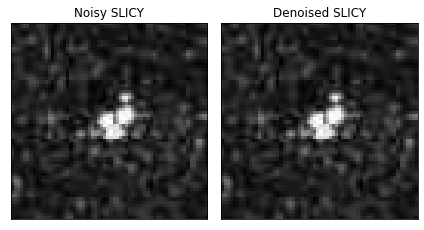

In [ ]:
fig = plt.figure()
rows = 1; cols = 2

ax1 = fig.add_subplot(rows, cols, 1)
ax1.set_title('Noisy SLICY')
ax1.imshow(tr_data200[0].view(64,64).numpy(), cmap='gray')
ax1.set_xticks([])
ax1.set_yticks([])

ax2 = fig.add_subplot(rows, cols, 2)
ax2.set_title('Denoised SLICY')
ax2.imshow(tr_wt_data[0].view(64,64).numpy(), cmap='gray')
ax2.set_xticks([])
ax2.set_yticks([])

fig.tight_layout()
plt.show()

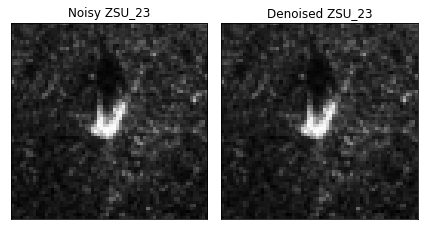

In [ ]:
fig = plt.figure()
rows = 1; cols = 2

ax1 = fig.add_subplot(rows, cols, 1)
ax1.set_title('Noisy ZSU_23')
ax1.imshow(tr_data200[200].view(64,64).numpy(), cmap='gray')
ax1.set_xticks([])
ax1.set_yticks([])

ax2 = fig.add_subplot(rows, cols, 2)
ax2.set_title('Denoised ZSU_23')
ax2.imshow(tr_wt_data[200].view(64,64).numpy(), cmap='gray')
ax2.set_xticks([])
ax2.set_yticks([])

fig.tight_layout()
plt.show()

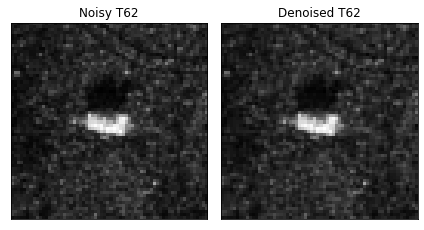

In [ ]:
fig = plt.figure()
rows = 1; cols = 2

ax1 = fig.add_subplot(rows, cols, 1)
ax1.set_title('Noisy T62')
ax1.imshow(tr_data200[400].view(64,64).numpy(), cmap='gray')
ax1.set_xticks([])
ax1.set_yticks([])

ax2 = fig.add_subplot(rows, cols, 2)
ax2.set_title('Denoised T62')
ax2.imshow(tr_wt_data[400].view(64,64).numpy(), cmap='gray')
ax2.set_xticks([])
ax2.set_yticks([])

fig.tight_layout()
plt.show()

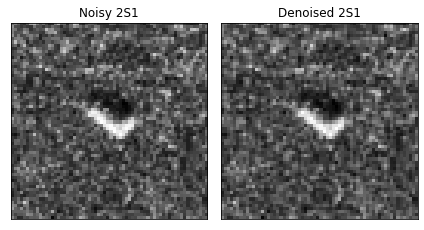

In [ ]:
fig = plt.figure()
rows = 1; cols = 2

ax1 = fig.add_subplot(rows, cols, 1)
ax1.set_title('Noisy 2S1')
ax1.imshow(tr_data200[600].view(64,64).numpy(), cmap='gray')
ax1.set_xticks([])
ax1.set_yticks([])

ax2 = fig.add_subplot(rows, cols, 2)
ax2.set_title('Denoised 2S1')
ax2.imshow(tr_wt_data[600].view(64,64).numpy(), cmap='gray')
ax2.set_xticks([])
ax2.set_yticks([])

fig.tight_layout()
plt.show()

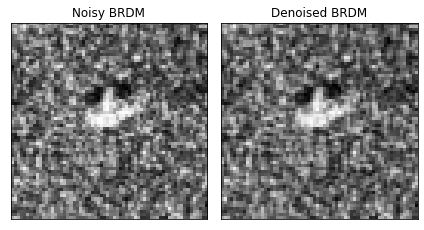

In [ ]:
fig = plt.figure()
rows = 1; cols = 2

ax1 = fig.add_subplot(rows, cols, 1)
ax1.set_title('Noisy BRDM')
ax1.imshow(tr_data200[800].view(64,64).numpy(), cmap='gray')
ax1.set_xticks([])
ax1.set_yticks([])

ax2 = fig.add_subplot(rows, cols, 2)
ax2.set_title('Denoised BRDM')
ax2.imshow(tr_wt_data[800].view(64,64).numpy(), cmap='gray')
ax2.set_xticks([])
ax2.set_yticks([])

fig.tight_layout()
plt.show()